# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 

config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_s

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, '

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000,

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 



delta_Ri =  -2920.2243805527296
H_agent r out =  46968.07512910027
**********
Q ADDED INTO POOL: 1294 to existing amount 30289.84116032444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2920.2243805527296 from reserve 48726.07512910028
**********
H_chosen_agentH_chosen_agent**********H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125435.95 110000.00 136730.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37686.48 110000.00 127400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5328.4196477691485
H_agent r out =  37686.48237750449
**********
Q ADDED INTO POOL: 2132 to existing amount 47154.64493118075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5328.4196477691485 from reserve 96586.48237

H_agent r out =   30031.043878319193POOL ADD LIQUIDITY Timestep ===  10 delta W  23093.561761126697
12220.186255004615
POOL ADD LIQUIDITY Timestep ===  10 delta W  17247.579247909067
H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42114.13 110000.00 128240.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143867.09 110000.00 132572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6081.808231969306
H_agent r out =  143867.08574619525
**********
Q ADDED INTO POOL: 1798 to existing amount 26286.748544722926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6081.808231969306 from reserve 60048.91425380475
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

7069.579046756189
H_agent r out = **********
Q ADDED INTO POOL: 1438 to existing amount 53060.49063098665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2708.822667965594 from reserve 83022.70677036101
**********
delta_Ri = H_chosen_agent H_chosen_agent 177956.40640727742
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162643.56 110000.00 125602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22425.76 110000.00 121286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 2246 to existing amount 38689.97639656363H_chosen_agent
1702.4873870707534 H_chosen_agentdelta_Ri =  2466.4494253678326

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29465.37 110000.00 120768.00 170000.00 150000.00 0.0

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189388.37 110000.00 111946.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount -164.73524950123564 from reserve 69272.17040356684
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6276.44 110000.00 110038.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

delta_Ri =  -4776.7058926168
H_agent r out =  6276.44398092545
**********
Q ADDED INTO POOL: 3832 to existing amount 59735.2217197769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4776.7058926168 from reserve 67381.4439809255
**********
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15460.89 110000.00 114212.00 1

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5532.01 110000.00 106780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -756.8888767580719
H_agent r out =  5532.014079613795
**********
Q ADDED INTO POOL: 620 to existing amount 68063.1630485777
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 756.8888767580719 from reserve 71423.01407961381
**********

delta_Ri =  4638.36648800667
H_agent r out =  174385.84040051716
**********
Q ADDED INTO POOL: 2688 to existing amount 56640.038591043376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4638.36648800667 from reserve 84717.15959948284
**********
H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197814.94 110000.00 104638.00 170000.00 150000

0 130000.00 180000.00 160000.00  
delta_Ri =  7434.377620452956
H_agent r out =  197839.02452816287
**********
Q ADDED INTO POOL: 3368 to existing amount 43914.83204344425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7434.377620452956 from reserve 81473.97547183713
**********

delta_Ri =  -598.375936986082
H_agent r out =  -3790.538323346801
**********
Q ADDED INTO POOL: 486 to existing amount 61937.43431734535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 598.375936986082 from reserve 64622.46167665324
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4388.91 110000.00 101182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16481.89 110000.00 112316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

203871.91484137846delta_Ri =  -1403.9713016763285
H_agent r out =  -9683.885131742256
**********
Q ADDED INTO POOL: 1094 to existing amount 62164.32653475913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1403.9713016763285 from reserve 67942.11486825775
**********

H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16946.52 110000.00 112616.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3863.7387523892007
H_agent r out =  16946.51585974661
**********
Q ADDED INTO POOL: 2502 to existing amount 61648.55688873369
H_chosen_agent
Q ADDED INTO POOL: 1138 to existing amount 69092.02305790468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1164.3163169223953 from reserve 61539.085158621616
**********
 H_chosen_agent**********H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 2

H_chosen_agentH_chosen_agent   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8492.65 110000.00 106860.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -17383.884000183047
**********
Q ADDED INTO POOL: 1798 to existing amount 70845.94423728058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1579.0013293136487 from reserve 55243.11599981699
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10533.18 110000.00 100466.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219899.67 110000.00 106020.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = delta_Ri = 
delta_Ri =  3093.852381990342
H_agent r out =  219899

H_chosen_agent **********
H_chosen_agent H_agent r out =  227605.59949192716
**********
Q ADDED INTO POOL: 2340 to existing amount 61599.84883700293
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199761.96 110000.00 101432.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = **********
H_chosen_agent 
 **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20457.85 110000.00 85546.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2286.442552854998
H_agent r out =  -20457.84943830854
**********
Q ADDED INTO POOL: 2634 to existing amount 70749.9004054247
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213996.32 110000.00 87484.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19033.43 110000.00 82174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18302.93 110000.00 93574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2447.3448705913243
H_agent r out =  -19033.43219290564
**********
Q ADDED INTO POOL: 3096 to existing amount 81149.49596202472
**********
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32815.91 110000.00 79502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25757.85 110000.00 79234.00 170000.00 150000.00 0.0

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27439.22 110000.00 77010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2654.969988636506
H_agent r out =  -27439.216638116242
**********
**********
Q ADDED INTO POOL: 1742 to existing amount 80059.00311794966
**********
**********
Q ADDED INTO POOL: 3850 to existing amount 77666.95425990377
-1667.5261680588128
H_agent r out =  -4052.9396588946133
**********
Q ADDED INTO POOL: 1574 to existing amount 73211.96804116432**********
Q ADDED INTO POOL: 3128 to existing amount 88679.36789067161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.1389906575725 from reserve 52377.47302012209
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2654.969988636506 from reserve 49730.78336188378
**********
H_chosen_agent 

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10242.20 110000.00 90158.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -734.7187539318596
H_agent r out =  -10242.200686922055
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213378.99 110000.00 88722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  2481.480641217832
H_agent r out =  213378.9863610646
**********
Q ADDED INTO POOL: 2722 to existing amount 74506.81795597161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2481.480641217832 from reserve 61124.013638935365
**********

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238429.83 110000.00 87772.00 170000.00 150000.00 0.00 120000.00

 -14511.834840669208
**********
Q ADDED INTO POOL: 3050 to existing amount 82275.06788255632
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2425.9219863375133 from reserve 60301.16515933084
**********
H_chosen_agent
********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2804.7219227911696 from reserve 62792.532997717535
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2210.961486547587 from reserve 55355.54819535824
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218665.19 110000.00 83074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2057.6966153835465
H_agent r out =  218665.1889250736
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241080.68 110000.00 84196.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248597.48 110000.00 71228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1670.2145214880081 from reserve 51754.09622181054
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24539.88 110000.00 71134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2202.885088874673
H_agent r out =  -24539.875631056868
**********
Q ADDED INTO POOL: 3814 to existing amount 94711.91688611264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2202.885088874673 from reserve 51510.124368943194
**********
H_chosen_agent 
**********671.1657788600618
H_agent r out =  248597.4750907061
**********
Q ADDED INTO POOL: 1904 to existing amount 82490.8684049585

0 130000.00 180000.00 160000.00   -984.0667728710725-1914.9971447831533delta_Ri =  -809.0685394919497
H_agent r out =  -38692.36133629576
**********
Q ADDED INTO POOL: 1002 to existing amount 72775.31312481986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 809.0685394919497 from reserve 51267.638663704274
**********

H_agent r out =  -47696.683064589175
**********
Q ADDED INTO POOL: 2986 to existing amount 67111.51187779015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1914.9971447831533 from reserve 38810.431999981796
**********

H_chosen_agentH_agent r out =  -30117.77781534301
**********
Q ADDED INTO POOL: 1720 to existing amount 96377.08642457706
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 984.0667728710725 from reserve 50573.22218465705
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40739.19 110000.00 52164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44926.86 110000.00 44904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -849.2753740833022
H_agent r out =  -44926.86438127262
**********
Q ADDED INTO POOL: 1642 to existing amount 83810.14150194637
**********
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239865.68 110000.00 57882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1672.567344151288
H_agent r out =  239865.6765203582
**********
Q ADDED INTO POOL: 2584 to existing amount 86786.3022852948
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43772.85 110000.00 64690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

delta_Ri = H_chosen_agent  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138398.69 110000.00 134312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5005.0785369435
H_agent r out =  138398.68793423465
**********
Q ADDED INTO POOL: 1320 to existing amount 25518.033113573823
**********
**********
3199.4125604483706   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27315.31 110000.00 123664.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 5005.0785369435 from reserve 62886.312065765356
H_agent r out =  155254.74606068237
**********
Q ADDED INTO POOL: 1548 to existing amount 31013.73985073076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3199.4125604483706 from reserve 46125.25393931764
**********

delta_Ri = **********

*

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
H_chosen_agent 
H_chosen_agentdelta_Ri =  -2541.587898283451 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39916.74 110000.00 44616.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
-16985.064036857126
H_agent r out =  18447.22215170911
**********
Q ADDED INTO POOL: 1354 to existing amount 52036.0274891792
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2541.587898283451 from reserve 80693.22215170911
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132019.24 110000.00 135826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

**********

1484.3106732471238Q ADDED INTO POOL: 3382 to existing amount 25378.0H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 261686.82 110000.00 44112.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  240248.4440138562
**********
Q ADDED INTO POOL: 2654 to existing amount 89307.38710394586

delta_Ri =   Q ADDED INTO POOL: 1330 to existing amount 41208.02347564832
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4559.749546677262 from reserve 111006.34687303627
**********
**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167114.51 110000.00 122534.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1484.3106732471238 from reserve 45756.55598614385
**********
H_chosen_agent1382.4719938114

 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245311.22 110000.00 35348.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183329.54 110000.00 113294.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1410.4897810839295
H_agent r out =  183329.5384829362
**********
Q ADDED INTO POOL: 962 to existing amount 64998.35383085199
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1410.4897810839295 from reserve 81941.46151706384
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171206.73 110000.00 124366.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i      

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181246.96 110000.00 114456.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5522.381206831016
H_agent r out =  181246.96460897976
**********
Q ADDED INTO POOL: 3386 to existing amount 60410.389697339895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5522.381206831016 from reserve 87291.0353910203
**********
delta_Ri =  -16985.064036857126
 H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11118.36 110000.00 99444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -342.81830218628346
H_agent r out =  -11118.360134927894
**********
Q ADDED INTO POOL: 308 to existing amount 64875.2150359697
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 319

H_chosen_agent **********
Q ADDED INTO POOL: 2544 to existing amount 69801.8855650679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3082.840471707921 from reserve 75333.29275742224
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26361.05 110000.00 119496.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13596.68 110000.00 97154.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1354.6722713030028
H_agent r out =  -13596.683701561089
**********
Q ADDED INTO POOL: 1338 to existing amount 67165.2150359697
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1354.6722713030028 from reserve 58844.3162984389
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1654.60 110000.00 108368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5413.24378831798
H_agent r out =  1654.6032678112097
**********
Q ADDED INTO POOL: 4320 to existing amount 61778.30945459271
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16895.11 110000.00 118756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
POOL RESERVE ONE REMOVING ASSET i in amount 5413.24378831798 from reserve 71007.60326781118
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24333.15 110000.00 85830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1400.3763798652292
H_agent r out =  -24333.153137781264
**********


0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13351.23 110000.00 111904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1829.7198131971625
H_agent r out =  -8715.918368656758
**********
Q ADDED INTO POOL: 1814 to existing amount 69386.03656295814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1829.7198131971625 from reserve 61992.08163134321
**********
delta_Ri = 
 2032.6221366777993
H_agent r out = delta_Ri =  -4365.694624896242
H_agent r out =  13351.231828685137
**********
Q ADDED INTO POOL: 2558 to existing amount 56216.59043058575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4365.694624896242 from reserve 83761.23182868518
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12085.29 110000.00 116146.00 170000.00 150000.00 0.00 120000.00   

     r_j_

POOL RESERVE ONE REMOVING ASSET i in amount 2962.1445965277403 from reserve 77358.54766508548H_chosen_agent
**********


H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 206463.06 110000.00 96744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1679.114352762985
H_agent r out =  216269.027039422
**********
 
Q ADDED INTO POOL: 1454 to existing amount 63970.14335322792 delta_Ri =  2087.952284500547
H_agent r out =  217727.06841309692
**********
Q ADDED INTO POOL: 2392 to existing amount 80679.06174960737
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2087.952284500547 from reserve 63654.93158690309
**********
delta_Ri = 
 3735.0483189678744   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13730.68 110000.00 94568.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent

H_chosen_agent Q ADDED INTO POOL: 2270 to existing amount 54093.42629669938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3625.4706216888294 from reserve 72982.00048457316
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21396.04 110000.00 114828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1494.1171750612953
H_agent r out =  21396.03890032414
**********
Q ADDED INTO POOL: 898 to existing amount 62614.45010071824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1494.1171750612953 from reserve 89231.03890032417
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230488.93 110000.00 66512.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2139.6510374702216
H_agent r out =  230488.92984662042
   m   r_i_out    r_i_in        h  

Q ADDED INTO POOL: 1918 to existing amount 70709.64424475376H_chosen_agent 154946.0
POOL REMOVE LIQUIDITY Timestep ===  90 
H_agent r out =  239979.23197866805
**********
Q ADDED INTO POOL: 1628 to existing amount 91081.33787713572
**********
H_agent r out =  238856.75248867917
**********
Q ADDED INTO POOL: 2584 to existing amount 74157.76276593033
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2082.0085056352323 from reserve 53637.24751132085
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1092.179014674715 from reserve 55427.76802133199
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240938.76 110000.00 68312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1606.3770406029682
H_agent r out =  240938.7609943144
**********
Q ADDED INTO POOL: 2142 to existing amount 76741.76276593033
**********   m   r_i_out  

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32041.64 110000.00 65910.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.267449376048
H_agent r out =  -32041.636535456488
**********
Q ADDED INTO POOL: 2914 to existing amount 95326.69466522409
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245254.19 110000.00 62228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1788.9133194371786
H_agent r out =  245254.19320794055
**********
Q ADDED INTO POOL: 2886 to existing amount 83153.97001811795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1788.9133194371786 from reserve 47027.80679205948
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247043.11 110000.00 59342.00 170000.00 150000.00 0.00 120000.00   

 Q ADDED INTO POOL: 2300 to existing amount 73384.32398858551 
H_chosen_agent251389.83647218213
**********
Q ADDED INTO POOL: 2486 to existing amount 82896.19259054954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1558.806452252264 from reserve 47174.1635278179
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2137.7294845249144 from reserve 61368.84499784589
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238659.03 110000.00 72446.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11536.09 110000.00 88790.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1432.868400812824
H_agent r out =  -11536.09326877746
**********
Q ADDED INTO POOL: 1598 to existing amount 81536.8822115606
**********
*****

delta_Ri =  -10035.084788551107
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1078 to existing amount 19900.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10035.084788551107 from reserve 101000.00000000001
**********
154835.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34803.38 110000.00 82282.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1653.3244450915163
H_agent r out =  -34803.38425108429
**********
Q ADDED INTO POOL: 1610 to existing amount 65095.65209178625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1653.3244450915163 from reserve 57756.615748915734
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154648.81 110000.00 129828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4033.8255177017495
H_age

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58704.08 110000.00 133684.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent2062.2528868059653
H_agent r out =  257360.0404696583
**********
Q ADDED INTO POOL: 3108 to existing amount 67747.16554771105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2062.2528868059653 from reserve 40229.53061841617
**********
 delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40735.18 110000.00 49880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1710.3052867589367
H_agent r out =  -40735.179566111816
**********
Q ADDED INTO POOL: 2848 to existing amount 86891.36830107101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.3052867589367 from reserve 48167.82043388815
**********
 

-1523.0499754490622   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50041.48 110000.00 63502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -335.989684551087
H_agent r out =  -50041.47655657102
**********
Q ADDED INTO POOL: 544 to existing amount 81466.55392845377
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 335.989684551087 from reserve 44381.523443429
**********
H_agent r out =  H_agent r out =  -46312.38713285775
**********
Q ADDED INTO POOL: 2762 to existing amount 90397.22086462077
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1523.0499754490622 from reserve 46112.61286714221
**********
172058.19420050076H_chosen_agent
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29302.19 110000.00 121094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

 H_chosen_agent-5087.613740618987  H_chosen_agent 
-1205.6694291161075H_agent r out =  29546.16950452282
**********
H_agent r out =  -28925.188168237317
**********
Q ADDED INTO POOL: 1870 to existing amount 94442.32696623792
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1205.6694291161075 from reserve 55855.81183176273
**********

H_chosen_agentQ ADDED INTO POOL: 2442 to existing amount 51682.65091982428
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5087.613740618987 from reserve 92474.16950452286
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180187.89 110000.00 114294.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3346.279869777237
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51493.59 110000.00 30040.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187241.41 110000.00 108462.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3633.864864188575
H_agent r out =  187241.41308881572
**********
Q ADDED INTO POOL: 3128 to existing amount 73080.17468878899
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3633.864864188575 from reserve 76670.58691118428
**********H_chosen_agent

H_chosen_agentPOOL REMOVE LIQUIDITY Timestep === delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33208.82 110000.00 59174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -516.4679831439238
H_agent r out =  -33208.820363950515
**********
Q ADDED INTO POOL: 896 to existing amount 99951.10768642179
**********
**********
POOL RESERVE ONE REMOVI

delta_Ri = 
delta_Ri =  -437.80746660041007  delta_Ri = 
H_agent r out =  -36781.67187515364
**********
Q ADDED INTO POOL: 874 to existing amount 106555.10768642179
**********
**********3590.7561528804104
H_agent r out =  194864.6425761106
**********
Q ADDED INTO POOL: 3734 to existing amount 79179.4806768455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3590.7561528804104 from reserve 69893.35742388938
**********
Q ADDED INTO POOL: 3396 to existing amount 69522.12115226655-2930.961116781958

POOL RESERVE ONE REMOVING ASSET i in amount 437.80746660041007 from reserve 48883.32812484641
**********

********** H_agent r out = -4514.5393220816795
H_agent r out =  9509.98235388291
**********
Q ADDED INTO POOL: 3174 to existing amount 60926.24755988477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4514.5393220816795 from reserve 77532.98235388292
**********

H_chosen_agent **********6893.480759289503
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in 

********** 
Q ADDED INTO POOL: 228 to existing amount 49552.772213541764
**********
**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   107.13 110000.00 104488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1029.39 110000.00 102352.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38363.66 110000.00 49386.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -17673.623745

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 205445.77 110000.00 89740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   764.32 110000.00 111294.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 9848.02369948899
addliq - Sq delta S 9848.023699488987
POOL ADD LIQUIDITY Timestep ===  10 delta W  12590.38034114813


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136741.67 110000.00 134680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1189.62 110000.00 103392.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

POOL RESERVE ONE REMOVING ASSET i in amount 3383.990149851867 from reserve 68705.32600092894   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161865.22 110000.00 125244.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4259.69 110000.00 100730.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  -1122.1526637581217
H_agent r out =  -4259.691865656673
**********
Q ADDED INTO POOL: 1028 to existing amount 68911.42977418576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1122.1526637581217 from reserve 65588.30813434337
**********
H_chosen_agent 
delta_Ri =  3620.245227509344
H_agent r out =  161865.21622230293
**********
Q ADDED INTO POOL: 2478 to existing amount 34656.74380419978
**********
**********
POOL RESERVE ONE REMOVING 

0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39454.37 110000.00 128860.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11734.82 110000.00 102800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1898 to existing amount 67308.08849231736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1665.2260303468383 from reserve 52177.742967213824
**********

delta_Ri =  
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 212532.28 110000.00 79670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =  1419.8561369384531
H_agent r out =  212532.2761244547
*****


    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216498.76 110000.00 73338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1061.1924841767488
H_agent r out =  216498.7565616792
**********
Q ADDED INTO POOL: 1672 to existing amount 96451.97576688981
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1061.1924841767488 from reserve 55876.24343832077H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19071.89 110000.00 83456.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2349.852279202518
H_agent r out =  -19071.89061019288
**********
Q ADDED INTO POOL: 2640 to existing amount 75198.42285246318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2349.852279202518 from reserve 60739.10938980714
**********
**********
Q ADDED INTO POOL: 448 to ex

 
**********-28646.268964220926
**********
Q ADDED INTO POOL: 4090 to existing amount 69754.85207536223
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3182.932679523595 from reserve 50146.731035779114
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28645.71 110000.00 71410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1392.6863918373458
H_agent r out =  -28645.70734411855
**********
Q ADDED INTO POOL: 2008 to existing amount 84445.1666134324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1392.6863918373458 from reserve 53251.29265588148
**********
-2259.8199251852293H_chosen_agent  -791.2348631036778
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187831.28 110000.00 102554.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r

Q ADDED INTO POOL: 3486 to existing amount 73373.53710228423H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4765.62 110000.00 114944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23422.21 110000.00 82514.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32754.53 110000.00 65402.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3842.413420952952
H_agent r out =  4765.615280307198
**********
Q ADDED INTO POOL: 2356 to existing amount 52875.30068729919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3842.413420952952 from reserve 72634.61528030722
********

H_agent r out = H_chosen_agent
Q ADDED INTO POOL: 436 to existing amount 74167.44619071083
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 320.59231749231174 from reserve 47412.26403949588
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230752.41 110000.00 46424.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  948.8593824872704
H_agent r out =  230752.41189542707
**********
Q ADDED INTO POOL: 2200 to existing amount 114757.30571684257
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 948.8593824872704 from reserve 46089.58810457293
**********
delta_Ri =  -2771.3711133160373
H_agent r out =  -25118.63105336123
**********
Q ADDED INTO POOL: 2364 to existing amount 66155.2137639458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2771.3711133160373 from reserve 68986.36894663882
**********

 H_chosen_agent -37845.75515096529
*

H_chosen_agentH_agent r out =  -2933.561165602933
H_agent r out =  -12075.58528807712
**********
Q ADDED INTO POOL: 2440 to existing amount 59940.8693015175
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2933.561165602933 from reserve 62126.41471192289
**********
********** H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 202759.35 110000.00 85820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2383.12 110000.00 96374.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2290.5370185306706
H_agent r out =  -2383.117588649668
**********
Q ADDED INTO POOL: 2670 to existing amount 78982.11686094753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2290.5370185306706 from reserve 60826.88241135036
**********



0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 207045.63 110000.00 80932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1182.396703040527
H_agent r out =  207045.63018703487
**********
Q ADDED INTO POOL: 1372 to existing amount 89814.37791570183
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1182.396703040527 from reserve 69901.36981296516
**********
delta_Ri =  -234.7261117351625
H_agent r out =  -20972.850825988
**********
Q ADDED INTO POOL: 224 to existing amount 64263.80703978634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 234.7261117351625 from reserve 57029.149174012
**********
155261.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12644.570924806389 delta S  5261
POOL REMOVE LIQUIDITY share fraction of pool = 0.1605276254874987
POOL REMOVE LIQUIDITY share fraction of reserve = 0.183870

H_chosen_agent H_agent r out = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13187.308159240249 delta S  4897
POOL REMOVE LIQUIDITY share fraction of pool = 0.14769571162781686
POOL REMOVE LIQUIDITY share fraction of reserve = 0.16632369566793448
POOL REMOVE LIQUIDITY weight fraction of pool = 0.16632369566793448

 -26263.76235224644
**********
Q ADDED INTO POOL: 504 to existing amount 67227.56910962122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 472.65253956159546 from reserve 54005.237647753565
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46553.71 110000.00 64978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154668.0
**********154897.0H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211054.26 110000.00 76190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

delta_Ri = **********
Q ADDED INTO POOL: 1934 to existing amount 61018.667846665805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1411.515129172044 from reserve 38828.53914189887
**********
H_chosen_agent -3333.928881666905
H_agent r out =  -52265.13352866767
**********
Q ADDED INTO POOL: 4364 to existing amount 58883.59207016608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3333.928881666905 from reserve 39716.081676126276
**********
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58985.32 110000.00 133296.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -12482.570712378301
H_agent r out =  58985.3208919

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70695.22 110000.00 136330.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 addliq - Sq delta Sqdelta_Ri =   
19761.752201781455
addliq - Sq delta S 19761.752201781455
POOL ADD LIQUIDITY Timestep ===  10 delta W  36427.368178792276
-10048.605167980302
1572.434136225313H_chosen_agent
H_agent r out =  H_agent r out = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22282.77 110000.00 66262.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent
delta_Ri =  -2785.399366836305
H_agent r out =  225740.2979591171670695.21526958601-438.8927564791336
**********
Q ADDED INTO POOL: 1876 to existing amount 22929.605463084852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10048.605167980302 from reserve 75788.21526958603
***

delta_Ri = H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23627.74 110000.00 114708.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1666.0517255463901
H_agent r out =  23627.736814134514
**********
Q ADDED INTO POOL: 1376 to existing amount 76632.35064427137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.0517255463901 from reserve 82598.73681413454
**********
 
-3099.0271852089054POOL REMOVE LIQUIDITY Timestep === **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149531.70 110000.00 130984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27861.35 110000.00 56212.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

0 130000.00 180000.00 160000.00  delta_Ri =  -8284.112641882957
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235830.33 110000.00 38618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30366.40 110000.00 51484.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1223.100986862436
H_agent r out =  -30366.399493451634
**********
Q ADDED INTO POOL: 2458 to existing amount 100638.19420813318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1223.100986862436 from reserve 45989.60050654839
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29139.46 110000.00 123926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  d

H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159974.84 110000.00 126676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8016.18 110000.00 100032.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent
delta_Ri =  2217.9475160783104
H_agent r out =  159974.8379640529
**********
Q ADDED INTO POOL: 1106 to existing amount 55427.76972988155
********** delta_Ri =  -2169.755117005965
H_agent r out =  8016.183251633517
**********
Q ADDED INTO POOL: 2554 to existing amount 89057.45916300322
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2169.755117005965 from reserve 69695.18325163356
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10099

H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39163.96 110000.00 32004.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -274.89846095428004
H_agent r out =  -39163.962427796905
**********
Q ADDED INTO POOL: 602 to existing amount 105208.81489948471H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  3668.85 110000.00 94916.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2042.8747842226303
H_agent r out =  3668.846733202941
**********
Q ADDED INTO POOL: 2500 to existing amount 90683.03080403597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2042.8747842226303 from reserve 68316.84673320298
**********
H_chosen_agent**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  

 delta_Ri =  -2738.69362119879
H_agent r out =  -3022.1538431630215
**********
H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41786.53 110000.00 26236.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49848.53 110000.00 60732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1053.2784690064102
H_agent r out =  -49848.53286287743
**********
Q ADDED INTO POOL: 1370 to existing amount 60161.975735813554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1053.2784690064102 from reserve 39312.68787637107
**********
Q ADDED INTO POOL: 3756 to existing amount 94804.40131718006   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2246.08 110000.00 99158

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10772.64 110000.00 91404.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1153.9006610235654
H_agent r out =  -10772.641523169243
**********
Q ADDED INTO POOL: 1152 to existing amount 73432.79097294166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1153.9006610235654 from reserve 64364.35847683078
**********
H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9338.31 110000.00 77440.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1558.3203518131738
H_agent r out =  -9338.306399887444
**********
Q ADDED INTO POOL: 2574 to existing amount 103974.40131718006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1558.3203518131738 from reserve 58729.69360011259
**********
delta_Ri =   -52524.7913

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17253.84 110000.00 113932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189189.23 110000.00 107138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2528.567447143922
H_agent r out =  189189.23343141234
**********
Q ADDED INTO POOL: 2218 to existing amount 69851.64117906091
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15342.23 110000.00 66998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -759.7988050168716
H_agent r out =  -15342.227326354996
**********
Q ADDED INTO POOL: 1412 to existing amount 110477.8990573443
**********
**********
POOL RESERVE ONE RE

0 130000.00 180000.00 160000.00   H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17544.47 110000.00 62994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  delta_Ri =  -1348.0179339503043
H_agent r out =  -17544.467174257567
**********
Q ADDED INTO POOL: 2294 to existing amount 105623.83835331416
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1348.0179339503043 from reserve 57781.53282574247
**********
 -4176.619940002561
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24101.88 110000.00 75978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145848.57 110000.00 131856.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

delta_Ri =  -1712.336830087921
H_agent r out =  -25224.357590093306
**********
Q ADDED INTO POOL: 1550 to existing amount 67397.68939995691
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1712.336830087921 from reserve 64631.64240990674
**********

**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1705.0515125101906 from reserve 64445.05245944659
**********
 3011.5488336411936
H_agent r out =  198603.41427356863
**********
Q ADDED INTO POOL: 2758 to existing amount 70911.71539428442
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3011.5488336411936 from reserve 69313.58572643134
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9931.87 110000.00 108318.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2231.490614576935
H_agent r out =   H_chosen_agent  9931.865438265102
*

0 130000.00 180000.00 160000.00  3914.6644825040635 H_chosen_agentH_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13857.02 110000.00 99276.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27586.51 110000.00 46816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  180451.6868746528
**********  
Q ADDED INTO POOL: 2290 to existing amount 52709.44749675837
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3914.6644825040635 from reserve 76559.31312534727
**********

H_agent r out = delta_Ri = 
delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 207044.89 110000.00 90326.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

**********H_chosen_agentdelta_Ri =   -792.7136612476922
H_agent r out =  -32497.80708340791
**********
Q ADDED INTO POOL: 1414 to existing amount 95690.75152160044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 792.7136612476922 from reserve 48968.95467381651
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41770.83 110000.00 73190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2151.8402184965353
H_agent r out =  -41770.83412831708
**********
Q ADDED INTO POOL: 2426 to existing amount 73681.91454249738
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2151.8402184965353 from reserve 58029.16587168298
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33290.52 110000.00 37094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

 H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189510.21 110000.00 109268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48118.24 110000.00 66060.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  3842.9122709731037
H_agent r out =  189510.21035420705
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213765.16 110000.00 83746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 3280 to existing amount 66819.15971395897
**********

delta_Ri = H_chosen_agent  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200378.25 110000.00 105890.00 1700

0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =  -1762.5224095046083
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219777.41 110000.00 77710.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2549.2810625266334
H_agent r out =  219777.41334294123
**********
Q ADDED INTO POOL: 2848 to existing amount 77325.610723072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2549.2810625266334 from reserve 62650.58665705875
**********
154986.0
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12502.39088443765H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 199756.15 110000.00 99576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222326.69 110000.0

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44709.25 110000.00 129086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33705.68 110000.00 74852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225273.00 110000.00 71358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15299.774492207009
H_agent r out =  82264.0991594891
**********
Q ADDED I

0 130000.00 180000.00 160000.00  delta_Ri =  2747.1711891215787
H_agent r out =  204668.8934320477
**********
Q ADDED INTO POOL: 3372 to existing amount 78349.76192566176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2747.1711891215787 from reserve 58259.10656795224
**********
 delta_Ri =  -4906.0086628694335
H_agent r out =  20353.315636963445
**********
Q ADDED INTO POOL: 2696 to existing amount 53445.901601187965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4906.0086628694335 from reserve 84516.31563696344
**********
231097.33637154615
**********
Q ADDED INTO POOL: 950 to existing amount 89922.69679572123
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 620.069746070419 from reserve 52751.66362845381
**********
-1514.3264910727557
H_agent r out =  -22147.841397100132
**********
Q ADDED INTO POOL: 1962 to existing amount 85132.68708523571
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1514.3264910727557 from

H_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236667.08 110000.00 54944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 2368 to existing amount 79870.11993068986
delta_Ri =  1733.6470128888022
H_agent r out =  236667.07558947685
**********
Q ADDED INTO POOL: 2882 to existing amount 92348.42649378584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1733.6470128888022 from reserve 51176.92441052309
**********

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38472.63 110000.00 68412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1922.599849366253
H_agent r out =  -38472.63091258074
**********
Q ADDED INTO POOL: 2648 to existing amount 72982.39713547548
**********
**********
POOL RESERVE ONE REMOVING ASSET

H_chosen_agent addliq - Sq delta Sq 13978.680145526536
addliq - Sq delta S**********
POOL RESERVE ONE REMOVING ASSET i in amount 701.8986361321174 from reserve 46697.06145033719
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226867.84 110000.00 74204.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1910.1993926706473
H_agent r out =  226867.8371857951
 POOL RESERVE ONE REMOVING ASSET i in amount 1363.0859284897497 from reserve 51291.97443414621
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2032.94 110000.00 106590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1435.62067559361
H_agent r out =  2032.9382157138025
**********
Q ADDED INTO POOL: 1140 to existing amount 63398.07702811577
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230995.80 110000.00 67504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220166.86 110000.00 72268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2157.0437961221733
H_agent r out =  220166.8643484007
**********
Q ADDED INTO POOL: 3798 to existing amount 91923.3980386521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2157.0437961221733 from reserve 48569.13565159925
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2378.90 110000.00 102916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1194.5255045882138
H_agent

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 246056.99 110000.00 38010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  724.14104362582
H_agent r out =  246056.98518436108
**********
Q ADDED INTO POOL: 1438 to existing amount 86744.74899208666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 724.14104362582 from reserve 39329.39224388094
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7150.73 110000.00 98780.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3782.3850982190315
H_agent r out =  -7150.729697265508
**********
Q ADDED INTO POOL: 3106 to existing amount 63247.953398605576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3782.3850982190315 from reserve 69131.27030273448
**********
H_chosen_agent    m   r_i_out   

Q ADDED INTO POOL: 708 to existing amount 91816.74899208666 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38690.43 110000.00 45062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -704.0816662333768
H_agent r out =  -38690.43329377762
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9667.45 110000.00 112172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 2530.6272776523338
H_agent r out =  183415.2562622265
**********
Q ADDED INTO POOL: 1468 to existing amount 57742.38948246322
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2530.6272776523338 from reserve 84614.74373777355
**********
delta_Ri = **********
Q ADDED INTO POOL: 1394 to existing amount 88194.21657514943
**********
**********
POOL RESERVE ONE REMOVING ASSET i

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83014.94 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42215.98 110000.00 37558.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  912.6125406010055
H_agent r out =  237873.75827639646
**********
Q ADDED INTO POOL: 1590 to existing amount 84577.43750032425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 912.6125406010055 from reserve 43664.24172360373
**********

delta_Ri =  -12901.234630447345H_chosen_agent H_chosen_agent
delta_Ri =  -760.8289171519779
H_agent r out =  -42215.98402930246
**********
Q ADDED INTO POOL: 1782 to existing amount 94923.33356095488
**********
**********
POOL RESERVE ONE REMOVING

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 2502 to existing amount 67129.53346693129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2663.3218165908456 from reserve 62715.8352332339
**********
H_chosen_agent H_chosen_agent **********
H_chosen_agent 

Q ADDED INTO POOL: 1206 to existing amount 21381.851699548304   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31047.30 110000.00 74358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55744.91 110000.00 38312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8585.917374176715 from reserve 86525.85441096663
**********
delta_Ri =   1377.7847182861062
H_agent r out =  236188.02717832383
**********
Q ADDED INTO POOL

POOL RESERVE ONE REMOVING ASSET i in amount 89.44621088177252 from reserve 42696.763693594985POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 207997.50 110000.00 96300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50725.39 110000.00 132680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -4324.3242844399565
H_agent r out = delta_Ri =  2587.062185525264
H_agent r out =  207997.4988809934
**********
Q ADDED INTO POOL: 2642 to existing amount 72967.79863969692
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2587.062185525264 from reserve 64070.50111900664
**********
  H_chosen_agent  
90 delta W  13955.754675026295 delta S  5171
POOL REMOVE LIQUIDITY share fra

delta_Ri = 
 Q ADDED INTO POOL: 2606 to existing amount 44015.812927261344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7070.870924926249 from reserve 97221.63992606242
**********
delta_Ri = H_chosen_agent 640.7736432516489H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35397.94 110000.00 68316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3490.695978071769
H_agent r out =  -35397.93556779072
**********
Q ADDED INTO POOL: 4050 to existing amount 73204.0331171064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3490.695978071769 from reserve 58489.06443220926
**********
H_chosen_agent 
H_agent r out =  238421.18059192994
**********2055.3837090383295    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138836.03 110000.00 134224.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

delta_Ri =  
delta_Ri =  -2329.7960427357416
H_agent r out =  -39296.63930857802
**********
Q ADDED INTO POOL: 3276 to existing amount 79501.37324036003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2329.7960427357416 from reserve 51105.360691422
**********
H_chosen_agent9458.093604140755H_chosen_agent
H_agent r out =  169705.9928067264
**********
Q ADDED INTO POOL: 4486 to existing amount 48426.52816851749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9458.093604140755 from reserve 89531.00719327362
**********
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2209.0026219661117 from reserve 51613.60455904771
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -27146.991019892313
H_agent r out =  100000.0
**********
Q ADDED INTO PO

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -578.1968285743185
H_agent r out =  -45459.64971902453
**********
Q ADDED INTO POOL: 802 to existing amount 79809.30690295008
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 578.1968285743185 from reserve 50744.3502809755
**********
 -3953.3941290764346
H_agent r out =  22886.432366766872
**********
Q ADDED INTO POOL: 1378 to existing amount 43413.25897616934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3953.3941290764346 from reserve 98605.43236676691
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15863.48 110000.00 111380.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39930.66 110000.00 127016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

H_chosen_agentH_agent r out =  H_agent r out =  36618.28510619619
**********
Q ADDED INTO POOL: 1026 to existing amount 64274.484282873
**********
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228525.39 110000.00 75944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2164.5141352553555
H_agent r out =  228525.39282940823
**********
Q ADDED INTO POOL: 2472 to existing amount 76694.57174481632
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2164.5141352553555 from reserve 60423.60717059181
**********
12330.34624469045
**********
Q ADDED INTO POOL: 1990 to existing amount 71034.4336086493
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2274.5465160394842 from reserve 72367.34624469049
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1679.1213987661074 from reserve 90019.28510619621-1095.5375518973194 
**********

H_age

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198885.37 110000.00 107344.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2169.173840869539
H_agent r out =  198885.3689696537
**********
Q ADDED INTO POOL: 1604 to existing amount 59639.815988767106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2169.173840869539 from reserve 69119.63103034627
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90337.94 110000.00 138992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -8186.895099722764
H_agent r out =  90337.9439833796
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32622.38 110000.00 122698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
 delta_Ri =  -3161.7476987786936
H_agent r out =  23882.306612584027
**********
Q ADDED INTO POOL: 1852 to existing amount 54847.64444395724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3161.7476987786936 from reserve 80089.30661258403
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236371.58 110000.00 66964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2393.4535589796733
H_agent r out =  236371.58016431722
**********
Q ADDED INTO POOL: 3092 to existing amount 80702.3906820554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2393.4535589796733 from reserve 56976.41983568282
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208088.26 110000.00 99746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214254.43 110000.00 93336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -673.6992434812387
H_agent r out =  -11318.302262172963
**********

delta_Ri =  1528.639400715007
H_agent r out =  214254.43106274694
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -6708.10 110000.00 88704.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2830.4334940562044
H_agent r out =  -6708.10098960239
**********
Q ADDED INTO POOL: 2962 to existing amount 76373.62266492646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2830.4334940562044 from reserve 66689.89901039767
**********
H_chosen_agentQ ADDED INTO POOL: 390 to existing amount 53387.31216652552Q ADDED INTO POOL: 1654 to existing a

**********H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249779.55 110000.00 47596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7925.32 110000.00 110906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1547.993096247811
H_agent r out =  249779.5534458245
**********
Q ADDED INTO POOL: 2554 to existing amount 77037.90315401605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1547.993096247811 from reserve 42080.72980722234
**********

delta_Ri =  -1341.5305685103194
H_agent r out =  7925.32005613985
**********
Q ADDED INTO POOL: 878 to existing amount 60873.981458817725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1341.5305685103194 from reserve 78684.32005613984
**********
H_cho

0 130000.00 180000.00 160000.00  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83014.94 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15706.07846880479
H_agent r out =  83014.93596314287
**********
Q ADDED INTO POOL: 2698 to existing amount 21898.01688370557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 15706.07846880479 from reserve 83725.9359631429
**********
delta_Ri =  -1831.237325365648
H_agent r out =  3889.3037328385094
**********
Q ADDED INTO POOL: 1484 to existing amount 72242.63800115754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1831.237325365648 from reserve 78118.30373283854
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22223.22 110000.00 69998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3181.80 110000.00 102916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 982 to existing amount 31706.01688370557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1975.2470902622877 from reserve 45667.15606205365
**********

 
-23119.789385671378delta_Ri = 
**********
Q ADDED INTO POOL: 2702 to existing amount 89325.1874250351
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1832.334376860589 from reserve 55932.21061432868
**********
delta_Ri =  -2419.4951513311808
H_agent r out =  -8678.159098859856
**********
Q ADDED INTO POOL: 2450 to existing amount 79224.42205948476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2419.4951513311808 from reserve 70103.84090114015
**********
 delta_Ri =  -4192.356756453876
H_agent r out =  -3181.800

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13951.78 110000.00 84524.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1693.26144264556
H_agent r out =  -13951.780236083432
**********
Q ADDED INTO POOL: 1888 to existing amount 82847.74063342047
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1693.26144264556 from reserve 66554.21976391657
**********
addliq - Sq delta Sq 17720.8957567716
addliq - Sq delta S 17720.8957567716
POOL ADD LIQUIDITY Timestep ===  10 delta W  30734.900806130754
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231465.81 110000.00 71476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -2995.614720847717
H_agent r out =  -26983.583483247774
**********
Q ADDED INTO POOL: 2222 to existing amount 58406.19880225058
**********
**********
POOL RESE

-22101.50343593162H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236162.56 110000.00 64740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
**********
Q ADDED INTO POOL: 458 to existing amount 92074.46268762303
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 328.00068312968415 from reserve 59015.49656406838
**********

 delta_Ri =  H_chosen_agent1231.0264959071735-2084.444332114792
H_agent r out =  236162.56473844836
**********
Q ADDED INTO POOL: 1826 to existing amount 80409.0191878325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1231.0264959071735 from reserve 48622.43526155163
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36395.00 110000.00 47754.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40273.90 110000.00 88824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -19605.74990053297
**********
Q ADDED INTO POOL: 2496 to existing amount 85739.66281704766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1511.4314258652882 from reserve 47622.25009946704
**********

delta_Ri =  -1579.138928693989
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22791.37 110000.00 87182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -40273.90453704115
**********
Q ADDED INTO POOL: 1462 to existing amount 64350.73253472822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1579.138928693989 from reserve 59830.09546295887
**********

H_chosen_agentdelta_Ri =  426.120450888764
H_agent r out = 

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239660.26 110000.00 59810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9897.86 110000.00 101220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30510.15 110000.00 79572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  
delta_Ri =  -2932.204860607552
H_agent r out = -810.9083737549681
H_agent r out =  -30510.15029330122
**********
Q ADDED INTO POOL: 910 to existing amount 76431.66035207211
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 810.9083737549681 from reserve 59779.849706698755
**

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45622.60 110000.00 83800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2078.5941799417838
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242775.68 110000.00 55170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -24692.015946347947
**********
Q ADDED INTO POOL: 880 to existing amount 84210.87745957752
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 569.2935901734289 from reserve 48669.984053652064
**********
 230313.10847503395
**********
Q ADDED INTO POOL: 4094 to existing amount 73458.85894337925
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2918.1404493631803 from reserve 47955.891524966086
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0

delta_Ri =   1159.7011597881014-16598.021872763125
H_agent r out =  245600.41231437356
**********
Q ADDED INTO POOL: 1982 to existing amount 71599.28563481329
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1159.7011597881014 from reserve 37122.27895660648
**********
H_chosen_agent 
H_chosen_agent H_chosen_agentH_agent r out =  82777.67225424905
**********
Q ADDED INTO POOL: 2682 to existing amount 21794.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16598.021872763125 from reserve 83777.67225424905
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35952.67 110000.00 58596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234299.56 110000.00 73992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141023.48 110000.00 133476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -27898.255276559285delta_Ri = 
**********
Q ADDED INTO POOL: 3082 to existing amount 71815.9893019194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2758.6562927461923 from reserve 58495.74472344072
**********
  2010.1931126015495
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42055.67 110000.00 66230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   8655.006820485267 H_chosen_agent
delta_Ri =  -2159.982500324643
H_agent r out =  -42055.665073920754
**********
Q ADDED INTO POOL: 2848 to existing amount 68787.40563480239239731.11638382718
**********
Q ADDED INTO POOL: 2878 to existing amount 74647.85342826374
**********
*******


addliq - Sq delta Sqdelta_Ri =  -924.752854008614
H_agent r out =  -9032.028499843958
**********
Q ADDED INTO POOL: 1122 to existing amount 87402.20671701246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 924.752854008614 from reserve 64871.97150015607
**********
delta_Ri =  7904.635821645983
H_agent r out =  152667.07130699497
**********
Q ADDED INTO POOL: 3498 to existing amount 29358.70183896408
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7904.635821645983 from reserve 50367.92869300499
**********
 H_agent r out = 11585.880439006536
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247025.34 110000.00 54450.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1810.323092953314
H_agent r out =  247025.33680063064
**********
Q ADDED INTO POOL: 3268 to existing amount 82548.34164567904
**********
**********
POOL RESERVE ONE REMOVING A

 delta_Ri = POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent2168.5811949932863    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35002.42 110000.00 125410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
H_agent r out =  170848.9315159251
**********
Q ADDED INTO POOL: 1514 to existing amount 65978.18439460057
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2168.5811949932863 from reserve 82186.06848407486
**********

 133807.8033206859
**********
Q ADDED INTO POOL: 1104 to existing amount 24331.12643936457
**********
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37134.22 110000.00 51836.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90 delta W  14249.068733364393 delta S  4863
POOL REMOVE LIQUIDITY share fraction of pool = 0.16619995402105445
POOL REMOVE LIQUID

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166051.10 110000.00 122588.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6786.91 110000.00 108642.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq
delta_Ri = 
 delta_Ri = 11862.872536328412
addliq - Sq delta S 11862.872536328412H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -13141.472220977019
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1404 to existing amount 19900.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 13141.472220977019 from reserv

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -940.39 110000.00 101856.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68170.56 110000.00 135802.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -14829.630079311199
H_agent r out =  68170.56187735664
**********
Q ADDED INTO POOL: 3312 to existing amount 23770.434518794267
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 14829.630079311199 from reserve 71437.56187735664
**********

H_chosen_agent delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3281.58232042001 from reserve 75116.07629956758
 -3483.772333963237
H_agent r out =  -940.3921135638959
**********
Q ADDED INTO POOL: 3636 to existing amount 70809.91438147132
**********
H_chosen_agen

**********H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1581.5010084864523 from reserve 74905.72828256531
**********

**********delta_Ri =  5263.5399794602945
H_agent r out =  74068.17135653988
**********
Q ADDED INTO POOL: -832 to existing amount 22929.337557586183
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30469.60 110000.00 50108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount -5263.5399794602945 from reserve 76960.17135653991
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164693.92 110000.00 125660.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5585.96469813096
H_agent r out =  164693.92293869948
**********
Q ADDED INTO POOL: 2524 to existing amount 49257.11744591848
**********
****

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35612.05 110000.00 41962.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9404.163912634545

delta_Ri =  -1567.9863236610365
H_agent r out =  -2610.9692925920735
**********
Q ADDED INTO POOL: 1424 to existing amount 66362.71333614687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1567.9863236610365 from reserve 63846.03070740792
**********
H_chosen_agentdelta_Ri = 
 H_chosen_agentaddliq - Sq delta S -1028.6441558388667
H_agent r out =  -35612.051441689866
**********
Q ADDED INTO POOL: 1770 to existing amount 102068.56768797737
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1028.6441558388667 from reserve 54716.948558310156
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196223.45 110000.00 102278.00 170000.00 150000.00 0.00 120000.00   

  

 H_agent r out =  200362.24176308006
**********
Q ADDED INTO POOL: 2112 to existing amount 77770.953149315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2053.234734850821 from reserve 67807.75823691991
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12777.41 110000.00 89106.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2823.7417294428637
H_agent r out =  -12777.405721524705
**********
Q ADDED INTO POOL: 3594 to existing amount 77198.6491264056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2823.7417294428637 from reserve 54828.59427847531
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196877.04 110000.00 101720.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -5139.88841844187H_chosen_agent   m   r_i_out    r_i_in   

0 130000.00 180000.00 160000.00   **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21357.05 110000.00 77696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1532.1494685298742
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 203658.81 110000.00 96198.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3250.5397622391265
H_agent r out =  203658.805717347
**********
Q ADDED INTO POOL: 2798 to existing amount 72458.1190970836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3250.5397622391265 from reserve 75589.19428265309
**********
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 4897.013713217975 from reserve 82346.96389260098
**********
-21357.047367222087delta_Ri = H_chosen_agent
**********
Q ADDED INTO POOL: 2386 to existing amount 84

**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41367.36 110000.00 32526.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211376.64 110000.00 89114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2578.8718626447376
H_agent r out =  211376.64100116986
**********
Q ADDED INTO POOL: 2740 to existing amount 79542.1190970836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2578.8718626447376 from reserve 67871.35899883021
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202886.09 110000.00 104228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3605.289230293031
H_agent r out = 


delta_Ri = ********** -897.7921647494248
H_agent r out =  -1551.7448280596936
**********
Q ADDED INTO POOL: 814 to existing amount 64377.68227764232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 897.7921647494248 from reserve 60614.255171940276
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 845.6670034462688 from reserve 65214.889993555866
**********
Q ADDED INTO POOL: 90 to existing amount 67693.63365635401H_chosen_agent H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44384.77 110000.00 27330.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 97.09118252562067 from reserve 62329.2912208881
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213036.78 110000.00 83054.00 170000.00 150000.00 0.00 120000.00   

     r_j

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220728.00 110000.00 78746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1456.1682780719505
H_agent r out =  220727.99599082328
**********
Q ADDED INTO POOL: 1526 to existing amount 79596.51288867189
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1456.1682780719505 from reserve 67777.00400917677
**********
H_chosen_agent -929.8315791381982   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216739.58 110000.00 91988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13943.59 110000.00 93654.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1605.2143373721822
H

H_agent r out =  223984.43429149623

221844.4798110841
**********
Q ADDED INTO POOL: 2448 to existing amount 82582.78386334823
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5241.91 110000.00 100324.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16786.99 110000.00 90034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1817.3977876301115
H_agent r out =  -16786.99236608704
**********
Q ADDED INTO POOL: 2544 to existing amount 76872.21119686484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1817.3977876301115 from reserve 49079.00763391293
********************
Q ADDED INTO POOL: 3230 to existing amount 73597.02862437408
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 273


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232281.96 110000.00 64842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1330.075735425219
H_agent r out =  232281.96304461407
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2607.8367230642098 from reserve 52752.62733344609
**********
delta_Ri =  -1213.1912566557892
H_agent r out =  -33974.65087866484
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230337.21 110000.00 76390.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -78.03298413197226
H_agent r out =  230337.20938961813
**********
Q ADDED INTO POOL: -98 to existing amount 77204.3147639954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -78.03298413197226 from reserve 53438.79061038188
********************
**********
POOL RESERVE

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent H_agent r out =  -40390.02691860408
**********
Q ADDED INTO POOL: 2342 to existing amount 91488.85142356991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1235.2508974795373 from reserve 44423.97308139591
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22729.13 110000.00 80984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1025.0345879066663
H_agent r out =  -22729.133227792117
**********
Q ADDED INTO POOL: 1578 to existing amount 78743.64544518755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1025.0345879066663 from reserve 45838.86677220789
**********
H_chosen_agent 155177.0
 H_chosen_agent
delta_Ri =  473.69740141315265
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26389.88 110000.00 74476.00 170000.00 150000.00 0.00 120

H_agent r out = -42986.76476791991delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240389.46 110000.00 52030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
18078.25012773385
**********
Q ADDED INTO POOL: 2086 to existing amount 57396.006363972934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3395.6827113724235 from reserve 79558.25012773387
**********

**********  
delta_Ri =  329.89404334984096
H_agent r out =  240389.46259486553
**********
Q ADDED INTO POOL: 610 to existing amount 103072.6536564562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 329.89404334984096 from reserve 50648.53740513456
**********
-854.2106306818157
H_agent r out =  -43353.883563174466
**********
Q ADDED INTO POOL: 1288 to existing amount 70267.25590163491
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 854.2106306818157 from reserve 40580

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40418.38 110000.00 128474.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4870.133583561032
H_agent r out =  40418.3811077509
**********
Q ADDED INTO POOL: 1594 to existing amount 40905.76391186523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4870.133583561032 from reserve 99632.38110775092
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46392.21 110000.00 39054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2002.8293438724065
H_agent r out =  -46392.21198007111
**********
H_chosen_agentQ ADDED INTO POOL: 3034 to existing amount 69746.16526399167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2002.8293438724065 from reserve 

H_chosen_agent
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36722.55 110000.00 58222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -83.19264326293573
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248592.37 110000.00 55706.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 2214 to existing amount 100073.85382577777
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 961.0959963739965 from reserve 40231.09728280531
**********
-36722.55347369548 8146.768378874397
H_agent r out =  127257.20145021849
**********
Q ADDED INTO POOL: 1632 to existing amount 23437.88773058265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8146.768378874397 from reserve 73542.79854978152
**********

   m  r_i_out 

-26777.652794700505H_chosen_agentH_chosen_agent
H_agent r out =  92362.18436019786
**********
Q ADDED INTO POOL: 4070 to existing amount 20613.42917822114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 26777.652794700505 from reserve 94148.18436019788
**********
 
H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48450.92 110000.00 32546.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81394.62 110000.00 137820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -6937.35 110000.00 96840.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2575.4619

POOL REMOVE LIQUIDITY Timestep ===  90 delta W delta_Ri =  -454.59024090994865
H_agent r out =  -49073.477776724874
**********
Q ADDED INTO POOL: 738 to existing amount 73983.85146936779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 454.59024090994865 from reserve 39934.857029041785
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163885.89 110000.00 124320.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5412.055512971048
H_agent r out =  163885.88928266172
**********H_chosen_agent
Q ADDED INTO POOL: 3028 to existing amount 57314.66278075634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5412.055512971048 from reserve 89516.11071733825
**********
-3144.810068614158    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49528.07 110000.00 30650.00 170000.00 150000.00 0.00 120000.00   

     r_j_in 

H_chosen_agent 
delta_Ri = delta_Ri =  -1415.5238660415912
H_agent r out =   -1495.2524860742487
H_agent r out =  -47461.109566715044
**********
Q ADDED INTO POOL: 3086 to existing amount 73334.82541885106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1495.2524860742487 from reserve 32406.18183774004
**********
H_chosen_agent-48196.612582135276
**********
Q ADDED INTO POOL: 1992 to existing amount 64280.49973226882
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1415.5238660415912 from reserve 39580.565432763244
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70952.89 110000.00 136220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -10420.234496608517
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9754.44 110000.00 101698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

  -17735.9008405109   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13629.47 110000.00 97960.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -896.2103669893439
H_agent r out =  -13629.46927299309
**********
Q ADDED INTO POOL: 904 to existing amount 65342.45679469219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 896.2103669893439 from reserve 55883.53072700691
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52656.91 110000.00 38748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41822.94 110000.00 128356.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_agent r out = delta_Ri = 
 delta_Ri =  -1681.4163871658398
H_ag

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17731.67 110000.00 93724.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19618.14 110000.00 118856.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1225.8345433847687
delta_Ri =  -5369.039317356161
H_agent r out =  19618.14003026615
**********
Q ADDED INTO POOL: 3120 to existing amount 53235.04140240581
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5369.039317356161 from reserve 80371.14003026615
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24808.09 110000.00 77770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chos

H_chosen_agent
H_chosen_agent
H_agent r out =  9768.21071459831
**********
Q ADDED INTO POOL: 1460 to existing amount 58834.88922340012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2059.8371276789903 from reserve 71213.21071459832
**********
delta_Ri =  -4125.230318408735
 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19420.95 110000.00 118924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5694.6978444948545
H_agent r out =  19420.95207032682
**********
Q ADDED INTO POOL: 2978 to existing amount 50495.799247171235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5694.6978444948545 from reserve 83727.95207032686
**********
H_agent r out =  36749.02902202512
**********
Q ADDED INTO POOL: 2320 to existing amount 59553.29843922454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4125.230318408735 from reserve 91040.029

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2593.02 110000.00 107646.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
-2007.5699864250807
H_agent r out =  2593.0200887582064
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 197852.80 110000.00 98268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent
  
H_chosen_agentdelta_Ri = -1438.7318141816438H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158007.65 110000.00 128222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22825.75 110000.00 116722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

0 130000.00 180000.00 160000.00  
delta_Ri =  -1747.4892478969018
H_agent r out =  -32288.455283285955
**********
Q ADDED INTO POOL: 2692 to existing amount 77576.50082075156
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1747.4892478969018 from reserve 45884.54471671404
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 204197.74 110000.00 92066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********  -3357.29300276738
H_agent r out = H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34035.94 110000.00 73606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5964.52 110000.00 101062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

-1521.9774275538844
H_agent r out =  -38398.156726606634
**********
Q ADDED INTO POOL: 2420 to existing amount 86075.13141629157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1521.9774275538844 from reserve 48943.843273393366
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38593.24 110000.00 65950.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent********** 
Q ADDED INTO POOL: 2410 to existing amount 80673.44297298798
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1976.1075404787152 from reserve 59804.430388371955
**********
delta_Ri = 
 delta_Ri =  -1233.652941237476
H_agent r out =  -38593.23777323822
**********
Q ADDED INTO POOL: 2038 to existing amount 80447.2111693483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1233.652941237476 from reserve 44071.76222676177
**********
   m   r_i_out    r_i_i

H_chosen_agent **********193132.9319186136   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2126.24 110000.00 107606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 


 -19174.230244051585
delta_Ri =  2942.8670276986427
H_agent r out =  213213.81783936682
**********
Q ADDED INTO POOL: 4086 to existing amount 84695.58856280024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2942.8670276986427 from reserve 56570.182160633136
******************************
**********

Q ADDED INTO POOL: 2368 to existing amount 72849.72508982735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2004.2418085942177 from reserve 55496.769755948444
**********

Q ADDED INTO POOL: 258 to existing amount 59990.25216922597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 345.69523860178873 from reserve 67299.06808138642
**********

delta_Ri =  -4187.92222455563

  H_chosen_agent**********    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7167.95 110000.00 91988.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1564.865614019986
H_agent r out =  -7167.953893100744
**********
Q ADDED INTO POOL: 1576 to existing amount 76568.45524316802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1564.865614019986 from reserve 67222.04610689927
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8732.82 110000.00 90412.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1486.1859748051959
H_agent r out =  -8732.81950712073
**********
Q ADDED INTO POOL: 1568 to existing amount 78144.45524316802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1486.1859748051959 from reserve 65657.18049287928
*

0 130000.00 180000.00 160000.00   
-171.02016563390458
delta_Ri =  1889.6573825926519
H_agent r out =  
H_agent r out =  -32650.68354735782
**********
Q ADDED INTO POOL: 232 to existing amount 78720.62659664493
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 171.02016563390458 from reserve 50855.3164526422
**********
 1796.1718279944141delta_Ri =  -522.2446624110372
H_agent r out =  -32051.90293074758
**********
Q ADDED INTO POOL: 768 to existing amount 80360.889449541
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 522.2446624110372 from reserve 48450.09706925247
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********223332.20043322226
**********
Q ADDED INTO POOL: 3392 to existing amount 95479.3221159015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2044.5533530031114 from reserve 47770.014804431696    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34232.94 110000.00 72852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1553.1887522842496
H_agent r out =  -34232.94200725139
**********
Q ADDED INTO POOL: 2298 to existing amount 79714.21111242358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1553.1887522842496 from reserve 48916.057992748654
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 657.4702790745117 from reserve 62086.77325303772
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35286.19 110000.00 68410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -292.03289014795274
H_agent r out =  -35286.

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36900.29 110000.00 66272.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1509.6985677053503
H_agent r out =  -36900.29034697473
**********
Q ADDED INTO POOL: 2036 to existing amount 77511.69617529224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1509.6985677053503 from reserve 51802.70965302528
**********
H_agent r out =  -36960.06596910407
**********
Q ADDED INTO POOL: 1736 to existing amount 79733.37792634711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.8594206171756 from reserve 48923.93403089597
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32020.18 110000.00 82066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i

2278.507625104909H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223932.47 110000.00 77510.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2095.7821513531794
H_agent r out =  223932.46665138935
**********
Q ADDED INTO POOL: 3258 to existing amount 80726.9743839328
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2095.7821513531794 from reserve 47464.53334861063
**********
H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41503.01 110000.00 63410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  171871.66078902746
**********
Q ADDED INTO POOL: 1100 to existing amount 53521.464925115644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2278.507625104909 from reserve 92216.33921097255
**********
H_chosen_agentH_chosen_agent

H_agent r out =  184902.90920500763
**********
Q ADDED INTO POOL: 2604 to existing amount 59709.41674206581
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4032.2508824800952 from reserve 80674.0907949924
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46171.44 110000.00 52930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -846.3554162718175

delta_Ri =  -2445.584574746184
H_agent r out =  -43045.65968943955   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30775.83 110000.00 63288.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228122.00 110000.00 70770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  12

H_chosen_agentH_chosen_agent 154922.0
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232870.13 110000.00 63312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47192.08 110000.00 55866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1718.4594924248968
H_agent r out =  -47192.07735148165
**********
Q ADDED INTO POOL: 2538 to existing amount 65688.3340430512
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1718.4594924248968 from reserve 39660.885223037
**********
delta_Ri = H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11920.534585272684 delta S  4922
POOL REMOVE LIQUIDITY share fraction of pool = 0.13527219820381564
POOL REMOVE LIQUIDITY share fraction of reserve = 0.15258757679152046
POOL REMOVE LIQUIDITY weigh

0 130000.00 180000.00 160000.00   

delta_Ri =  1883.2820841042005
H_agent r out =  202586.31419007122
**********
Q ADDED INTO POOL: 1684 to existing amount 69074.72282801534
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1883.2820841042005 from reserve 67813.68580992881
**********
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21785.02 110000.00 122456.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -7154.038928949247
H_agent r out =  21785.017026268422
**********
Q ADDED INTO POOL: 2864 to existing amount 43357.62423646084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7154.038928949247 from reserve 88306.01702626844
**********
H_chosen_agent 13203.845650325256
H_agent r out =  121466.16719946582
**********
Q ADDED INTO POOL: 2250 to existing amount 22118.802156844293
**********
**********
POOL RESERVE O

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 859.6574947623578 from reserve 41242.35343358846

delta_Ri = delta_Ri = H_chosen_agent 
H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166075.02 110000.00 123658.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  3811.6971693051278
H_agent r out =  166075.015926559
**********
Q ADDED INTO POOL: 2454 to existing amount 63659.789006680694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3811.6971693051278 from reserve 86863.98407344104
**********
  -5440.310696063977H_chosen_agentH_chosen_agent -12617.240119023396   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 209487.60 110000.00 95560.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  8365.947527821776


  -4725.510300927594
H_agent r out =  -10411.838903988697
**********
Q ADDED INTO POOL: 2956 to existing amount 51665.02336462867
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4725.510300927594 from reserve 69936.16109601133
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46811.21 110000.00 131066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60995.60 110000.00 133928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8133.444647477654
H_agent r out =  60995.601213320755
**********
Q ADDED INTO POOL: 1956 to existing amount 36093.58931310658
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8133.444647477654 from reserve 117008.60121332078
**********
H_chosen_agent H_chosen_

H_chosen_agent H_chosen_agent  -9292.052566480364
H_agent r out =  38768.54936862583
**********
Q ADDED INTO POOL: 3168 to existing amount 40628.36736889824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9292.052566480364 from reserve 99778.54936862587
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29476.50 110000.00 124704.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4176.937974424052
H_agent r out =  29476.496802145462
**********
Q ADDED INTO POOL: 1642 to existing amount 43796.36736889824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4176.937974424052 from reserve 90486.4968021455
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219555.48 110000.00 84404.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0




**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5387.087570069057 from reserve 86152.68715194428
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225486.23 110000.00 77208.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
 -4775.391554940168
H_agent r out =  5697.57492008285
**********
Q ADDED INTO POOL: 2774 to existing amount 50689.70330850738
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 673.9177986092221 from reserve 31013.74735216352
**********

H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15008.73 110000.00 113722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 4775.391554940168 from reserve 75322.57492008287
**********
H_chosen_agentH_chosen_agent H_

 H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5639.53 110000.00 106932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38197.41 110000.00 87698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2435.8804446153026
H_agent r out =  -5639.526878406599
**********
Q ADDED INTO POOL: 1780 to existing amount 56364.13609776093
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2435.8804446153026 from reserve 66172.47312159343
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6710.29 110000.00 113368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in       

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196846.27 110000.00 103304.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228853.90 110000.00 72542.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13441.54 110000.00 100784.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1941.3522362581737
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43670.28 110000.00 82218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -724.1880658597756
H_agent r out =  -134

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14165.73 110000.00 100142.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2345.019985983342
H_agent r out =  -14165.729630735255
**********
Q ADDED INTO POOL: 1830 to existing amount 57939.372955232415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2345.019985983342 from reserve 64062.27036926478
**********

delta_Ri =  -1456.8655599372048
H_agent r out =  -3881.495483001635
**********
Q ADDED INTO POOL: 1742 to existing amount 76610.69051713833
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1456.8655599372048 from reserve 57387.50451699837
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55433.28 110000.00 132692.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8961.98 110000.00 90486.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -451.114584407592
H_agent r out =  -52996.05481333684
**********
Q ADDED INTO POOL: 568 to existing amount 70018.39223737668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 451.114584407592 from reserve 47989.9451866632
**********

H_chosen_agentdelta_Ri =  -1139.6710400467628
H_agent r out = 
  -8961.980465676197
**********
Q ADDED INTO POOL: 1564 to existing amount 81553.59025049116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1139.6710400467628 from reserve 53461.01953432381
**********
delta_Ri = 
H_chosen_agent 155113.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12477.448958115543 delta S  5113
POOL REMOVE LIQUIDITY share fraction of pool = 0.17676847565965445
POOL REMOVE LIQUIDITY share fraction of reserve = 0.205944742

**********
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4177.892458527797 from reserve 85845.17208075311
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19076.19 110000.00 92502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 H_chosen_agent H_chosen_agent 
1420.0548157914593
**********
Q ADDED INTO POOL: 1234 to existing amount 63005.9428942991
H_agent r out =  209405.12876960024
**********
POOL RESERVE ONE REMOVING ASSET i in amount 819.4955664588551 from reserve 54929.027203014004

H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1315.752080382422 from reserve 58006.81013227116
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -57183.59 110000.00 66822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -962

delta_Ri = H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55863.54 110000.00 133798.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235693.43 110000.00 62816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-1861.624883561662
H_agent r out =  -33586.25944170556
**********
Q ADDED INTO POOL: 1960 to existing amount 65834.78152620506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1861.624883561662 from reserve 55149.74055829446
**********
 

 delta_Ri =  -5721.458985937439
H_agent r out =  55863.53913813505
**********
Q ADDED INTO POOL: 1316 to existing amount 35023.024760474786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5721.458985937439 from reserv


delta_Ri =  H_chosen_agent1183.5972464624995
H_agent r out =  230845.65994573067
**********
Q ADDED INTO POOL: 1698 to existing amount 90850.94784683514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.5972464624995 from reserve 57476.34005426924
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36818.07 110000.00 129078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31426.18 110000.00 77656.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -6126.186323790832
H_agent r out =  36818.065988793474
**********
Q ADDED INTO POOL: 1868 to existing amount 38597.78915224539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6126.186323790832 from reserve 98005.06598879349
**********
delta_Ri = H

154795.0 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27594.70 110000.00 126228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -9139.204794860574H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12268.159927633618 delta S  4795
POOL REMOVE LIQUIDITY share fraction of pool = 0.13063723648979422
POOL REMOVE LIQUIDITY share fraction of reserve = 0.14620594502388962
POOL REMOVE LIQUIDITY weight fraction of pool = 0.14620594502388962
154795.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39383.51 110000.00 67650.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -571.5381005236106H_chosen_agent H_chosen_agent 
H_agent r out =  27594.69850806247
**********
Q ADDED INTO POOL: 3108 to existing amount 39785.9260206776
**********
**********
POOL RESERVE ONE REM

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229800.67 110000.00 73310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -724.3061483085143
H_agent r out =  -27907.770259584482
**********
Q ADDED INTO POOL: 1104 to existing amount 85809.68455999978
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 724.3061483085143 from reserve 50579.22974041554
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12406.03 110000.00 120734.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42017.68 110000.00 64214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2840.096520745403
H_agent r out =  229800.67332319496
**********
Q ADDED

0 130000.00 180000.00 160000.00  154867.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1812.5942886557107
H_agent r out =  242025.9787752598
**********
Q ADDED INTO POOL: 3198 to existing amount 85797.09169821521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1812.5942886557107 from reserve 44669.365673895605
**********

H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2070.38 110000.00 116056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2778.544133144097
H_agent r out =  2070.3752020086895
**********
Q ADDED INTO POOL: 1502 to existing amount 48211.192066709606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2778.544133144097 from reserve 72631.375

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47235.29 110000.00 57252.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  239246.6923502217
**********
Q ADDED INTO POOL: -384 to existing amount 63806.15681949555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -405.386928848492 from reserve 56429.347568679
**********


delta_Ri =  -1570.7923200392513
H_agent r out =  -47235.288544917516
**********
Q ADDED INTO POOL: 2160 to existing amount 62494.5862280941
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117355.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  15084.102125135807
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 2520 to existing amount 21922.12944706361
**********
********************
POOL RESERVE ONE R

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38109.51 110000.00 47162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51976.67 110000.00 131164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =  
delta_Ri =   -2165.4845862235516
H_agent r out =  -17966.900059030686
**********
Q ADDED INTO POOL: 2978 to existing amount 81689.81225283605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2165.4845862235516 from reserve 54641.09994096934
**********
-572.6521171211818H_chosen_agent 
H_agent r out =  -38109.513886644396
**********
Q ADDED INTO POOL: 902 to existing amount 73859.04487947887
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 572.6521171211818 from reserve 41200.1053565711
******

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48185.16 110000.00 130280.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1761.1926524338471
H_agent r out =  48185.15633230389
**********
Q ADDED INTO POOL: 678 to existing amount 48377.264791954774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1761.1926524338471 from reserve 100921.15633230392
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25471.79 110000.00 97158.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  7488.032474963069
H_agent r out = delta_Ri =  -1980.9987460663285
H_agent r out =  -25471.78551620035
**********
Q ADDED INTO POOL: 1990 to existing amount 61925.31877464785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159706.66 110000.00 127768.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31474.49 110000.00 90948.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43866.31 110000.00 129292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2269.3924379460905
H_agent r out =  43866.30511524213
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25766.08 110000.00 118036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

H_chosen_agent  Q ADDED INTO POOL: 206 to existing amount 68122.91354651822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 167.10102699744988 from reserve 47266.7816018249
**********
22483.72307524502H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175520.32 110000.00 119242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171545.99 110000.00 121678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3933.3016563765527 from reserve 71407.41603508448
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31238.69 110000.00 122804.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

delta_Ri =  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13495.89 110000.00 110072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3396.755689616898
H_agent r out =  13495.88872770562
**********
Q ADDED INTO POOL: 2590 to existing amount 66762.85878800637
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3396.755689616898 from reserve 78313.88872770562
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186004.75 110000.00 112500.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15429.16 110000.00 112450.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3694.772842479983
H_agent r

 
H_chosen_agent-2343.669234147798H_agent r out = 
H_agent r out =  -6493.819950742318
**********
Q ADDED INTO POOL: 3138 to existing amount 80457.69953615993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2343.669234147798 from reserve 54311.1800492577
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30191.20 110000.00 64188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194090.82 110000.00 106134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    delta_Ri = 7399.12109121046
**********
Q ADDED INTO POOL: 844 to existing amount 68485.72827813598
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 974.079053408261 from reserve 68611.12109121047
**********
    m  r_i_out    r_i_in         h       q_i   


delta_Ri =  -1496.543020490146
H_agent r out =  6425.042037802199
**********H_agent r out =  -46165.25312646021
**********
Q ADDED INTO POOL: 1974 to existing amount 69372.24643888982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1498.0592167831276 from reserve 46128.746873539814
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3668.00 110000.00 107102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1337.3051749311244
H_agent r out =  3667.9978828013836
**********
Q ADDED INTO POOL: 1062 to existing amount 64962.42531490913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1337.3051749311244 from reserve 70162.99788280138
**********
 

2564.160601697964
H_agent r out =  197850.9836889111
**********
Q ADDED INTO POOL: 2598 to existing amount 71433.20230805008
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2564.16060169

H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11626.41 110000.00 90520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10990.004065245557 delta S  4936
POOL REMOVE LIQUIDITY share fraction of pool = 0.14971509271532749
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17332718136843778
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17332718136843778
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50177.94 110000.00 68828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1290.5527391376468
H_agent r out =  -50177.935959287795
**********
Q ADDED INTO POOL: 1874 to existing amount 72350.33174128034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1290.5527391376468 from reserve 43863.06404071223
*

0 130000.00 180000.00 160000.00   154890.0delta_Ri = 
 delta_Ri = 
-2507.222883031232
H_agent r out =  -6931.2134572396435
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211676.00 110000.00 87376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2861.4821475567455
H_agent r out =  211675.99683132395
**********
Q ADDED INTO POOL: 3368 to existing amount 75918.63273403484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2861.4821475567455 from reserve 58681.003168676085
**********
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  2603.1543062471337
H_agent r out = Q ADDED INTO POOL: 2310 to existing amount 68711.2278066757  H_chosen_agent 90
 delta W  12770.205229669169 delta S  4890
POOL REMOVE LIQUIDITY share fraction of pool = 0.1736483983428494
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20097713501662623
POOL REMOVE LIQUIDITY weight fraction of po

H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19095.91 110000.00 75894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20053.81 110000.00 82088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1043.2352047529362
H_agent r out =  -19095.91084112759
**********
Q ADDED INTO POOL: 1642 to existing amount 86877.87778664523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1043.2352047529362 from reserve 49597.08915887242
**********
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40784.85 110000.00 52486.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 2288.5237704974834
H_agent r out =  202499.39346369

H_agent r out =  210605.13338709393
**********
 H_chosen_agent 
Q ADDED INTO POOL: 2564 to existing amount 82737.95067025312
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1979.8883727004375 from reserve 58028.86661290608
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27195.21 110000.00 74430.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -60906.74 110000.00 49766.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -376.90451467678605
H_agent r out =  -60906.73578446656
**********
Q ADDED INTO PO

delta_Ri = H_chosen_agentH_chosen_agent delta_Ri = H_chosen_agent2227.375951653558 
H_agent r out =  213997.63806482396
**********
Q ADDED INTO POOL: 2968 to existing amount 83605.88722658817
********** -998.6106713926154
H_agent r out =  -28078.72597903579
**********
Q ADDED INTO POOL: 1918 to existing amount 94770.43796319571
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 998.6106713926154 from reserve 44859.274020964214
**********
  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33220.82 110000.00 66728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222578.98 110000.00 73424.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1283.801993996941
H_agent r out =  222578.9776952619
**********
Q ADDED INTO POOL: 1854 to existing amo

-1102.6145908969156
H_agent r out =  -35660.590042255775
**********
Q ADDED INTO POOL: 1582 to existing amount 89132.21757542157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1102.6145908969156 from reserve 56439.40995774422
**********
POOL ADD LIQUIDITY Timestep ===   -691.3270000969986
H_agent r out =  225428.12334316614
**********
Q ADDED INTO POOL: -1044 to existing amount 86896.67186189945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -691.3270000969986 from reserve 50268.876656833956
**********
10H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36763.20 110000.00 61744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -837.7933732255284
H_agent r out =  -36763.204633152694
**********
Q ADDED INTO POOL: 1244 to existing amount 90714.21757542157
**********
**********
POOL RESERVE ONE REMOVING ASSET i 

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26939.14 110000.00 126618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1373.0224048432603
H_agent r out =  230802.00777223823
**********
Q ADDED INTO POOL: 2466 to existing amount 92150.35688762357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.0224048432603 from reserve 47038.99222776191
**********
 H_chosen_agent-1512.5643553820394
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29684.60 110000.00 64186.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5122.384645906856
H_agent r out =  26939.144882990237

delta_Ri =  -1805.9317008454962
H_agent r out =  -29684.595981858034
**********
Q ADDED INTO POOL: 2574 to existing amount 84324.57873149567
**********
**********
POOL RESERVE


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35212.52 110000.00 69116.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177849.28 110000.00 119336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4480.875953625016
**********
Q ADDED INTO POOL: 3366 to existing amount 88445.37501610142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2009.9327395770715 from reserve 48295.52231468332
**********
H_chosen_agentH_agent r out =  177849.27588086508

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19946.45 110000.00 124172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2057.0144

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241273.47 110000.00 39794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  1377.2742970297015
H_agent r out =  241273.47274679752
**********
Q ADDED INTO POOL: 3238 to existing amount 103760.82132868846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1377.2742970297015 from reserve 41192.52725320258
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent delta_Ri =  -2097.3261791166283
H_agent r out =  -37685.703424319436
**********
Q ADDED INTO POOL: 2092 to existing amount 70936.39136587716
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.3261791166283 fro

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193514.67 110000.00 108460.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
********** delta_Ri =  -1403.203000045797
H_agent r out =  -41630.59931918509
**********
Q ADDED INTO POOL: 1442 to existing amount 72063.28321986954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1403.203000045797 from reserve 61398.40068081492
**********
delta_Ri = 

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 4933.673105700314 from reserve 72911.87384574996delta_Ri =  1198.0295546890513
H_agent r out =  193514.66963804036
**********
Q ADDED INTO POOL: 942 to existing amount 62807.43422962545
**********
**********154895.0H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233469.58 110000.00 56680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199823.36 110000.00 103112.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -51.174903992385694
H_agent r out =  199823.36209795854
**********
Q ADDED INTO POOL: -48 to existing amount 68155.43422962545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -51.174903992385694 from reserve 61954.63790204145
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33632.33 110000.00 123288.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199772.19 110000.00 103160.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2111.2704279224517
H_agent r out =  199772.187193


POOL RESERVE ONE REMOVING ASSET i in amount 376.17028004943774 from reserve 36531.23877234064
**********
 delta W  13035.434907923902 delta S  4914
POOL REMOVE LIQUIDITY share fraction of pool = 0.14680023270025236
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1654303895393698
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1654303895393698
154914.0
delta_Ri = delta_Ri =  5726.657208776807
H_agent r out =  156600.2887766625
**********
Q ADDED INTO POOL: 2874 to existing amount 55178.861901379365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5726.657208776807 from reserve 95239.71122333751
**********
 -1383.4352770918217-4243.216132340586
H_agent r out =  26931.67126114741
**********
Q ADDED INTO POOL: 2974 to existing amount 64058.28837111349
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4243.216132340586 from reserve 80154.67126114742
**********

H_chosen_agent  **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_

0 130000.00 180000.00 160000.00  
delta_Ri =  -3449.65684240193
H_agent r out =  -10246.255734475222
**********
Q ADDED INTO POOL: 2608 to existing amount 51734.43133387394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3449.65684240193 from reserve 59023.74426552475
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83641.02 110000.00 138128.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6175.002391835799
H_agent r out =  83641.01998272225
**********
Q ADDED INTO POOL: 920 to existing amount 21772.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6175.002391835799 from reserve 84641.01998272227
**********
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210126.13 110000.00 92316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143668.37 110000.00 133268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  12413.007490168318H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20797.12 110000.00 99474.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1629.5790237783208
H_agent r out =  -20797.11547845978
**********
Q ADDED INTO POOL: 1668 to existing amount 59317.794784830905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1629.5790237783208 from reserve 50014.884521540196
**********
H_chosen_agent 

Q ADDED INTO POOL: 172 to existing amount 25948.97619555064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 661.2577328212514 from reserve 61952.058305323095
**********
addliq - Sq delta Sq 9353.787

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36538.47 110000.00 126378.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190948.08 110000.00 107690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
delta_Ri =  2780.145368190823
H_agent r out =  190948.08298420714
**********
Q ADDED INTO POOL: 2334 to existing amount 68979.00015953921
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2780.145368190823 from reserve 72833.91701579286H_chosen_agent
**********  
-1698.7422556804183
H_agent r out =  36538.46743519606
**********
Q ADDED INTO POOL: 668 to existing amount 46365.10114981448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1698.7422556804183 from reserve 94327.46743519609
*********

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44024.18 110000.00 129744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2432.7058291734566
H_agent r out =  709.8834008400154
**********
Q ADDED INTO POOL: 2294 to existing amount 72938.89090055197
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2432.7058291734566 from reserve 68488.88340084002
********** 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199377.17 110000.00 100052.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222235.93 110000.00 76056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1637.1601954171317
H_agent r out =  22

H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230217.06 110000.00 63110.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14366.89 110000.00 117506.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1094.5650185720758
H_agent r out =  230217.0646562048
**********
Q ADDED INTO POOL: 2108 to existing amount 92235.48772965683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1094.5650185720758 from reserve 43735.935343795165
**********
Q ADDED INTO POOL: 2446 to existing amount 44703.97442025437
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32239.67 110000.00 86348.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

 delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3699.92 110000.00 108424.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1827.5945844304165
H_agent r out =  232406.3890594356
**********
Q ADDED INTO POOL: 3640 to existing amount 92925.99647567101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1827.5945844304165 from reserve 43366.610940564366
**********
  1215.1154432322085
H_agent r out =  -1168.9166531490005
H_agent r out =  -38013.59079398149
**********
Q ADDED INTO POOL: 1822 to existing amount 71073.85113733097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1168.9166531490005 from reserve 40521.40920601848
**********
 207120.5774958595
**********
Q ADDED INTO POOL: 1602 to existing amount 84484.92036367569
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1215.1154432322085 from reserve 57640.4225041405

H_agent r out =  17555.217171567656
**********
Q ADDED INTO POOL: 1640 to existing amount 49195.00359393432
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3371.8239875717964 from reserve 82948.21717156768
**********
-1993.4052572876874
H_agent r out =  -10.733792548421661
**********
Q ADDED INTO POOL: 1606 to existing amount 59242.79984562112
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1993.4052572876874 from reserve 63363.26620745163
**********
H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42045.37 110000.00 71906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15436.26 110000.00 81250.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240899.89 110000.00 42086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent -1703.0767740005977
H_agent r out =  -45434.660026934085
**********
Q ADDED INTO POOL: 3060 to existing amount 75009.91426557572
**********
**********
H_chosen_agent
 delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1703.0767740005977 from reserve 38143.339973065886 368.32232732922574
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19063.71 110000.00 76620.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1824.87 110000.00 111426.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

0 130000.00 180000.00 160000.00  -14126.61733561103H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243754.75 110000.00 36578.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1715.9685191142491
H_agent r out =  243754.74541576396
**********
Q ADDED INTO POOL: 3032 to existing amount 88256.25441265831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1715.9685191142491 from reserve 45909.254584235954
**********


delta_Ri =  -1112.4366207339872
H_agent r out =  -18413.534649120982
**********
Q ADDED INTO POOL: 1220 to existing amount 70809.2850376778
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1112.4366207339872 from reserve 56721.465350879014
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219653.57 110000.00 73200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50611.82 110000.00 57364.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249056.93 110000.00 26258.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26028.62 110000.00 78722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
 -1235.4643589674522
-1603.2426896407524
H_agent r out =  -26028.618076366307
**********
Q ADDED INTO POOL: 2102 to existing amount 76085.07669166022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1603.2426896407524 from reserve 52252.381923633686
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i   

0 130000.00 180000.00 160000.00  H_agent r out =  -54671.824282599104
**********
Q ADDED INTO POOL: 2786 to existing amount 75354.98194398386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1545.2940396968236 from reserve 38030.17571740087
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29366.85 110000.00 74188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -659.7040152768487
H_agent r out =  -29366.850479260498
**********
Q ADDED INTO POOL: 920 to existing amount 78878.86007253718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 659.7040152768487 from reserve 50153.14952073949
**********
154848.0
 
POOL REMOVE LIQUIDITY Timestep === delta_Ri =  -1283.210082433222
H_agent r out =  -23735.247486474324
**********
Q ADDED INTO POOL: 1578 to existing amount 72369.95145702438
**********
**********
POOL RESERVE ONE REMOVING ASSET

**********1632.2043984777047

H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30887.36 110000.00 77504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1742.9146067068773
H_agent r out =  -30887.36157021396
**********
Q ADDED INTO POOL: 2436 to existing amount 74784.95499448184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.9146067068773 from reserve 48358.63842978611
**********
H_agent r out =  230780.40901670026
**********
Q ADDED INTO POOL: 2442 to existing amount 88949.9888039452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1632.2043984777047 from reserve 54310.59098329976
**********
delta_Ri =  -1108.0842266088744
H_agent r out =  -29192.342151778692
**********
Q ADDED INTO POOL: 1512 to existing amount 75701.86201650086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1108.0842266088744 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30484.50 110000.00 81362.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1852.3304036893155
H_agent r out =  -30484.49632133638
**********
Q ADDED INTO POOL: 2282 to existing amount 72105.59841304865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.3304036893155 from reserve 51739.503678663634H_chosen_agent
H_chosen_agent**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233379.31 110000.00 50748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 2012 to existing amount 82622.69299240105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1504.1346712419893 from reserve 55705.2974030137
**********
 
H_agent r out =  -34374.705224155245
**********
Q ADDED INTO POOL: 68 to exis

 H_chosen_agentH_agent r out =    **********
delta_Ri =  822.5021161047185
H_agent r out =  224462.82914455154
**********
Q ADDED INTO POOL: 1240 to existing amount 87506.10376390441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 822.5021161047185 from reserve 52186.170855448545
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38547.75 110000.00 65736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1648.1953982427128
H_agent r out =  -38547.754378845326
**********
Q ADDED INTO POOL: 2724 to existing amount 80441.25676782621
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1648.1953982427128 from reserve 44530.24562115474
**********
Q ADDED INTO POOL: 2792 to existing amount 72654.53952949142H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38648.91 110000.00 45718.00 170000.00 150

H_chosen_agent Q ADDED INTO POOL: 2948 to existing amount 79218.22085047708
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1807.8772546353787 from reserve 43750.06022515662
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44555.99 110000.00 54922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
addliq - Sq delta SqH_chosen_agent 
delta_Ri =  -1305.4962390067833
H_agent r out =  -44555.994512391626
**********
Q ADDED INTO POOL: 2614 to existing amount 87783.92995441354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1305.4962390067833 from reserve 40369.00548760844
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29574.45 110000.00 127696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h

delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1014.7477925026961 from reserve 40733.25837025465
**********
 H_chosen_agent H_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47785.49 110000.00 52454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3703.4344957174053   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138557.52 110000.00 134406.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1499.5466703624213
H_agent r out =  -47785.489422248065
**********
Q ADDED INTO POOL: 3122 to existing amount 90433.13589138757
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1499.5466703624213 from reserve 39718.51057775195
**********
H_chosen_agent
H_agent r out =  42669.02506979435
**********
Q ADDED INTO POOL: 1602 to existin

delta_Ri = delta_Ri = H_chosen_agent -945.75190525903
H_agent r out =  -50821.1465719534
**********
Q ADDED INTO POOL: 2152 to existing amount 94447.80686826979
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 945.75190525903 from reserve 37797.85342804661
**********
 -6512.690926759613 155150.0

H_chosen_agentH_agent r out =  38249.48275173909
**********
Q ADDED INTO POOL: 3058 to existing amount 53944.61410995309
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6512.690926759613 from reserve 98191.48275173911
**********
H_chosen_agent 9358.80578098463
H_agent r out =  148868.59711057023
**********
Q ADDED INTO POOL: 2946 to existing amount 41737.52058461191
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9358.80578098463 from reserve 109090.40288942978
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4712.26 110000.00 118684.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233305.90 110000.00 61894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54049.72 110000.00 35504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1611.4426244290448
H_agent r out =  -54049.72039274328
**********
Q ADDED INTO POOL: 3808 to existing amount 77108.66120032567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1611.4426244290448 from reserve 30259.259858445144
**********
 

delta_Ri =  1666.3232546321974
H_agent r out =  233305.9040441612
**********
Q ADDED INTO POOL: 2770 to existing amount 90681.24927698246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.3232546321974 from reserve 50110.09595583885
**********
-1227

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235411.89 110000.00 58454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1086.279634535045
H_agent r out =  -51630.06506508258
**********
Q ADDED INTO POOL: 2258 to existing amount 77509.93523395548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1086.279634535045 from reserve 33731.71363515682
**********


H_chosen_agentdelta_Ri =  1499.7947257028322
H_agent r out =  235411.8896518264
**********
Q ADDED INTO POOL: 2238 to existing amount 86617.38510944194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1499.7947257028322 from reserve 52759.110348173665
**********
H_chosen_agent**********
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16404.14 110000.00 114302.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54280.74 110000.00 132082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3974.2674841446196
H_agent r out =  54280.73632323816   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50973.29 110000.00 131970.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198375.00 110000.00 110368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3590.9920017064464
H_agent r out =  50973.29445055956
**********
Q ADDED INTO POOL: 1116 to existing amount 26806.860057569967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3590.992001706

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24840.25 110000.00 117902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4105.020423131021
H_agent r out =  24840.25182910017
**********
Q ADDED INTO POOL: 2572 to existing amount 59329.32441673149
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4105.020423131021 from reserve 83352.2518291002
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26933.50 110000.00 99124.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent Q ADDED INTO POOL: 1014 to existing amount 79166.79233743675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 587.6111388769787 from reserve 40632.6969478949
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36300.53 110000.00 90804.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2073.6401173336894
H_agent r out =  -36300.53131114321
**********
Q ADDED INTO POOL: 2212 to existing amount 61035.01772088712
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2073.6401173336894 from reserve 50183.4686888568
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209387.44 110000.00 101792.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2487.290643252699
H_agent r out =  209387.4413523939
**********
Q ADDED INTO POOL: 2334 to existing amount 65802.89200434592
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2487.290643252699 from reserve 61768.558647606216
**********
H_chosen_age

 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177642.07 110000.00 118834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2830.50 110000.00 100036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2602.5039035973195
H_agent r out =  2830.5007725531336
**********
delta_Ri =  496.2461386445783
H_agent r out =  177642.06708605122
**********
Q ADDED INTO POOL: 278 to existing amount 54524.102670393084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 496.2461386445783 from reserve 79928.93291394877
**********
26463.09101490272-16739.45664907903
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81868.67 110000.00 137980.00 170000.00 150000.00 0.00 120000.00   

  

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19883.29 110000.00 87842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3460.4845560955396
H_agent r out =  -19883.292840446644
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -1652.97 110000.00 95832.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2960.654994200123H_chosen_agent **********
Q ADDED INTO POOL: 3754 to existing amount 76698.03555590828
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3460.4845560955396 from reserve 63972.70715955337
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184568.18 110000.00 114754.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2946.842026354055 from reserve 62988.222603457834 43269.94884632411
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5712.30 110000.00 109746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3133.336143631852
H_agent r out =  5712.297357752266
**********
Q ADDED INTO POOL: 2248 to existing amount 58410.7720425231
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3133.336143631852 from reserve 69698.29735775232
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3276.90 110000.00 102912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
Q ADDED INTO POOL: 2212 to existing amount 49764.80139491483
**********
**********
POOL RESERVE ONE REMOVING ASSET i

H_chosen_agent********** 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9331.15 110000.00 96544.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 2208 to existing amount 72859.93374107526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1861.3640038973774 from reserve 54726.494098485884
**********
H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7881.59 110000.00 89922.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236411.87 110000.00 72182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2950.4424118386537
H_agent r out =  -7881.5868915282135
**********
Q ADDED INTO POOL: 2832 to 

H_chosen_agent **********
**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11234.63 110000.00 94708.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********

POOL RESERVE ONE REMOVING ASSET i in amount 717.628874636888 from reserve 60049.48672527097
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 5880.257819278931 from reserve 76731.94751133736
**********
H_chosen_agentQ ADDED INTO POOL: 3416 to existing amount 69216.83528273951    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55924.11 110000.00 67066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1556.9262665505084
H_agent r out =  -55924.11134743436
**********
Q ADDED INTO POOL: 2524 to existing amount 73095.32420487852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13938.497101108222 delta S  4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.18102575203241125
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20804560324875848
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20804560324875848
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16028.27 110000.00 89038.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1886.2847010379244
H_agent r out =  -16028.265907100655
**********
Q ADDED INTO POOL: 2542 to existing amount 76351.77310181003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.2847010379244 from reserve 50591.7340928994
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17438.79 110000.00 86126.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   154808.0
H_agent r o

POOL RESERVE ONE REMOVING ASSET i in amount 1969.2307460334928 from reserve 56548.986399080015-1098.868276153968
H_agent r out = Q ADDED INTO POOL: 2226 to existing amount 63916.55924485789 

********************
155067.0
**********-24710.284943598086

POOL RESERVE ONE REMOVING ASSET i in amount 1180.150117660465 from reserve 29923.27655207778

**********
H_chosen_agent********** POOL REMOVE LIQUIDITY Timestep === 
Q ADDED INTO POOL: 1578 to existing amount 86168.09674343806
********** 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19769.65 110000.00 83916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42056.24 110000.00 59026.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1538.7339621241752
H_ag

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 257149.15 110000.00 43732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1215.182797190775
H_agent r out =  257149.14836191415
**********
Q ADDED INTO POOL: 2082 to existing amount 71471.51256046015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1215.182797190775 from reserve 37009.593011870704
**********
delta_Ri = 
delta_Ri =  -175.7898239662367
H_agent r out =  -27436.65198959488
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28414.99 110000.00 64612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -1513.1352819564208
Q ADDED INTO POOL: 232 to existing amount 76355.10069544984

 H_chosen_agentH_agent r out =  -64587.13780719151H_chosen_agentdelta_Ri = 


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25182.07 110000.00 79046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1122.6306595726335
H_agent r out =  -30918.033766631608
**********
Q ADDED INTO POOL: 1578 to existing amount 85378.85338619805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1122.6306595726335 from reserve 54931.9662333684
**********

**********delta_Ri =  2021.0842766503067
H_agent r out = delta_Ri =  -1999.8031746600104 224470.16455458672
**********
Q ADDED INTO POOL: 2686 to existing amount 77432.48620967873
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2021.0842766503067 from reserve 52631.835445413264
**********

H_agent r out =  -25182.074391020768
**********
Q ADDED INTO POOL: 1848 to existing amount 66443.3009711704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1999.8031746600104 from reserve 62506.9256089792

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51386.97 110000.00 44066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233730.59 110000.00 58880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
923.1223941987504
H_chosen_agentH_agent r out =  233730.59291607147
**********
Q ADDED INTO POOL: 1718 to existing amount 90446.78277111314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 923.1223941987504 from reserve 44098.4070839285
**********
delta_Ri =   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30765.29 110000.00 73958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1029.1687062916742    m  r_i_

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38753.09 110000.00 49508.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2384.3267069797316
H_agent r out =  -38753.087622523686
**********
Q ADDED INTO POOL: 3590 to existing amount 86949.3459114266
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2384.3267069797316 from reserve 53884.91237747632
**********
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17706095359753482
H_chosen_agent154831.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35613.59 110000.00 64230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54046.75 110000.00 39372.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1339.397487711673 from reserve 49080.63765888721

H_chosen_agentH_chosen_agentH_chosen_agent**********
  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40944.80 110000.00 57152.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1364.9531701687745
H_agent r out =  -40944.79990586672
**********
Q ADDED INTO POOL: 1994 to existing amount 79034.57936874387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.9531701687745 from reserve 48238.20009413333
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45937.51 110000.00 129714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39286.07 110000.0

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23793.66 110000.00 66264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1414.9164512926322
H_agent r out =  -23793.664617985112
**********
Q ADDED INTO POOL: 2574 to existing amount 93794.41299197252
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1414.9164512926322 from reserve 47718.33538201491
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45263.00 110000.00 61102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37759.56 110000.00 126576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6252.414347180717
H_agent r out =  37759.55861460585
**********
Q 


delta_Ri =  9005.969306858762
H_agent r out =  150836.1490755789
**********
Q ADDED INTO POOL: 2422 to existing amount 36578.26866140608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9005.969306858762 from reserve 106634.8509244211
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114974.61 110000.00 138346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  13215.459474559177
H_agent r out =  114974.60923859155
**********
Q ADDED INTO POOL: 2016 to existing amount 21554.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 13215.459474559177 from reserve 86025.39076140846
**********

**********
Q ADDED INTO POOL: 3022 to existing amount 95703.88654998735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1580.2150593730014 from reserve 46668.1007159622
**********
    m  r_i_out    r_i_in         h       q_i       s_i 

    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -6249.01 110000.00 95988.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145293.89 110000.00 132456.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174293.28 110000.00 124734.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7524.764670926982
H_agent r out =  174293.2759775465
**********
Q ADDED INTO POOL: 3192 to existing amount 43236.60179516098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7524.764670926982 from reserve 85029.7240224535
**********
     m  r_i_out    r_i_in         h       q_

0 180000.00 160000.00   -3857.921399290228
H_agent r out =  43181.418627054234
**********
Q ADDED INTO POOL: 1374 to existing amount 43920.76066528108
**********
**********
delta_Ri =  965.331028438762
H_agent r out = 
delta_Ri =  -1840.9085660780665
H_agent r out =  -7174.152406267011
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3857.921399290228 from reserve 99413.41862705424Q ADDED INTO POOL: 1948 to existing amount 72235.12694586809
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.9085660780665 from reserve 60132.847593733
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160722.35 110000.00 128188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6120.259362454871

H_chosen_agent  167523.8275755233
**********
Q ADDED INTO POOL: 472 to existing amount 52801.806712482445   m   r_i_out    r_i_in         h       q_i       s_i  s_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176318.32 110000.00 122624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4063.9279909291813

**********
Q ADDED INTO POOL: 3330 to existing amount 90725.97364486188
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1952.6098729144967 from reserve 49617.200741123226
**********
H_agent r out =  176318.31556733843
**********
Q ADDED INTO POOL: 1754 to existing amount 45910.61263609278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4063.9279909291813 from reserve 86830.68443266163
delta_Ri = **********
H_chosen_agent 6318.229958703139
H_agent r out =  172501.19497691013
**********
Q ADDED INTO POOL: 3496 to existing amount 54192.52284085852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6318.229958703139 from reserve 85616.80502308991
**********
 delta_Ri =  H_chosen_agent2536.77045882

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18541.23 110000.00 84884.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -752.6833535558427
H_agent r out =  -18541.2343737541
Q ADDED INTO POOL: 2536 to existing amount 89075.83973690358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.5377911890168 from reserve 46565.611908247854
 -562.8487343023343
H_agent r out =  -38185.95844039368
**********
Q ADDED INTO POOL: 1004 to existing amount 93980.81673430675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 562.8487343023343 from reserve 47739.04155960634
********************
Q ADDED INTO POOL: 902 to existing amount 76559.72836471784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 752.6833535558427 from reserve 56081.76562624591
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 4272.252106094141 from 

**********H_chosen_agent 
**********

**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43219.17 110000.00 30214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1109.2733511388556
H_agent r out =  -43219.17210367613
**********
Q ADDED INTO POOL: 2332 to existing amount 85647.95750735258
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1109.2733511388556 from reserve 37274.42071755007
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223674.91 110000.00 86566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15293.53 110000.00 86910.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL RESERVE ONE REMOVING ASSET

delta_Ri =  1892.788836124088
H_agent r out = H_agent r out =  217741.79290385544
**********
Q ADDED INTO POOL: 1966 to existing amount 65928.12317848072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1892.788836124088 from reserve 55596.20709614467
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27103.36 110000.00 73122.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -720.232999744693
H_agent r out =  -27103.359024024954
**********
Q ADDED INTO POOL: 1108 to existing amount 85313.78643502363
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 720.232999744693 from reserve 49475.64097597507
**********
-32931.87379684059
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1160.7632251215857 from reserve 47532.805700150966
**********

H_chosen_agent********** 
Q ADDED INTO POOL: 1094 to existing amount 103181.99263739238
**

delta_Ri =  -1079.3179296125666
H_agent r out =  -36834.97273425592
**********
Q ADDED INTO POOL: 2210 to existing amount 95863.12737226723
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1079.3179296125666 from reserve 42716.027265744044
**********
Q ADDED INTO POOL: 1566 to existing amount 84909.52008883338
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237544.15 110000.00 62192.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 925.2593880488769 from reserve 45335.23397727602
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230410.27 110000.00 81112.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38930.42 110000.00 39630.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1469.5337268069927
H_agent r out =  -38930.418533856166
**********
Q ADDED INTO POOL: 2954 to existing amount 94763.45442953607
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1469.5337268069927 from reserve 43232.5814661438
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 1755.3032968414714 from reserve 36989.0858874829 
-8737.784125167247**********

H_agent r out =  25713.40375308815
**********
Q ADDED INTO POOL: 3984 to existing amount 46642.95746996595
**********
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217573.74 110000.00 82814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amo

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -850.8121735556557
H_agent r out =  -31733.345046414895
**********
Q ADDED INTO POOL: 1620 to existing amount 89515.28403403396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 850.8121735556557 from reserve 42753.65495358512
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40720.66 110000.00 50400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -940.1727893842223
H_agent r out =  -40720.65983620327
**********
Q ADDED INTO POOL: 1626 to existing amount 89527.58735984839
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 940.1727893842223 from reserve 46663.340163796754
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241454.43 110000.00 56668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

0 130000.00 180000.00 160000.00  
delta_Ri =  468.886294192747
H_agent r out =  -32895.693384255006
**********
Q ADDED INTO POOL: -800 to existing amount 86638.88680337986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -468.886294192747 from reserve 44373.30661574501
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43326.74 110000.00 45706.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  -66.01073723395388
H_agent r out =  -43326.73865488173
**********
Q ADDED INTO POOL: 128 to existing amount 81774.98768189634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 66.01073723395388 from reserve 37062.49297781567   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45651.43 110000.00 25872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
*********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249383.76 110000.00 45930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  970.3581111570662
H_agent r out =  249383.76448250422
**********
Q ADDED INTO POOL: 1770 to existing amount 84389.07714882557
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 394.8722407535013 from reserve 55989.88023135424
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 970.3581111570662 from reserve 41695.23551749592
**********
delta_Ri =  9810.922564832084
H_agent r out =  147794.26891855735
**********
Q ADDED INTO POOL: 2992 to existing amount 40561.2225778324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9810.922564832084 from reserve 108846.73108144265
**********
154905.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  14302.22178383633 delta S  4905
POOL REMOVE LIQUIDITY share f

0 130000.00 180000.00 160000.00   167421.5783514899
**********
Q ADDED INTO POOL: 724 to existing amount 45636.12826773307
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1859.373588519466 from reserve 93177.42164851009
**********

H_chosen_agent delta_Ri =  1274.4982195420293
H_agent r out =  253999.99029049574
**********
Q ADDED INTO POOL: 2388 to existing amount 66516.17531969844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1274.4982195420293 from reserve 31343.138661600908
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233585.16 110000.00 61180.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2748.1733787340163
H_agent r out =   233585.1569849301
**********
Q ADDED INTO POOL: 3270 to existing amount 75456.55912204523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2748.1733787340163 from reserve 5757

0 130000.00 180000.00 160000.00  
delta_Ri =  -515.0583240473213
H_chosen_agentH_agent r out =   -31840.686223569966
**********
Q ADDED INTO POOL: 576 to existing amount 68833.17625491708
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 515.0583240473213 from reserve 52976.31377643003
**********
154751.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -20478.134889676217
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2400 to existing amount 19813.901028286058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 20478.134889676217 from reserve 101894.00000000001
**********
 POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179649.36 110000.00 120668.00 170000.00 150000.00 0.00 120000.00   

     r

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201318.75 110000.00 109852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  addliq - Sq delta Sq 16206.70218474107
-112.55608449190177
H_agent r out =  201318.75456925723
**********
Q ADDED INTO POOL: -72 to existing amount 56062.00202048241
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -112.55608449190177 from reserve 71905.24543074273
**********
addliq - Sq delta S 16206.70218474107
POOL ADD LIQUIDITY Timestep ===  10 delta W  26775.589388285487
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244622.39 110000.00 47342.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1122.1317176118623   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34666.40 110000.00 83890.0

delta_Ri =  910.4624650040016
H_agent r out =  215914.99681430627
**********
Q ADDED INTO POOL: 894 to existing amount 66589.51239688433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 910.4624650040016 from reserve 58474.003185693655
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47124.12 110000.00 68090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1080.1370132086433
H_agent r out =  -47124.12440316065
**********
Q ADDED INTO POOL: 1570 to existing amount 76593.14408701319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1080.1370132086433 from reserve 46590.87559683935
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48204.26 110000.00 66520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8225.89 110000.00 104488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238861.81 110000.00 74384.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3157.8580532087353
H_agent r out =  8225.89182028269
**********
Q ADDED INTO POOL: 2638 to existing amount 70799.67949606395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3157.8580532087353 from reserve 76398.8918202827
**********

delta_Ri =  582.1188583892742
H_agent r out =  238861.81281456692
**********
Q ADDED INTO POOL: 742 to existing amount 74544.61058615545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 582.1188583892742 from reserve 51180.187185433
**********
H_chosen_agent    m

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37618.31 110000.00 124056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1522.7859415941896
H_agent r out =  37618.31056292502
**********
Q ADDED INTO POOL: 988 to existing amount 67137.49468689995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1522.7859415941896 from reserve 89799.31056292505
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23296.46 110000.00 75476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3078.919704579056
H_agent r out =  -23296.462290382264
**********
Q ADDED INTO POOL: 3676 to existing amount 82480.3807361688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3078.919704579056 from reserve 64281.53770961773
**********
H_chosen_agent

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15488.47 110000.00 107716.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3271.84170116331
H_agent r out =  15488.465023704937
**********
Q ADDED INTO POOL: 2922 to existing amount 76085.00925644947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3271.84170116331 from reserve 77769.46502370496
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12216.62 110000.00 104794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2175.0046987176743
H_agent r out =  12216.623322541627
**********
Q ADDED INTO POOL: 2042 to existing amount 78303.98107965876H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34263.75 110000.00 61314.00 170000.00 150000.00 0

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -6523.63 110000.00 83938.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43345.17 110000.00 49450.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1666.9697063410615
H_agent r out =  -6523.628273608338
**********
Q ADDED INTO POOL: 2210 to existing amount 91349.93723069351
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.9697063410615 from reserve 63309.371726391684
**********

delta_Ri =  -1858.3127290353302
H_agent r out =  -43345.168265857836
**********
Q ADDED INTO POOL: 2452 to existing amount 75021.289597462
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1858.3127290353302 from reserve 51417.6708407568
**********
H_chosen_agen

155090.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11857.343685007874 delta S  5090
POOL REMOVE LIQUIDITY share fraction of pool = 0.1330479014670897
POOL REMOVE LIQUIDITY share fraction of reserve = 0.14986368151095886
POOL REMOVE LIQUIDITY weight fraction of pool = 0.14986368151095886
155090.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28206.16 110000.00 56420.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2729.3821722770535
H_agent r out =  -28206.15621464694
**********
Q ADDED INTO POOL: 3508 to existing amount 77263.51845757068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2729.3821722770535 from reserve 55485.71429507943
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30935.54 110000.00 52912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25620.34 110000.00 97944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.7249192347174
H_agent r out =  -25620.3420780465
**********
Q ADDED INTO POOL: 970 to existing amount 52248.19777052982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.7249192347174 from reserve 62922.65792195349
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27042.07 110000.00 96974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5173.070292182773
H_agent r out =  -27042.066997281217
**********
Q ADDED INTO POOL: 3770 to existing amount 52699.77678756915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5173.070292182773 from reserve 62244.933002718775
**********
H_chosen_age

0 130000.00 180000.00 160000.00  

delta_Ri =  -16985.064036857126
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16985.064036857126 from reserve 100000.00000000001
**********
delta_Ri =  H_chosen_agent-17735.9008405109H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83014.94 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3391.9609054013777
H_agent r out =  83014.93596314287
**********
Q ADDED INTO POOL: 494 to existing amount 21822.45051163483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3391.9609054013777 from reserve 84259.9359631429
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

addliq - Sq delta Sq 8890.707587554578
addliq - Sq delta S 8890.707587554578
POOL ADD LIQUIDITY Timestep ===  10 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83014.94 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta W  11018.979311966368
delta_Ri =  -3623.9899605319624
H_agent r out =  50952.342152291414
**********
Q ADDED INTO POOL: 1108 to existing amount 26741.462318210666

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2203.8062549586143 from reserve 66524.7132386979
**********

**********H_chosen_agent 
delta_Ri =  -21039.077469576518
H_agent r out =  83014.93596314287
**********
Q ADDED INTO POOL: 3686 to existing amount 21621.422939604457
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 21039.077469576518 from reserve 85715.9359631429
**********
H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 36

delta_Ri =  **********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37288.28 110000.00 127800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -4559.8037123857275
H_agent r out =  37288.27542488125
**********
Q ADDED INTO POOL: 1826 to existing amount 47169.163373393225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4559.8037123857275 from reserve 96005.27542488126
**********
12044.918008360975
H_agent r out =  131434.60916912183
**********
Q ADDED INTO POOL: 2346 to existing amount 32205.5996624711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12044.918008360975 from reserve 124237.3908308782
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41599.58 110000.00 128128.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0


**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158937.12 110000.00 129086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 2388 to existing amount 37639.5996624711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7992.0542212303835 from reserve 99459.10714636644
**********


delta_Ri =  7341.340283575303
H_agent r out =  158937.1223214028
**********
Q ADDED INTO POOL: 2500 to existing amount 42278.35447899506
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25888.07 110000.00 121830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2222.418038800566
H_agent r out =  25888.071613112686
**********
Q ADDED INTO POOL: 874 to existing amount 46342.972652287506
   m  r_i_out    r_i_in         h       q_i  

H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23665.65 110000.00 120956.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31677.19 110000.00 122850.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2631.7977389277726
H_agent r out =  31677.1895224487
**********
Q ADDED INTO POOL: 1226 to existing amount 51108.79566972439
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2631.7977389277726 from reserve 91153.18952244872
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18254.28 110000.00 117162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2591.0184185398653
H_agen

 H_chosen_agent  8416.06557813218
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176223.10 110000.00 121852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  21074.635155772256
**********
Q ADDED INTO POOL: 772 to existing amount 47585.9281375288
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1842.3291793603075 from reserve 91710.6351557723
**********
Q ADDED INTO POOL: 2016 to existing amount 51681.56185746117   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2932.45 110000.00 106172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4107.096423521091
H_agent r out =  176223.10318041916
**********
Q ADDED INTO POOL: 1922 to existing amount 47591.52967803561
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4107.096423521091 from reserve 8401

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   327.49 110000.00 108300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3238.0611270741642
H_agent r out =  327.4933748851854
**********
Q ADDED INTO POOL: 2252 to existing amount 54698.63484653579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3238.0611270741642 from reserve 67880.49337488525
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196472.74 110000.00 112586.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3413.8328283283768
H_agent r out =  189839.50827773378
**********
Q ADDED INTO POOL: 2180 to existing amount 53908.41726127746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3413.8328283283768 from reserve 71861.49172226623
**********
delta_Ri =  -6297.59947269744

**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2309.4148916824306 from reserve 71776.37169754713 H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200040.46 110000.00 107672.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9814.91 110000.00 110178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -195.33 110000.00 108476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -4228.21 110000.00 99522.00 170000.00 150000.00 0.00 120000.00 130000.00   

    

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207966.08 110000.00 104912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  1302.2094710827828H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9732.66 110000.00 93618.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -2599.410499210175
H_agent r out =  -17562.890877880098
**********
Q ADDED INTO POOL: 3274 to existing amount 70043.82612805892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2599.410499210175 from reserve 50648.10912211996
**********

delta_Ri =  -96.70393976249308
H_agent r out = 
H_chosen_agent H_agent r out =  207966.07631986137
**********
Q ADDED INTO POOL: 1038 to existing amount 60466.20414495085
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.2094710827828 fro

0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  669.1886537004995
H_agent r out = delta_Ri =  -1860.2518520839637
H_agent r out =  -16417.377256353328
**********
Q ADDED INTO POOL: 2276 to existing amount 74873.32628292331
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.2518520839637 from reserve 54358.622743646694
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7284.61 110000.00 102994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23086.97 110000.00 84864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  213356.53907837282
**********
Q ADDED INTO POOL: 538 to existing amount 56612.04987492606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 669.1886537004995 from reserve 58588.46092162718
*****


POOL RESERVE ONE REMOVING ASSET i in amount 1127.6763914579703 from reserve 44158.083743116294delta_Ri =  -1628.7958287951255
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222097.63 110000.00 92120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1830.7413781150603
H_agent r out =  222097.63208328214
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 842.3323839890154 from reserve 56365.81549242685
**********
H_chosen_agentQ ADDED INTO POOL: 1722 to existing amount 64513.7061755716642477.7875031332806 -21494.849263493004
**********
Q ADDED INTO POOL: 2322 to existing amount 80035.83730703684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1628.7958287951255 from reserve 50300.15073650702
**********

H_agent r out =  218447.18282630877
**********
Q ADDED INTO POOL: 2828 to existing amount 68638.5400606653
**********
**********
POO

H_chosen_agent  995.9562853568642   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20019.02 110000.00 81504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2776.0121749077193 from reserve 56224.7191081546
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26405.13 110000.00 73896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -340.37740525335903
H_agent r out =  -26405.130792505457
**********
Q ADDED INTO POOL: 472 to existing amount 79662.3202384977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 340.37740525335903 from reserve 50480.86920749457
**********
 3174.244362367144
H_agent r out =  225325.6185081662
**********
Q ADDED INTO POOL: 3282 to existing amount 66478.0104184077
**********
***

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233470.06 110000.00 80290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2990.7703113349835
H_agent r out =  233470.05577361915
**********
Q ADDED INTO POOL: 3274 to existing amount 68137.29783675358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2990.7703113349835 from reserve 55882.94422638086
**********
delta_Ri =  -372.3019913606067
H_agent r out =  -26244.278969159885
**********
Q ADDED INTO POOL: 570 to existing amount 85639.5784618691
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 372.3019913606067 from reserve 49837.72103084017
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231228.94 110000.00 83864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri = H_c

Q ADDED INTO POOL: 2326 to existing amount 87198.38429365416

delta_Ri =  -997.6671961593494
H_agent r out =  -29153.048826345617
**********
Q ADDED INTO POOL: 1420 to existing amount 82458.30159252575
delta_Ri = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241471.18 110000.00 70606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1266.859187817331
H_agent r out =  241471.1846392843
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35430.24 110000.00 67750.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1840 to existing amount 77821.29783675358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1266.859187817331 from reserve 47881.81536071572
**********

********** **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 997.6

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30690.39 110000.00 70408.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44091.30 110000.00 56166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2159.906554737078
H_agent r out =  -44091.296034757346
**********
Q ADDED INTO POOL: 3582 to existing amount 79154.95407502206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2159.906554737078 from reserve 44198.7039652427
**********
Q ADDED INTO POOL: -1018 to existing amount 66078.14932088861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -897.7203474860896 from reserve 48622.94456397123
**********
-1134.4941367809874

H_agent r out =  -30690

delta_Ri =  1467.4318854486569 
H_chosen_agentH_agent r out = H_chosen_agent 248772.91876686364
**********
Q ADDED INTO POOL: 2204 to existing amount 78791.80014939126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1467.4318854486569 from reserve 47177.08123313637
**********
H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33577.59 110000.00 72316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240183.17 110000.00 60716.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1172.334924862278
H_agent r out =  240183.1724793893
**********
Q ADDED INTO POOL: 2098 to existing amount 84013.27897630211
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1172.334924862278 from reserve 42460.827520610736
**********

0 130000.00 180000.00 160000.00   394.0885694533431
H_agent r out =  241792.3276279874
**********
Q ADDED INTO POOL: 664 to existing amount 82451.4155644997
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 394.0885694533431 from reserve 43370.672372012654
**********

delta_Ri =  -2019.4443155343629
H_agent r out =  -50713.30045213596
**********
Q ADDED INTO POOL: 3472 to existing amount 66267.51609066487
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2019.4443155343629 from reserve 35027.54936062489
**********

delta_Ri =  1151.0777494431322
H_agent r out =  236811.54879464567
**********
Q ADDED INTO POOL: 1290 to existing amount 64671.38045655768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1151.0777494431322 from reserve 49846.45120535432
**********
H_chosen_agent 154857.0H_chosen_agent154892.0 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52732.74 110000.00 41492.00 170000.00 1500


**********
Q ADDED INTO POOL: 1594 to existing amount 71685.08703941041
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1114.2358746832922 from reserve 44156.16630688301
**********

POOL RESERVE ONE REMOVING ASSET i in amount 9992.211128099272 from reserve 82644.62809917355
**********
delta_Ri =  -1878.4040053477124
H_agent r out =  -46627.299303795255
**********
Q ADDED INTO POOL: 3212 to existing amount 75025.44761580242
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1878.4040053477124 from reserve 40190.87137063123
**********
delta_Ri = H_chosen_agent 155271.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40135.79 110000.00 63696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 539.6594090093903
H_agent r out =  257396.24004573218
**********
Q ADDED INTO POOL: 954 to existing amount 71024.67705094344
**********
**********
POOL RESERVE ONE REMOVING ASSET 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145373.21 110000.00 132864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47179.72 110000.00 53474.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1847.6269025905865
H_agent r out =  -47179.71546110819
**********

delta_Ri =  4666.804130994062
H_agent r out =  145373.2087422387
**********
Q ADDED INTO POOL: 1254 to existing amount 38943.36875665806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4666.804130994062 from reserve 111788.79125776132
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63397.38 110000.00 135646.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -119

 **********delta_Ri =  -16985.064036857126
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155202.40 110000.00 130706.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39155.63 110000.00 126394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3236.9867111509757
H_agent r out =  39155.627345804496
**********
Q ADDED INTO POOL: 1378 to existing amount 49329.02758467515
**********
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 8190.471337187471 from reserve 109496.44141348563
**********
delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43882.85 110000.00 132074.0



Q ADDED INTO POOL: 2188 to existing amount 49284.79627887566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4355.367359055507 from reserve 82119.86223225635
**********
Q ADDED INTO POOL: 694 to existing amount 38187.194108056916H_agent r out =  36856.00775879413
**********
Q ADDED INTO POOL: 2492 to existing amount 33600.25547191274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9692.949376459963 from reserve 98398.00775879412
**********

**********H_chosen_agent
**********H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56348.50 110000.00 132492.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47827.34 110000.00 129940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_ag

 **********Q ADDED INTO POOL: 820 to existing amount 52178.72986076084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1509.4437253853062 from reserve 78702.98328059659
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181708.53 110000.00 122536.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3600.535418148916
H_agent r out =  181708.53089097713
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44278.82 110000.00 128482.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1464 to existing amount 42735.75783764097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3600.535418148916 from reserve 83694.46910902287
**********H_chosen_agent 

H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h   

H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 3709.847810610472 from reserve 76857.89946730135
**********
 H_chosen_agent
H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39032.73 110000.00 126966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4139.539373101938
H_agent r out =  39032.73123849987
**********
Q ADDED INTO POOL: -1374 to existing amount 43905.08604188475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -4139.539373101938 from reserve 97688.73123849992
**********
31107.439221075183 2804.350588180987
H_agent r out =  202213.36277749337
**********
Q ADDED INTO POOL: 2336 to existing amount 60738.300670526376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2804.350588180987 from reserve 63487.637222506724
**********
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4540.534456829147 from reserve 66291.32752799432
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2871.5611276480977 from reserve 72965.34900714864
POOL RESERVE ONE REMOVING ASSET i in amount 4170.377883047829 from reserve 79047.71632351603
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4754.21 110000.00 114580.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2793.3290304809916
H_agent r out =  -4754.206928834827
**********H_agent r out =  15281.041786906912**********
Q ADDED INTO POOL: 2508 to existing amount 32377.66147661996
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205092.99 110000.00 110682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  *********

 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12212.14 110000.00 109710.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5676.99089597419
H_agent r out =  37217.7750572417
**********
Q ADDED INTO POOL: 1648 to existing amount 36334.406203828825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5676.99089597419 from reserve 96657.77505724171
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   664.81 110000.00 103132.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6287.40 110000.00 111264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2912.960661540812
H_agent r out =  6287.397882647611
**********
Q ADDED INTO P

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14481.36 110000.00 107966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3934.456351900581
H_agent r out =  -14481.3569883069
**********
Q ADDED INTO POOL: 3368 to existing amount 53028.44995714748
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3934.456351900581 from reserve 53043.6430116931
**********
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9236.608779417133 from reserve 92163.78416126753
**********Q ADDED INTO POOL: 3836 to existing amount 65963.81577057866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3704.2687539149924 from reserve 57471.22517652569
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18415.81 110000.00 104598.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 2663.6125915630646 from reserve 83479.1753818504H_chosen_agent -3188.7916433142823
H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2758.6093652887043 from reserve 61510.89237715663
**********
 H_chosen_agent-5805.401841156467
**********
Q ADDED INTO POOL: 2676 to existing amount 61325.909292445875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3188.7916433142823 from reserve 64763.59815884358
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4231.83 110000.00 103686.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2982.4878238990436
H_agent r out =  -4231.827117405221
**********
Q ADDED INTO POOL: 2350 to existing amount 60200.45409348148
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2982.4878238990436 from reserve 65830.17288259481


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20978.51 110000.00 80164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent 11621.85513563815
**********
Q ADDED INTO POOL: 1548 to existing amount 44478.19949130106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3165.076227317 from reserve 73923.85513563816
**********
  -1237.0413876461605
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  1745.99 110000.00 96562.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1193.7295529839564
H_agent r out =  1745.985942398113
**********
Q ADDED INTO POOL: 1236 to existing amount 80298.26756862806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1193.7295529839564 from reserve 68752.98594239814
**********
H_agent r out =  H_chosen_agent-20978.51109763909

H_chosen_agentH_agent r out =  -18377.270785735425
**********
Q ADDED INTO POOL: 4442 to existing amount 61796.07136661804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5138.718849314603 from reserve 63583.72921426461
**********
delta_Ri =  -2399.2159668890617
H_agent r out =  -3866.319848283385
**********
Q ADDED INTO POOL: 2830 to existing amount 84461.7018456883
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2399.2159668890617 from reserve 64858.68015171664
**********
H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241501.50 110000.00 67312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3497.5969805560894
H_agent r out =  241501.49620601806
**********
Q ADDED INTO POOL: 3918 to existing amount 68178.8340601091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3497.5969805560894 from reserve 55182.503

delta_Ri = **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250172.61 110000.00 56982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


**********delta_Ri = H_chosen_agent  -3197.6993632215354
H_agent r out =  -14864.894971037293
**********
Q ADDED INTO POOL: 3370 to existing amount 60041.81525232464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3197.6993632215354 from reserve 51089.105028962724
**********
 delta_Ri =  2780.78607854331
H_agent r out =  250172.60958990955
**********
Q ADDED INTO POOL: 3112 to existing amount 68489.45202536053
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2780.78607854331 from reserve 54845.39041009051
**********
H_chosen_agent H_chosen_agent-2295.875909647162 

H_agent r out =  -27477.151342079553
**********
Q ADDED INTO POOL: 2188 to existing amount 65139.39149996076
**********
**********
POOL RESERVE ONE REMOVING 

********** H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11235.23 110000.00 82300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3281.808497232514
H_agent r out =  -11235.234385002244
**********
Q ADDED INTO POOL: 3084 to existing amount 76192.91580237572
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3281.808497232514 from reserve 72797.76561499777
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244638.26 110000.00 75038.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1187.1818762126086
H_agent r out =  244638.26412428703
**********
Q ADDED INTO POOL: 1282 to existing amount 63637.220970891605H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35166.59 110000.00 77702.00 170000.

H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52261.57 110000.00 64082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40143.01 110000.00 68884.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1564.0894253034264 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40241.83 110000.00 71702.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1537.8612342148786
H_agent r out =  -52261.56956882968
**********

delta_Ri =  -1342.1027686590826
H_agent r out =  -40241.829332264526
**********
Q ADDED INTO POOL: 1670 to existing amount 73179.07426269223
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1342.1027686590

********************  -1199.6472315346539
H_agent r out =  -43994.55014099189
**********
Q ADDED INTO POOL: 2370 to existing amount 95375.0199292787
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1199.6472315346539 from reserve 44621.44985900813
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63683.96 110000.00 134840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5787.606089052247
H_agent r out =  63683.962816953535
**********
Q ADDED INTO POOL: 1410 to existing amount 24877.238801425734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5787.606089052247 from reserve 66587.96281695354
**********

H_chosen_agent155253.0

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57896.36 110000.00 133430.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48577.37 110000.00 130628.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1533.3288088573026
H_agent r out =  -33818.9156625407
**********
Q ADDED INTO POOL: 2430 to existing amount 72372.7803563453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1533.3288088573026 from reserve 41117.08433745931
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -56304.46 110000.00 54896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 977.6558948933432 from reserve 34590.702717288535
**********

delta_Ri = H_chosen_agent Q ADDED INTO POOL: 988 to existing amount 75031.4569078686 -4494.656365880724H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  

H_agent r out =  20571.268714171416
**********
Q ADDED INTO POOL: 2726 to existing amount 55512.83638995181
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4266.65376373908 from reserve 76002.26871417141
**********

154702.0

**********H_chosen_agentH_chosen_agentdelta_Ri =  
-56.75480519704777
H_agent r out =  -38242.687034603216
**********
Q ADDED INTO POOL: 76 to existing amount 68602.18213001727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 56.75480519704777 from reserve 43827.31296539679
**********
H_chosen_agent  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38299.44 110000.00 70932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -121.94574372027132
H_agent r out =  -38299.44183980026
**********
Q ADDED INTO POOL: 164 to existing amount 68678.18213001727
**********
**********
POOL RESERVE ONE REMOVING ASSET i

POOL RESERVE ONE REMOVING ASSET i in amount 556.6991244796814 from reserve 38156.38985424831H_chosen_agentH_chosen_agent 
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43511.13 110000.00 45858.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41122.43 110000.00 66868.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49831.00 110000.00 132008.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1719.37141673204
H_agent r out =  -41122.42889369481
**********
Q ADDED INTO POOL: 2768 to existing amount 72742.18213001727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1719.37141

0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8788.60 110000.00 92766.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -8810.53938959817
H_agent r out =  34999.66884055451
**********
Q ADDED INTO POOL: 4032 to existing amount 49749.96398750798
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8810.53938959817 from reserve 96580.66884055453
**********
 
delta_Ri =  -1339.4650743772686
H_agent r out =  -8788.59716038602
**********
Q ADDED INTO POOL: 1614 to existing amount 73738.81089438433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1339.4650743772686 from reserve 54436.402839613955
**********
 H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168424.76 110000.00 125444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

**********
Q ADDED INTO POOL: 4018 to existing amount 47139.873610451454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7801.233509012257 from reserve 77584.37332508407
**********

delta_Ri =  5564.803224866302
H_chosen_agent H_agent r out =  186944.76929699068

**********
Q ADDED INTO POOL: 1360 to existing amount 62418.83491376786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2161.2300928454233 from reserve 85290.32480784314
**********
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50141.67 110000.00 50144.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -254.06290741801936
H_agent r out =  -50141.670206158546
**********
Q ADDED INTO POOL: 550 to existing amount 84327.47849336907
**********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57415.02 110000.00 133192.00 170

addliq - Sq delta SqH_chosen_agentdelta_Ri = H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54076.19 110000.00 42840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1986.5337056885987
H_agent r out =  -24132.080603270493
**********
Q ADDED INTO POOL: 2530 to existing amount 75114.5794687189
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1986.5337056885987 from reserve 53414.919396729485
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39143.18 110000.00 127174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5830.225848806629
H_agent r out =  39143.17593559165
**********
Q ADDED INTO POOL: 2432 to existing amount 47770.88969407614
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187479.24 110000.00 110786.

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30953.49 110000.00 123682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7159.793159283068
H_agent r out =  30953.48502341665
**********
Q ADDED INTO POOL: 3484 to existing amount 50462.18088730231
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7159.793159283068 from reserve 88193.48502341665
**********
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195850.35 110000.00 103574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  5959.495534329011
H_agent r out =  156883.57062587107
**********
Q ADDED INTO POOL: 2498 to existing amount 48866.165748091684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5959.495534329011 from r


H_agent r out =  215993.78312685445
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38533.32 110000.00 79906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1648 to existing amount 67684.22003822311
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1701.5127629742472 from reserve 61134.216873145626
**********

delta_Ri =  H_chosen_agent-2195.629693381134
H_agent r out =  -38533.32175940226
**********
Q ADDED INTO POOL: 2702 to existing amount 68070.45766616857
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2195.629693381134 from reserve 48757.67824059778    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217695.30 110000.00 93034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h      

0 130000.00 180000.00 160000.00  
delta_Ri =  3015.2749772570387
H_agent r out =  187879.57170566992
**********
Q ADDED INTO POOL: 2018 to existing amount 59541.40734392818
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3015.2749772570387 from reserve 76789.42829433008
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 212729.37 110000.00 82732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 9312.286493346015
POOL ADD LIQUIDITY Timestep ===  10 delta W  11642.874687147447
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6721.24 110000.00 110186.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1776.4037321544647
H_agent r out =  212729.36764448215
**********
Q ADDED INTO POOL: 2708 to existing amount 91230.0416130012
**********
**********
POOL RESERVE ONE REMOVING ASSET

delta_Ri =  1096.650208234291
H_agent r out =  220700.1436039766
**********
Q ADDED INTO POOL: 2148 to existing amount 102486.14341703168
**********

H_chosen_agentdelta_Ri =  ********** -1774.562475914601
H_agent r out =  -24261.4806580809
**********
Q ADDED INTO POOL: 1396 to existing amount 64316.23261777467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1774.562475914601 from reserve 71058.51934191912
**********
H_chosen_agent Q ADDED INTO POOL: 3114 to existing amount 38253.73700919719
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11008.258371801252 from reserve 107475.51134429697
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53780.76 110000.00 62516.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  15.693450045246554
H_agent r out =  -53780.756910259435
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 10

H_chosen_agent 
delta_Ri =  -5964.292271410068
H_agent r out =  17939.880777866372
**********
Q ADDED INTO POOL: 2646 to existing amount 45634.70301389633
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5964.292271410068 from reserve 84489.88077786639
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68836.79 110000.00 135818.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3316.779503293211
H_agent r out =  204490.4633675151
**********
Q ADDED INTO POOL: 3128 to existing amount 68433.61703065537
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3316.779503293211 from reserve 65038.53663248492
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53765.06 110000.00 62536.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

POOL RESERVE ONE REMOVING ASSET i in amount 716.109312378284 from reserve 44784.036693633185    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46783.16 110000.00 129924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -61146.12 110000.00 52338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1020.3526726252023
H_agent r out =  -61146.115154290135
**********
Q ADDED INTO POOL: 1670 to existing amount 63173.975482793794
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1020.3526726252023 from reserve 33214.88562251197
**********

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -62166.47 110000.00 50668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

delta_Ri =    1336.3170731829025
H_agent r out = **********
211504.19261995816
**********
POOL RESERVE ONE REMOVING ASSET i in amount 248.42419792176588 from reserve 65102.88544638217
**********

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -65227.03 110000.00 44992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -826.2096471978439
H_agent r out =  -65227.034410155495
**********
Q ADDED INTO POOL: 1640 to existing amount 68567.60082156565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 826.2096471978439 from reserve 30095.96636664661
**********
 ********************237839.363597936
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1010.198019194579 from reserve 50341.73476034077
**********


Q ADDED INTO POOL: 1924 to existing amount 67681.87870628518 addliq - Sq delta Sq 17249.441048594577
addliq - Sq delta S 17249.441048594577
POOL ADD LIQUIDITY 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231364.88 110000.00 45528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  745.969438689513
H_agent r out =  231364.87534783268
**********
H_chosen_agent
Q ADDED INTO POOL: 1830 to existing amount 113749.45829567456delta_Ri =  356.56869086601796
H_agent r out =  241275.6775616615
**********
Q ADDED INTO POOL: 460 to existing amount 77185.5097806982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 356.56869086601796 from reserve 52412.322438338575
**********
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 745.969438689513 from reserve 43005.12465216735
**********
delta_Ri =  H_chosen_agent   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217158.86 110000.00 88554.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

584.8910256072194
H_agent r out =  233028.64475761505
**********
Q ADDED INTO POOL: 1498 to existing amount 116181.94627691276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 584.8910256072194 from reserve 42018.35524238498
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28957.73 110000.00 78648.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -431.9537669046704
H_agent r out =  -28957.7341346843
**********
Q ADDED INTO POOL: 464 to existing amount 71238.80530035554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 431.9537669046704 from reserve 57318.26586531574
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12432.85 110000.00 103278.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1188

********** H_chosen_agent
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60451.73 110000.00 133926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34925.32 110000.00 72010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2301.3256680471973
H_agent r out =  -34925.321539347475
**********
Q ADDED INTO POOL: 2920 to existing amount 75654.55341826804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2301.3256680471973 from reserve 53397.67846065257
**********
**********H_chosen_agent H_chosen_agent

 Q ADDED INTO POOL: 938 to existing amount 63694.373561847824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 959.5173169258903 from reserve 55608.72907431382
**********
delta_Ri =  -5173.815223564659
H_agent r out =  60

H_chosen_agentH_chosen_agentH_chosen_agent   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173709.69 110000.00 124276.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2200.612911202231
H_agent r out =  173709.6877638298
**********
Q ADDED INTO POOL: 898 to existing amount 44794.93824511011
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2200.612911202231 from reserve 87224.31223617021
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229419.89 110000.00 74010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  250.95771833086874
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40446.11 110000.00 126624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_

10delta_Ri =   delta W  33602.06724371429
H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193186.18 110000.00 114574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1487.285415335122
H_chosen_agent-16985.064036857126 H_chosen_agent
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16985.064036857126 from reserve 100000.00000000001
**********

H_agent r out =  232642.556671837
**********
Q ADDED INTO POOL: 2024 to existing amount 80913.84567663519
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1487.285415335122 from reserve 53505.443328163026
**********
delta_Ri =  4124.0301234744275
H_agent r out =  193186.17518429697
**********
Q ADDED INTO POOL: 2548 to existing amount 52122.85345259693
**********
**********
POOL RESERVE ONE REMOVING ASSET i

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26623.62 110000.00 116298.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent 
delta_Ri =  -6112.525397045026
H_agent r out =  26623.620376053244
**********
Q ADDED INTO POOL: 5286 to existing amount 74476.85020530807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6112.525397045026 from reserve 81600.62037605327
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38867.79 110000.00 77226.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164509.08 110000.00 125712.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h  

********** 
POOL RESERVE ONE REMOVING ASSET i in amount 3388.8985548598125 from reserve 79870.5214734404
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48935.66 110000.00 66226.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1715.209084323587
H_agent r out = 
delta_Ri =   -5717.166310965503
H_agent r out =  31853.6061817346
**********
Q ADDED INTO POOL: 3974 to existing amount 65389.05044059067
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5717.166310965503 from reserve 86190.60618173462
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211870.23 110000.00 100690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1819.5411413449772

 H_agent r out = -48935.65903843369
**********
Q ADDED INTO POOL: 2308 to existing amount 72195.33

H_chosen_agent Q ADDED INTO POOL: 3298 to existing amount 73555.05044059067
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3683.3128657947236 from reserve 75215.59296193848
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12676.35 110000.00 104070.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242310.71 110000.00 54590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -463.96885525159803 
H_chosen_agent 
H_agent r out =  242310.70787543218
**********
Q ADDED INTO POOL: -782 to existing amount 90321.33766259691
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -463.96885525159803 from reserve 47217.29212456784
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  

**********H_chosen_agent delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -61182.68 110000.00 47624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2763.10 110000.00 89636.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -2499.5508814148366
H_agent r out =  11533.779495914407
**********
Q ADDED INTO POOL: 2728 to existing amount 80699.93050917337
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2499.5508814148366 from reserve 67674.77949591442
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219163.33 110000.00 94054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2208.1657143912216
    m  r_i_

    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  5882.40 110000.00 97622.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  1443.40 110000.00 91274.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1043.4912169422105
H_agent r out =  1443.397351695764
**********H_chosen_agentdelta_Ri =  -2618.0798250935272
H_agent r out =  5882.399736465268
**********
Q ADDED INTO POOL: 2720 to existing amount 82449.35108386143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2618.0798250935272 from reserve 72772.3997364653
**********
 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27579.63 110000.00 57416.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

0 180000.00 160000.00  
H_chosen_agentdelta_Ri =    H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28941.44 110000.00 54882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  153.1828934550593
H_agent r out =  -28941.442266585032
**********
Q ADDED INTO POOL: -228 to existing amount 93610.83424862656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -153.1828934550593 from reserve 56063.557733414964
**********
-1560.1022070241143
H_agent r out =  -6081.195620294681
**********
Q ADDED INTO POOL: 2966 to existing amount 103734.53236379103
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1560.1022070241143 from reserve 51142.804379

 H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2279.5744541020936 from reserve 55825.22820450904
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8839.55 110000.00 73688.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33519.28 110000.00 48532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1028.3129384205865
H_agent r out =  -8839.554862274881
**********
Q ADDED INTO POOL: 1930 to existing amount 103748.66202839419
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1028.3129384205865 from reserve 51161.44513772513
**********

delta_Ri =  -555.8675788625505
H_agent r out =  -33519.28044644025
**********
Q ADDED INTO POOL: 852 to existing amount 94402.35367913217
**********
**********
POOL RESERVE ONE REMOVING A

12503.636043250775
POOL ADD LIQUIDITY Timestep ===  10 delta W  18065.28699855348
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1143.3996618211393 from reserve 56590.21666863674
**********
H_chosen_agent  
delta_Ri =  4081.7102727786273
H_agent r out =  238479.45234123708
**********
Q ADDED INTO POOL: 3928 to existing amount 62099.36865637367
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217011.89 110000.00 83810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1713.2674147817656
H_agent r out =  217011.88819771787
**********
Q ADDED INTO POOL: 2134 to existing amount 76577.88981735776
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11358.30 110000.00 68996.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11610.92 110000.00 80872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2093.8397410627317
H_agent r out =  -11610.9153068934
**********
Q ADDED INTO POOL: 2240 to existing amount 83874.16405350233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2093.8397410627317 from reserve 71486.08469310663
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15753.83 110000.00 60262.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  685.592685948351
H_agent r out =  221408.04957276056
**********
Q ADDED INTO POOL: 916 to existing amount 79542.82760327286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 685.592685948351 from reserve 52692.950427239404
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1810.6329986494316 from reserve 65816.9372882706H_chosen_agent
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32466.15 110000.00 46272.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -810.3269539035052
H_agent r out =  -32466.15327331408
**********
delta_Ri =  1722.7883081765037
H_agent r out =  251047.60929799647
**********
Q ADDED INTO POOL: 2154 to existing amount 70385.24382607384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1722.7883081765037 from reserve 49898.390702003584
**********

H_agent r out =  18425.233327364964
**********
Q ADDED INTO POOL: 1630 to existing amount 57587.065063404916

Q ADDED INTO POOL: 1550 to existing amount 102894.28623458275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 810.3269539035052 from reserve 49152.84672668591
**********
H_chosen_agentH_chosen_ag

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19450.87 110000.00 52552.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3786.6830143909665
H_agent r out =  202127.71311010685
**********
Q ADDED INTO POOL: 3054 to existing amount 55151.73085095344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3786.6830143909665 from reserve 59434.28688989311
**********
  H_chosen_agent

 POOL RESERVE ONE REMOVING ASSET i in amount 123.90678743978819 from reserve 40248.00309201414
**********
delta_Ri = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33882.57 110000.00 43528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -971.6955318981629
H_agent r out =  -33882.57005048286
**********
Q ADDED INTO POOL: 1976 to existing am

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35773.54 110000.00 39704.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1544 to existing amount 60241.80831100338
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1595.2980999658985 from reserve 53375.16838162245
**********
H_chosen_agent 
delta_Ri =  -5745.500819686797
H_agent r out =  42466.63005624897
**********
Q ADDED INTO POOL: 2786 to existing amount 30442.291821280305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5745.500819686797 from reserve 46037.630056249
**********
delta_Ri =  
-2075.936645748545
H_agent r out =  -25374.695665545187
**********
Q ADDED INTO POOL: 3154 to existing amount 97812.09230862325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2075.936645748545 from reserve 60235.30433445484
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_

0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1262.4527084876408 from reserve 58141.177427718605
**********
Q ADDED INTO POOL: 3222 to existing amount 89468.95018184591
delta_Ri = H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1633.3816056232529 from reserve 41468.16265922447
**********
  2054.8865548908907
H_agent r out =  238529.5358017906
**********
Q ADDED INTO POOL: 3058 to existing amount 82382.13060895124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2054.8865548908907 from reserve 50570.46419820939
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   593.26 110000.00 104416.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent  delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25944.01 110000.00 38052.00 170000

H_chosen_agentH_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9789.71 110000.00 93528.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1679.8600439313504
H_agent r out =  -9789.711584591372
**********
Q ADDED INTO POOL: 2158 to existing amount 78596.62578037489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1679.8600439313504 from reserve 55339.288415408635
**********
H_chosen_agent   H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11469.57 110000.00 91370.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1121.8831171052377
H_agent r out =  -11469.571628522723
**********
Q ADDED INTO POOL: 1516 to existing amount 80754.62578037489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1121.8831171052377 from reserve 53659.4

H_chosen_agent**********H_chosen_agent 
Q ADDED INTO POOL: 2566 to existing amount 70349.31116358355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1813.8119991834678 from reserve 44345.29563612531
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14548.71 110000.00 87086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13485.65 110000.00 111694.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2130.4951256412915
H_agent r out =  -14548.71462174889
**********
Q ADDED INTO POOL: 3266 to existing amount 84424.9828431037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2130.4951256412915 from reserve 51026.285378251116
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j

H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20980.54 110000.00 76612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -673.936584634671
H_agent r out =  -20980.53991307923
**********
Q ADDED INTO POOL: 1254 to existing amount 93357.62514018848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 673.936584634671 from reserve 45587.46008692078
**********
H_chosen_agent Q ADDED INTO POOL: 4056 to existing amount 57187.739964571134 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6601.0303655464 from reserve 82835.24099606554
**********
   m   r_i_out    r_i_in       h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -37992.98 110000.00 8884.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -915.7845692337095
H_agent r out =  -37992.979936799275


H_chosen_agent

delta_Ri =  -2407.841202107766
H_agent r out =  6801.172258402842
**********
Q ADDED INTO POOL: 1188 to existing amount 45302.649718627086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2407.841202107766 from reserve 73228.17225840283
**********

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22234.48 110000.00 74306.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 11529.740494235752
 addliq - Sq delta S 11529.740494235753
POOL ADD LIQUIDITY Timestep ===  10 delta W  15964.649546589942
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148168.98 110000.00 131252.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6377.941893040389
H_agent r out =  148168.97579148164
**********
Q ADDED INTO POOL: 2152 to exi

-727.6016309892923
H_agent r out =  -3406.6954790329446
**********
H_chosen_agent **********Q ADDED INTO POOL: 448 to existing amount 49691.167198521944-4422.680948067539
H_agent r out =  58919.704249978065
**********
Q ADDED INTO POOL: 1340 to existing amount 26699.15021461166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4422.680948067539 from reserve 59421.704249978095
**********
H_chosen_agent 
**********POOL RESERVE ONE REMOVING ASSET i in amount 1925.8793984041947 from reserve 61801.16813135034
**********
H_chosen_agent Q ADDED INTO POOL: 496 to existing amount 93087.06166609577   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25646.64 110000.00 69156.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 191.01648689850913 from reserve 32178.75675785984


**********
POOL RESERVE ONE REMOVING ASSET i in amount 21

delta_Ri = H_chosen_agent H_chosen_agent   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8073.45 110000.00 105614.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3248.9405318181266
H_agent r out =  8073.454914904196
**********
Q ADDED INTO POOL: 2766 to existing amount 70676.66934539979
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3248.9405318181266 from reserve 74992.45491490418
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13390.82 110000.00 106988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3032.624713697434
H_agent r out =  -13390.821856896786
**********
Q ADDED INTO POOL: 2170 to existing amount 52131.33459032683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3032.624713697434 from reserve 61015.178143


delta_Ri =  -2125.931430813144
H_agent r out =  -23863.67936710314
**********
Q ADDED INTO POOL: 2734 to existing amount 85565.92424976555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2125.931430813144 from reserve 60294.32063289694
**********
delta_Ri =  -3234.2722519486115
H_agent r out =  -577.1375144038734
**********
Q ADDED INTO POOL: 3234 to existing amount 75640.66067097613
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3234.2722519486115 from reserve 69373.86248559611
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34404.46 110000.00 121504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2893.187571866655
H_agent r out =  34404.46406542697
**********
Q ADDED INTO POOL: 2040 to existing amount 71165.99856798945
**********
**********
H_agent r out =  250565.81908073934
**********
Q ADDED INTO POOL: 2722 to existing amount 889

H_agent r out =   H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198403.25 110000.00 104170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  629.6255186375931
H_agent r out =  198403.24896804753
    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7005.24 110000.00 91068.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31625.36 110000.00 63548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1591.3090418278705
H_agent r out =  -7005.23865471065
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 253031.43 110000.00 36898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

5039H_chosen_agent
POOL REMOVE LIQUIDITY share fraction of pool = 0.15502880949364814
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17648088757585453
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17648088757585453
H_chosen_agent  H_chosen_agent155039.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15397.25 110000.00 106502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3318.6444824882014
H_agent r out =  15397.247133537416
**********155066.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35528.91 110000.00 87184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15573.90 110000.00 81564.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent H_chosen_agent 385.3136917369575H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20583.05 110000.00 76176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 258835.53 110000.00 24932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40055.87 110000.00 82338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   -1118.7635464219532
H_agent r out =  -20583.049703902874
**********
Q ADDED INTO POOL: 1234 to existing amount 80257.30060707992
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1118.7635464219532 from reserve 64990.9502960971
****

  1424.1711341320072
H_agent r out =  235148.9367663109
**********
Q ADDED INTO POOL: 1966 to existing amount 82433.0798095741
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1424.1711341320072 from reserve 53809.06323368914
**********
H_chosen_agent425.66558416915404delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42753.32 110000.00 43072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1630.4379845794774
H_agent r out =  -47923.765629858455
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23036.76 110000.00 73412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  -1280.8600290795748
H_agent r out =  -23036.757826155346
**********
Q ADDED INTO POOL: 1532 to existing amount 83021.30060707992
**********
**********
POOL RESERVE ONE REMOVING AS

H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 1682.0244116567671 from reserve 47324.45924346882**********   

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3503.9814282984817 from reserve 71185.33684517696
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28555.98 110000.00 66490.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  14168.79465227808 
100000.0**********

H_agent r out = **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53681.96 110000.00 64314.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   117355.37190082646
**********
Q ADDED INTO POOL: 2276 to existing amount 21763.491292809034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 14168.79465227808 from reserve 84298.62809917355
**********

delta_Ri =  -1449.0619522421423
H_agent r out = 

H_agent r out =  228647.5363979627
**********
Q ADDED INTO POOL: 1488 to existing amount 76316.43110098915
**********
H_chosen_agentH_chosen_agent  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1169.7718700223993 from reserve 53227.4636020373
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -59075.66 110000.00 54460.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248407.67 110000.00 45780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160607.19 110000.00 127166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1481.7440740698705
H_agent r out =  -59075.6

delta_Ri =  H_agent r out = H_chosen_agent-349.1148894901927 H_chosen_agent251255.13338311418
**********
Q ADDED INTO POOL: 1980 to existing amount 99822.61843582397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 936.1257537165117 from reserve 43356.86661688589
**********
H_chosen_agent
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168940.22 110000.00 122978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154927.0 
 
 H_chosen_agent delta_Ri =  6258.3560254749445
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -60995.71 110000.00 50568.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35761.60 110000.00 125222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s


delta_Ri =  2487.224072286345
H_agent r out =  189993.1606182481
**********
Q ADDED INTO POOL: 2150 to existing amount 70736.1568174023
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2487.224072286345 from reserve 72575.83938175195
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -64813.74 110000.00 41080.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1522.317772658553
H_agent r out =  236938.60560677425
**********
Q ADDED INTO POOL: 2262 to existing amount 81350.64790386279
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1522.317772658553 from reserve 49448.394393225804
**********

delta_Ri = -666.0152233610273
delta_Ri =  -494.2167786570248
H_agent r out =  -64813.73677090974
**********
Q ADDED INTO POOL: 1358 to existing amount 76247.04158554017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 494.2167786570248 from r

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 119326.58 110000.00 137722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42010.92 110000.00 46626.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  242644.81203182187
**********
Q ADDED INTO POOL: 3226 to existing amount 83568.44013004779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2018.8050193674453 from reserve 47938.18796817814
**********

H_chosen_agent  

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11307.52 110000.00 110498.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       

0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6850.53 110000.00 106984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20476.05 110000.00 65690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sqdelta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44458.98 110000.00 42592.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  11521.114041092085
addliq - Sq delta S 11521.114041092085
POOL ADD LIQUIDITY Timestep ===  10 delta W  16002.593720063487
 2362.4285886474954
H_agent r out =  197429.90523762317
**********
Q ADDED INTO POOL: 1790 to existing amount 57722.65387922825
**********
**********
POOL RESERVE 


**********
delta_Ri =  -2179.1380053519447
H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 2383.7375535066126 from reserve 66715.782918615 
H_agent r out = 
-25181.045301230068
**********
Q ADDED INTO POOL: 3140 to existing amount 97532.74815198245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2179.1380053519447 from reserve 63305.954698769965
**********
**********delta_Ri = H_chosen_agent 
  248509.7165900546
**********
Q ADDED INTO POOL: 1580 to existing amount 70743.63789049529
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 979.3299162047351 from reserve 38561.336694294376
**********
-2308.0541558640725H_chosen_agentH_chosen_agent
H_agent r out =  -47999.8488875918
**********
Q ADDED INTO POOL: 4278 to existing amount 85888.01968647495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2308.0541558640725 from reserve 43630.6637337093
**********
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_

H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34664.03 110000.00 125480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 4088 to existing amount 22070.01039.0593291796795
delta_Ri =  -8599.39624185962
H_agent r out =  34664.03461275566
**********
Q ADDED INTO POOL: 3902 to existing amount 48152.110447560255
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8599.39624185962 from reserve 93527.03461275567
**********
POOL REMOVE LIQUIDITY Timestep === 


**********H_agent r out =  216265.8603133312
**********
Q ADDED INTO POOL: 1550 to existing amount 90318.31699687302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1039.0593291796795 from reserve 54824.1396866689
**********
 
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 21262.14318816191 from reserve 82533.23768893503
**********
 **********
**********
POOL RE

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214869.14 110000.00 95262.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222187.48 110000.00 69474.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1722.790597954734
H_agent r out =  214869.1374745072
**********
Q ADDED INTO POOL: 1854 to existing amount 66952.00572455264
delta_Ri =  1696.662911950581
H_agent r out =  222187.47688647997
**********
Q ADDED INTO POOL: 3164 to existing amount 99117.77248288158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1696.662911950581 from reserve 49400.52311352013
**********
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1722.790597954734 from reserve 54516.86252549283


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223884.14 110000.00 66310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  2574.6908531241966
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47729.50 110000.00 129762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   223884.13979843055
**********
 H_chosen_agentQ ADDED INTO POOL: 3866 to existing amount 89488.3026881802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2574.6908531241966 from reserve 55370.86020156955
**********

H_chosen_agent  delta_Ri = -797.3835140039708 -5801.528620234173
H_agent r out =  47729.50138648741
**********
Q ADDED INTO POOL: 1920 to existing amount 42694.765114041584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5801.528620234173 from reser

960.3522161326619
H_agent r out =  227467.61176801336
**********
Q ADDED INTO POOL: 1604 to existing amount 94976.3026881802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 960.3522161326619 from reserve 51787.38823198673
**********

delta_Ri =  -9195.103854318966
H_agent r out =  41927.97276625324
**********
Q ADDED INTO POOL: 3426 to existing amount 43967.45729734115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9195.103854318966 from reserve 101130.97276625327
**********
delta_Ri = H_chosen_agent 2817.0092574946702   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19910.40 110000.00 79720.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1986.7350707684152
H_agent r out =  -19910.399548711623
**********
Q ADDED INTO POOL: 2594 to existing amount 81702.66030380843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1986.7350707684152 

 POOL RESERVE ONE REMOVING ASSET i in amount 1330.3969610145991 from reserve 52983.36451139199addliq - Sq delta Sq
********************   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20171.57 110000.00 118596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  1264.9589738163818
H_agent r out =  199239.95027614036
**********
Q ADDED INTO POOL: 1066 to existing amount 64520.74426610265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.9589738163818 from reserve 65864.04972385969
**********

 
 
delta_Ri =  -1336.5365875490943
H_agent r out =  20171.571692103007
**********
Q ADDED INTO POOL: 712 to existing amount 52425.39124272313
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1336.5365875490943 from reserve 81119.57169210304
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1588.007483894844 from reserve 79054.7980917434513427.2729

delta_Ri = H_agent r out =  -3097.2579389600123
**********
Q ADDED INTO POOL: 562 to existing amount 57219.94995006522
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 890.4057434997794 from reserve 75809.74206103997
**********
H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34493.54 110000.00 124498.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202288.82 110000.00 102556.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1674.6046807811813
H_agent r out =  202288.81697308802
**********
  
H_chosen_agentdelta_Ri =  -7833.78731027612
H_agent r out =  34493.53664485726
**********
Q ADDED INTO POOL: 3994 to existing amount 53102.32984522439
**********
**********
POOL RESERVE ONE

-1228.0288272490272

H_agent r out =  -32205.831263767188
**********
Q ADDED INTO POOL: 1946 to existing amount 89176.48140914582
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1228.0288272490272 from reserve 50852.168736232816
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3924.2346529418865 from reserve 83360.44410266844
**********
Q ADDED INTO POOL: 1326 to existing amount 79367.12760732365H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1185.4945167144917 from reserve 62869.44119060054
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 4317.294819960427 from reserve 69020.66497741254   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235391.93 110000.00 67210.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  

343.6149519861728**********
H_agent r out =  
238713.45176026662
**********
Q ADDED INTO POOL: 526 to existing amount 78629.19278926002
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 343.6149519861728 from reserve 45154.54823973344
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4034.4469701979706 from reserve 73681.89551908872
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247939.31 110000.00 22860.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7139.61 110000.00 98834.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2750.5768082753816
H_agent r out =  -7139.60764977707
**********
Q ADDED INTO POOL: 2774 to existing amount 67434.2162172081
**********
**********
POOL 

delta_Ri = H_chosen_agent  -2173.8696318559837
H_agent r out =  -26838.506230028343
**********
Q ADDED INTO POOL: 2248 to existing amount 69655.46088009264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2173.8696318559837 from reserve 60174.49376997164
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -139.66 110000.00 102432.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  -3377.833543078878
H_agent r out =  -139.66439176278982
**********
Q ADDED INTO POOL: 2862 to existing amount 66108.37509387868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3377.833543078878 from reserve 68633.33560823722
**********
   
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229135.10 110000.00 75528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2230.822819919262 from reserve 67369.33210929245
**********
-21119.819160943134   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29973.81 110000.00 83574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1195.5842940827526
H_agent r out =  -29973.806113831848
**********
Q ADDED INTO POOL: 1352 to existing amount 72949.46088009264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1195.5842940827526 from reserve 57039.193886168134
**********

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2694.031042002397 from reserve 58614.36717946354
**********
H_chosen_agent
**********
Q ADDED INTO POOL: 1780 to existing amount 88379.32541421302
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231515.11 110000.00 71944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234838.76 110000.00 67118.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3262.283736750114
H_agent r out =  44737.11087990427
**********
Q ADDED INTO POOL: 1562 to existing amount 54408.41306853002
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3262.283736750114 from reserve 96381.1108799043
**********

delta_Ri =  1676.787848746019
H_agent r out =  234838.75953057554
**********
Q ADDED INTO POOL: 2598 to existing amount 83300.13781096096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1676.787848746019 from reserve 48886.240469424505
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25492.39 110000.00 79076.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -363

delta_Ri =  -4425.285075325767
H_agent r out =  46285.439043034596
**********
Q ADDED INTO POOL: 1600 to existing amount 45677.79484022164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4425.285075325767 from reserve 103491.43904303461
**********
H_chosen_agentH_chosen_agent**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240992.11 110000.00 57202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28501.82 110000.00 119244.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30773.84 110000.00 73138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -995.5299043964617
H_agent r ou

delta_Ri =  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40810.65 110000.00 72316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent1224.6587250326531-2815.644702605002delta_Ri = H_chosen_agent -2516.130949042441
H_agent r out =  -40810.65385538414
**********
Q ADDED INTO POOL: 2878 to existing amount 72505.57191522524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2516.130949042441 from reserve 57535.34614461584
**********
  

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33602.81 110000.00 69658.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  243310.8504043388
**********
Q ADDED INTO POOL: 2530 to existing amount 80170.72949410368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1224.6587250326531 from reserve 35115.6085878

delta_Ri =  H_chosen_agent**********
**********
Q ADDED INTO POOL: 3164 to existing amount 41455.64922207635
-677.9104036739437
H_agent r out =  16864.798412514672
**********
Q ADDED INTO POOL: 496 to existing amount 65748.48393340682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 677.9104036739437 from reserve 76964.79841251468
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15249.79 110000.00 114214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   ********************

Q ADDED INTO POOL: 3018 to existing amount 72964.01310132892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2817.2970385438657 from reserve 60798.20478685388
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35617.93 110000.00 48994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 21814.498516929707 from reserve 101000.00000000001
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.4094308537613 from reserve 53213.7013591717
**********


    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33586.38 110000.00 68476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2569.9100816472574
H_agent r out =  -33586.38402796687
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78185.50 110000.00 137518.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -17044.470819666865
H_agent r out =  78185.50148307029
**********
Q ADDED INTO POOL: 3102 to existing amount 22382.62045282343
**********
**********
delta_Ri =  4210.209657014551
POOL RESERVE ONE REMOVING ASSET i in amount 17044.

154850.0

delta_Ri =  delta_Ri = Q ADDED INTO POOL: 1834 to existing amount 78613.18833025878-2083.4085534262967
H_agent r out =  -990.0099133922656
**********
Q ADDED INTO POOL: 2116 to existing amount 74853.98029881566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2083.4085534262967 from reserve 66252.99008660775
**********
H_chosen_agent POOL REMOVE LIQUIDITY Timestep === 
H_chosen_agentH_chosen_agent **********-2142.6920646932476
 
**********     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -3073.42 110000.00 94282.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45389.70 110000.00 129412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90


delta_Ri =  -6243.4551566655855
H_agent r out =  45389.69880546314
**********
Q ADDED INTO POOL: 2924

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39146.24 110000.00 126488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25906.49 110000.00 122094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent 
delta_Ri =  -4890.953332527069
H_agent r out =  39146.24364879755
**********
Q ADDED INTO POOL: 2590 to existing amount 57923.348393992375
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193861.89 110000.00 109718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2386.0773534539076
H_agent r out =  193861.8929573609
**********
Q ADDED INTO POOL: 1756 to existing amount 59054.454668330814
**********
**********
POOL RES

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49675.81 110000.00 48350.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1592.1751903208487
H_agent r out = H_chosen_agentH_chosen_agent  -49675.81237536208
**********
Q ADDED INTO POOL: 2606 to existing amount 70050.319790688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1592.1751903208487 from reserve 38510.89032768674
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199726.49 110000.00 105168.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4336.87583137385
H_agent r out =  199726.48952572476
**********
Q ADDED INTO POOL: 3942 to existing amount 63604.454668330814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4336.87583137385 from reserve 62977.51047427

Q ADDED INTO POOL: 2630 to existing amount 69660.45466833081
delta_Ri =  25223.38473459034
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 4700 to existing amount 21858.70972404101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 25223.38473459034 from reserve 83626.62809917355
**********

-2140.0667257158752**********
H_chosen_agentH_agent r out =  -12071.212176155012
**********
Q ADDED INTO POOL: 2646 to existing amount 81407.83276504923
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2140.0667257158752 from reserve 60234.78782384501
**********

 Q ADDED INTO POOL: 3294 to existing amount 74129.96519748824
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1750.2011206316847 from reserve 36087.98987458992
**********
H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50277.82 110000.00 43980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -52631.14 110000.00 39940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1530.1481113719344 from reserve 79006.21383764836
H_chosen_agent**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20765.89 110000.00 85760.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2970.5924298787468
H_agent r out =  -20765.891592006054
**********
Q ADDED INTO POOL: 2948 to existing amount 69078.30221714675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2970.5924298787468 from reserve 62927.10840799396
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63023.19 110000.00 134684.00 170000.00 150000.00 0.00 

delta_Ri = delta_Ri =  -2211.7182257798977
H_agent r out =  -1262.0165889870293
H_agent r out =  44814.85008054804
**********
Q ADDED INTO POOL: 1042 to existing amount 30884.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2211.7182257798977 from reserve 45814.85008054806
**********
  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28311.17 110000.00 77914.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -55900.83020889767   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18057.40 110000.00 76686.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  66.29796159107765
H_agent r out =  -18057.403741217568
**********
Q ADDED INTO POOL: -74 to existing amount 79362.56788959983
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -66.2979


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39581.41 110000.00 126454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2542.025682760849
H_agent r out =  39581.406546757935
**********
Q ADDED INTO POOL: 1430 to existing amount 60514.740228408074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2542.025682760849 from reserve 91601.40654675795
**********
-12476.908899040522delta_Ri =  
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29698.95 110000.00 76342.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri = -1832.3601507606536Q ADDED INTO POOL: 1776 to existing amount 62494.21809402192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2052.9646676500115 from reserve 63003.091100959515
**********

H_


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1478.9582767936618 from reserve 63294.56664095548
**********
delta_Ri =  1108.8056704751332
H_agent r out = H_chosen_agentH_chosen_agent  226003.34781747835
**********
Q ADDED INTO POOL: 1760 to existing amount 82311.84073251481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1108.8056704751332 from reserve 46598.65218252167
**********
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2092.39 110000.00 95154.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140930.51 110000.00 133710.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25952.70 110000.00 67474.00 170000.00 150000.00 0.00 120000.00   

  

0 130000.00 180000.00 160000.00  ********** 

H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142598.69 110000.00 133270.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri =  -1192.6714830936567
H_agent r out =  -29492.667264901324
**********
Q ADDED INTO POOL: 1490 to existing amount 82529.18918318233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1192.6714830936567 from reserve 59439.3327350987
**********
POOL RESERVE ONE REMOVING ASSET i in amount 840.502405126628 from reserve 52396.639473759984
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177964.24 110000.00 117316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  30497.251180274605   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23354.32 110000.00 88938.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12473.37527358389 delta S  5084
POOL REMOVE LIQUIDITY share fraction of pool = 0.14656517281173725
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1660799705740606
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1660799705740606
-38786.35186871817H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32198.30 110000.00 79714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2194.961285351294
H_agent r out =  -32198.297808582978
**********
Q ADDED INTO POOL: 2796 to existing amount 73391.84219200793
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2194.961285351294 from reserve 52287.702191417055
**********
155084.0
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5129.47 110000.00 91580.00 170000.00 150000.00 0.00 120000.00 130000.00   

  

0 130000.00 180000.00 160000.00  ********************H_chosen_agent
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10271.38 110000.00 107158.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10667.35 110000.00 84382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********Q ADDED INTO POOL: 1798 to existing amount 76994.03562603632
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1288.8634621205808 from reserve 49510.19687836241
**********

delta_Ri =  



delta_Ri =  1488.586798770839
H_agent r out =  233250.05714992053
**********
Q ADDED INTO POOL: 2162 to existing amount 78926.8830537681
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1488.586798770839 from reserve 48852.9428500795
**********
delta_Ri =  -3012.79330211094

H_chosen_agentH_chosen_agent delta_Ri =  -12964.087541948322
H_agent r out =  82264.0991594891
**********
Q ADDED INTO POOL: 2106 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12964.087541948322 from reserve 82264.09915948911
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42704.46 110000.00 64650.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45445.45 110000.00 54878.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1506.1982719210744
H_agent r out =  -45445.451939688886
**********
Q ADDED INTO POOL: 2410 to existing amount 72166.84966986216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1506.1982719210744 from reserve 40581.245002204145
**********
H_chos

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20156.73 110000.00 69680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2696.5047812043
H_agent r out =  -20156.72691232343
**********delta_Ri = 
Q ADDED INTO POOL: 4648 to existing amount 95955.15362191695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2696.5047812043 from reserve 51823.273087676556
**********
addliq - Sq delta Sq -1716.696363651466
H_agent r out = H_chosen_agent Q ADDED INTO POOL: 1804 to existing amount 81310.63553383842
8929.194622876988 
********** addliq - Sq delta S 8929.194622876987
POOL ADD LIQUIDITY Timestep ===  10 delta W  11002.160765833753
-45364.07875891365
H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185763.81 110000.00 116618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

H_agent r out = H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67464.38 110000.00 135722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1078 to existing amount 81888.31116713014
**********

delta_Ri =  -16033.075860844696
H_agent r out =  67464.37635811108
**********
Q ADDED INTO POOL: 3848 to existing amount 24092.823923364216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16033.075860844696 from reserve 69344.3763581111
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13553.52 110000.00 83880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -864.3492342576716
H_agent r out =  -28397.238347958544
**********
Q ADDED INTO POOL: 1650 to existing amount 101525.16336051635
**********
**********
POOL RESERVE ONE REMOV

delta_Ri =  -6488.361387611287
H_agent r out =  16639.61554649924
**********
Q ADDED INTO POOL: 3656 to existing amount 49516.66469892767
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6488.361387611287 from reserve 74695.61554649926
**********
delta_Ri = 

 4699.497673941257
H_agent r out =  200262.02696900698
**********
Q ADDED INTO POOL: 3816 to existing amount 59264.04495825963
**********delta_Ri =  766.9968290133917
H_agent r out =  245914.01589177662
**********
Q ADDED INTO POOL: 1338 to existing amount 85984.31116713014
**********
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1167.119551628243 from reserve 40944.389966704126
**********

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17277.99 110000.00 79836.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1165.7760065821462
H_agent r out =  -17277.991317139407
******

**********
delta_Ri =  -1547.3603340953105
H_agent r out =  -34550.39640311351
**********
Q ADDED INTO POOL: 2688 to existing amount 96811.47737496316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1547.3603340953105 from reserve 51095.60359688648
**********


**********H_chosen_agent
Q ADDED INTO POOL: 1742 to existing amount 49865.40603898828
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 3632.727248086263 from reserve 85683.71313212717
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53197.26 110000.00 132200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2739.4462003828794
H_agent r out =  53197.26455339909
**********
Q ADDED INTO POOL: 890 to existing amount 27343.240869899986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2739.4462003828794 from reserve 55195.264553399094
**********
155104.0
POOL REMOVE LIQUID

delta_Ri =  delta_Ri = H_chosen_agentdelta_Ri = H_chosen_agent -2602.7468739992173
H_agent r out =  12276.815877650113
**********
Q ADDED INTO POOL: 1712 to existing amount 56739.93041279799
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2602.7468739992173 from reserve 72899.81587765014
**********
   -1015.1272819878295
H_agent r out =  -35916.32621361902
**********
Q ADDED INTO POOL: 1850 to existing amount 85203.27824692588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1015.1272819878295 from reserve 41997.778001633575
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32965.78 110000.00 56270.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1197.1094157627444
H_agent r out =  -32965.776168686665
**********
Q ADDED INTO POOL: 2288 to existing amount 102602.2032660074
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

H_agent r out =  220239.75308612786
**********
Q ADDED INTO POOL: 834 to existing amount 65034.63539378165
**********

H_chosen_agent H_chosen_agent Q ADDED INTO POOL: 2480 to existing amount 98196.99237650054**********
POOL RESERVE ONE REMOVING ASSET i in amount 867.9464636580046 from reserve 58076.24691387213
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51088.19 110000.00 131872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9138.243581084052
H_agent r out =  51088.19198362486
**********
Q ADDED INTO POOL: 2780 to existing amount 39676.25063633865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9138.243581084052 from reserve 107284.19198362487
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6791.35 110000.00 102894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29522.59 110000.00 120736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2483.5857911269095
H_agent r out =  29522.58596231919
**********
Q ADDED INTO POOL: 1518 to existing amount 63589.811236465
**********H_chosen_agent 
H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22176.28 110000.00 89896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4207.1797804033995
H_agent r out =  -22176.280278343656
-1618.7148676308211
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238689.78 110000.00 61662.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2233.417872308762
H_agent r out =  **********
Q 

H_chosen_agent
H_chosen_agentaddliq - Sq delta S     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235259.48 110000.00 73850.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2256.117400695533
 delta_Ri = H_chosen_agent H_agent r out = 13613.344369652776    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11015.62 110000.00 115036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1008.8556250967364
H_agent r out = 
POOL ADD LIQUIDITY Timestep ===  -44767.24262822366
**********
Q ADDED INTO POOL: 1560 to existing amount 80624.43367766634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1008.8556250967364 from reserve 46399.134157799905
**********

delta_Ri =  -4292.000648398602
H_agent r out =  11015.615733543513
235259.48212462876
**********
Q ADDED INTO POOL: 2894 to existing amount 72

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4498.59 110000.00 110744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39679.02 110000.00 70840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1686.5617471002713
H_agent r out =  4498.593279942189
**********
Q ADDED INTO POOL: 1248 to existing amount 57932.83462781445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1686.5617471002713 from reserve 66668.59327994219
**********
H_chosen_agent


 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11951.79 110000.00 108166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out 

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43469.14 110000.00 66926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143055.85 110000.00 133408.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 254182.38 110000.00 33924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  683.382423327633
H_agent r out =  254182.38434799397
**********
Q ADDED INTO POOL: 1700 to existing amount 95174.20551529968
**********
-1642.9641990406592
H_agent r out =  -43469.13749667231
**********
Q ADDED INTO POOL: 1692 to existing amount 63930.850814369616
**********
**********
POOL RESERVE ONE REMOVING A

**********
 POOL RESERVE ONE REMOVING ASSET i in amount 2164.076448790628 from reserve 63257.43407649432
**********
H_chosen_agent 172941.37055072785   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12908.54 110000.00 95042.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167425.36 110000.00 123434.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9035.64 110000.00 87882.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55613.38 110000.00 132792.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

H_chosen_agent
delta_Ri =  -824.0551506218962
H_agent r out =  -15619.12792379333
**********
Q ADDED INTO POOL: 1068 to existing amount 88154.24251496524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 824.0551506218962 from reserve 60897.872076206695
**********
90     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181367.45 110000.00 115636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  delta W  11985.724957069884 delta S  4961
POOL REMOVE LIQUIDITY share fraction of pool = 0.1585319383022323
POOL REMOVE LIQUIDITY share fraction of reserve = 0.18269674157161284
POOL REMOVE LIQUIDITY weight fraction of pool = 0.18269674157161284
154961.0

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15281.86 110000.00 92826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d


    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20175.33 110000.00 88426.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
delta_Ri =  -4178.46754545523
H_agent r out = H_chosen_agent
  POOL RESERVE ONE REMOVING ASSET i in amount 1178.6239109735704 from reserve 58872.105928294965 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68117.22 110000.00 135412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -20175.32920750862
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17918.64 110000.00 118678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 -10262.642885131796
H_agent r out = H_chosen_agent 68117.21873902724
**********
Q ADDED INTO POOL: 2344 to existing amount 23995.729740

 **********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53562.63 110000.00 54908.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 3256 to existing amount 65476.98370308709
delta_Ri =  -1468.3252913710216
H_agent r out =  -53562.62877634966
**********
Q ADDED INTO POOL: 2476 to existing amount 70522.34984848503
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.3252913710216 from reserve 36942.59094689701
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3657.074005987648 from reserve 65693.37152179878
**********

POOL RESERVE ONE REMOVING ASSET i in amount 4892.897747568008 from reserve 60733.575853895476
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28193.59 110000.00 80932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -928.8953802186909
H_agent r out =  209718.2659626057
**********
Q ADDED INTO POOL: 1060 to existing amount 71770.93712209136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 996.0740442376157 from reserve 58972.73403739432
**********
H_chosen_agent
Q ADDED INTO POOL: 1580 to existing amount 53560.36385685592  delta_Ri = H_chosen_agent-30579.86099515384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3194.96855418547 from reserve 91635.85525670325
**********
 
**********
Q ADDED INTO POOL: 1034 to existing amount 69208.54606922017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 928.8953802186909 from reserve 54251.139004846176
**********
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23943.28 110000.00 67596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_age

POOL RESERVE ONE REMOVING ASSET i in amount 1413.8645905565643 from reserve 47715.356492893065
**********


delta_Ri = H_chosen_agentH_chosen_agent delta_Ri =   2125.9566250817293
H_agent r out =  204333.1416006233
**********
Q ADDED INTO POOL: 1892 to existing amount 68498.83791617604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2125.9566250817293 from reserve 67704.85839937667
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22805.99 110000.00 119264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1759.754266299667
H_agent r out =  22805.99032653106
**********
Q ADDED INTO POOL: 920 to existing amount 55178.8441945391
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1759.754266299667 from reserve 88378.99032653109
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j

Q ADDED INTO POOL: 1510 to existing amount 56775.4667494974    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156558.28 110000.00 128496.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32856.50 110000.00 54590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1873.4541061103616
H_agent r out =  -32856.499624902135
**********
Q ADDED INTO POOL: 3210 to existing amount 98998.92508876276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1873.4541061103616 from reserve 53302.50037509788
**********


 delta_Ri =  -7026.853502786523
H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2225.1966743236126 from reserve 71420.61794026711
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_o

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12575.59 110000.00 112212.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2129.706883348226
H_agent r out =  -36296.50071736903
**********
Q ADDED INTO POOL: 3830 to existing amount 100943.59355662567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2129.706883348226 from reserve 52117.49928263098
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217058.88 110000.00 86056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47933.56 110000.00 51974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11534.79 110000

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 90 
delta_Ri =  delta W  13212.487861935275 delta S  4837
POOL REMOVE LIQUIDITY share fraction of pool = 0.12855704631039905
POOL REMOVE LIQUIDITY share fraction of reserve = 0.14241386580817939
POOL REMOVE LIQUIDITY weight fraction of pool = 0.14241386580817939
154837.0
H_chosen_agent 1044.0553370405783
H_agent r out =  224566.5050261832
**********
Q ADDED INTO POOL: 1480 to existing amount 81140.22791114805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1044.0553370405783 from reserve 51165.494973816814
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50104.46 110000.00 47590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1808.76 110000.00 103962.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23706.67 110000.00 90746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2288.4536360598786
H_agent r out =  -23706.672000272003
**********
Q ADDED INTO POOL: 2206 to existing amount 65551.85426319441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2288.4536360598786 from reserve 60230.327999728026
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226796.40 110000.00 76468.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51589.02 110000.00 44660.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j     

0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14980.51 110000.00 92844.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2624.7783012758064
H_agent r out =  191444.09484957566
**********
Q ADDED INTO POOL: 2278 to existing amount 68396.13149219325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2624.7783012758064 from reserve 69720.90515042434
**********
 delta_Ri =  
delta_Ri =  -2416.2271828516473
H_agent r out =  -14980.50695345619
**********
Q ADDED INTO POOL: 2172 to existing amount 68796.12642298998
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2416.2271828516473 from reserve 68167.49304654381
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54187.48 110000.00 38952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22155.68 110000.00 86006.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2643.779459796722
  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -56116.84 110000.00 34286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1126.2057542340433
H_agent r out =  -22155.683597774332
**********
Q ADDED INTO POOL: 2642 to existing amount 71811.05291336894
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2643.779459796722 from reserve 64885.31640222567
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62639.55 110000.00 134608.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

 addliq - Sq delta Sq 15699.105794491856
addliq - Sq delta S 15699.105794491854
POOL ADD LIQUIDITY Timestep ===  10 delta W  24917.72616102277
H_chosen_agent Q ADDED INTO POOL: 1782 to existing amount 74153.18947914877
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1717.7434978299636 from reserve 63442.820291827484
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235880.58 110000.00 63648.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1609.406492787978
H_agent r out =  235880.5818988302
**********
Q ADDED INTO POOL: 2308 to existing amount 81143.00322082157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.406492787978 from reserve 51120.418101169846
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34167.87 110000.00 80016.00 170000.00 150000.00 0.00 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33609.01 110000.00 123722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =  -3237.6797357962396
H_agent r out =  33609.012739029575
**********
Q ADDED INTO POOL: 1840 to existing amount 59159.62785590376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3237.6797357962396 from reserve 88798.01273902958
**********
H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239277.42 110000.00 58782.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   68928.2566194518
**********
Q ADDED INTO POOL: 2420 to existing amount 23578.66248344657
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11446.978637849723 from reserve 71726.25661945181
**********

H_chosen_agent delta_Ri =    

0 130000.00 180000.00 160000.00  -5356.315257258191-3783.7670268152683
H_agent r out =  25132.919916937484
**********
Q ADDED INTO POOL: 2494 to existing amount 62717.92952985468
**********
**********
delta_Ri =  -919.899603998501
 H_chosen_agentH_agent r out =  -44815.07159058472
**********
Q ADDED INTO POOL: 1192 to existing amount 75253.74572149717
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 919.899603998501 from reserve 51416.9284094153
**********

 2116.2315017001233
H_agent r out =  204775.8399275051
**********
Q ADDED INTO POOL: 2154 to existing amount 73358.60368165385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2116.2315017001233 from reserve 64221.160072494866
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3783.7670268152683 from reserve 82674.91991693749
**********
H_agent r out =  48546.568087423286
**********
Q ADDED INTO POOL: 2010 to existing amount 28284.96859156737
**********
**********
POOL RESERVE ONE REMOVING ASSE

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44961.39 110000.00 55254.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3942.6347301385626
H_agent r out =  14778.722699412663
**********
Q ADDED INTO POOL: 3216 to existing amount 68422.41488200544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3942.6347301385626 from reserve 74443.72269941267
**********
delta_Ri =  -1295.7071214159284
H_agent r out =  -44961.38972728953
**********
Q ADDED INTO POOL: 2138 to existing amount 90231.95437883573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1295.7071214159284 from reserve 50136.61027271047
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23280.31 110000.00 75292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1729.1979292324486
H_ag

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28824.33 110000.00 68114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 1774.4991579827667 from reserve 72960.0879692741
**********
POOL RESERVE ONE REMOVING ASSET i in amount 474.69071235278744 from reserve 40060.961743026404 

1776.0294711782328
H_agent r out =  248227.45567595275
**********
Q ADDED INTO POOL: 2396 to existing amount 67003.01319863972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1776.0294711782328 from reserve 43898.5361751654
**********
**********
delta_Ri = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23962.66 110000.00 119150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent27

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142991.74 110000.00 133514.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105460.79 110000.00 139442.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -23375.852064700888


delta_Ri =  17906.3057465117
H_agent r out =  105460.78573449845
**********
Q ADDED INTO POOL: 2290 to existing amount 20458.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17906.3057465117 from reserve 95539.21426550156
**********
H_agent r out =  84677.18969524886
**********
Q ADDED INTO POOL: 3732 to existing amount 21416.04961030506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 23375.852064700888 from reserve 86794.18969524888
**********
H_chosen_agent    m  r

**********  H_chosen_agent  -657.2455456018473   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145619.76 110000.00 132234.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  222455.63418237292
9091.81908104308
H_agent r out =  158870.42097641362
**********
Q ADDED INTO POOL: 3056 to existing amount 41013.48065642907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9091.81908104308 from reserve 100281.57902358638
**********

**********
Q ADDED INTO POOL: 3040 to existing amount 81080.58384275291
**********
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40891.77 110000.00 49030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
 5675.577533746388
**********
Q ADDED INTO POOL: 530 to existing amount 66849.27714771367
**********
**********
POOL RESERVE ONE REMO

delta_Ri =  H_chosen_agent 32023.30505681435   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11547.71 110000.00 87804.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2476.528462297166
H_agent r out =  -11547.712232219004
**********

**********
Q ADDED INTO POOL: 3056 to existing amount 69753.60487243469
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4269.2414440555 from reserve 88361.30505681437
 Q ADDED INTO POOL: 2602 to existing amount 76483.23383591244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2476.528462297166 from reserve 65057.287767780996
**********
**********H_chosen_agent-1191.6237127731279

H_chosen_agent H_agent r out =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1058.95 110000.00 101148.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

H_agent r out = 
delta_Ri =  -17735.9008405109
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17735.9008405109 from reserve 100000.00000000001
**********
delta_Ri =   H_chosen_agent 171699.92001900973
**********
Q ADDED INTO POOL: 3046 to existing amount 51962.31480172299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6075.053349351212 from reserve 89194.07998099031
H_chosen_agent**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23481.63 110000.00 73878.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1839.180293661314
H_agent r out =  230859.09723441483
**********
Q ADDED INTO POOL: 2018 to existing amount 75824.74303410949
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1839.180293661314 from reserve 61710.90276558513
**********

delta_Ri =  -11

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7926.08 110000.00 111942.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154813.0

delta_Ri =  11.018020114855107
H_agent r out = H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198325.63 110000.00 111164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  3986.744072908254
H_agent r out =  198325.6300548576
**********
Q ADDED INTO POOL: 2822 to existing amount 55566.00976778456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3986.744072908254 from reserve 68007.36994514239
**********
H_chosen_agent H_chosen_agent7926.0760518948355
**********
Q ADDED INTO POOL: -8 to existing amount 60509.89818982296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240807.36 110000.00 51978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8439.31411429376
H_agent r out =  34766.9547350481
**********
Q ADDED INTO POOL: 3378 to existing amount 44648.351110672455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8439.31411429376 from reserve 92456.95473504813
**********

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1573.06 110000.00 107188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  1737.110802124785
H_agent r out =  240807.35635502008
**********
Q ADDED INTO POOL: 2174 to existing amount 68710.13880280271
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1737.11080212478

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208699.21 110000.00 94672.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  Q ADDED INTO POOL: 2096 to existing amount 69971.88311185123H_chosen_agentH_chosen_agent1724.0126379899652
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12709.85 110000.00 116134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  208699.2092444951
**********
Q ADDED INTO POOL: 2144 to existing amount 77146.77351491683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1724.0126379899652 from reserve 55606.790755504975
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20348.08 110000.00 80164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 


H_agent r out =  -22406.161935830434
**********
Q ADDED INTO POOL: 3332 to existing amount 83475.401648392
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2398.175205164677 from reserve 54613.83806416959
**********
delta_Ri =  **********H_chosen_agent
Q ADDED INTO POOL: 1852 to existing amount 65836.60304688293
 2693.9036471189957   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66060.74 110000.00 135592.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********H_chosen_agent H_agent r out = 
delta_Ri =  -12908.14051424303
H_agent r out =  66060.74339634663
**********
Q ADDED INTO POOL: 2834 to existing amount 23474.724543217708
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12908.14051424303 from reserve 73539.74339634666
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1783.5647104480568 from reserve 55422.7988277708
**********
 H_chosen_age

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35996.05 110000.00 127550.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5457.739717969521
H_agent r out =  35996.05095795434
**********
Q ADDED INTO POOL: 1984 to existing amount 43550.56426799898
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5457.739717969521 from reserve 98190.05095795437
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16527.68 110000.00 88104.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  223265.8133259242H_chosen_agent
 
H_chosen_agent **********
Q ADDED INTO POOL: 2396 to existing amount 67514.48129015327
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7824.54 110000.00 102376.00 170000.00 150000.00 0.00 120000.00   

     r_j

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21397.66 110000.00 81402.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent-2290.9363454022036     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228399.56 110000.00 82098.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  432.1710971467671
POOL RESERVE ONE REMOVING ASSET i in amount 786.5107403817825 from reserve 50494.36660794585

**********

H_agent r out =  26975.38912404034
**********
Q ADDED INTO POOL: 958 to existing amount 46604.79676479944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2290.9363454022036 from reserve 90033.38912404036
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29006.56 110000.00 68944.00 170000.00 150000.00 0.00 120000.00 

H_agent r out =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228977.17 110000.00 81400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   -24527.33652556646
**********224242.24138000899
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18809.79 110000.00 120496.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4745.173272142801
H_agent r out =  18809.785475039742
**********
Q ADDED INTO POOL: 2494 to existing amount 50276.79676479944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4745.173272142801 from reserve 81867.78547503975
**********
Q ADDED INTO POOL: 2148 to existing amount 86869.87881291013

**********
Q ADDED INTO POOL: 16 to existing amount 86587.78888487644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10.17377271252157

**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167509.44 110000.00 127338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 3970 to existing amount 87835.34680539294
**********
 
Q ADDED INTO POOL: 4342 to existing amount 80022.81457300793
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2949.0155613542893 from reserve 49684.49950635161
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2521.8769148911033 from reserve 51267.67330611441
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228828.19 110000.00 64090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  993.0958287339483 delta_Ri = delta_Ri = 
H_agent r out =  228828.18800303197
**********
Q ADDED INTO POOL: 1952 to existing amount 94703.849323016

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1903.043194953636
H_agent r out =  -44418.20360877672
**********
Q ADDED INTO POOL: 2796 to existing amount 72892.94848077325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1903.043194953636 from reserve 44172.001078139365
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181088.02 110000.00 122276.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32342.92 110000.00 76922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233316.84 110000.00 55198.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri = 
 895.1623883670029
H_agent r out =  236999.0510820508
**********
Q ADDED INTO POOL: 2162 to existing amount 103868.28019632796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 895.1623883670029 from reserve 39717.94891794932
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51591.73 110000.00 35296.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  653.3327327879576
H_agent r out =  246569.53807108625
**********
Q ADDED INTO POOL: 1216 to existing amount 85240.55142648138
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 653.3327327879576 from reserve 41040.461928913726
**********
H_chosen_agent

delta_Ri =  -2074.8153555862605
H_agent r out =  -37530.595729447305
**********
Q ADDED INTO POOL: 3790 to existing amount 84413.09309045055
**********
**********
POOL RESERVE ONE REMOVING ASSE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65944.75 110000.00 135548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent **********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83378.00 110000.00 138230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -23005.436706429922
H_agent r out =  83377.99767771331
**********
Q ADDED INTO POOL: 3724 to existing amount 21494.260354775382
**********
**********
 -14509.348617533704
H_agent r out =  65944.75104739427
**********
delta_Ri =  1098.4707975867839
H_agent r out =  239380.20759326502
**********
Q ADDED INTO POOL: 2584 to existing amount 102418.33775415205
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1098.4707975867839 from reserve 40332.79240673511
**********
   m   r_i_out    r_i_in 

H_chosen_agent90  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241217.76 110000.00 37248.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18849.41 110000.00 87380.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta W  15628.181562273927 
**********delta S 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48705.19 110000.00 131204.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9056.906598575619
H_agent r out =  48705.19466007845
**********
Q ADDED INTO POOL: 3548 to existing amount 28185.337487304874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9056.906598575619 from reserve 52510.194660078465
**********
 H_chosen_agent 

0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215339.50 110000.00 100384.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  447.82781033097444
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44455.07 110000.00 45264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3163.7710254631274
H_agent r out =  35309.140388383385
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 254146.60 110000.00 41470.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1229.3569315389634
H_agent r out =  254146.5968809244
**********
Q ADDED INTO POOL: 2712 to existing amount 75087.81868284135
**********
**********
POOL RESER

H_agent r out = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222120.09 110000.00 93018.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 

 -26288.84571164727
**********
Q ADDED INTO POOL: -176 to existing amount 86595.55668734758
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -99.64354042152868 from reserve 43249.154288352736
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 246910.07 110000.00 27202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1300.3281462274301
H_agent r out =  -48054.96072566546
**********
Q ADDED INTO POOL: 2392 to existing amount 74580.55459380896

delta_Ri =  571.6068795582565
H_agent r out =  246910.06935756982
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1300.3281462274301 from 


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1045.4365830103004 from reserve 43675.374109959615
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226912.79 110000.00 86816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1940 to existing amount 80612.92107626706
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 756.4837017100842 from reserve 28244.76736299519
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18917.27 110000.00 115018.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-90.76448946115103
delta_Ri =  -579.2983873162456
H_agent r out = 
H_agent r out =  -49874.02415538735
**********
Q ADDED INTO POOL: 174 to existing amount 76717.56665717947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 90.76448946115103 

 H_chosen_agent 50670.43236419902H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54155.66 110000.00 35766.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28491.73 110000.00 70832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********delta_Ri =  -437.3335438329861
H_agent r out =  -54155.66319422348
**********

 delta_Ri = 
Q ADDED INTO POOL: 1134 to existing amount 28140.111800371305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3221.738206266196 from reserve 54716.432364199056
**********
 -978.1479406342322
H_agent r out =  -28491.72693881967
**********
Q ADDED INTO POOL: 1736 to existing amount 85693.483486211
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


0 130000.00 180000.00 160000.00  delta_Ri =  -16996.1004678494H_agent r out = 

 8523.440258150571
H_agent r out = 7957.191857671447
**********
Q ADDED INTO POOL: 2170 to existing amount 65981.68939021102
H_agent r out =  72420.64444372899
**********
Q ADDED INTO POOL: 2898 to existing amount 29720.31677638719
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16996.1004678494 from reserve 132739.64444372902
**********
 H_chosen_agent143478.40634997596**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2927.8940381972375 from reserve 77623.1918576715
**********
delta_Ri = H_chosen_agent   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150006.06 110000.00 131134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1063.1880312103938**********

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3852.69 110000.00 112166.00 170000.00 150

H_chosen_agent
delta_Ri =  -1398.0489729299688
H_agent r out =  -36196.266200742684
**********
Q ADDED INTO POOL: 2216 to existing amount 81290.99409176703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.0489729299688 from reserve 46596.733799257316
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27100.73 110000.00 126816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentdelta_Ri = H_chosen_agent  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -2159.34 110000.00 99012.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11475.77 110000.00 107866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

0 130000.00 180000.00 160000.00   H_chosen_agent-18045.515371294485   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39259.04 110000.00 51824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1184 to existing amount 56726.094525572626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1610.2303295233125 from reserve 64685.48462870552
**********
 
 
delta_Ri =  29.024344519759026
H_agent r out =  242176.18695431066
**********
Q ADDED INTO POOL: 50 to existing amount 79253.27697627644
**********
7228.045633176327H_chosen_agentdelta_Ri = 
H_agent r out =    **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168693.21 110000.00 122214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6036.809272461957
H_agent r out =  168693.21316288755
**********
Q AD

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43044.58 110000.00 44860.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 2366 to existing amount 78721.84747509245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2112.9727843546534 from reserve 62892.755214172066
**********
-2589.045056420163
H_agent r out = 
delta_Ri =  -838.2332571745765
H_agent r out =  -43044.58367088707
**********
Q ADDED INTO POOL: 1434 to existing amount 84626.56611491441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 838.2332571745765 from reserve 44596.41632911293
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16792.22 110000.00 84794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -23791.62993033923 
delta_Ri = H_chosen_agent

-1252.8279752617743
H_agent r out =  -6011.473751988833
**********
Q ADDED INTO POOL: 1284 to existing amount 72286.69192943045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1252.8279752617743 from reserve 62211.52624801121
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46089.89 110000.00 39364.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186676.80 110000.00 114188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1474.434694462186
H_agent r out =  -28212.9651916142
**********
Q ADDED INTO POOL: 1432 to existing amount 63622.6037632264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1474.434694462186 from reserve 56261.03480838581
**********
 

   m   r_

H_chosen_agent Q ADDED INTO POOL: 2012 to existing amount 69948.60376322639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1647.1124348461237 from reserve 50255.123550878685
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25758.59 110000.00 72998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3056.6348791845667
H_agent r out =  -25758.592390014768
**********
Q ADDED INTO POOL: 4024 to existing amount 83898.24426153734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3056.6348791845667 from reserve 58340.40760998528
**********
H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250366.15 110000.00 47922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent     m   r_i_out    

H_chosen_agentH_chosen_agent  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 797.3618066433264 from reserve 65745.848099545
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50067.15 110000.00 31126.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195918.07 110000.00 104014.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2860.075325779146
H_agent r out =  195918.06884513475
**********
Q ADDED INTO POOL: 2526 to existing amount 72583.48995489076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2860.075325779146 from reserve 73525.93115486526
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30641.41 110000.00 66372.00 170000.00 150000.00 0.00 120000.0

delta_Ri = H_chosen_agent -845.1815972120502
H_agent r out =  -52746.258531699285
**********
Q ADDED INTO POOL: 2012 to existing amount 81008.38876835757
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 845.1815972120502 from reserve 30807.571392190643
**********
delta_Ri = H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 201060.18 110000.00 99320.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18031.41 110000.00 82046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
delta_Ri =  -1759.4108134486928
H_agent r out =  -18031.410488729874
**********
Q ADDED INTO POOL: 2328 to existing amount 80316.7324556556
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208

delta_Ri =  **********Q ADDED INTO POOL: 2730 to existing amount 81113.2871080808-2013.9519983755401H_chosen_agent  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1576.756429083208 from reserve 42208.76172280127
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68154.23 110000.00 135748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2544.2656787080437
H_agent r out =  68154.23089146141
**********
Q ADDED INTO POOL: 512 to existing amount 23898.14974585137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2544.2656787080437 from reserve 71451.23089146141
**********

H_agent r out =  -21095.14927055686
**********
Q ADDED INTO POOL: 2878 to existing amount 82826.4130613866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2013.9519983755401 from reserve 53299.85072944317
**********

POOL RESERVE ONE REMOVING ASSET i in amount

H_agent r out =  -29031.5531316995
**********
Q ADDED INTO POOL: 2086 to existing amount 63991.738393845655
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1805.2400541877926 from reserve 48772.44686830053
**********
 
 **********-35131.300032448366
**********
Q ADDED INTO POOL: 2208 to existing amount 89913.81868333678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1458.6281235420302 from reserve 53846.699967551685
**********

delta_Ri =  1123.0131961234545
H_agent r out = H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 429.98923023757857 from reserve 63222.77390135317 57289.695096352065
**********
Q ADDED INTO POOL: -238 to existing amount 34837.14497372947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1123.0131961234545 from reserve 116033.69509635206
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24332.80 110000.00 73420.00 170000.00 150000.00 0.00 120000.00   

     r_j_i

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36399.42 110000.00 84584.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2748.202781558025
H_agent r out =  -36399.420302068305
**********
Q ADDED INTO POOL: 3230 to existing amount 63877.45002455688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2748.202781558025 from reserve 48959.57969793173
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41575.76 110000.00 49632.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1208.4862736999269
H_agent r out =  -41575.75586075002
**********
Q ADDED INTO POOL: 2116 to existing amount 95989.83162531142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1208.4862736999269 from reserve 49986.24413925003
**********
155043.0
H


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44126.87 110000.00 45234.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33491.71 110000.00 62002.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1293.3740060559628
H_agent r out =  -33491.714536858555
**********
Q ADDED INTO POOL: 1570 to existing amount 77819.64361358726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1293.3740060559628 from reserve 57363.285463141474
**********

 H_chosen_agentH_agent r out = delta_Ri =  227295.8087092103
**********
Q ADDED INTO POOL: 1018 to existing amount 72591.01813841285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 915.364723837539 from reserve 57133.19129078974
**********
 -623.4483024075138
H_agent r out 

H_chosen_agent delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 3258.85122694776 from reserve 68178.6049708737POOL REMOVE LIQUIDITY Timestep === 
delta_Ri =  -1219.7014628653071
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -58760.63 110000.00 45830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238272.64 110000.00 63738.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  969.9836521792556
H_agent r out =  238272.63582180743
**********
Q ADDED INTO POOL: 1384 to existing amount 80762.2136005237
**********

**********
H_chosen_agent  
1875.4431055048651
H_agent r out =  224184.2529146966
**********
Q ADDED INTO POOL: 2848 to existing amount 92212.43476519182
**********
********************
POOL RESERVE ONE REMOVING ASSET i in amount 969.9836521

-981.6441777404978  
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6060.57 110000.00 107124.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227311.07 110000.00 66552.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   16503.082595877575
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 2574 to existing amount 21473.25412130318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16503.082595877575 from reserve 86428.62809917355
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -60979.55 110000.00 41058.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -430.52134547999634
H_agent r


H_agent r out =  -15570.663854925904
**********
Q ADDED INTO POOL: 1184 to existing amount 58156.4190182819
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1440.16797399491 from reserve 60191.33614507411
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229617.07 110000.00 63200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  638.0337171743405
H_agent r out =  229617.06681551095
**********
Q ADDED INTO POOL: 892 to existing amount 89730.97775677548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 638.0337171743405 from reserve 57632.933184489084
**********
H_chosen_agent  H_chosen_agent17355.371900826456 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47710.22 110000.00 39676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231529.20 110000.00 60808.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138806.57 110000.00 134036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1618 to existing amount 80902.88069693474
delta_Ri =  8530.794225760292
H_agent r out =  138806.57047648702
**********
Q ADDED INTO POOL: 2464 to existing amount 25865.45730619612
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8530.794225760292 from reserve 61876.429523513
**********
H_chosen_agent 
H_chosen_agent 
**********
delta_Ri =  1440.2344212752835
H_agent r out =  231529.19975738248
**********

Q ADDED INTO POOL: 1730 to existing amount 83478.43794089687
**********
*********

0 130000.00 180000.00 160000.00  

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235631.26 110000.00 55794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  8056.669460267376
H_chosen_agent  H_chosen_agent H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61187.73 110000.00 134800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29537.66 110000.00 86028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1816.1657449393547
H_agent r out =  235631.25736378095
**********
Q ADDED INTO POOL: 2416 to existing amount 87040.07637609457
**********

 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153902.83 110000.00 129220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240264.34 110000.00 49300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64152.78 110000.00 134594.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7036.896190139419
H_agent r out =  64152.775557202694
**********
Q ADDED INTO POOL: 1844 to existing amount 25276.88817583113
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7036.896190139419 from reserve 65054.77555720272
**********
H_chosen_agent
   m  r_i_out    r_i_in         h   

H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1648 to existing amount 61540.98533527794     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35345.91 110000.00 81520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -966.0202639573096
H_agent r out =  -35345.906681920715
**********
Q ADDED INTO POOL: 1178 to existing amount 74725.54200402994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 966.0202639573096 from reserve 53771.09331807935
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243771.08 110000.00 43788.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45375.36 110000.00 128618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

216241.96811616924delta_Ri =  -2659.5224519195517
H_agent r out =  83014.93596314287
**********
Q ADDED INTO POOL: 396 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2659.5224519195517 from reserve 83014.9359631429
**********

**********H_chosen_agent
 Q ADDED INTO POOL: 2870 to existing amount 65140.146799934824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2369.8632646414258 from reserve 47722.031883830765
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176787.71 110000.00 119064.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4777.297784071417
H_agent r out =  176787.70823880134
**********
Q ADDED INTO POOL: 2676 to existing amount 56419.083011470975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4777.297784071417 from reserve 87230.2917611987
**********
H_chosen_agentH_chosen_agent    

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1188.5636320681429
H_agent r out =  220204.2281408206
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27706.93 110000.00 120120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -56914.43 110000.00 51128.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -807.5242807090427
H_agent r out =  -56914.4283878692
**********
Q ADDED INTO POOL: 1540 to existing amount 68018.44404177682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 807.5242807090427 from reserve 31344.080481207442
**********
 

delta_Ri =  -5692.10517535842
H_agent r out =  27706.933680240672
**********
Q ADDED INTO POOL: 3198 to existing amount 55633.35754260218
**********
**********
POOL RESERV

Q ADDED INTO POOL: 2080 to existing amount 66851.37882832892-1307.7876186337696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2517.9215258102267 from reserve 71152.51401169265
**********H_chosen_agent 

H_agent r out =  51505.038654356016
**********
Q ADDED INTO POOL: 2776 to existing amount 39938.39993340661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8996.019835848858 from reserve 106613.03865435606


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47351.90 110000.00 68016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_agent r out = 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4514.73 110000.00 108722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -57721.95266857824
delta_Ri = H_chosen_agent********** 
H_chosen_agent-2140.64926741539

Q ADDED INTO POOL: 3856 to existing amount 62805.582372928104
delta_Ri =  -12266.104588692984
H_agent r out = 
  66471.09627110501
**********
Q ADDED INTO POOL: 2822 to existing amount 24066.6533231864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12266.104588692984 from reserve 69217.09627110502
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198758.07 110000.00 103744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5112.36293532396 from reserve 75804.40447232513
**********

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35649.07 110000.00 126066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2369.2079375697917
H_agent r out =  35649.0665890872
**********
Q ADDED INTO

0 130000.00 180000.00 160000.00   -2492.4148532258478H_chosen_agent
delta_Ri =  -4812.482241390756
H_agent r out = 
    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -3397.55 110000.00 97322.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -3537.4562653939615
H_agent r out =  23936.5258073815
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -55406.23 110000.00 57116.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -12464.88982712975
**********
Q ADDED INTO POOL: 4520 to existing amount 68010.635830766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4812.482241390756 from reserve 65211.110172870256
**********

 
delta_Ri =  -796.3635116865161
H_agent r out =  -3397.5544907884387
**********
Q ADDED INTO POOL: 856 to existing amount 75161.8261479456
**********


H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21279.51 110000.00 94854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1634.389457418736
H_agent r out =  -21279.50950966275
**********
Q ADDED INTO POOL: 1612 to existing amount 67693.01231060311
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1634.389457418736 from reserve 59661.490490337295
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15613.40 110000.00 116486.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3798.402377042446
H_agent r out =  15613.400413078889
**********
Q ADDED INTO POOL: 2322 to existing amount 52948.85581122807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3798.402377042446 from reserve 74475.40041307894
*********

H_chosen_agent  H_agent r out =  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 232.65219076435437 from reserve 65932.33675070236
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217168.47 110000.00 88610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2944.5910665524043
H_agent r out =  217168.47424431902
**********
Q ADDED INTO POOL: 2854 to existing amount 71257.2129395679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2944.5910665524043 from reserve 65942.52575568107
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220113.07 110000.00 85756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1605.9666085403892
H_agent r out =  220113.06531087143
   m   r_i_out    r_i_in        h       q_i       s_i

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5189.76 110000.00 109644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3146.671581312348
H_agent r out =  5189.762233498701
**********
Q ADDED INTO POOL: 2142 to existing amount 55505.210247052615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3146.671581312348 from reserve 70362.76223349877
**********
H_agent r out =  127953.14479745227
**********
Q ADDED INTO POOL: 2638 to existing amount 23710
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12015.117958380779 from reserve 72046.85520254774
**********
H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229173.42 110000.00 76280.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2

Q ADDED INTO POOL: 864 to existing amount 83458.0760712673H_chosen_agentdelta_Ri =  -935.5859879284828
H_agent r out =  -38343.59498196101
**********
Q ADDED INTO POOL: 1086 to existing amount 75628.85937781243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 935.5859879284828 from reserve 57210.405018039004
**********
 
delta_Ri =  -2588.6722886093426
H_agent r out =  -15560.683864272336
**********
Q ADDED INTO POOL: 2494 to existing amount 70801.84186743438
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2588.6722886093426 from reserve 66075.3161357277
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 639.238283690417 from reserve 54949.70959951281
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36880.05 110000.00 76016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =    m  r_i_out

H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 2625.8347588331126 from reserve 61481.30894465702
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238782.19 110000.00 70668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  588.854780633453
H_agent r out =  238782.19337929564
**********
Q ADDED INTO POOL: 820 to existing amount 70081.95349539936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 588.854780633453 from reserve 43692.80662070434
H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20956.97 110000.00 79194.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235638.04 110000.00 68242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

**********
delta_Ri =  2156.197191594191
H_agent r out =  183064.25944955464
**********
Q ADDED INTO POOL: 1664 to existing amount 64335.55911059058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2156.197191594191 from reserve 72397.74055044536
**********

delta_Ri =  -3077.2227433474327
H_agent r out =  -41871.9125254717
**********
Q ADDED INTO POOL: 4674 to existing amount 80430.81269672792
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3077.2227433474327 from reserve 48589.087474528336
**********
 ********************
POOL RESERVE ONE REMOVING ASSET i in amount 1025.5234684989243 from reserve 59193.4547861522
**********

90 delta W  12343.916762238347 delta S  5180
POOL REMOVE LIQUIDITY share fraction of pool = 0.15556071408154407
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1779916014167633
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1779916014167633
155180.0H_chosen_agent

Q ADDED INTO POOL: 1208 to existing amount 65550.764771304

H_chosen_agent
 delta_Ri =  -2344.527704353345
H_agent r out =  -15501.491638791493
**********
Q ADDED INTO POOL: 2424 to existing amount 66235.3086501844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2344.527704353345 from reserve 57060.50836120857
**********
H_agent r out = 5069  185220.45664114883
**********
Q ADDED INTO POOL: 3460 to existing amount 62859.06515922649
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4593.285530399143 from reserve 74407.54335885117
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249833.01 110000.00 53190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13002.26 110000.00 91446.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1490.812518507

155191.0 
-1645.1921901178116
H_agent r out =  -24873.905565198227
**********
Q ADDED INTO POOL: 2210 to existing amount 81077.27887531256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1645.1921901178116 from reserve 54097.09443480181
**********
H_chosen_agent POOL REMOVE LIQUIDITY Timestep === H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142263.96 110000.00 133578.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7877.640037217846
H_agent r out =  142263.9637093795
**********
Q ADDED INTO POOL: 1814 to existing amount 34842.41036343736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7877.640037217846 from reserve 114653.03629062048
**********
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150141.60 110000.00 131764.00 170000.00 150000.00 0.00 120000.00   

     r_j_in  

0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 8487.779589302972
addliq - Sq delta S 8487.779589302972
POOL ADD LIQUIDITY Timestep ===  10 delta W  10325.110511558509

delta_Ri =  -1462.503833600277
H_agent r out =  -31601.109389796216
**********
Q ADDED INTO POOL: 2182 to existing amount 84898.87032032244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1462.503833600277 from reserve 51256.890610203816
**********
H_chosen_agent H_chosen_agent addliq - Sq delta SqH_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33063.61 110000.00 66788.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent9531.132267310511
addliq - Sq delta S 9531.132267310513
POOL ADD LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63053.81 110000.00 134340.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -331.21347551619203
H_agent r out =  -38149.79610827664
**********
Q ADDED INTO POOL: 614 to existing amount 94079.56756473788
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 331.21347551619203 from reserve 45595.203891723395
**********
 H_chosen_agent
delta_Ri =  -1733.9362557918842
H_agent r out =  -45096.958761271795
**********
Q ADDED INTO POOL: 3130 to existing amount 78466.86434529109
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1733.9362557918842 from reserve 39933.21428544621
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42946.26 110000.00 129314.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -9054.030685658825
H_agent r out =  42946.25711133901
**********
Q ADDED INTO POOL: 2998 to existing amount 39680.46638826176
**********
**********

0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  1013.2426923815387
H_agent r out =  197394.21505725395
**********
Q ADDED INTO POOL: 718 to existing amount 54467.85418138265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1013.2426923815387 from reserve 63673.78494274603
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219536.80 110000.00 80550.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -16985.064036857126
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16985.064036857126 from reserve 100000.000000

delta_Ri =  
-8062.556859546649
H_agent r out =  66638.30526083501
**********
Q ADDED INTO POOL: 1934 to existing amount 24546.657659241053
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8062.556859546649 from reserve 68319.30526083504
**********
H_chosen_agent 155063.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46195.32 110000.00 41334.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -864.3801539044365
H_agent r out =  -46195.31847417687
**********
Q ADDED INTO POOL: 2140 to existing amount 90292.28143377142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 864.3801539044365 from reserve 33056.4694613054
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13464.68 110000.00 117604.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

********** H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229516.23 110000.00 68052.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  7132.031957450791
H_agent r out =  131260.52989003158
**********
Q ADDED INTO POOL: 1396 to existing amount 32937.56564219347
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7132.031957450791 from reserve 123253.47010996843
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43560.92 110000.00 63102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



H_agent r out =  180264.47640254465
**********
delta_Ri =  -736.6617674509085
H_agent r out = delta_Ri =  -48939.55196982334
**********
Q ADDED INTO POOL: 2150 to existing amount 97204.24221456113
**********
**********

H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 73

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3624.271036362683
H_agent r out =  82264.0991594891
**********
Q ADDED INTO POOL: 544 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3624.271036362683 from reserve 82264.09915948911
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200095.71 110000.00 112270.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231913.26 110000.00 64466.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1824.0717852659739
delta_Ri = H_agent r out =  231

0 130000.00 180000.00 160000.00  
delta_Ri =  -9500.12564626043
H_agent r out =  21465.587666576925
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203575.97 110000.00 110200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2358.5312962372777
H_agent r out =  203575.9702305757
**********
Q ADDED INTO POOL: 1488 to existing amount 53635.09602024021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2358.5312962372777 from reserve 71304.0297694243
**********
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176742.10 110000.00 124160.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216511.04 110000.00 98516.00 170000.00 150000.00 0.00 120000

delta_Ri =   -2139.63302200535964996.689262451519
H_agent r out =  198807.27014519143
**********

Q ADDED INTO POOL: 3120 to existing amount 50440.2719630026
**********
**********POOL RESERVE ONE REMOVING ASSET i in amount 1018.5518905108003 from reserve 45397.628665895485
**********
H_agent r out = 
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 4996.689262451519 from reserve 69277.72985480857
**********
 -4253.824880618875 H_chosen_agent
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232449.43 110000.00 85584.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = Q ADDED INTO POOL: 1358 to existing amount 53178.245124122805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2139.6330220053596 from reserve 70406.17511938117
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243154.92 110000.00 46374.00 170000.00 1500

H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 3228 to existing amount 54693.70176273463    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244772.35 110000.00 43092.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219944.78 110000.00 99428.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 621.164708509067

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237511.96 110000.00 80336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2284.962947820409
H_agent r out =  237511.95840946154
**********
Q ADDED INTO POOL: 2622 to existing amount 65695.75345591127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2284.962947820409 from 

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242911.13 110000.00 74010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  882.1975791275331
H_agent r out =  242911.13358991232
**********
Q ADDED INTO POOL: 1134 to existing amount 69679.26456364602
**********Q ADDED INTO POOL: 1778 to existing amount 62146.22131947869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1868.5989904546645 from reserve 56916.03552341346
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245393.51 110000.00 41904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

2990.8587006521184
H_agent r out =  224342.90336096648
**********
Q ADDED INTO POOL: 2296 to existing amount 57799.324465372825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2990.8587006521184 from reserve

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7670.67 110000.00 100682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2006.379258772318
H_agent r out =  -7670.66852860774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2089.11720906639 from reserve 53724.88709211526
**********
H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26164.92 110000.00 90698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1838 to existing amount 67394.6063958789
delta_Ri = H_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232567.30 110000.00 89218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230999.74 110000.00 87298.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********POOL RESERVE ONE REMOVING ASSET i in amount 2274.1448131981447 from reserve 53830.334050202044POOL RESERVE ONE REMOVING ASSET i in amount 1248.4917408643344 from reserve 37162.95720003573   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34237.03 110000.00 81868.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 1002.7091526621306 from reserve 61876.50742437876
**********

**********
H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12201.20 110000.00 96454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

13015.412240780572H_chosen_agent H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39831.58 110000.00 74610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13346.66 110000.00 95366.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri =  -1181.1829069284079
H_agent r out =  -39831.578518544986
**********
Q ADDED INTO POOL: 1592 to existing amount 73254.75759408504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1181.1829069284079 from reserve 48288.421481455065**********delta S 
delta_Ri =  -1319.91777206629
H_agent r out =  -13346.66145653257
**********
Q ADDED INTO POOL: 1302 to existing amount 69745.43280679687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1319.91777206629 from reserve 6151

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249134.31 110000.00 71796.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1940.2213470287027
H_agent r out =  249134.31061226208
**********
Q ADDED INTO POOL: 2246 to existing amount 56905.91521506749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1940.2213470287027 from reserve 42292.15152093595
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24425.87 110000.00 82916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50974.08 110000.00 54814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -989.9202030617645H_chosen_agent 

 del


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4348.795175897488 from reserve 116992.36397462417
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56268.57 110000.00 133292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7419.716679247492
H_agent r out =  56268.568798726665
**********
Q ADDED INTO POOL: 1734 to existing amount 34791.94708240297
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7419.716679247492 from reserve 113784.56879872669
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48848.85 110000.00 131558.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7583.4991066731645
H_agent r out =  48848.852119479176
**********
Q ADDED INTO POOL: 2044 to existing amount 36525.9470824

**********
Q ADDED INTO POOL: 3504 to existing amount 48828.92138379667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5977.9994175697575 from reserve 72820.45587684552
**********
82264.0991594891   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 260475.43 110000.00 42146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY weight fraction of pool = 0.2089112575679382

delta_Ri =  1140.6000942097648
H_agent r out =  260475.43364699095
155230.0

**********
Q ADDED INTO POOL: 2732 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16312.0048793396 from reserve 82264.09915948911
**********
**********
Q ADDED INTO POOL: 2192 to existing amount 67810.10767855908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1140.6000942097648 from reserve 31138.76869062789
**********H_chosen_agent    m   r_i_out    r_i_in    

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29671.90 110000.00 121030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2473.0772250258433
H_agent r out =  29671.900595104133
**********
Q ADDED INTO POOL: 1506 to existing amount 62283.03319787138
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2473.0772250258433 from reserve 87614.90059510416
**********
addliq - Sq delta S154840.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  14655.787116123984 delta S  4840
POOL REMOVE LIQUIDITY share fraction of pool = 0.14805573629729382
POOL REMOVE LIQUIDITY share fraction of reserve = 0.16469339762178892
POOL REMOVE LIQUIDITY weight fraction of pool = 0.16469339762178892
H_chosen_agent 10826.368775836385
POOL ADD LIQUIDITY Timestep ===  10 delta W  14637.072632757905
154840.0
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8831.

H_chosen_agent **********   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  -681.91 110000.00 96460.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32078.58 110000.00 74112.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2018.2485030532544 from reserve 81411.53346286649
**********


delta_Ri =  -1817.3283273369696
H_agent r out =  -681.9092882407667
**********
Q ADDED INTO POOL: 1886 to existing amount 78061.70253744368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1817.3283273369696 from reserve 66890.09071175924
**********
H_chosen_agent delta_Ri =  -645.5544767864067
H_agent r out =  -32078.581724210595
**********
Q ADDED INTO POOL: 1164 to existing amount 80957.27976149904
**********
**********
P

Q ADDED INTO POOL: 3354 to existing amount 72772.76041810619
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2286.784023353168 from reserve 45426.06084315675
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18960.49 110000.00 73636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20177.01 110000.00 91716.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  -1118.2872069371324
H_agent r out =  -18960.48994171111
**********
Q ADDED INTO POOL: 1682 to existing amount 92007.88543177316
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42201.72 110000.00 59116.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2214.970083387738
H_agent r out =  -30454.813953533947
**********
Q ADDED INTO POOL: 4340 to existing amount 102619.66305565936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2214.970083387738 from reserve 48880.18604646607
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33429.28 110000.00 76354.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1371.1092704305386
H_agent r out =  -33429.28434265566
**********
Q ADDED INTO POOL: 1824 to existing amount 76748.95353474746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1371.1092704305386 from reserve 51756.71565734437
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32669.78 110000.00 49902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45033.95 110000.00 22602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -900.8711958982254
H_agent r out =  -45033.94592770786
**********
Q ADDED INTO POOL: 2388 to existing amount 102996.72059673292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 900.8711958982254 from reserve 35737.48093790337
**********
**********H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 17735.9008405109 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45934.82 110000.00 20214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

    

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22356.32 110000.00 80396.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1269.4590813603459
H_agent r out =  -22356.321197966463
**********
Q ADDED INTO POOL: 1472 to existing amount 73070.10374603944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1269.4590813603459 from reserve 55301.67880203352
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23625.78 110000.00 78924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2133.4796856381786
H_agent r out =  -23625.78027932681
**********
Q ADDED INTO POOL: 2562 to existing amount 73799.3169652818
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2133.4796856381786 from reserve 54659.21972067318
**********
H_chosen_a

0 130000.00 180000.00 160000.00  
delta_Ri =  5123.073152178861
H_agent r out =  200816.79799318558
**********
Q ADDED INTO POOL: 3776 to existing amount 56409.83463346347
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5123.073152178861 from reserve 67646.20200681438
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205939.87 110000.00 105856.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1867.033449996902
H_agent r out =  205939.87114536445
**********
Q ADDED INTO POOL: 1502 to existing amount 59558.19592939656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1867.033449996902 from reserve 63314.12885463551
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207806.90 110000.00 104354.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

0 130000.00 180000.00 160000.00  
delta_Ri =  943.2857748069684
H_agent r out =  234592.75138291693
**********
Q ADDED INTO POOL: 1184 to existing amount 72145.50290911514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 943.2857748069684 from reserve 50389.24861708301
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235536.04 110000.00 73632.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1561.0420799013295
H_agent r out =  235536.0371577239
**********
Q ADDED INTO POOL: 2060 to existing amount 73329.50290911514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1561.0420799013295 from reserve 49445.96284227604
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237097.08 110000.00 71572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -16985.064036857126
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16985.064036857126 from reserve 100000.00000000001
**********
H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15336.748412533632
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1664 to existing amount 19900.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 15336.748412533632 fro

H_chosen_agent 
H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56082.24 110000.00 132820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7413.607841082418
H_agent r out =  56082.23756165133
**********
Q ADDED INTO POOL: 2364 to existing amount 26758.045859740196
delta_Ri =  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7413.607841082418 from reserve 57482.237561651345
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 72741.19 110000.00 136368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -17118.602800403354
H_agent r out =  72741.1851545638
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46368.08 110000.00 130238.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

H_chosen_agent 
H_chosen_agent **********
Q ADDED INTO POOL: -292 to existing amount 47772.37063683932
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -792.3763428893272 from reserve 101633.97127355181
 8852.769518202702
H_agent r out =  131277.42578392732
**********
Q ADDED INTO POOL: 2006 to existing amount 24169.123589982195
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149631.33 110000.00 130994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7398.3052628902715
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50917.88 110000.00 131352.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5140.7718853193355
H_agent r out =  50917.88356141265
**********
**********
H_chosen_agent H_agent r out =  H_agent r out =  addliq - Sq delta Sq 16206.794897261745
addli

H_chosen_agent H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3825.7034276125223 from reserve 77029.58589693521
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38505.35 110000.00 126066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1769.2870403357144
H_agent r out =  38505.35080953607
**********
Q ADDED INTO POOL: 772 to existing amount 49851.88859323029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1769.2870403357144 from reserve 93280.3508095361
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1656.0175886888157 from reserve 93321.48436721852
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161933.53 110000.00 125888.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri 

**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16140.79 110000.00 111806.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2121.9604484951233
H_agent r out =  16140.785900142268
**********
Q ADDED INTO POOL: 1686 to existing amount 69005.46449133087
**********39007.66886864419**********
Q ADDED INTO POOL: 986 to existing amount 53840.039412612015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1770.6347432136165 from reserve 79974.30004251901
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17007.67 110000.00 116516.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3313.1655005979737
H_agent r out =  17007.66529930539
**********
Q ADDED INTO POOL: 1906 to existing amount 54238.81945405376
**********
**********
POOL R

**********delta_Ri = 
H_chosen_agent -1637.0833514511196
H_agent r out =  8397.09569913711
**********
Q ADDED INTO POOL: 1838 to existing amount 80629.21672422971
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1637.0833514511196 from reserve 64804.095699137135
**********
 H_chosen_agent
delta_Ri = H_agent r out = H_chosen_agent   171555.60746268154
**********
Q ADDED INTO POOL: 2970 to existing amount 50814.902009198595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6246.678664040437 from reserve 91489.39253731845
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.255004493747 from reserve 67441.40802183191   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25080.03 110000.00 118606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3733.8338881552095
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8974.72 110000.00

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 847.7395813514535 from reserve 66393.34924791644
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9486.81 110000.00 106610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182229.95 110000.00 117762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5588.222814401102
H_agent r out =  182229.9537439456
**********
Q ADDED INTO POOL: 3258 to existing amount 55183.07088028727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5588.222814401102 from reserve 82592.04625605438
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187818.18 110000.00 114504.00 170000.00 150000.00

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1739.825492839816 from reserve 66524.38754264254
**********

**********
Q ADDED INTO POOL: 1970 to existing amount 74032.02423057404
**********
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14775.38 110000.00 85368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2929.0635361719806
H_agent r out =  -14775.380511479236
H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1787.9166638184604 from reserve 60169.389119051
**********
**********
**********
Q ADDED INTO POOL: 3366 to existing amount 80259.35283308673
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2929.0635361719806 from reserve 63249.61948852079
**********
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7748.45 110000.00 93934.00 170000.00 1500


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15501.33 110000.00 74346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10047.31 110000.00 81798.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 58.05307592479496 from reserve 66944.54943223312  
H_chosen_agent

delta_Ri =  -2981.1749871867887
H_agent r out = -2134.500260200082
H_agent r out =  -14408.108410215045
**********
Q ADDED INTO POOL: 2426 to existing amount 73786.18193278507
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2134.500260200082 from reserve 58575.891589784995
**********
  **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19153.56 110000.00 80240.00 170000.00 150000.00 0.00 120000


H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21715.76 110000.00 66494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19430.27 110000.00 80222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2467.029240961421
H_agent r out =  -19430.26655281507
**********
Q ADDED INTO POOL: 3288 to existing amount 78715.28625043521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2467.029240961421 from reserve 54410.733447184975
**********

H_chosen_agentdelta_Ri =  -1916.4155483187362
H_agent r out =  -21715.7622925746
**********
Q ADDED INTO POOL: 2756 to existing amount 95156.03338237331
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.4155483187362 from reserve 60603.23770742541
********



   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227493.36 110000.00 73038.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2664.868768684178
H_agent r out =  227493.36487284605
**********
Q ADDED INTO POOL: 2458 to existing amount 70844.75002232443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 245.32900305007402 from reserve 60233.82139734898POOL RESERVE ONE REMOVING ASSET i in amount 910.788007753615 from reserve 65223.28376797668
**********
H_chosen_agent **********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218198.98 110000.00 87920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1030.8999488925951
H_agent r out =  218198.97607548296

**********
Q ADDED INTO POOL: 1280 to existing amount 77397.52311379662
********************

H_chosen_agent

 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1521.400841911763 from reserve 66399.00155667086
**********
-694.7952578858458   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39345.72 110000.00 78190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1555.1145887697521
H_agent r out = H_chosen_agent 
-39345.72435842593
**********
Q ADDED INTO POOL: 1336 to existing amount 64028.124716039194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1555.1145887697521 from reserve 63996.2756415741
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31103.75 110000.00 65512.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
  delta_Ri =  -2792.769119116114
H_agent r out =  -31103.754096546905
**********
Q ADDED INTO POOL: 3578 to existing


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21572.41 110000.00 77178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1947.7263961854796
H_agent r out =  -21572.413870605185
**********
Q ADDED INTO POOL: 1966 to existing amount 71350.65458275133
**********delta_Ri =  -612.9425165472775
H_agent r out =  -30848.097010560858
**********
Q ADDED INTO POOL: 1132 to existing amount 107154.7799229427
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 612.9425165472775 from reserve 53051.90298943915
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 804.849462607201 from reserve 59323.47002507235411292.029162269519**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1947.7263961854796 from reserve 63012.58612939483
**********
 delta S  4886

155106.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31

H_chosen_agentdelta_Ri = delta_Ri =  154805.0
**********delta_Ri =  -1257.6600905650157
 -394.51450654390084
H_agent r out =  -35145.365734465646
**********
Q ADDED INTO POOL: 784 to existing amount 110868.07079271272
 -1155.9738409586348
H_agent r out =  -39800.85948761606
**********
Q ADDED INTO POOL: 1644 to existing amount 67074.94916216953
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234341.48 110000.00 66366.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143320.72 110000.00 132928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
delta_Ri =  1362.0501371420003
H_agent r out =  234341.47630094236
**********
Q ADDED INTO POOL: 1962 to existing amount 82282.41099117896
**********
**********
POOL RESERVE ONE RE

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39100.78 110000.00 36654.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2608.9192393141466
H_agent r out =  -39100.78414762295
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42529.23 110000.00 48030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1551.1859141570958
H_agent r out =  -42529.23005561459
**********
Q ADDED INTO POOL: 1720 to existing amount 62480.92350288563
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80119.34 110000.00 137788.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********Q ADDED INTO POOL: 4514 to existing amount 89669.04315845227
POOL RESERVE ONE REMOVING ASSET i 

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    addliq - Sq delta Sq 18759.62682602828
addliq - Sq delta S 18759.62682602828
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59295.99 110000.00 133786.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -11139.559916332273
H_agent r out =  59295.99381137928
**********
Q ADDED INTO POOL: 2800 to existing amount 36358.39360801236
**********
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35145.82 110000.00 62848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1122.9748647892281
H_agent r out =  -35145.8186905

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 14414.060653725024 from reserve 66945.96168562655 58136.81327386006
**********
Q ADDED INTO POOL: 2164 to existing amount 26134.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7284.52012306328 from reserve 59136.813273860076
**********
 
H_chosen_agent**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168917.59 110000.00 120344.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2780.9449432302463
H_agent r out =  168917.58712323045
**********
 Q ADDED INTO POOL: 2082 to existing amount 71259.30548821657
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2780.9449432302463 from reserve 84412.41287676955
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247877.72 110000.00 42726.00 170000.00 150000.00 0.00 120000.00   

     r_

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45707.71 110000.00 129826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -3309.0282023387194
H_agent r out =  45707.71404081161
**********
Q ADDED INTO POOL: 1364 to existing amount 29289.700230097787
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3309.0282023387194 from reserve 49008.714040811625
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181834.82 110000.00 109572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182326.48 110000.00 114980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  659.3818674453195
H_agen

0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194175.55 110000.00 106670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 -3881.2133182601947
H_agent r out =  18677.280415482124
**********
Q ADDED INTO POOL: 1530 to existing amount 44022.87757824195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3881.2133182601947 from reserve 90505.2804154821
**********
**********delta_Ri = 

 -7152.816376142813
H_agent r out =  31331.036312758915
**********
Q ADDED INTO POOL: 2614 to existing amount 41836.31669540955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7152.816376142813 from reserve 92080.03631275894
**********
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24178.22 110000.00 123744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20163.32 110000.00 117810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34483.98 110000.00 125576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent-3405.3667701328523
H_agent r out =  20163.324041531923
**********
Q ADDED INTO POOL: 2018 to existing amount 58455.94348182911
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3405.3667701328523 from reserve 84183.32404153195
**********

delta_Ri =  -5772.005470853294
H_agent r out =  34483.978338031804
**********
Q ADDED INTO POOL: 2142 to existing amount 45881.05280871108
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5772.005470853294 from reserve 100717.978338

delta_Ri = **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 206408.88 110000.00 80496.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1296.4661054684964
H_agent r out =  9040.183582990976
**********
Q ADDED INTO POOL: 1002 to existing amount 65751.9434818291
**********
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1296.4661054684964 from reserve 73060.18358299101
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7743.72 110000.00 109512.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3575.447007066872
H_agent r out =  7743.717477522479
**********
Q ADDED INTO POOL: 2932 to existing amount 66753.9434818291
**********
********** delta_Ri = H_chosen_agent
H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 3575.447007066872 from r

H_chosen_agentdelta_Ri =  -673.2402296865791
H_agent r out = 
Q ADDED INTO POOL: 646 to existing amount 93176.08822669652
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 478.6313464152525 from reserve 62079.4542409225
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24072.05 110000.00 121502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10150.890653452398
H_agent r out =  24072.051551293713
**********
Q ADDED INTO POOL: 4032 to existing amount 46455.21528335466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10150.890653452398 from reserve 98896.05155129373
**********
-14434.653943536337delta_Ri =  -4369.188638735761
H_agent r out = H_chosen_agent  15681.588959953877
**********
Q ADDED INTO POOL: 1462 to existing amount 37823.809054836995
**********
**********
H_chosen_agent**********
Q ADDED INTO POOL: 684 to existing a



 delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217752.77 110000.00 84244.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3233.1791531685103
H_agent r out =  217752.77081293566
**********
Q ADDED INTO POOL: 4006 to existing amount 80685.24625097403
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3233.1791531685103 from reserve 60085.229187064295
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213169.08 110000.00 71222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********-1356.6096443183426
H_agent r out =  -22356.357784192784
**********
Q ADDED INTO POOL: 1690 to existing amount 69360.89582197205
**********
delta_Ri =  1250.914429075959
H_agent r out =  213169.07962135185
**********
Q ADDED INTO POOL: 1872 to existing amount 97015.85

H_chosen_agentdelta_Ri =  470.253248457644
H_agent r out =  217830.12433822695
**********
Q ADDED INTO POOL: 710 to existing amount 97946.63863842565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 470.253248457644 from reserve 58695.875661773
**********
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27103.62 110000.00 85690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38140.73 110000.00 85336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1932.5474762738634
H_agent r out =  -38140.72960296064
**********
Q ADDED INTO POOL: 1896 to existing amount 64036.75463483637
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1932.5474762738634 from reserve 57270.27039703932
**********

delta_Ri =  -869

H_chosen_agentdelta_Ri = H_agent r out =  228787.87012056
**********
Q ADDED INTO POOL: 2060 to existing amount 83032.4427509513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1596.851298339686 from reserve 58114.12987943998
**********
delta_Ri =  H_chosen_agent  -2367.191581278401
H_agent r out =  -29901.436274926185
**********
Q ADDED INTO POOL: 3278 to existing amount 71971.96830888969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2367.191581278401 from reserve 46450.56372507384
**********

 H_agent r out =  219313.4005032422
**********
Q ADDED INTO POOL: 1490 to existing amount 74365.92642851875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1298.0782905456801 from reserve 57286.59949675775
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14703.39 110000.00 100364.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_ou

0 130000.00 180000.00 160000.00  
delta_Ri =  1966.7475934837203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2823.5120432295344 from reserve 59493.480931358536
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36773.69 110000.00 71440.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -137.05930194966825
H_agent r out =  -36773.69056565223
**********
Q ADDED INTO POOL: 240 to existing amount 80842.45100641254
**********
**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234544.41 110000.00 62024.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21690.22 110000.00 84004.00 170000.00 150000.00 0.00 120000.00   

     r_j_in      

POOL RESERVE ONE REMOVING ASSET i in amount 303.23766089517704 from reserve 53497.78444761023 delta_Ri = 
**********
 -21085.799655012448
delta_Ri = Q ADDED INTO POOL: 2060 to existing amount 82988.08103548334delta_Ri =  652.5356797020362
H_agent r out =  228674.7782987508
**********
Q ADDED INTO POOL: 1052 to existing amount 100707.21082499815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 652.5356797020362 from reserve 56884.221701249146
**********


H_chosen_agent**********2726.0928343853266   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23986.80 110000.00 81498.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********
Q ADDED INTO POOL: 3508 to existing amount 65601.04528071055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3873.930984582055 from reserve 64168.20034498757
**********
155097.0-3689.8258669988913   m   r_i_out    r_i_in        h       q_i

********************
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1953.5209884808874 from reserve 54000.922063178405
**********
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29558.56 110000.00 87204.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33815.50 110000.00 70270.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1081.6914119646963
H_agent r out =  -33815.50263436547
**********
Q ADDED INTO POOL: 1458 to existing amount 83224.02925702221
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1081.6914119646963 from reserve 55104.497365634554
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232670.85 110000.00 40072.00 170000.00 150000.00 0.00 120000

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1384.584457495448 from reserve 45686.87333190916
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45774.12 110000.00 56474.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -648.5576430357388
H_agent r out =  -45774.123221839
**********
Q ADDED INTO POOL: 976 to existing amount 75231.42283365472
**********
**********
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34938.06 110000.00 80678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     POOL RESERVE ONE REMOVING ASSET i in amount 648.5576430357388 from reserve 43811.876778161015
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35642.93 110000.00 67802.00 17000

 H_chosen_agent 


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17735.9008405109 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240173.14 110000.00 63614.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1357.210999673907 from reserve 51280.65965546939
**********

delta_Ri =  1254.2800764918413
H_agent r out =  240173.14336914732
**********
Q ADDED INTO POOL: 1816 to existing amount 82168.15218001674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1254.2800764918413 from reserve 51023.856630852606
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38459.75 110000.00 63840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1669.856862172991


0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43251.17 110000.00 68606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1777.825501809968
H_agent r out =  243346.54837935496
**********
Q ADDED INTO POOL: 2756 to existing amount 84262.59534658621
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1777.825501809968 from reserve 49578.45162064499
**********
H_chosen_agent

delta_Ri =  -8626.311953484115
H_agent r out =  delta_Ri =  62187.809517535745
**********
Q ADDED INTO POOL: 2314 to existing amount 25370.880312510988
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8626.311953484115 from reserve 62997.80951753576
**********
 H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48881.34 110000.00 131036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

H_chosen_agentaddliq - Sq delta Sq     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46149.38 110000.00 52264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1171.6417579976146
H_agent r out =  -46149.38409860166
**********
Q ADDED INTO POOL: 1864 to existing amount 76062.0698459624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1171.6417579976146 from reserve 42365.60468661622
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247005.65 110000.00 53108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1231.2999331564204
H_agent r out =  247005.65041255925
**********
Q ADDED INTO POOL: 2026 to existing amount 73127.77972873871
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1231.2999331564204 from reserve 39513.79861342911
**


H_agent r out =  -50491.65773814798
**********
Q ADDED INTO POOL: 962 to existing amount 93584.97145045125
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 483.80526565104446 from reserve 42386.34226185205
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14502.35 110000.00 118644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -56298.48 110000.00 36874.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -62963.55 110000.00 74638.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
delta_Ri =  -2151.3912970867304
H_agent r out =  -8109.111389505757
H_agent r out =  


Q ADDED INTO POOL: 408 to existing amount 51440.95333305373
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 697.1367537645976 from reserve 71578.92307162061
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -67379.57 110000.00 69370.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2097.1121818804736
H_agent r out =  -67379.56883129352
**********
Q ADDED INTO POOL: 2682 to existing amount 52982.37142840201
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.1121818804736 from reserve 35938.606331046365
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54402.76 110000.00 47858.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -391.8160511360539
H_agent r out =  -54402.76278613841
**********
Q ADDED INTO POOL: 944 to existing amou



delta_Ri =  -5564.863072852872
H_agent r out =  9162.101995475736
**********
Q ADDED INTO POOL: 3874 to existing amount 55536.297817600745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5564.863072852872 from reserve 71634.10199547576
**********

delta_Ri = **********H_chosen_agent 
Q ADDED INTO POOL: 4346 to existing amount 55319.58281140353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7151.103661015637 from reserve 79639.40367884704
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4398.59 110000.00 107178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9677.018714714795
H_agent r out =  69432.57856723263
**********
Q ADDED INTO POOL: 2160 to existing amount 24082.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9677.018714714795 from reserve 69432.57856723265
**********

delta_Ri =  H_chosen_agentH_chosen_agent     m   r_i

11219.94267479092delta_Ri = 
addliq - Sq delta S 11219.94267479092
POOL ADD LIQUIDITY Timestep ===  10 delta W  15432.112345960528
**********H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 1406.218608177334 from reserve 31330.7531421231258153.593706965341
H_agent r out =  144742.16867223528
**********
Q ADDED INTO POOL: 2476 to existing amount 26201.070108263975

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155842.84 110000.00 128642.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  5869.7874416046625
H_agent r out =  155842.8410161935
**********
Q ADDED INTO POOL: 2390 to existing amount 47962.49857308683
**********
**********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52572.04 110000.00 131318.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

H_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13580.13 110000.00 92790.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1734.4451569672103
H_agent r out =  -13580.133212154418
**********
Q ADDED INTO POOL: 2208 to existing amount 73276.16707267764
********** 
delta_Ri =  17355.371900826456
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17355.371900826456 from reserve 100000.00000000001
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1734.4451569672103 from reserve 51697.86678784562
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32769.00 110000.00 122318.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178016.86 110000.00 120030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 5694.891487788041 from reserve 83002.15442255275
**********

**********

delta_Ri =  -1544.543593186167
H_agent r out =  -28969.034199929585
**********
Q ADDED INTO POOL: 2220 to existing amount 74171.31583926946
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1544.543593186167 from reserve 46422.96580007046
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34440.31 110000.00 124598.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2185.461383359135
H_agent r out =  34440.306913720924
**********
Q ADDED INTO POOL: 936 to existing amount 48311.129968335685
**********
**********
POOL RESERVE ONE REMOVING A

H_chosen_agent delta_Ri =  2002.2232874956208
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35862.09 110000.00 70146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -28277.241764417788delta_Ri = 
delta_Ri =  -374.49641294312255
H_agent r out =  -35862.09159740269
**********
Q ADDED INTO POOL: 484 to existing amount 71823.07691386098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 374.49641294312255 from reserve 48264.908402597364
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36236.59 110000.00 69662.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1865.1813603935313
H_agent r out =  -36236.58801034581
**********
Q ADDED INTO POOL: 2376 to existing amount 70312.98774370931
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1865.1813

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32638.63 110000.00 61816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1642.659521381861
H_agent r out =  -32638.633470458815
**********
Q ADDED INTO POOL: 3134 to existing amount 87326.29937921453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1642.659521381861 from reserve 42444.36652954122
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172308.12 110000.00 123408.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentdelta_Ri =      m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -3339.39 110000.00 94074.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3447.876

**********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2446.33 110000.00 107590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1687.7500208943784
H_agent r out =  2446.326466827356
**********
Q ADDED INTO POOL: 1160 to existing amount 58592.56050902279
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1687.7500208943784 from reserve 72595.32646682739
**********
 H_chosen_agentQ ADDED INTO POOL: 1470 to existing amount 48965.05882581092     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203585.93 110000.00 102012.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8112.60 110000.00 88466.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180

H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15181.19 110000.00 79434.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2677.92 110000.00 103854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2893.344717488786
H_agent r out =  -2677.921801550595
**********
Q ADDED INTO POOL: 2202 to existing amount 60603.16167355796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2893.344717488786 from reserve 69754.07819844944
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208681.24 110000.00 99372.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri 

**********
Q ADDED INTO POOL: 948 to existing amount 90432.60286787544
**********
H_agent r out =  -54162.58325081197
**********
Q ADDED INTO POOL: 1262 to existing amount 63632.31697701469
**********
POOL RESERVE ONE REMOVING ASSET i in amount 647.1716741980961 from reserve 55376.7152089982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 981.5830620055566 from reserve 61116.96161561968
**********

**********
********************H_chosen_agentH_chosen_agent

POOL RESERVE ONE REMOVING ASSET i in amount 1307.2366594235207 from reserve 62987.33659307343  **********
**********
H_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34996.39 110000.00 48286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1089.8135663510361   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190808.42 110000.00 114256.00 170000.00 150000.00

delta_Ri =  -2033.957152898574
H_agent r out =  -40070.169271188126
**********
Q ADDED INTO POOL: 2608 to existing amount 73452.55364684595H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195596.92 110000.00 111138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2033.957152898574 from reserve 51823.83072881191
**********

delta_Ri =  2299.897457164832
H_agent r out =  195596.92199200543
**********
Q ADDED INTO POOL: 1624 to existing amount 57534.48260525815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2299.897457164832 from reserve 69420.07800799463
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197896.82 110000.00 109514.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224977.44 110000.00 80306.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50037.75 110000.00 131222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40780.51 110000.00 35192.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25598.48 110000.00 81872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3313.5315664956615
H_agent r out =  -25598.476537818817
******

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27030.73 110000.00 65524.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50676.88 110000.00 35782.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -856.293429672173
H_agent r out =  -50676.88332203531
**********
Q ADDED INTO POOL: 1532 to existing amount 72012.81245508748
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 856.293429672173 from reserve 35643.28459342194
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31091.85 110000.00 75296.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1053.372499598582
H_agent r out =  -27030.726063806

Q ADDED INTO POOL: 596 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3959.994429451842 from reserve 82264.09915948911
**********
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43508.11 110000.00 29142.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2476.761888913679 from reserve 59752.457527916544
**********
219862.74730758095H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17121.80 110000.00 115862.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29219.08 110000.00 62968.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

**********
Q ADDED INTO POOL: 1698 to existing amount 62218.116021178845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2183.552613374202 from reserve 68702.89862284747
**********
154898.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11247.107305588663 delta S  4898
POOL REMOVE LIQUIDITY share fraction of pool = 0.15093909554420804
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17433535165240802
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17433535165240802
H_chosen_agent
delta_Ri =  -806.9451372847767
H_agent r out =  -32235.514576570564
**********
Q ADDED INTO POOL: 1098 to existing amount 87326.47693639869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 806.9451372847767 from reserve 57411.48542342942
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1352.5755489376013 from reserve 51677.69478657373
**********
 154898.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66505.59 110000.00 135

H_chosen_agentH_chosen_agentH_chosen_agent  H_agent r out =  -33042.45971385534
**********
Q ADDED INTO POOL: 1544 to existing amount 82887.09201099678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.186459600573 from reserve 60876.54028614464
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117355.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10575.48399297138
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 1706 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10575.48399297138 from reserve 82644.62809917355
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39044.99 110000.00 65066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_

POOL RESERVE ONE REMOVING ASSET i in amount 6228.179653586013 from reserve 105253.25914080137
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40648.44 110000.00 62878.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2398.742869397245
H_agent r out =  -40648.43828685183
**********
Q ADDED INTO POOL: 3562 to existing amount 80556.20983460925H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37813.82 110000.00 52300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1436.7962962141553
H_agent r out =  -37813.824302048495
**********
Q ADDED INTO POOL: 1918 to existing amount 74447.91032035097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1436.7962962141553 from reserve 49309.597612955666
**********
 delta_Ri =  212.87542088207334


H_chosen_agent
delta_Ri =  -1527.872202850131
H_agent r out =  27288.34917509355
**********
Q ADDED INTO POOL: 578 to existing amount 46035.83418075627
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.872202850131 from reserve 96320.34917509358
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250077.96 110000.00 46002.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  753.1319208299483
H_agent r out =  250077.96195233296
**********
Q ADDED INTO POOL: 1456 to existing amount 78867.52638937246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 753.1319208299483 from reserve 36328.17862126816
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41036.69 110000.00 47824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68153.51 110000.00 135566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5116.565818238026
H_agent r out =  68153.51058912827
**********
Q ADDED INTO POOL: 1072 to existing amount 23926.5066070272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5116.565818238026 from reserve 71285.5105891283
**********
H_agent r out =  -41255.607940735405
**********
Q ADDED INTO POOL: 2274 to existing amount 79243.91032035097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1471.5422608133529 from reserve 45867.813974268756
**********
11834.41093626702
addliq - Sq delta S 11834.41093626702
POOL ADD LIQUIDITY Timestep ===  10 delta W  16635.37681308713
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161533.65 110000.00 129002.00 170000.00 150000.00 0.00 120000

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117355.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234213.02 110000.00 69366.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46139.89 110000.00 129708.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4305.902672173548
H_agent r out =  46139.89282721981
**********
Q ADDED INTO POOL: 1492 to existing amount 43354.45940987249
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4305.902672173548 from reserve 100906.89282721984
**

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239256.22 110000.00 62420.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8803.82 110000.00 115852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20620.36 110000.00 83740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172791.10 110000.00 125890.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   592.6269383211207
H_agent r out =    


delta_Ri =  -6506.989179624251
H_agent r out =  15862.224397643504
**********
Q ADDED INTO POOL: 4206 to existing amount 54408.12845099362
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6506.989179624251 from reserve 75963.22439764354
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7092.87 110000.00 106084.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 addliq - Sq delta S 12895.231484418202H_chosen_agent4966.011317871558
H_agent r out =  188795.9507012503
delta_Ri =  -6237.109774830836
H_agent r out =  31699.497711530836
**********

**********
 Q ADDED INTO POOL: 2646 to existing amount 46317.88637232295delta_Ri =  -1388.7240576063994
H_agent r out =  -7092.873639341276
**********
Q ADDED INTO POOL: 1018 to existing amount 59898.81114604208
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1388.7240576063994 from reserve 69055.12636065875
*********

Q ADDED INTO POOL: 2072 to existing amount 60462.77539166523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2833.8880229656947 from reserve 72213.57823611482
**********H_chosen_agent
**********
Q ADDED INTO POOL: 2460 to existing amount 74530.17547554956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2045.4624841034392 from reserve 55124.45483757909
********** 

delta_Ri = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17050.79 110000.00 97906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2723.1037389175385-5600.114524699577
H_agent r out =  2540.141731083727
**********
Q ADDED INTO POOL: 4662 to existing amount 60470.528750664686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5600.114524699577 from reserve 66951.14173108377
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

Q ADDED INTO POOL: 2384 to existing amount 64188.06889175514POOL RESERVE ONE REMOVING ASSET i in amount 819.2850766953169 from reserve 51320.19947735619
**********
H_chosen_agent
**********
 H_chosen_agent H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3776.80 110000.00 112828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  -4306.596616736747
H_agent r out =  -7248.222017860457
**********
Q ADDED INTO POOL: 4112 to existing amount 64555.314703052245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4306.596616736747 from reserve 62031.77798213959
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2819.34033418186 from reserve 67282.6929507122
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

Q ADDED INTO POOL: 1572 to existing amount 55453.13759232434POOL RESERVE ONE REMOVING ASSET i in amount 3512.870639024027 from reserve 64917.69749314887 
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180963.71 110000.00 116336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2058.0182021915175 from reserve 61380.34348181136
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33150.84 110000.00 80104.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -2401.7038738065357
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -617.71 110000.00 110428.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agentH_chosen_agent   Q ADDED INTO POOL: 1658 to existing amount 82475.68614395727 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9793.54 110000.00 105332.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17198.55 110000.00 88928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1102.2977820546505 from reserve 48978.62840099101
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186133.72 110000.00 113044.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41997.40 110000.00 68600.00 170000.00 150000.00 0

862.1717224870821delta_Ri = **********
H_agent r out =  230432.73744697508
**********
Q ADDED INTO POOL: 770 to existing amount 59540.03478556605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 862.1717224870821 from reserve 56260.26255302487
**********

Q ADDED INTO POOL: 1538 to existing amount 73777.37284433754
**********
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41146.26 110000.00 57524.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1175.3913865595332**********
Q ADDED INTO POOL: 2022 to existing amount 37280.009004574764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7442.955262182057 from reserve 108249.87231015154
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1344.0955491589377 from reserve 57281.23864558786
**********
H_agent r out = 
delta_Ri =  H_chosen_agent H_chosen_agent-1270.4219303116895
H_agent r out =  -41146.2556

H_agent r out =  235130.514333182
**********
Q ADDED INTO POOL: 1588 to existing amount 63074.15227018726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1528.3984103262144 from reserve 52490.48566681794
**********

H_chosen_agent**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44672.39 110000.00 51780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49178.75 110000.00 56416.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri = delta_Ri =  -1147.1536151119137
H_agent r out =  -44672.39055950868
**********
Q ADDED INTO POOL: 2004 to existing amount 87954.83636542807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1147.1536151119137 from reserve 45452.60944049133
**********
 -468.1

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10687.25 110000.00 118080.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26473.72 110000.00 78464.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1650.1211947253319
H_agent r out =  -26473.71795010466
**********
Q ADDED INTO POOL: 1978 to existing amount 75080.64031745512
**********
POOL RESERVE ONE REMOVING ASSET i in amount 860.5348380574254 from reserve 52332.61072059331
**********
delta_Ri = ********** H_chosen_agent1252.8492828242986
delta_Ri =  -1184.7680599253342
H_agent r out =  10687.24840278782
**********
Q ADDED INTO POOL: 592 to existing amount 48133.80867915461
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1184.7680599253342 from reserve 77614.24840278

0 130000.00 180000.00 160000.00  

delta_Ri = H_agent r out = H_chosen_agent  H_chosen_agent-439.2069466566593
H_agent r out =  -34704.33048731772
**********
Q ADDED INTO POOL: 488 to existing amount 69593.39851375516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 439.2069466566593 from reserve 53948.66951268228
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4595.12 110000.00 114812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent -32167.811579441444
**********
Q ADDED INTO POOL: 2056 to existing amount 73740.36236518339
**********
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242558.48 110000.00 82712.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1657.9657993585683 from reserve 53306.188420

**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47978.33 110000.00 66774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********H_agent r out =  228259.13513834894
**********
Q ADDED INTO POOL: 3062 to existing amount 82795.71715340213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2124.553727745634 from reserve 52506.864861651025
**********


delta_Ri =  -1316.3031466794757
H_agent r out =  -47978.32602058094
**********
Q ADDED INTO POOL: 2318 to existing amount 84261.17420389513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1316.3031466794757 from reserve 43119.67397941906
**********
H_chosen_agent **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53522.49 110000.00 132414.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESER

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51342.65 110000.00 60958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -418.8559704017529
H_agent r out =  -51342.65287961108
**********
Q ADDED INTO POOL: 720 to existing amount 83880.46408448296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 418.8559704017529 from reserve 43281.34712038892
**********
********** 
H_chosen_agentQ ADDED INTO POOL: 3930 to existing amount 86728.65215178979    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23565.34 110000.00 121274.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3627.439723456205
H_agent r out =  23565.33601449193
**********
Q ADDED INTO POOL: 1872 to existing amount 50275.96157315899
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3627.

 155148.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13874.07 110000.00 116322.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 257715.17 110000.00 61470.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -2927.674470870455
H_agent r out =  13874.071576323371
**********
Q ADDED INTO POOL: 1660 to existing amount 52394.72080571942
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2927.674470870455 from reserve 78015.07157632337
**********
H_chosen_agent delta_Ri = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13574.197440913777 delta S  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183675.51 110000.00 115828.00 170000.00 150000.00 0.00 120000.00   

     r

0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 753.745489679311 from reserve 52869.98465966854
delta_Ri =  5267.353359562162
H_agent r out =  189840.68467671677
**********
Q ADDED INTO POOL: 3568 to existing amount 58714.32372287489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5267.353359562162 from reserve 76744.31532328321
**********
154839.0
 
H_chosen_agent155043.0 -1702.549832497138H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48027.83 110000.00 47768.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242191.52 110000.00 51314.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3123.9283831919483**********
delta_Ri =  1571.1031834809141
H_agent r out =  242191.5151192037
**********

**********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198129.07 110000.00 106060.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4583.868632141672
H_agent r out =  198129.06574525387
**********
Q ADDED INTO POOL: 3590 to existing amount 62464.917785545294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4583.868632141672 from reserve 71213.93425474613
**********
**********

H_chosen_agent H_agent r out =  -49605.920629206696
**********
Q ADDED INTO POOL: 1986 to existing amount 64475.42442183226
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.0214603304964 from reserve 40591.14329179379
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 803.4960798669296 from reserve 57321.8395692855
**********
H_chosen_agent H_chosen_agent delta S  4726
POOL REMOVE LIQUIDITY share fraction of pool = 0.14366823964253328
POOL REMOV

H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 822.696976021974 from reserve 35640.62308376782 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  247756.55387700952
**********

**********
Q ADDED INTO POOL: 2034 to existing amount 85701.36520800582
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 932.2808235182255 from reserve 35575.94917133618
**********
 -280.8266112567182
H_agent r out =  -56742.21152080205
**********
Q ADDED INTO POOL: 578 to existing amount 75682.1970299871
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 280.8266112567182 from reserve 32113.732087126056
**********

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3536.90 110000.00 105738.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

H_chosen_agent delta_Ri =  -7924.549781238627
H_agent r out =  57684.23103147289
**********
Q ADDED INTO POOL: 2086 to existing amount 25277.22096100682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7924.549781238627 from reserve 63261.23103147289
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117377.89 110000.00 138040.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  251313.12931360997

**********
Q ADDED INTO POOL: 2132 to existing amount 88982.24667875521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 897.1584237438074 from reserve 34083.37373473574
**********

delta_Ri = delta_Ri =  13718.073843526
H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 252210.29 110000.00 30008.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  *****

H_chosen_agent
delta_Ri =  17355.371900826456
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17355.371900826456 from reserve 100000.00000000001
**********
 
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10354.875377281982 from reserve 106370.68125023427
**********Q ADDED INTO POOL: -348 to existing amount 64382.99110890618
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -393.6278150552129 from reserve 61067.302183026375
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38705.60 110000.00 78430.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1673.383665319773
H_agent r out =  -38705.6025363815
**********
Q ADDED INTO POOL: 2118 to existing amount 70176.8659161521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43635.82 110000.00 127444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2538.1666326604277
-601.7974633904771H_agent r out =  -29997.945146632537
**********
Q ADDED INTO POOL: 2772 to existing amount 68688.87656448496


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123498.46 110000.00 137068.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9152.864236157095
H_agent r out =  123498.45568607209
**********
Q ADDED INTO POOL: 1562 to existing amount 22402.34738542742
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9152.864236157095 from reserve 79848.54431392792
**********
H_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 189.30693098734605 from reserve 56489.472030067336

delta_Ri =  -3561.077502442448
H_chosen_agentH_agent r out =  37053.130675411674
**********
Q ADDED INTO POOL: 1892 to existing amount 57197.04050879977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3561.077502442448 from reserve 91354.13067541171
**********
H_chosen_agent H_chosen_agent  1249.6616716182348
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135828.95 110000.00 134872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  224124.86021920404
**********
Q ADDED INTO POOL: 1598 to existing amount 78321.71559797213
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38201.16 110000.00 124528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2006.52182077253
H_agent r out =  38201.15993093711
**********
Q ADDED INTO POOL: 1148 to existin

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10289.37 110000.00 114398.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1136.364458029888
H_agent r out =  10289.367423128637
**********
Q ADDED INTO POOL: 670 to existing amount 54457.3101388278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1136.364458029888 from reserve 76203.36742312866
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28171.63 110000.00 118610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13009.983988413856 delta S  4956
POOL REMOVE LIQUIDITY share fraction of pool = 0.17353075692398434
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2002392161994986
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2002392161994986

delta_Ri =

H_chosen_agentdelta_Ri =  -988.9186963448657
H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195050.33 110000.00 114866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -43150.835263292174H_chosen_agentQ ADDED INTO POOL: 752 to existing amount 71244.14396360988
H_chosen_agent 
delta_Ri =  5765.200912121896
H_agent r out =  195050.32639240837
**********
Q ADDED INTO POOL: 3106 to existing amount 49757.3767596302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5765.200912121896 from reserve 78994.67360759164
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157236.61 110000.00 129246.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8204.858099741336
H_agent r out =  157236.60580123696
**********
Q ADDED INTO POOL: 2770 to existing amount 41869.9459337752

H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2760.364257028388 from reserve 76750.8028441023
**********
H_chosen_agent 
delta_Ri =  -1335.6652700101235
H_agent r out =  -15879.326978550156
**********
Q ADDED INTO POOL: 1638 to existing amount 73711.5597971885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1335.6652700101235 from reserve 52909.67302144985
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68396.63 110000.00 135594.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10218.44 110000.00 107738.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4261.168416374739
delta_Ri =  -12237.215992383422
H_agent r out =  68396.62805500069
**********
Q ADDED INT

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244799.96 110000.00 48556.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199528.77 110000.00 108052.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  648.343075329211
H_agent r out =  244799.9578698385
 H_chosen_agent**********2439.9021458184034H_chosen_agent

Q ADDED INTO POOL: 1126 to existing amount 89911.67555183067H_agent r out =   199528.76704040825
**********
Q ADDED INTO POOL: 1994 to existing amount 60470.39012432157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2439.9021458184034 from reserve 63997.232959591754
**********
 
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219892.17 110000.00 97

delta_Ri = delta_Ri =  -1006.9814870203884
H_agent r out =  -58083.80456642489
**********
Q ADDED INTO POOL: 2058 to existing amount 76377.52714095535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1006.9814870203884 from reserve 33639.53223535234
**********
 H_chosen_agent2124.9716775696534H_chosen_agent
H_agent r out =  228918.08873172797
**********
Q ADDED INTO POOL: 2588 to existing amount 70584.98575041702
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2124.9716775696534 from reserve 51721.91126827206H_chosen_agent H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10671.82 110000.00 85516.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248609.78 110000.00 42374.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

delta_Ri = H_agent r out =  213600.2003420981
**********
Q ADDED INTO POOL: 1852 to existing amount 68252.66651208895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.0508397957458 from reserve 55373.79965790188
**********
delta_Ri =  -302.70679795349184
H_agent r out =  -12438.239593529914
**********
Q ADDED INTO POOL: 348 to existing amount 83484.77654792984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 302.70679795349184 from reserve 64271.7604064701
**********
 H_chosen_agentH_chosen_agent  -16985.064036857126   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2785.56 110000.00 111622.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16985.064036857126 from reserve 100000.00000000001
*****

H_chosen_agent 776.0547105127987
H_agent r out =  216451.5064349194
**********
Q ADDED INTO POOL: 920 to existing amount 71408.66651208895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 776.0547105127987 from reserve 52522.4935650806
**********

H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59920.89 110000.00 133504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -1320.613053047705 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74619.27 110000.00 136814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -13848.669102405842
H_agent r out =  74619.26561136106
**********
Q ADDED INTO POOL: 2786 to existing amount 23186.0
**********
H_agent r out =  59920.887661544795
**********
Q ADDED INTO POOL: 3

H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46329.98 110000.00 130036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3463.8327476977315
H_agent r out =  46329.98062069403
**********
Q ADDED INTO POOL: 1064 to existing amount 40914.65031176467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3463.8327476977315 from reserve 103033.98062069404
**********
  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16465.10 110000.00 84430.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2261.1148502464202
H_agent r out =  -16465.09664812133
**********
Q ADDED INTO POOL: 2496 to existing amount 77773.56111781526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2261.1148502464202 from res

0 130000.00 180000.00 160000.00  H_chosen_agent4775
POOL REMOVE LIQUIDITY share fraction of pool = 0.15314387270112262
POOL REMOVE LIQUIDITY share fraction of reserve = 0.18083341204077394
POOL REMOVE LIQUIDITY weight fraction of pool = 0.18083341204077394

H_chosen_agent1533.2189693692762 
delta_Ri =  H_agent r out = 154775.0 223650.16192489254
**********
Q ADDED INTO POOL: 1800 to existing amount 70684.19783482123
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1533.2189693692762 from reserve 53115.83807510745
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248479.01 110000.00 61636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23703.22 110000.00 121572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2189.17921472781H_chosen_

0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3392.989281831268 from reserve 75787.85185664003delta_Ri = 
 delta_Ri =  -1971.310129926754
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25428.91 110000.00 74078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2695.151748695388
H_agent r out =  -25428.913941218158
**********

 Q ADDED INTO POOL: 3462 to existing amount 82769.35280023364-1245.072949061968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2695.151748695388 from reserve 58595.0860587819
**********
20540.320463201664**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21069.14 110000.00 93768.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -587.7635926235064
H_agent r out =  -21069.1432

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31074.41 110000.00 66398.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23522.93 110000.00 91614.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
 delta_Ri =  H_chosen_agent H_chosen_agent
delta_Ri =  -2839.7558601876376
H_agent r out =  -23522.927716997256
**********
Q ADDED INTO POOL: 2570 to existing amount 59444.17239347683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2839.7558601876376 from reserve 57831.07228300275
 
H_agent r out =  7928.417668724191
**********
Q ADDED INTO POOL: 3514 to existing amount 57045.21233197745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4761.909860903372 from reserve 67129.4176687242
********

0 130000.00 180000.00 160000.00  
delta_Ri =  -949.5032468549438
H_agent r out =  -29847.900785419723
**********
Q ADDED INTO POOL: 994 to existing amount 64176.759850832896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 949.5032468549438 from reserve 52828.09921458029
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41331.74 110000.00 49426.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30797.40 110000.00 84670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234327.60 110000.00 69346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -429

0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11603.40 110000.00 97602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2266.1388952234156
H_agent r out =  -11603.402920747974
**********
Q ADDED INTO POOL: 2042 to existing amount 63264.722182330916
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.1388952234156 from reserve 61678.59707925208
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13009.38145484325 delta S  5058
POOL REMOVE LIQUIDITY share fraction of pool = 0.14274482615902168
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1603378178083253
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1603378178083253
 -2232.5202454661508
H_chosen_agent155058.0H_agent r out =  -41047.07587321282
**********
Q ADDED INTO POOL: 3512 to existing amount 75169.0093066933
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166803.96 110000.00 128814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  H_chosen_agent  12823.470767258224
H_agent r out =  166803.96289272397
**********
Q ADDED INTO POOL: 4176 to existing amount 37077.06674907641
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49364.16 110000.00 132480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 12823.470767258224 from reserve 94314.03710727603
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20068.02 110000.00 89082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -779.0827344194297
H_agent r out =  

154794.0**********
POOL RESERVE ONE REMOVING ASSET i in amount 3696.0054911957077 from reserve 76995.02527991192
**********
-1264.1618223263313**********


H_agent r out =  -18329.233631102783H_chosen_agent
H_chosen_agent**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26417.80 110000.00 80848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1554 to existing amount 71527.1347662699
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.1618223263313 from reserve 50956.766368897224
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187818.98 110000.00 121162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -1625.6735142861767
H_agent r out =  -26417.801423856057
**********
Q ADDED INTO POOL: 2258 to existing amount

H_chosen_agent  -6434.900443950564delta_Ri = H_chosen_agent -687.2871172341225
H_agent r out =  -51127.70653565648
**********
Q ADDED INTO POOL: 1144 to existing amount 78500.54288054483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 687.2871172341225 from reserve 41947.29346434354
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4871.34 110000.00 117502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36970.76 110000.00 63998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = 
delta_Ri =   13080.141545109695
**********
Q ADDED INTO POOL: 3126 to existing amount 45432.75436429366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6434.900443950564 from reserve 79944.1415451097
**********


delta_Ri =  8037.126727981242
H_agent r out =  133828.70419745427
**********
Q ADDED INTO POOL: 1820 to existing amount 24237.558203836707
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8037.126727981242 from reserve 69306.29580254575
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56980.20 110000.00 132718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53484.43 110000.00 52230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141865.83 110000.00 133502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent
H_chosen_agent 
  delta_Ri =  -553.2521346073379
H_age

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1724.4029426028767 from reserve 33889.580596972104 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158069.86 110000.00 127950.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   927.17 110000.00 113418.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3027.8784845938985
H_agent r out =  927.170185441378
**********
Q ADDED INTO POOL: 1696 to existing amount 48933.28790622474
**********
********** 4214.926817573898
H_agent r out =  158069.85773971403
**********
Q ADDED INTO POOL: 1882 to existing amount 51395.67855220572
********************
POOL RESERVE ONE REMOVING ASSET i in amount 3027.8784845938985 from reserve 72834.17018544137
**********
H_chosen_agent
H_chosen_

delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169031.65 110000.00 122738.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3894.3643812079385
H_agent r out =  169031.65003839272
**********
Q ADDED INTO POOL: 2168 to existing amount 56173.2859213534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3894.3643812079385 from reserve 86493.34996160728
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82264.10 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -25113.31575276957
H_agent r out =  82264.0991594891
**********
Q ADDED INTO POOL: 4588 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 25113.31575276957 from reserve 82264.09915948911
**********
H_chosen_agen

0 130000.00 180000.00 160000.00  H_chosen_agent **********H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14715.83 110000.00 102696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46031.89 110000.00 45172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1032.2947684082942
H_agent r out =  -46031.88794852682
**********
delta_Ri =  -528.8338891588595
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43896.97 110000.00 128722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
83.83918987808771

H_agent r out =  182038.44077601118
**********
Q ADDED INTO POOL: 60 to existing amount 63413.20335546086
**********
**********
PO

Q ADDED INTO POOL: 504 to existing amount 64374.81451464605

delta_Ri =  -1985.703494980661
H_agent r out =  -31838.7932636563
**********
Q ADDED INTO POOL: 2060 to existing amount 60773.627252670725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1985.703494980661 from reserve 50353.20673634372

delta_Ri =  -3306.0466901416876
H_agent r out =  -22905.19025358954
**********
Q ADDED INTO POOL: 3036 to existing amount 59413.59638063603
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3306.0466901416876 from reserve 57531.80974641046
**********

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 667.3576362898503 from reserve 72755.58827904098
**********
H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41437.29 110000.00 58576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h      

Q ADDED INTO POOL: 2540 to existing amount 61233.78985308365 1887.7561356554254
-2177.4687607117153   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0  -154.02 110000.00 99036.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out = H_chosen_agent
H_chosen_agent delta_Ri = 
 ********** -8797.094899305577
H_agent r out =  76650.57028934815
**********
Q ADDED INTO POOL: 1532 to existing amount 22560.932499045324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8797.094899305577 from reserve 77818.57028934816
**********
-3199.408313230487 
196961.6360541865   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36313.65 110000.00 87802.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1801.1010755926436
H_agent r out =  -36313.65206934598
**********
Q ADDED INTO POOL: 1254 to

H_chosen_agent 2326.974763088574
H_agent r out =  243887.11638940335
**********
Q ADDED INTO POOL: 2870 to existing amount 64538.40236798608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2326.974763088574 from reserve 46368.883610596575
**********
delta_Ri =  -895.543223656384
H_agent r out =  -38828.9543211281
**********
Q ADDED INTO POOL: 1198 to existing amount 71050.91448918526
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38962.72 110000.00 127854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2907.7360484114647
H_agent r out =  38962.72043619124
**********
Q ADDED INTO POOL: 996 to existing amount 43406.15292784209
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2907.7360484114647 from reserve 99543.72043619123
**********
154889.0**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 206921.78 110000.00 94150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1701.0358174407818
H_agent r out =  206921.77612566613
**********
Q ADDED INTO POOL: 1784 to existing amount 73821.39991725936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1701.0358174407818 from reserve 62440.223874333846
**********
addliq - Sq delta Sq H_chosen_agent delta_Ri = -5050.318809607844
H_agent r out =  25779.497582320782
**********
Q ADDED INTO POOL: 2012 to existing amount 45657.73172599323
 2150.7503339336154
H_agent r out =  248155.57600500848
**********
Q ADDED INTO POOL: 2952 to existing amount 67552.69862291435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2150.7503339336154 from reserve 43925.42399499143
**********
 14706.643028220966
addliq - Sq delta S 14706.643028220966
POOL 

H_agent r out = delta_Ri =       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22181.17 110000.00 74112.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 2144 to existing amount 80761.35069029537628.4227852076289
H_agent r out =  252073.85607215995
**********
Q ADDED INTO POOL: 936 to existing amount 70917.95281954127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 628.4227852076289 from reserve 41484.143927839956
**********


 delta_Ri = 165196.38828103768 -229.08194230503588
H_agent r out =  -22181.171884088006
**********
Q ADDED INTO POOL: 332 to existing amount 85672.5403154412
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 229.08194230503588 from reserve 52480.82811591201
**********

H_chosen_agent **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2075.9750183098013 from reserve 70011.17692589462
**********
**

 -868.5599991263659
H_agent r out =  -3880.322609129834
**********
Q ADDED INTO POOL: 1108 to existing amount 89033.44309177002
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 868.5599991263659 from reserve 62581.67739087018
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173546.04 110000.00 119566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4405.593990213671
H_agent r out =  173546.03555462282
**********
Q ADDED INTO POOL: 2808 to existing amount 60543.66408717632
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4405.593990213671 from reserve 83347.96444537716
**********
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26419.20 110000.00 67992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

delta_Ri =  3432.215998798223
H_agent r out =  177470.72677859364
********************H_chosen_agent
addliq - Sq delta Sq
 POOL RESERVE ONE REMOVING ASSET i in amount 2100.3919811268975 from reserve 63785.020819432124 22327.81594775172
addliq - Sq delta S 22327.815947751722
POOL ADD LIQUIDITY Timestep ===  10 delta W  43635.250706691186
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31863.17 110000.00 58646.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -939.7914992585913
H_agent r out =  -31863.174212890783
**********
Q ADDED INTO POOL: 1842 to existing amount 97202.68629263189
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 939.7914992585913 from reserve 45593.825787109236
**********
Q ADDED INTO POOL: 2250 to existing amount 61519.49357352269H_chosen_agentH_chosen_agent 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  

Q ADDED INTO POOL: 1336 to existing amount 64069.74444566328   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187863.28 110000.00 109594.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 806.1149317843177 from reserve 33538.60885838449
**********
H_agent r out =  223810.86299186441
**********
Q ADDED INTO POOL: 858 to existing amount 73059.13421808924
**********
**********H_chosen_agent
delta_Ri =  2068.8288697913686
 

delta_Ri =  2609.0410071720826
H_agent r out =  171726.33357749085
**********H_agent r out = H_chosen_agent 187863.27605849144
**********
Q ADDED INTO POOL: 1758 to existing amount 69001.49357352269
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2068.8288697913686 from reserve 71353.72394150858
**********
POOL RESERVE ONE REMOVING ASSET i in amount 284.64248880330746 from reserve 28380.055636241006 


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -56406.50 110000.00 52412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38898.23 110000.00 44530.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21464.18 110000.00 64762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31391.27 110000.00 85338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1445.5109396291168
H_agent r out =  -31391.26978729967
**********
Q ADDED INTO POOL: 1732 to existing amou

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41559.44 110000.00 39754.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -514.1360917189238
H_agent r out =  -41559.43890200569
**********
Q ADDED INTO POOL: 970 to existing amount 96136.9921285224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 514.1360917189238 from reserve 46258.56109799432
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47351.95 110000.00 131532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -14538.751162119486
H_agent r out =  47351.95054646953
**********
Q ADDED INTO POOL: 4086 to existing amount 35884.13701268973
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 14538.751162119486 from reserve 107340.95054646954
**********
155254.0
155186.0
POOL REMOV

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44523.39 110000.00 34022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -12281.846746697538
H_agent r out =  67481.85889065484
**********
Q ADDED INTO POOL: 2760 to existing amount 23923.42541099072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12281.846746697538 from reserve 70034.85889065485
**********
H_agent r out =  238752.81320773283
**********
Q ADDED INTO POOL: 638 to existing amount 70149.39232145342
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 468.39549543083496 from reserve 44594.5303658814
**********

delta_Ri =  -2031.7044612513182
H_agent r out =  -44523.391701321976
**********
Q ADDED INTO POOL: 3976 to existing amount 80697.99858362204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2031.7044612513182 from reserve 38480.755487907154
**********
H_chosen_agent 

Q ADDED INTO POOL: 2236 to existing amount 52198.97524336676
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3306.284606934699 from reserve 66062.8972287472
**********

********************H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3913.39 110000.00 109394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35010.35 110000.00 126296.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1309.3858524620712
H_agent r out =  35010.34706877441
**********
Q ADDED INTO POOL: 548 to existing amount 49066.1260518989
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1309.3858524620712 from reserve 94260.34706877444
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_

H_chosen_agent H_chosen_agentQ ADDED INTO POOL: 956 to existing amount 94634.62843992322 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 799.568770232145 from reserve 71543.25373445074
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49004.13 110000.00 59536.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12212.21 110000.00 102686.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 196785.32 110000.00 87650.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71110.65 11

H_chosen_agentH_chosen_agent********************  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221994.43 110000.00 75764.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********Q ADDED INTO POOL: 2538 to existing amount 58196.93806009851

POOL RESERVE ONE REMOVING ASSET i in amount 4221.504631998643 from reserve 58000.48519061253
**********
 **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 203160.94 110000.00 79500.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2091.699467686261
H_agent r out =  203160.94215731067
**********
Q ADDED INTO POOL: 2890 to existing amount 100093.08176978458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2091.699467686261 from reserve 67195.05784268935
**********


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4163

H_chosen_agent15507.558668517197H_chosen_agentdelta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7063.89 110000.00 111966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226496.75 110000.00 70468.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL ADD LIQUIDITY Timestep ===  10 delta W  25024.61519155458

32244.049121863147  delta_Ri = delta_Ri =  630.5836687735202
H_agent r out =  226496.7455460352
**********
Q ADDED INTO POOL: 704 to existing amount 78164.36982146304
**********
**********
 -3132.449850295378
H_agent r out =  7063.892050126384
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22272.47 110000.00 93408.00 170000.00 150000.00 0.00 120000.00   

     r_j

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111781.76 110000.00 138756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  17039.09394605007
H_agent r out =  111781.76347589529
**********
Q ADDED INTO POOL: 2204 to existing amount 20536.17122634331
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17039.09394605007 from reserve 94553.23652410472
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214480.82 110000.00 64034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1884.0722013608924
H_agent r out =  214480.81792621955
**********
Q ADDED INTO POOL: 2752 to existing amount 102717.18378080655
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1884.0722013608924 from reserve 65269.182073780445
**********
H_chosen_a

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13362.64 110000.00 95254.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2590.6298053547985
H_agent r out =  -13362.643206016006
**********
Q ADDED INTO POOL: 2880 to existing amount 72616.62350142348
**********
154957.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12450.475761552809 Q ADDED INTO POOL: -1020 to existing amount 100593.12754556251
**********

delta S  4957
POOL REMOVE LIQUIDITY share fraction of pool = 0.14282568313994878
**********
POOL RESERVE ONE REMOVING ASSET i in amount -760.1451550355179 from reserve 66791.42734646567
**********POOL REMOVE LIQUIDITY share fraction of reserve = 0.16133300538936193   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26435.72 110000.00 118318.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171456.90 110000.00 125072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7562.233938717101
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166422.68 110000.00 127446.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5446.434160344062
H_agent r out =  166422.67810917294
**********
Q ADDED INTO POOL: 1720 to existing amount 40033.49163976685
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14758.39 110000.00 110930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2276.277209160007
H_agent r out =  14758.391670238901
**********
Q ADDED INTO POOL: 1616 to existing amount 65472.10838903998
**********
**********
PO

H_agent r out =  58848.845548781755
**********
Q ADDED INTO POOL: 3952 to existing amount 26870.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11205.440828356768 from reserve 58848.845548781785
**********

delta_Ri =  -2516.5097568638926
H_agent r out =  -46758.43573223993
**********
Q ADDED INTO POOL: 3914 to existing amount 73892.92133747585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2516.5097568638926 from reserve 43975.56426776005
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185929.88 110000.00 119002.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24198.54 110000.00 84748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3156.399210055907
H_a

delta_Ri =  -6784.8458160390255
H_agent r out =  83014.93596314287
**********
Q ADDED INTO POOL: 1060 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6784.8458160390255 from reserve 83014.9359631429
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210286.32 110000.00 105826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  4263.453962354907
H_agent r out =  210286.32492780554
**********
Q ADDED INTO POOL: 3348 to existing amount 56914.810879939396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4263.453962354907 from reserve 63639.67507219445
**********
Q ADDED INTO POOL: 3184 to existing amount 53223.964583596**********
Q ADDED INTO POOL: 2794 to existing amount 66490.002868172
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3066.126512957733 from reserve 64182.06060517091
**********

********

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216764.30 110000.00 100590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30284.03 110000.00 120626.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -1354.88 110000.00 98208.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210396.41 110000.00 103504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2923.82788394734

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19969.15 110000.00 113676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2549.086948562355
H_agent r out =  19969.145232006533
**********
Q ADDED INTO POOL: 1838 to existing amount 64168.65173784272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2549.086948562355 from reserve 78017.14523200657
**********

delta_Ri =  H_chosen_agent H_chosen_agent -962.9289187078807
H_agent r out =  -55088.583872780735
**********H_chosen_agent
Q ADDED INTO POOL: 1532 to existing amount 76049.39216609354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 962.9289187078807 from reserve 42624.41612721924
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38399.84 110000.00 70308.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

-1788.0518690243473H_chosen_agent -2902.9958526343776   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28436.56 110000.00 123292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out = H_agent r out = delta_Ri = 
 -56051.51279148862
**********
Q ADDED INTO POOL: 3090 to existing amount 63646.60180392925
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1788.0518690243473 from reserve 33071.19227940124
**********
H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45173.85 110000.00 61848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -29460.104483315474
**********
Q ADDED INTO POOL: 3460 to existing amount 76957.63057227049
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2902.9958526343776 from reserve 58266.89551668454
**********
H_chosen_age

H_agent r out = H_chosen_agent 233393.83196294692
**********
Q ADDED INTO POOL: 2762 to existing amount 66018.69158013612
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2508.1983535275895 from reserve 53192.16803705308
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22991.28 110000.00 79918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46375.82 110000.00 60172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -694.1370540122217
H_agent r out =  -22991.282884762237
**********
Q ADDED INTO POOL: 710 to existing amount 77387.64430610003
**********
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 694.1370540122217 from reserve 66682.71711523781

**********
delta_Ri = H_chose

H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8540.56 110000.00 112198.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1256.7896266439045
H_agent r out =  240967.61391103655
**********
Q ADDED INTO POOL: 1826 to existing amount 74932.98630947273
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1256.7896266439045 from reserve 45865.38608896344
**********
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41014.49 110000.00 48668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28064.15 110000.00 74436.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -4048.462411266193
H_agent 

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5578.95 110000.00 92388.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -948.521909046423
H_agent r out =  -5578.954586540844
**********
Q ADDED INTO POOL: 1014 to existing amount 76706.10652948178
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 948.521909046423 from reserve 63492.0454134592
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1387.4605668196382 from reserve 44483.92184148165
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3504.14 110000.00 103086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117355.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_i

154953.0
**********-11313.912323267237H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 257177.64 110000.00 53854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2124.23481428436
H_agent r out =  257177.64116857699
**********
Q ADDED INTO POOL: 3578 to existing amount 65074.40859191569
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2124.23481428436 from reserve 34661.505280295605
**********
H_chosen_agent
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67513.60 110000.00 135946.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148897.76 110000.00 132006.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

Q ADDED INTO POOL: 1886 to existing amount 68341.37356649047
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1857.8623068096153 from reserve 59591.609701503876
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 263862.61 110000.00 40744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agentH_chosen_agent   H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14851.40 110000.00 119074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166210.41 110000.00 127116.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3364.4597980576973
H_agent r out =  166210.40689600018
**********
Q ADDED INTO POOL: 116

0 130000.00 180000.00 160000.00   
delta_Ri =  -934.5761053295003
H_agent r out =  -28602.50434328644
**********
Q ADDED INTO POOL: 1740 to existing amount 97931.73476102475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 934.5761053295003 from reserve 48326.49565671362
**********
265332.33964424836
**********
Q ADDED INTO POOL: 606 to existing amount 81958.4085919157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 221.47622645541117 from reserve 26506.80680462424
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21488.28 110000.00 121984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 259468.99 110000.00 45616.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1248.

0 130000.00 180000.00 160000.00    H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22298.75 110000.00 84868.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11696.82 110000.00 117196.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3217.6063877201423
H_agent r out = 
191282.72740248305H_chosen_agent
**********
Q ADDED INTO POOL: 76 to existing amount 49855.69959935201
**********
********** 
POOL RESERVE ONE REMOVING ASSET i in amount 138.83291601486474 from reserve 72931.27259751697
**********
H_chosen_agent 11696.823203641188
**********
Q ADDED INTO POOL: 1842 to existing amount 51549.435313462076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3217.6063877201423 from reserve 74841.8232036412
**********

    m   r_

H_chosen_agent
 
delta_Ri =  -974.0985951790432
H_agent r out = H_chosen_agentH_agent r out =  194110.74847332243
**********
Q ADDED INTO POOL: 916 to existing amount 51457.69959935201
**********
 -35975.65449143317
**********
Q ADDED INTO POOL: 2146 to existing amount 105556.17469393495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 974.0985951790432 from reserve 44523.3455085669
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24045.92 110000.00 83094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1095.6665318201406
H_agent r out =  -24045.91530533219
**********
Q ADDED INTO POOL: 1048 to existing amount 67115.38868881548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1095.6665318201406 from reserve 60961.084694667865
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178209.49 1

H_chosen_agent delta_Ri =  -2426.214189224755
H_agent r out =  -18614.00083586749
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8471.35 110000.00 102802.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1471.5286014580536
H_agent r out =  -8471.351113230665
**********
Q ADDED INTO POOL: 1324 to existing amount 62304.482033953434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1471.5286014580536 from reserve 59178.64888676935
**********
Q ADDED INTO POOL: 2114 to existing amount 62093.51508599369   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46251.77 110000.00 130372.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9937.103972007711   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42699.94 110000.00 32244.00 170000.00 150000

H_chosen_agent
delta_Ri =  -596.0481437222588
H_agent r out =  -44089.99336987227
**********
Q ADDED INTO POOL: 1330 to existing amount 91424.08029938847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 596.0481437222588 from reserve 37187.217366174824
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22785.93 110000.00 121652.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3131.89579064261
H_agent r out =  22785.93374532595
**********
Q ADDED INTO POOL: 1564 to existing amount 49381.02901465847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3131.89579064261 from reserve 81055.93374532596
**********
H_chosen_agentH_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 8724.93879869163 from reserve 60416.864204111975
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27739.8


delta_Ri =  -3466.706092806922
H_agent r out =  39949.13606597828
**********
Q ADDED INTO POOL: 2182 to existing amount 33882.22746161598
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3466.706092806922 from reserve 41525.13606597831
**********
-1054.7959274381392
H_agent r out =  -45683.246398404146
**********
Q ADDED INTO POOL: 2612 to existing amount 95080.08029938847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1054.7959274381392 from reserve 35593.96433764294
**********

-1779.2191055648132**********
POOL RESERVE ONE REMOVING ASSET i in amount 2521.2119215544894 from reserve 52045.51680333983
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13689.33 110000.00 98170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 2000 to existing amount 82256.69404863927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1295

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1124.35 110000.00 108170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
32007.53321664221**********
**********
Q ADDED INTO POOL: 3124 to existing amount 72392.63025967579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4031.8057610776073 from reserve 85152.53321664223
**********
155322.0
delta_Ri = 
Q ADDED INTO POOL: 3786 to existing amount 91190.55725938639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1650.7015067701313 from reserve 37329.30019079685
**********
 -2337.1440244331006
H_agent r out =  1124.3489901242074
**********
Q ADDED INTO POOL: 1980 to existing amount 61165.42887537871
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2337.1440244331006 from reserve 62055.348990124236
**********
POOL REMOVE LIQUIDITY Timestep === H_chosen_agent H_chosen_agent90 delta W  15285.050737195299

0 130000.00 180000.00 160000.00  -1968.9524384447095delta_Ri = H_chosen_agent
 H_chosen_agentH_agent r out =  22747.3809441734
**********
Q ADDED INTO POOL: 1708 to existing amount 76932.29248783807
**********
**********H_chosen_agent   
POOL RESERVE ONE REMOVING ASSET i in amount 1968.9524384447095 from reserve 79429.38094417342
**********-1176.2605215664612   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42442.90 110000.00 69360.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149509.67 110000.00 131346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  5279.259468077714
H_agent r out =  149509.6740067736
**********
Q ADDED INTO POOL: 1866 to existing amount 27818.785222135855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5279.25

1632.9420761122055   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45237.61 110000.00 64480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -832.4321423312642
H_agent r out =  -45237.60843854744
**********
Q ADDED INTO POOL: 1474 to existing amount 84540.21112854971
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 832.4321423312642 from reserve 42696.39156145259
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159126.37 110000.00 127724.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3469.7865459440964
H_agent r out =  159126.36942381348
**********
Q ADDED INTO POOL: 1524 to existing amount 50897.51523029565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3469.7865459440964 from reserve 96246.63057618652
**********
H_chosen_agentH_chosen_

Q ADDED INTO POOL: 3040 to existing amount 37035.712298417406delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47093.33 110000.00 61236.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1491.401004889862
H_agent r out =  -47093.328564597665
**********
Q ADDED INTO POOL: 2494 to existing amount 82031.89065621153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1491.401004889862 from reserve 44149.671435402364
********** 2469.2731435402807


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245706.89 110000.00 62712.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = **********

H_agent r out = H_agent r out = 

  8339.838129416497
**********
Q ADDED INTO POOL: 1352 to existing amount 85929.70319628832
**********
**********
POOL RESERVE ONE REMOVING AS

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225302.88 110000.00 72770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1503.1077317684842
H_agent r out =  225302.88123234475
**********
Q ADDED INTO POOL: 2018 to existing amount 86970.80678190601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1503.1077317684842 from reserve 58749.11876765532

delta_Ri =  -2540.7949889460547
H_agent r out =  -150.10798117578224
**********
Q ADDED INTO POOL: 2836 to existing amount 85496.14759064425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2540.7949889460547 from reserve 70593.89201882425
**********

 delta_Ri =  963.4280556477306
H_agent r out =  252709.03805744744
**********
Q ADDED INTO POOL: 1766 to existing amount 81968.46350864995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in am

 154826.0H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230525.34 110000.00 65676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  981.6382246038098
H_agent r out =  230525.3366907203
**********
Q ADDED INTO POOL: 1456 to existing amount 91203.45689115951
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 981.6382246038098 from reserve 55675.66330927979
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40919.48 110000.00 69828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2644.1161074647343
H_agent r out =  -40919.4769549226
**********
Q ADDED INTO POOL: 2424 to existing amount 62136.611374189284
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2644.1161074647343 from reserve 58752.523045077425
**********
   

**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 3249.791205250881 from reserve 63134.23781081322
**********
 **********H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 256640.34 110000.00 44082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  649.8425138608812
H_agent r out =  256640.33551058243
**********
Q ADDED INTO POOL: 1078 to existing amount 65285.00553511029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 649.8425138608812 from reserve 33927.40713223077
**********
**********
 H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232336.74 110000.00 63088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12451.55 

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233154.31 110000.00 61940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  399.9945563523754
H_agent r out =  259128.5392886195
**********
Q ADDED INTO POOL: 768 to existing amount 69651.0055351103
**********

**********delta_Ri = H_agent r out =  -39347.04915249611
**********
Q ADDED INTO POOL: 1878 to existing amount 75181.96931610601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1357.7591995632472 from reserve 48099.95084750392
**********
delta_Ri =  H_chosen_agent 
-2460.760035486977
H_agent r out =  -48129.5170482795
**********
Q ADDED INTO POOL: 2956 to existing amount 58175.31521533914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2460.760035486977 from reserve 41850.093998400356
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40704.81 110000.00 62666.0

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19500.42 110000.00 62918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3354.720594470266
H_agent r out =  -13489.00737995097
**********
Q ADDED INTO POOL: 3160 to existing amount 60075.7018423037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3354.720594470266 from reserve 56943.99262004904
**********

delta_Ri =  -2067.4120549298327
H_agent r out =  -19500.4205416308
**********
 H_chosen_agentH_chosen_agent  Q ADDED INTO POOL: 3282 to existing amount 100188.1306113768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2067.4120549298327 from reserve 59243.57945836922
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51259.21 110000.00 58840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

0 130000.00 180000.00 160000.00  

********** 
Q ADDED INTO POOL: 2742 to existing amount 72542.1174660245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2642.1013177569544 from reserve 62725.9596031385
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238413.19 110000.00 54980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent
delta_Ri =  1308.7982311574879
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156319.96 110000.00 128078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -49533.39 110000.00 49350.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********-6214.455532302332

delta_R

delta_Ri =  -5490.493341667488
H_agent r out =  40456.718635417834
**********
H_chosen_agent Q ADDED INTO POOL: 3082 to existing amount 59133.46186590746
delta_Ri =  4159.60523137761
H_agent r out =  222068.52883100568
**********
Q ADDED INTO POOL: 4044 to existing amount 69893.23131175009
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4159.60523137761 from reserve 65473.4711689944
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31086.68 110000.00 79654.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -780.52693386137
H_agent r out =  -31086.677765969987
**********
Q ADDED INTO POOL: 1144 to existing amount 74075.25793834361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 780.52693386137 from reserve 44614.322234030034
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5490.493341667488 from reserve 93709.71863

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11737.45 110000.00 112132.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229456.76 110000.00 74866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1438.3065850422954
H_agent r out =  229456.75507944365
**********
Q ADDED INTO POOL: 1562 to existing amount 74518.92253308007
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1438.3065850422954 from reserve 60752.24492055641
**********
 
delta_Ri =  -3438.1679327576458
H_agent r out =  11737.454077214597
**********
Q ADDED INTO POOL: 2694 to existing amount 61782.05372100511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3438.1679327576458 from reserve 68532.45407721461
**********
H_agent r out = H_chosen_agen

H_agent r out =  -36918.46770132581H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2496.24 110000.00 104584.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35436.77 110000.00 37570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20185.74 110000.00 112596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3356.1067372746356
H_agent r out =  20185.73871609245
**********
Q ADDED INTO POOL: 2654 to existing amount 68894.22013843185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3356.1067372746356 from reserve 78309.73871609248
**********

delta_Ri =  -1

H_agent r out =     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -6027.22 110000.00 97540.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38175.45 110000.00 33122.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   
delta_Ri =  -1669.2407536506148
H_agent r out =  -38175.452709544516
**********
Q ADDED INTO POOL: 2842 to existing amount 90040.69740301126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1669.2407536506148 from reserve 48961.13343016312
**********
-5024.13298936828delta_Ri =  -1894.477577019596
H_agent r out = 
240240.45198737227   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41621.68 110000.00 60670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

0 130000.00 180000.00 160000.00  **********H_chosen_agent

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1078.6301467459823 from reserve 48676.89267651251
 Q ADDED INTO POOL: 2940 to existing amount 74524.54164518001**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 759.9454311620879 from reserve 74718.03112520422
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3099.1396688668697 from reserve 71584.1742852796
**********


**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203218.96 110000.00 113036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
155311.0POOL RESERVE ONE REMOVING ASSET i in amount 1385.5828022790233 from reserve 36782.35999347948
delta_Ri = 

delta_Ri =  
**********
Q ADDED INTO POOL: 1762 to existing amount 87508.76071749904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.7979971992968 from reser

0 180000.00 160000.00  -17248.172909655797
**********
Q ADDED INTO POOL: 1952 to existing amount 70514.57477305584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1836.2927671665352 from reserve 58241.82709034423
**********
H_chosen_agent
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 247171.39 110000.00 53162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2316.7079275313677
H_agent r out =  247171.39013660004
********** -2840.4785254633466 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210706.67 110000.00 108564.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 3020 to existing amount 67117.38763063558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2316.7079275313677 from reserve 45962.87004099298
**********

delta_Ri =  5256.

-44645.484745963484POOL RESERVE ONE REMOVING ASSET i in amount 2173.6945673314967 from reserve 40494.96626542886H_chosen_agent
**********

 **********H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211011.79 110000.00 79946.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225261.13 110000.00 95938.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -17447.966494426495
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 2018 to existing amount 19897.632733803373
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 17447.966494426495 from reserve 101033.00000000001
**********
Q ADDED INTO POOL: 1226 to existing amount 97525.51204654622 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 617.547082

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1214.7418578980978 from reserve 73315.11211432454
**********
H_agent r out = H_chosen_agent H_chosen_agent136230.83495038043
**********
Q ADDED INTO POOL: 3110 to existing amount 24651.900196037666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12055.302526477484 from reserve 66535.16504961958
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16800.94 110000.00 102472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2266.8831676893733
H_agent r out =  -16800.93717172421
**********
Q ADDED INTO POOL: 1972 to existing amount 58915.78637999278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.8831676893733 from reserve 57838.06282827577
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232688.09 110000.00 86746.00 1700

0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25287.79 110000.00 94256.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -463.78682425619775
H_agent r out =  -25287.786117510845
**********
Q ADDED INTO POOL: 520 to existing amount 66084.62937107132
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 463.78682425619775 from reserve 50352.21388248913
**********
-2211.332112571196
H_agent r out =  -33670.08768600349
**********
Q ADDED INTO POOL: 2118 to existing amount 67196.15031659079
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2211.332112571196 from reserve 61295.91231399653
**********
H_chosen_agent
delta_Ri =  1756.013909573703
H_agent r out =  220778.67778788955
**********
Q ADDED INTO POOL: 2356 to existing amount 87630.06794201536
**********
**********
POOL RESERVE ONE 

 H_chosen_agent H_chosen_agent 
delta_Ri =  4260.081758277398
H_agent r out =  158010.53673110227
**********
Q ADDED INTO POOL: 2030 to existing amount 53863.550952723366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4260.081758277398 from reserve 95920.46326889774
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38865.64 110000.00 65288.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2931.734755096851
H_agent r out =  -38865.6438514347
**********
Q ADDED INTO POOL: 2872 to existing amount 57636.7261831633
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2931.734755096851 from reserve 50706.34521358766
**********

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16244.96 110000.00 76528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35498.22 110000.00 128024.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  542.096365032528
H_agent r out =  224957.05878363943
**********
Q ADDED INTO POOL: 620 to existing amount 82392.89545442759
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 542.096365032528 from reserve 63805.94121636054
**********
-20747.408631659982
delta_Ri =  918.0196192916342
H_agent r out =  245767.75191389406
**********
Q ADDED INTO POOL: 1316 to existing amount 70448.6212330315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 918.0196192916342 from reserve 43021.24808610607
**********

**********

delta_Ri =  -9629.485279361399
H_agent r out =  35498.2186380614Q ADDED INTO POOL: 1276 to existing amount 84111.68082903397
**********H_chosen_agent
**********
Q ADDED INTO POOL: 3192 to existing amount 39095.11246368825
**********
**********

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38583.63 110000.00 75800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2766.891048497536
H_agent r out =  227582.33381812766
**********
Q ADDED INTO POOL: 3228 to existing amount 81903.5377660468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2766.891048497536 from reserve 64232.66618187228
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 250559.61 110000.00 61506.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  901.5550886011687
H_agent r out =  250559.60943348022
**********
Q ADDED INTO POOL: 1640 to existing amount 78006.6212330315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 901.5550886011687 from reserve 38229.39056651

POOL REMOVE LIQUIDITY Timestep ===     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 252626.58 110000.00 57964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90delta_Ri =  1928.155593935703
H_agent r out =  188636.19087840937
**********
Q ADDED INTO POOL: 1570 to existing amount 67759.41117114954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1928.155593935703 from reserve 72722.80912159065
**********
 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10357.61 110000.00 118292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri = delta W  1683.2233021255076
 11574.245031681292 delta S  5125
POOL REMOVE LIQUIDITY share fraction of pool = 0.14016367275960223
POOL REMOVE LIQUIDITY share fraction of reserve = 0.15947617804260933
POOL REMOVE LIQUIDITY weight fra

delta_Ri =   H_chosen_agent2410.7885690908156H_chosen_agent
H_agent r out =  197489.10390303575
**********
Q ADDED INTO POOL: 2452 to existing amount 74212.87782457174
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234204.91 110000.00 51410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2410.7885690908156 from reserve 65383.89609696425
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44813.83 110000.00 64960.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1563.6648520224196
H_agent r out =  -44813.8314109001
**********
Q ADDED INTO POOL: 2876 to existing amount 80796.30929486349
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1563.6648520224196 from reserve 39618.16858909987
********

Q ADDED INTO POOL: 592 to existing amount 53281.57076629458H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54905.24 110000.00 132556.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8328.177358087747
H_agent r out =  54905.244862747786
**********
Q ADDED INTO POOL: 2656 to existing amount 26520.048350441382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8328.177358087747 from reserve 59928.2448627478
**********

  **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 207622.34 110000.00 89910.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  519.8123957258382
H_agent r out =  207622.34032354644
**********-17735.9008405109

Q ADDED INTO POOL: 624 to existing amount 80683.86708085041
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 51

delta_Ri =  H_chosen_agent
Q ADDED INTO POOL: 1234 to existing amount 56087.307205816694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2115.094798813411 from reserve 81357.66334365158
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 209760.01 110000.00 87272.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3852.68 110000.00 114964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1575.8628202949717
-241.48658885250418H_chosen_agent 
delta_Ri = 
 2157.7386944371096
H_agent r out =  -51756.87611106081
**********
Q ADDED INTO POOL: 510 to existing amount 71680.9124861997
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 241.48658885250418 from reserve 29378.870908265966
**********
H_agent r out =  209760.01067644486
**


delta_Ri =  16070.369943349851
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 2754 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 16070.369943349851 from reserve 82644.62809917355
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19756.12 110000.00 106078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1714.7718141029968 from reserve 74136.75352793101
**********
-4810.166757985302
H_chosen_agentdelta_Ri =  576.3568743453965
H_agent r out =  -19756.121021042098
**********
Q ADDED INTO POOL: -350 to existing amount 51513.66941782392
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -576.3568743453965 from reserve 67957.87897895792
**********
H_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10742.98 110000.00 111536.00 17

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149040.86 110000.00 130822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2203.0927838845173
H_agent r out =  149040.85616693963
**********
Q ADDED INTO POOL: 860 to existing amount 29178
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2203.0927838845173 from reserve 50959.14383306039
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6401.57 110000.00 116982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2045.0729568368845
H_agent r out =  6401.566070714186
**********
Q ADDED INTO POOL: 1176 to existing amount 48713.12985816842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2045.0729568368845 from reserve 69566.56607071421
**********
H_chosen_agent    m  r_i_out    r_i_i

delta_Ri = **********H_chosen_agent  
H_agent r out =  155561.88164036983
**********
Q ADDED INTO POOL: 284 to existing amount 54271.95208895997
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 616.8627309463424 from reserve 96721.1183596302
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38027.93 110000.00 74258.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1318.84934421778
H_agent r out =  -38027.93121472139
**********
Q ADDED INTO POOL: 1602 to existing amount 68222.9586216969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1318.84934421778 from reserve 49437.068785278636
**********
H_chosen_agent 409.00284467606605
H_agent r out =  219617.89172355566
**********
Q ADDED INTO POOL: 438 to existing amount 76808.64555268135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 409.00284467606605 from reserve 62768.108276444

POOL RESERVE ONE REMOVING ASSET i in amount 3349.397686540749 from reserve 60506.8930648805
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177086.44 110000.00 115954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3673.101177974432
H_agent r out =  177086.43988703945
**********
Q ADDED INTO POOL: 2734 to existing amount 65176.47379916826
**********
**********
delta_Ri =  -3096.8164626742496
H_agent r out =  -11948.156617578825
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4160.61 110000.00 100278.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 3673.101177974432 from reserve 77524.56011296056
Q ADDED INTO POOL: 2536 to existing amount 55620.9032123417**********

H_chosen_agentdelta_Ri =  -483.3716953660229
H_agent r out =  -416


**********delta_Ri =  -510.8368099215033
H_agent r out =  -45916.63840772344
**********
Q ADDED INTO POOL: 616 to existing amount 68606.77638577521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 510.8368099215033 from reserve 49184.36159227659
**********

delta_Ri =  -4000.3875142413463
H_agent r out =  -15044.973080253074
**********
Q ADDED INTO POOL: 3516 to existing amount 56787.54608786961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4000.3875142413463 from reserve 57717.026919746946
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187938.04 110000.00 107444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2453.5552136480956
H_agent r out =  187938.04251674507
**********
Q ADDED INTO POOL: 2206 to existing amount 70979.29247851242
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2453.5552136480956 from reserve 701

950.8063319338037
H_agent r out =  199511.75078539038
**********
Q ADDED INTO POOL: 986 to existing amount 76104.10052184142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 950.8063319338037 from reserve 64633.24921460967
**********


delta_Ri =  -1490.8444905728365
H_agent r out =  -47373.21513115023
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233764.86 110000.00 68890.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   **********928.8261065167816
H_agent r out =  233764.8614923222
**********
Q ADDED INTO POOL: 1456 to existing amount 81009.78909177384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 928.8261065167816 from reserve 46171.13850767778
**********
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231252.99 110000.00 63098.00 170000.00 150000.00 0.00 120000.00   

     r_j_in      

0 130000.00 180000.00 160000.00  delta_Ri =  -1367.083673063605
H_agent r out =  -62568.511556722704
**********
Q ADDED INTO POOL: 1918 to existing amount 71782.21532581907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1367.083673063605 from reserve 45015.4884432773
**********

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239198.65 110000.00 59636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19340.28 110000.00 83744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1443.6581351285727
H_agent r out =  -31498.939572000974
**********
Q ADDED INTO POOL: 1936 to existing amount 69150.9458992371
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1443.6581351285727 from reserve 45758.06

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21473.18 110000.00 80890.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2913.767681594203
H_agent r out =  -21473.183030179258
**********
Q ADDED INTO POOL: 4208 to existing amount 78459.69133364031
**********

H_agent r out =  201510.10917403692
**********
Q ADDED INTO POOL: 2966 to existing amount 67862.35301581421
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3612.2945980395093 from reserve 73820.89082596311
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -67796.68 110000.00 61384.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -534.9670501866711
H_agent r out =  -67796.68191820802
**********
Q ADDED INTO POOL: 948 to existing amount 79824.21532581907
********************
**********
Q 

delta_Ri =  -1096.9368228873993
H_agent r out =  -28628.540401149898
**********
Q ADDED INTO POOL: 2020 to existing amount 88176.6345347975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1096.9368228873993 from reserve 43245.4595988501
**********
 H_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35219.24 110000.00 124582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245714.46 110000.00 45512.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210051.36 110000.00 87744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       

  
H_agent r out =  214392.05026899863
**********
Q ADDED INTO POOL: 2134 to existing amount 76206.28819967482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2017.5806153869169 from reserve 64480.94973100141
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39521.89 110000.00 48876.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28733.08 110000.00 120602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -4155.678113436188
H_agent r out = H_chosen_agentH_agent r out = delta_Ri =  -1368.6388664172305
H_agent r out =  -39521.88564010465
**********
Q ADDED INTO POOL: 2092 to existing amount 84807.67769800826
**********
  28733.07725406793
**********
Q ADDED INTO POOL: 2824 to existing amount 65414.74409059187
*****

**********POOL REMOVE LIQUIDITY Timestep ===  90delta_Ri = H_chosen_agent -1829.424383871311
H_agent r out =  -42626.57030222781
**********
Q ADDED INTO POOL: 2000 to existing amount 63345.36944828663
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1829.424383871311 from reserve 50868.42969777222
**********
 
Q ADDED INTO POOL: 3316 to existing amount 110128.74062686549
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1050.239246763988 from reserve 32715.697644221742
**********
delta W H_chosen_agent   14029.781025359915 delta S  4860
POOL REMOVE LIQUIDITY share fraction of pool = 0.15039648455943785
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44455.99 110000.00 66962.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -801.7707813059766H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i 

 H_chosen_agent delta_Ri =  7096.386361955126
H_agent r out =  129275.86361476275
**********
Q ADDED INTO POOL: 1496 to existing amount 23849.773998586217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7096.386361955126 from reserve 71347.13638523726
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223254.58 110000.00 73634.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 251005.01 110000.00 29810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  881.6051265091627
H_agent r out =  251005.00907048164
**********
Q ADDED INTO POOL: 2186 to existing amount 94700.50139045452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 881.6051265091627 from reserve 34994.80922896171
**********

delta_Ri =  1477.296135003037

155152.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 254989.72 110000.00 17880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41445.22 110000.00 42548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1120.1578902441672
H_agent r out =  -41445.215764156965
**********
Q ADDED INTO POOL: 2768 to existing amount 100227.73538184162
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1120.1578902441672 from reserve 37326.784235843035
**********
delta_Ri = 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228860.10 110000.00 66170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   329.581851820636
H_agent r out =  254989.


H_agent r out =  -44388.17135295602
**********addliq - Sq delta Sq 10648.250181178275
addliq - Sq delta S 10648.250181178275
POOL ADD LIQUIDITY Timestep ===  10 delta W  14284.110340508225

Q ADDED INTO POOL: 1710 to existing amount 103393.57789062067H_chosen_agentH_chosen_agent  
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -50764.32 110000.00 59198.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -897.6761456186946
H_agent r out =  -50764.31807659707
**********
Q ADDED INTO POOL: 1004 to existing amount 52384.69328159805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 897.6761456186946 from reserve 38890.60210252093
**********
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 650.997003441776 from reserve 36027.82864704398
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 1

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51591.30 110000.00 131610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********
POOL RESERVE ONE REMOVING ASSET i in amount 555.4974020641478 from reserve 35809.8316436022
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39627.75 110000.00 127972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5845.489602325251
H_agent r out =  39627.74709799302
**********
Q ADDED INTO POOL: 3124 to existing amount 31315.312770119435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5845.489602325251 from reserve 43847.74709799304
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8812.67 110000.00 106980.00 170000.00 150000.00 0.00 120000.00   

     r_j

0 130000.00 180000.00 160000.00  H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 711.621635795108 from reserve 30957.61493695644 **********

**********
delta_Ri =  -973.6790912454618
H_agent r out =  27794.514756130466
**********
Q ADDED INTO POOL: 686 to existing amount 68716.18914862661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 973.6790912454618 from reserve 84034.51475613049
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68520.78 110000.00 135770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9794.601499862918
H_agent r out =  68520.78327633723
**********
Q ADDED INTO POOL: 2156 to existing amount 24008.42476500371
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9794.601499862918 from reserve 70057.78327633724
**********

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_

 H_agent r out = -2074.566512586355 
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48809.42 110000.00 23812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  173100.77114659917 
 
29850.692454402575
********************
Q ADDED INTO POOL: 1660 to existing amount 55918.947085098036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2957.0765840378162 from reserve 84494.22885340081
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20221.26 110000.00 115316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3212.471761441266
H_agent r out =  20221.258790426473
**********
Q ADDED INTO POOL: 2606 to existing amount 72314.15988887352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3212.471761441266 from reserve 79119.25879042651
***

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14735.12 110000.00 87022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1738.97342147887
H_agent r out =  -14735.121625718835
**********
Q ADDED INTO POOL: 1928 to existing amount 81091.61481435366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1738.97342147887 from reserve 65373.878374281216
**********

H_chosen_agent delta_Ri =  -4334.385657562042
H_agent r out =  50009.18715851002
**********
Q ADDED INTO POOL: 1370 to existing amount 42992.152895740575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4334.385657562042 from reserve 107387.18715851003
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19014.85 110000.00 115382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

H_chosen_agentH_chosen_agent H_agent r out = 
 H_agent r out =   -4032.815779282504
**********
Q ADDED INTO POOL: 3038 to existing amount 54168.71861512758
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4920.278628401346 from reserve 77017.1842207175
**********
76598.73380780211   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16557.15 110000.00 118190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  74.51191339816675
H_agent r out =  16557.145230568924
**********
Q ADDED INTO POOL: -40 to existing amount 53446.765628730354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -74.51191339816675 from reserve 80880.14523056892
**********

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5438.51 110000.00 105516.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

delta_Ri =  -3181.731252471613delta_Ri = H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18011.06 110000.00 97258.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16361.78 110000.00 112180.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -872.1911244366408
H_agent r out =  16361.77830223959
**********
Q ADDED INTO POOL: 722 to existing amount 73607.25369086559
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 872.1911244366408 from reserve 77463.77830223963
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55761.86 110000.00 133342.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri =  -3305.338787856683
H_agent r out =  31219.782777722605
**********

delta_Ri =  -1070.3645520795858
H_agent r out =  11911.684857777998
**********
Q ADDED INTO POOL: 906 to existing amount 74239.25732418276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1070.3645520795858 from reserve 76660.68485777803
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210918.53 110000.00 92026.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 Q ADDED INTO POOL: 1046 to existing amount 38615.154976295715
**********
**********
delta_Ri =  2032.305696367954
H_agent r out =  210918.53036541617
**********
Q ADDED INTO POOL: 2062 to existing amount 71725.27900964243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2032.305696367954 from reserve 62728.4696345838
**********
   m  r_i_out    r_i_in        h       q_i   

********** H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7034.92 110000.00 101816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193782.48 110000.00 117028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -30100.130172898127

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215438.07 110000.00 87410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri = H_chosen_agent

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5915.43 110000.00 94946.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i

0 130000.00 180000.00 160000.00  H_chosen_agent154972.0
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5000.72 110000.00 116918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2632.7563836709146
H_agent r out =  200023.3260087632
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31040.31 110000.00 84836.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3485.627207753892
H_agent r out =  -31040.309469954896
**********
Q ADDED INTO POOL: 3600 to existing amount 67337.63600635798
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3485.627207753892 from reserve 59492.6905300451
**********


POOL REMOVE LIQUIDITY Timestep === delta_Ri = Q ADDED INTO POOL: 1622 to existing amount 50948.82350301177  90 delta W  10968.0259274217 delta S  4972
POOL REM

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11358.72 110000.00 85414.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -588.9742460079707
H_agent r out =  -11358.720952341746
**********
Q ADDED INTO POOL: 650 to existing amount 83343.99025792241
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 588.9742460079707 from reserve 66882.27904765829
**********
delta_Ri = H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1489.365288707083 
 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7768.33 110000.00 109390.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18429.27 110000.00 91812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2660.160889531187
H_agent r out =  -18429.271935432713
**********
Q ADDED INTO POOL: 2486 to existing amount 66202.21142597398 -222.26742038312221
H_agent r out =  -23475.822339826376
**********H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137838.09 110000.00 134470.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2001.6320132184658
H_agent r out =  222372.0361185615
**********
Q ADDED INTO POOL: 1922 to existing amount 61096.27183354838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2001.6320132184658 from reserve 55052.9638814385
**********
 -736.3276883608162
H_agent r out =  -42238.61113708436
***

 H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44160.48 110000.00 69494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -552.0034565568156
H_agent r out =  -44160.48157452073
**********
Q ADDED INTO POOL: 666 to existing amount 73835.91246227955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 552.0034565568156 from reserve 53543.51842547927
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18343.01 110000.00 100678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146004.52 110000.00 132438.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
delta_Ri = delta_Ri =   6359.864655670604
H_agent r

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242506.71 110000.00 51494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2045.687937655182 from reserve 51238.15441644337
**********

H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31169.00 110000.00 66606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20569.68 110000.00 74320.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  641.6405229031022H_chosen_agent 
delta_Ri =  -981.040940445877
H_agent r out =  -20569.681255042426
**********
Q ADDED INTO POOL: 1236 to existing amount 88100.15364699642
*******

H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243266.86 110000.00 50078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24063.39 110000.00 69756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173099.26 110000.00 122574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1665.829612167837
H_agent r out = delta_Ri =  -1930.065209921214
H_agent r out =  -24063.391260729128
**********
Q ADDED INTO POOL: 2760 to existing amount 92664.15364699642
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1930.065209921214 from reserve 59204.60873927091
**

 
178534.72572679928H_chosen_agentH_agent r out = delta_Ri = 
  
 -1373.5153004989506-37004.367626585605
**********
Q ADDED INTO POOL: 2598 to existing amount 91861.6021726586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1489.973331293613 from reserve 48690.632373414395
**********
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245217.96 110000.00 46184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 2850 to existing amount 50604.69150346527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5482.616106848837 from reserve 83064.27427320073
**********

delta_Ri =  1266.0650119106192
H_agent r out =  245217.957893245
**********H_chosen_agentdelta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53701.51 110000.00 57138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

0 130000.00 180000.00 160000.00   
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3250.1079632989745 from reserve 72549.58607528408
**********
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1297.2111494007677 from reserve 50451.084719445
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37385.01 110000.00 72138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1621.1679139134096
H_agent r out =  -36067.02078505085
**********
Q ADDED INTO POOL: 2706 to existing amount 75639.87769189254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1621.1679139134096 from reserve 41192.979214949206
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242774.13 110000.00 76032.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  -1877.36890

**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35293.05 110000.00 51640.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  81881.50013419734
delta_Ri =  -245.90705654842884
H_agent r out =  -35293.04942752375
**********
Q ADDED INTO POOL: 466 to existing amount 106055.55117935198
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 245.90705654842884 from reserve 50866.950572476286
**********
H_chosen_agentH_chosen_agent 

**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40473.92 110000.00 70472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249617.13 110000.00 66832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 
delta_Ri = 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 251879.58 110000.00 63504.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10973.161186770772 delta S  4670
POOL REMOVE LIQUIDITY share fraction of pool = 0.14739176482670063
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17026130412282786
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17026130412282786
154670.0
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204389.64 110000.00 102328.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  311.3741824180081
H_agent r out =  251879.57818778773
**********
Q ADDED INTO POOL: 454 to existing amount 73747.68973102192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 311.3741824180081 from reserve 44011.42181221229
**********

-13466.2492

 delta_Ri = ********** -1080.6458251624115
H_agent r out =  -43611.75937509615
**********
Q ADDED INTO POOL: 898 to existing amount 54165.11793332404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1080.6458251624115 from reserve 53909.46517385359
**********

1896.787340423572  delta_Ri = -548.1307409506182   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39363.90 110000.00 127248.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -42857.28297948472**********

delta_Ri =  -3588.3360462480855
H_agent r out =  39363.90346166343
**********
Q ADDED INTO POOL: 1490 to existing amount 48538.72900804108
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3588.3360462480855 from reserve 96748.90346166346
**********

 

H_agent r out = -1356.499838505728
H_agent r out =  -49009.503753484336
**********
Q ADDED INTO POOL: 2246 to existing amount 75748.37329244669
**********
*******

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49123.19 110000.00 130422.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
POOL RESERVE ONE REMOVING ASSET i in amount 24594.815819521278 from reserve 101000.00000000001
**********
-4968.94132996603
delta_Ri =  -5980.099487519286
H_agent r out =  49123.19211781536
**********
Q ADDED INTO POOL: 2458 to existing amount 29085.01116074622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5980.099487519286 from reserve 50446.19211781537
**********
-3836.724161625113
H_agent r out =  28144.15730649557
**********
Q ADDED INTO POOL: 1430 to existing amount 41850.89123842696
**********
**********
H_agent r out = 
POOL RESERVE ONE REMOVING ASSET i in amount 3836.724161625113 from reserve 88113.1573064956 26311.224174158277
H_chosen_agent
********** 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r


H_agent r out =  94935.33474191139
**********
Q ADDED INTO POOL: 2492 to existing amount 20343.644651116087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 20147.515274205794 from reserve 96580.3347419114
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60372.47 110000.00 134168.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7911.302899254189
H_agent r out =  60372.46773135834
**********
delta_Ri = H_chosen_agent 
H_agent r out =  Q ADDED INTO POOL: 2182 to existing amount 25498.41380310784delta_Ri =  10241.764809267994   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12265.41 110000.00 112718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  12428.80963633439

H_chosen_agent  H_agent r out =  142649.40610622676
**********
Q ADDED INTO POOL: 3292 to existing amount 2643

H_agent r out = H_chosen_agent  20973.273794660185   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35585.24 110000.00 125692.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6456.697537938626
H_agent r out =  35585.23942815105
**********
Q ADDED INTO POOL: 3592 to existing amount 57284.831098035786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6456.697537938626 from reserve 89576.23942815106
**********

**********
Q ADDED INTO POOL: 3524 to existing amount 65749.9494723742
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4534.5392886264135 from reserve 74976.2737946602
**********
H_chosen_agent H_chosen_agentaddliq - Sq delta Sq    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16438.73 110000.00 111630.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

0 130000.00 180000.00 160000.00  delta_Ri =  

-3745.9252347658917
H_agent r out =  1233.323860220683
**********
Q ADDED INTO POOL: 2344 to existing amount 50974.763227676434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3745.9252347658917 from reserve 68116.32386022073
**********
H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162254.86 110000.00 125416.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = H_chosen_agent -3802.912371636856
H_agent r out = 
delta_Ri =  5114.847310568463
H_agent r out =  162254.85987362682
**********
Q ADDED INTO POOL: 2916 to existing amount 59641.08612180956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5114.847310568463 from reserve 91767.14012637321
**********
 37786.98016857287
**********
Q ADDED INTO POOL: 1698 to existing amount 49789.557447721665
**********
**********32

0 130000.00 180000.00 160000.00  H_chosen_agent 


H_agent r out =  235306.56771434844
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23230.43 110000.00 119282.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1557.504747172881
H_agent r out =  5609.188238151191
**********
Q ADDED INTO POOL: 1344 to existing amount 69471.31029588102
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1557.504747172881 from reserve 70032.1882381512
**********
delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6591.29 110000.00 111964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4911.355826100836
H_agent r out =  6591.291397919864
**********
Q ADDED INTO POOL: 3718 to existing amount 77663.40276193812
**********
**********
POOL RESERVE ONE REMOVING ASSET 

H_chosen_agent**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10097.55 110000.00 107954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -591.8732557031344
H_agent r out =  10097.549572192764
**********
Q ADDED INTO POOL: 522 to existing amount 70798.99539685855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 591.8732557031344 from reserve 69360.54957219277
**********

  H_chosen_agentH_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1277.645061324947 from reserve 46567.90440208682   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183260.32 110000.00 113124.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2715.46 110000.00 105612.00 170000.00 15

H_chosen_agent-822.9616033901033    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2570.63 110000.00 100750.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1537.594837004452
H_agent r out =  2570.626283466721
**********
Q ADDED INTO POOL: 1666 to existing amount 76944.6980949169
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1537.594837004452 from reserve 62889.62628346673
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21111.43 110000.00 93924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2180.929818605198
H_agent r out =  -21111.431023475743
**********
Q ADDED INTO POOL: 2814 to existing amount 68791.6403913451
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2180.929818605198 from reserve 47125.5689765243
**********
H_chosen_agen

H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19575.38 110000.00 83120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1563.522244317186
H_agent r out =  -19575.38210166951
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1924.55 110000.00 103794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
Q ADDED INTO POOL: 1430 to existing amount 67764.25137906935
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -5525.08 110000.00 91308.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  198572.6645274199
**********
Q ADDED INTO POOL: 2144 to existing amount 74158.84447108748
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2296.5228389155604 from res

0 130000.00 180000.00 160000.00   
delta_Ri =  -1434.1360564234003
H_agent r out =  -29157.901097103764
**********H_agent r out =  202411.2109103416
**********
Q ADDED INTO POOL: 2898 to existing amount 76664.08525215309
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.674783714519 from reserve 68194.78908965836
**********

Q ADDED INTO POOL: 2240 to existing amount 74875.07675852736

delta_Ri =  -668.1923167332476
H_agent r out =  -24136.430279209162
**********
Q ADDED INTO POOL: 602 to existing amount 67807.77738742575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 668.1923167332476 from reserve 64925.56972079088
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16194.57 110000.00 94472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1434.1360564234003 from reserve 42565.098902896

delta_Ri =  438.65190868589826H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24677.83 110000.00 86098.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1651.9074685463274
H_agent r out =  -24677.82609177484
**********
Q ADDED INTO POOL: 1928 to existing amount 73761.17163796318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1651.9074685463274 from reserve 56529.17390822516
H_chosen_agent 
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29193.79 110000.00 74324.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_agent r out =  249364.29193814617
**********
Q ADDED INTO POOL: 858 to existing amount 75607.71853141136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 438.65190868589826 from reserve 33951.6618111105

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29418.72 110000.00 80236.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 567.1323037966856
H_agent r out =  214694.13838254713
**********
delta_Ri =  -661.8544723915941
H_agent r out =  -14286.026106791953
**********
Q ADDED INTO POOL: 902 to existing amount 85282.74024577296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 661.8544723915941 from reserve 55716.97389320806
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14947.88 110000.00 78208.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -320.9481232531879
H_agent r out =  -14947.880579183548
**********
Q ADDED INTO POOL: 446 to existing amount 86184.74024577296
**********
**********
POOL RESERVE ONE REMOVING ASSET i


H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17712.15 110000.00 74336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-1553.8446160899766
H_agent r out =  -34513.60558601993
**********
Q ADDED INTO POOL: 2184 to existing amount 71445.3102918502
**********
**********  -26853.316812098346
POOL RESERVE ONE REMOVING ASSET i in amount 1553.8446160899766 from reserve 44829.39441398012
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25727.34 110000.00 67696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
155004.0
delta_Ri = 
 76.88858836661866
H_agent r out =  -17712.14805145196
**********
Q ADDED INTO POOL: -108 to existing amount 86773.26982275935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -76.88858836661866 from reserve 54601.8

Q ADDED INTO POOL: -1426 to existing amount 71807.23732824263H_chosen_agent **********Q ADDED INTO POOL: 2394 to existing amount 81566.94330663948Q ADDED INTO POOL: 3214 to existing amount 90792.9453815419
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2155.7238498192437 from reserve 56228.661766619014
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46503.32 110000.00 54576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 



Q ADDED INTO POOL: 1168 to existing amount 88093.97810138036-19954.43263874846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1042.2575921072312 from reserve 44430.14074435563
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 703.7738957356217 from reserve 47875.38090787509
**********
POOL RESERVE ONE REMOVING ASSET i in amount 975.9272813137402 from reserve 51072.431133645034H_chosen_age

**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224621.70 110000.00 68732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42283.16 110000.00 64376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1771.772936682177
H_agent r out =  224621.6960667993
**********
Q ADDED INTO POOL: 2984 to existing amount 96059.95240593975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1771.772936682177 from reserve 52779.303933200645
**********

delta_Ri =  -2129.46790706678
H_agent r out = H_chosen_agent -42283.16314007844
**********
Q ADDED INTO POOL: 2784 to existing amount 68889.40441967754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2129.46790706678 from reserve 46567.83

H_chosen_agent**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47850.99 110000.00 53386.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28964.43 110000.00 56494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40077.55 110000.00 45338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1288.3920398745283
H_agent r out =  -40077.55092939683
**********
Q ADDED INTO POOL: 2158 to existing amount 92308.8614301397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1288.3920398745283 from reserve 50073.4490706032
**********


********** 
H_chosen_agentdelta_Ri = 
 -26.01800564805527
 H_agent r out =  -44867.2253874994
**********
Q ADDED INTO POOL: 34 to existing amount 67615.66108532118
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 26.01800564805527 from reserve 44119.18407248445
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32635.87 110000.00 50154.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51509.02 110000.00 46128.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -988.5012984340167
H_agent r out =  -51509.02257417104
**********
 delta_Ri =  -1180.2503595871578
H_agent r out =  -32635.868703410877
**********
Q ADDED INTO POOL: 1996 to existing amount 93299.45771401876
**********
**********
POOL RESERVE ONE REMOVING ASS

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47372.25 110000.00 47336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1567.447681646166
H_agent r out =  -47372.254441041376
**********
Q ADDED INTO POOL: 2226 to existing amount 68837.18585342552
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1567.447681646166 from reserve 43221.155018942474
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36486.83 110000.00 43786.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  236946.88517511502
**********
Q ADDED INTO POOL: 272 to existing amount 106456.56802825507
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 132.3782739097003 from reserve 47070.11482488496
**********
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_

0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -1319.0005272903131
H_agent r out =  -40485.49662907517
**********
Q ADDED INTO POOL: 2342 to existing amount 81213.3694346557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1319.0005272903131 from reserve 41057.12932723799
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -57843.67 110000.00 33700.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1537.4566720739022
H_agent r out =  -57843.6705289593
**********
Q ADDED INTO POOL: 3014 to existing amount 77494.69241573774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1537.4566720739022 from reserve 36204.77538898774
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241710.08 110000.00 36574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =  -8240.809434495151
H_agent r out =  56917.54493776669
**********
Q ADDED INTO POOL: 2734 to existing amount 27060.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8240.809434495151 from reserve 56917.5449377667
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173583.22 110000.00 116604.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3058.5197022666357
H_agent r out =  173583.22241218528
**********
Q ADDED INTO POOL: 2244 to existing amount 70498.99809876645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3058.5197022666357 from reserve 85302.77758781472
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48676.74 110000.00 130206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8568.37 110000.00 105594.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3194.0444292802017
H_agent r out =  8568.367058642927
**********
Q ADDED INTO POOL: 2762 to existing amount 68486.9334669988
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3194.0444292802017 from reserve 69920.36705864294
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216885.68 110000.00 78210.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -37.06891969281019
H_agent r out =  216885.68460274115
**********
Q ADDED INTO POOL: -48 to existing amount 91703.84895285334
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5374.32 110000.00 102832.00 170000.00 150000.00 0.0

0 130000.00 180000.00 160000.00  
delta_Ri =  986.7728348636314
H_agent r out =  228599.45791568092
**********
Q ADDED INTO POOL: 1466 to existing amount 96779.07039115508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 986.7728348636314 from reserve 59347.54208431916
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229586.23 110000.00 60698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  973.7063537203474
H_agent r out =  229586.23075054455
**********
Q ADDED INTO POOL: 1496 to existing amount 98245.07039115508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 973.7063537203474 from reserve 58360.76924945553
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13179.25 110000.00 79958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

POOL REMOVE LIQUIDITY Timestep ===  90 delta W     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25013.86 110000.00 60920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1471.2885712527527
H_agent r out =  -25013.861848084605
**********
Q ADDED INTO POOL: 2630 to existing amount 94204.58622400595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1471.2885712527527 from reserve 48172.13815191543
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26485.15 110000.00 58290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1638.4218268312818
H_agent r out =  -26485.15041933736
**********
Q ADDED INTO POOL: 3126 to existing amount 96834.58622400595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1638.4218268312818 from reserve 46700

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117355.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9019.992248185777
H_agent r out =  117355.37190082646
**********
Q ADDED INTO POOL: 1414 to existing amount 21930.18730946499
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9019.992248185777 from reserve 83127.62809917355
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 126375.36 110000.00 136586.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  14618.92412656771
H_agent r out =  126375.36414901224
**********
Q ADDED INTO POOL: 3026 to existing amount 23152.79690287361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 14618.92412656771 from reserve 75182.63585098778
**********
H_chosen_age

0 130000.00 180000.00 160000.00  
delta_Ri =  2469.1263132474755
H_agent r out =  206313.78841617523
**********
Q ADDED INTO POOL: 2050 to existing amount 62725.72264305239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2469.1263132474755 from reserve 65780.21158382465
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 208782.91 110000.00 96634.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1397.2226576799815
H_agent r out =  208782.91472942272
**********
Q ADDED INTO POOL: 1234 to existing amount 64775.72264305239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1397.2226576799815 from reserve 63311.085270577176
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210180.14 110000.00 95400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241698.76 110000.00 60480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  787.6476567781269
H_agent r out =  241698.75700853684
**********
Q ADDED INTO POOL: 1158 to existing amount 80787.35601757177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 787.6476567781269 from reserve 48887.24299146301
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242486.40 110000.00 59322.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  504.4230613350852
H_agent r out =  242486.40466531497
**********
Q ADDED INTO POOL: 762 to existing amount 81945.35601757177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 504.4230613350852 from reserve 48099.595334684884
**********
155114.0
POOL RE

0 130000.00 180000.00 160000.00  
delta_Ri =  -2419.199660374602
H_agent r out =  -27799.75932849377
**********
Q ADDED INTO POOL: 3222 to existing amount 74319.01017913682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2419.199660374602 from reserve 51077.24067150627
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30218.96 110000.00 77678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1017.508329121219
H_agent r out =  -30218.95898886837
**********
Q ADDED INTO POOL: 1352 to existing amount 75313.66452430573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1017.508329121219 from reserve 50326.04101113167
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31236.47 110000.00 76326.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -53583.49 110000.00 43370.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1362.5461029954117
H_agent r out =  -53583.49147597772
**********
Q ADDED INTO POOL: 1764 to existing amount 62723.87740650454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1362.5461029954117 from reserve 42266.89033278697
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -54946.04 110000.00 41606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -573.2867757734917
H_agent r out =  -54946.037578973126
**********
Q ADDED INTO POOL: 776 to existing amount 64487.87740650454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 573.2867757734917 from reserve 40904.34422979156
**********
H_chosen_age

In [8]:
import pickle
filename = 'experiment' + '_block2_randomRIforQorQforRI_sigma500_sizetest' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,202000.00,99013.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1281,0,0,1,4,1
2,8,199428.00,100294.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1542,0,0,1,4,2
3,12,196418.00,101836.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1257,0,0,1,4,3
4,16,198932.00,100553.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1258,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,174482.00,114915.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,882,99,2,3,4,96
30296,120287,173157.00,115797.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,388,99,2,3,4,97
30297,120291,173933.00,115282.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,1534,99,2,3,4,98
30298,120295,171656.00,116816.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,1303,99,2,3,4,99
30299,120299,174262.00,115075.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,1128,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1257,99,2,3,4,1
20404,119907,195599.00,102257.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1232,99,2,3,4,2
20396,119911,193278.00,103489.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,115,99,2,3,4,3
20397,119915,193508.00,103367.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1260,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,174482.00,114915.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,882,99,2,3,4,96
20665,120287,173157.00,115797.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,388,99,2,3,4,97
20666,120291,173933.00,115282.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,1534,99,2,3,4,98
30290,120295,171656.00,116816.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25293.27,m r_i_out r_i_in h q_i ...,1529326615929.60,i,1303,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 148084., 146969., ..., 101445.,  94914., 115075.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

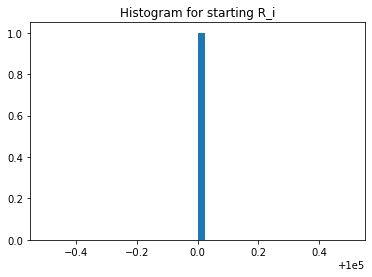

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 307557., 309883., ..., 196136., 211230., 174262.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15078., 14895., 14983., 15310., 14751., 14990., 14831.,
       15027., 14933., 14803., 14773., 15367., 14972., 14843., 15033.,
       15113., 15031., 15165., 14840., 14965., 15028., 15075., 15180.,
       14498., 14775., 14890., 15043., 15070., 14661., 15219., 14837.,
       14752., 15097., 14964., 14868., 14914., 14956., 14818., 15026.,
       14850., 15104., 15159., 15058., 15066., 15032., 15189., 15115.,
       14857., 14961., 15062., 14889., 15039., 14936., 14739., 15098.,
       15063., 15100., 15126., 15119., 15243., 15084., 14742., 15131.,
       14878., 15107., 14772., 15001., 15064., 14886., 14929., 14883.,
       14946., 14998., 15177., 14986., 15184., 14968., 15149., 15253.,
       15186., 14721., 15044., 14867., 15013., 15175., 15072., 14989.,
       14928., 14981., 15154., 14670., 14922., 14957., 14849., 15142.,
       14848., 14810., 15144., 15108., 15134., 14781., 15130., 15086.,
       14726., 14898., 15254., 14970., 14862., 14915., 14997., 14716.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

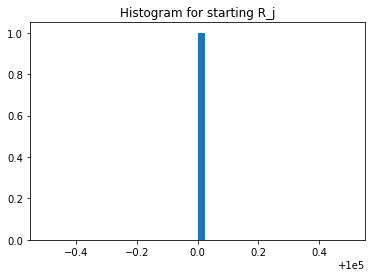

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


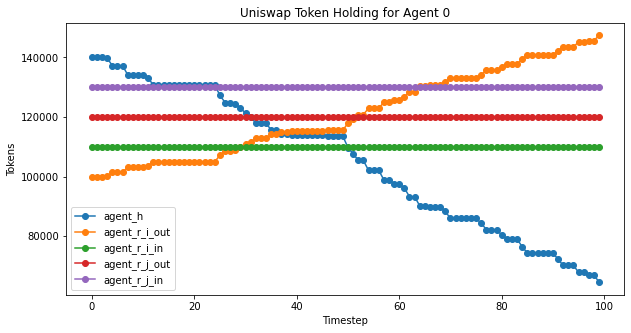

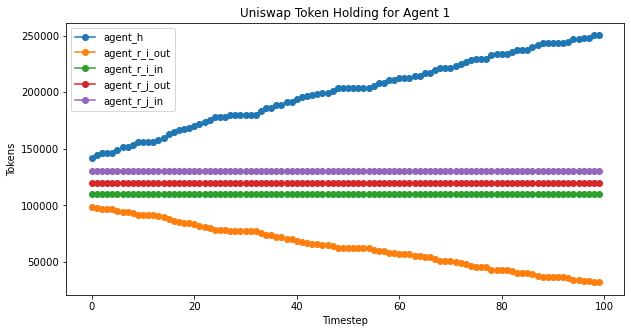

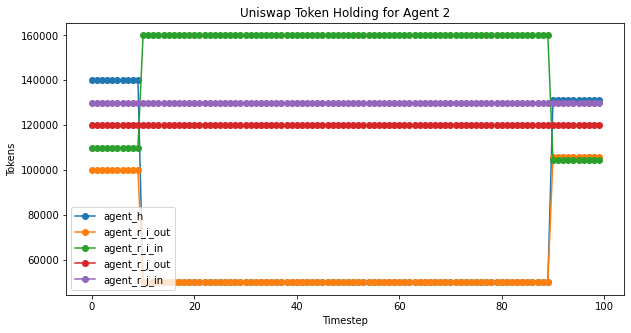

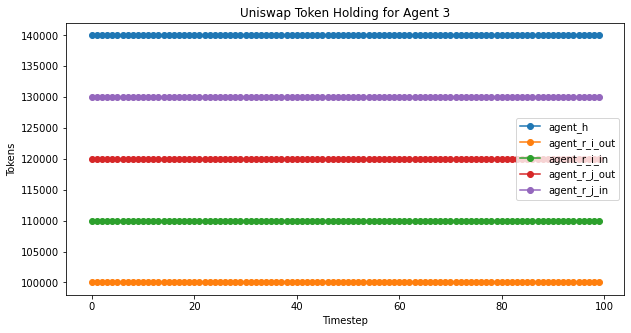

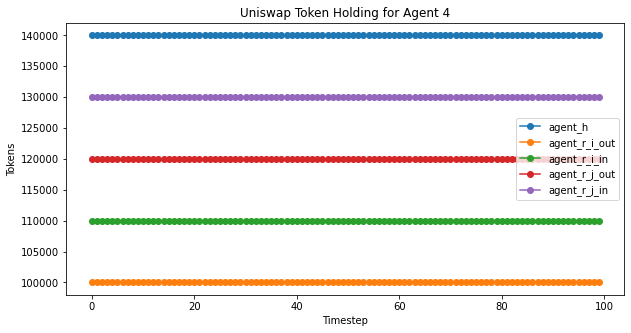

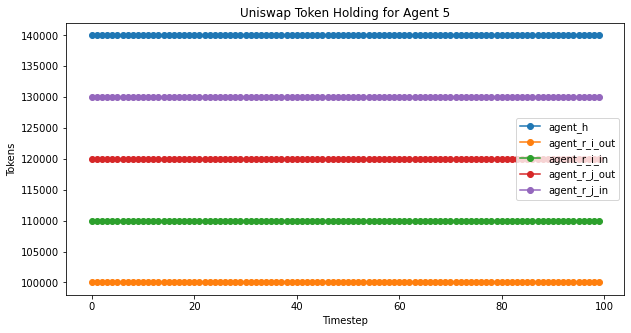

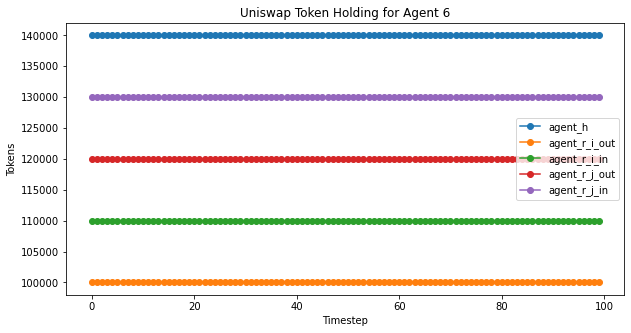

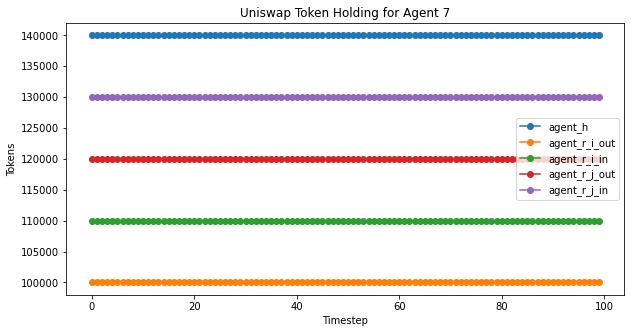

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


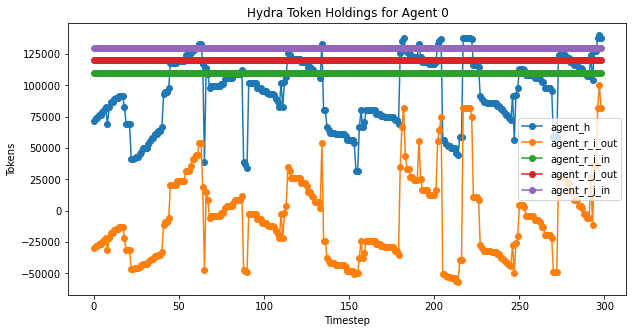

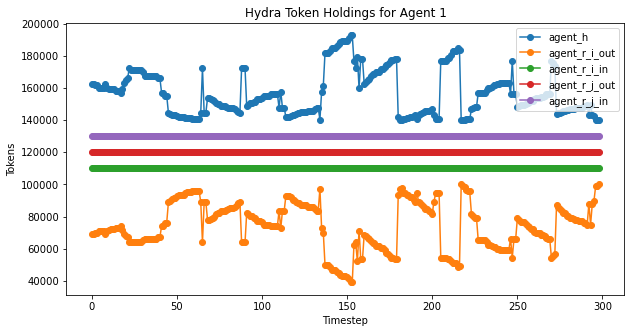

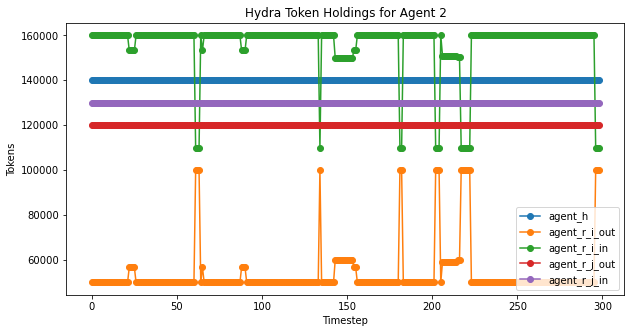

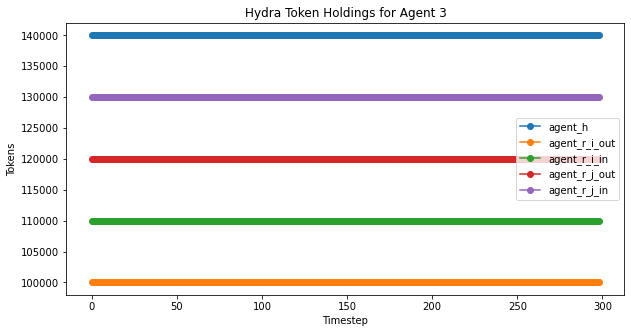

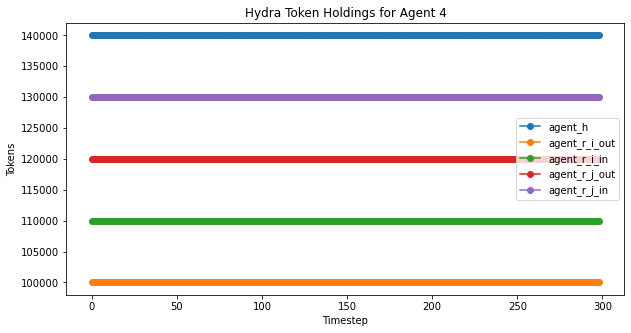

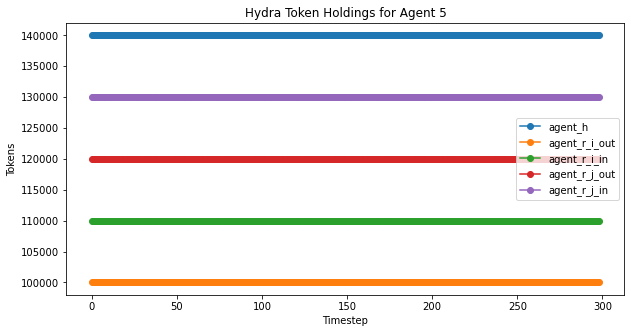

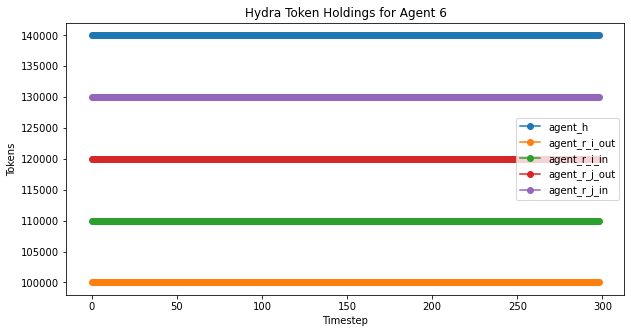

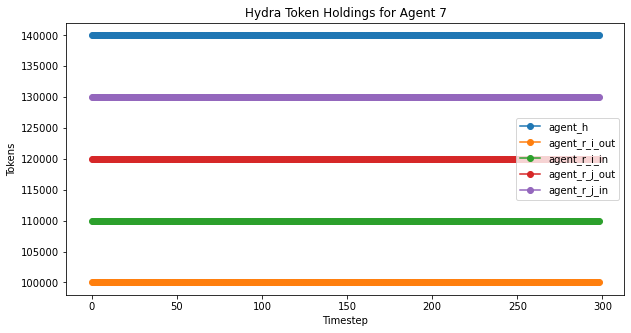

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

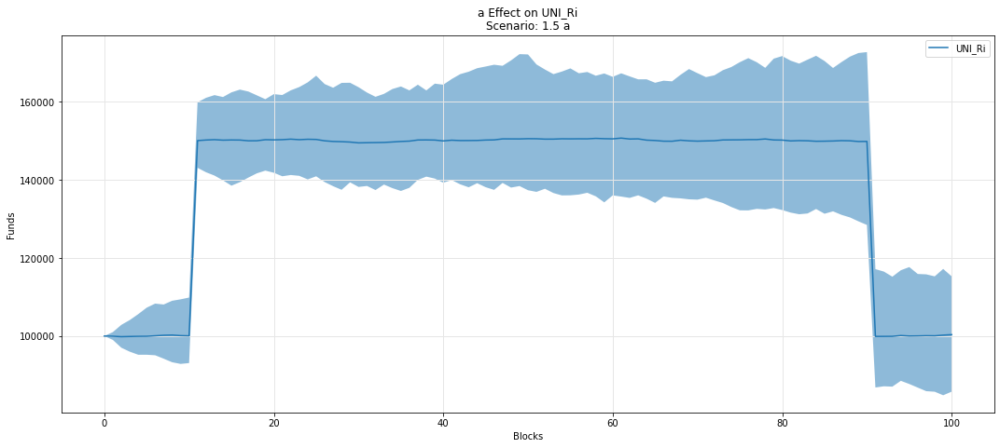

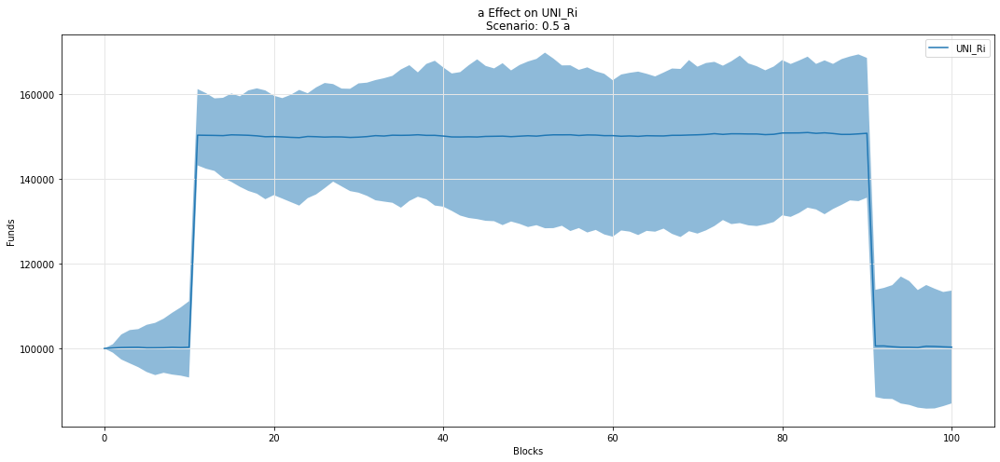

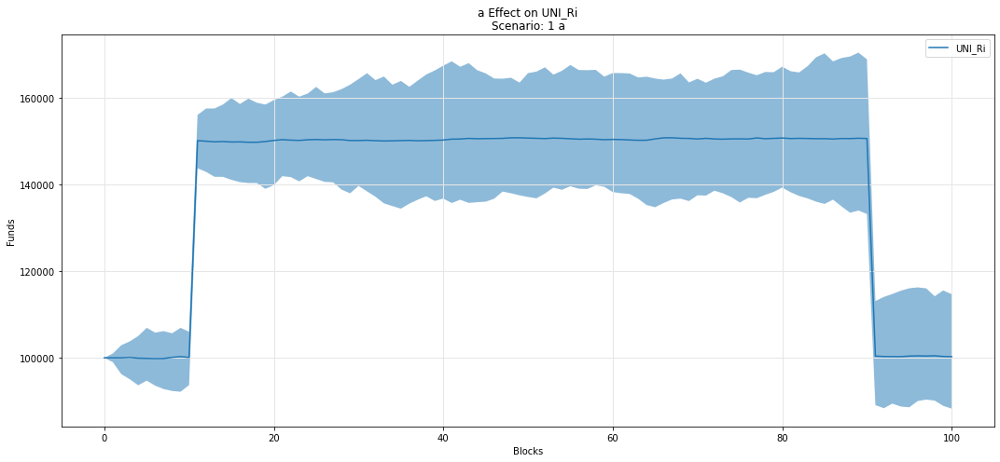

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

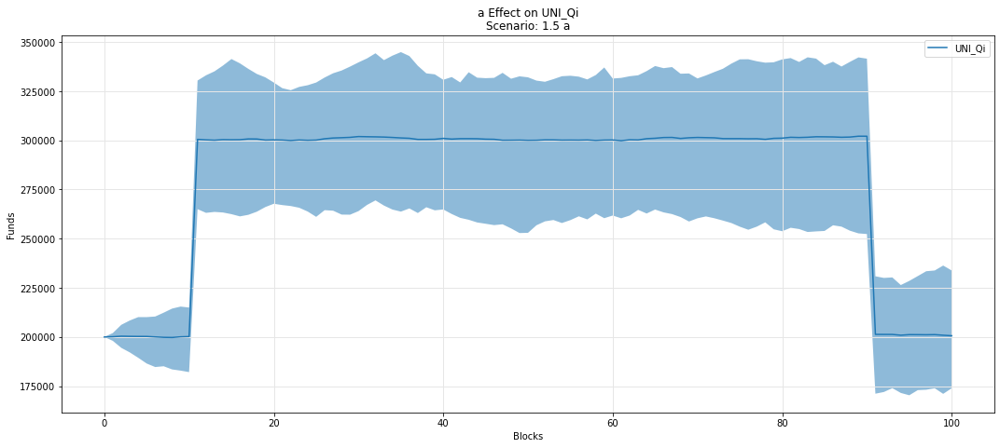

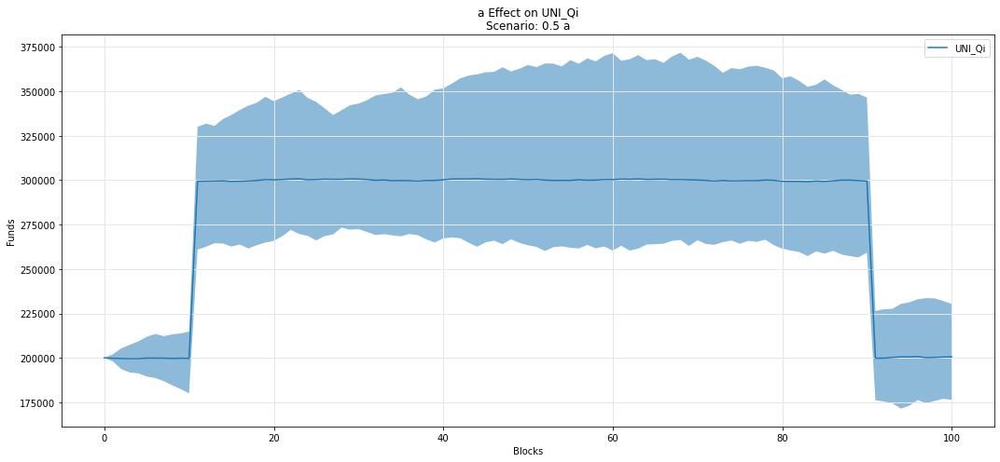

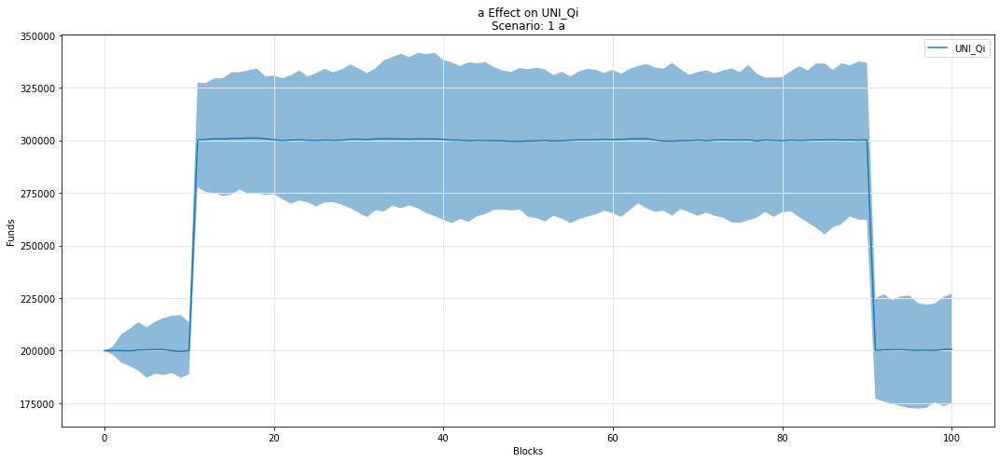

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

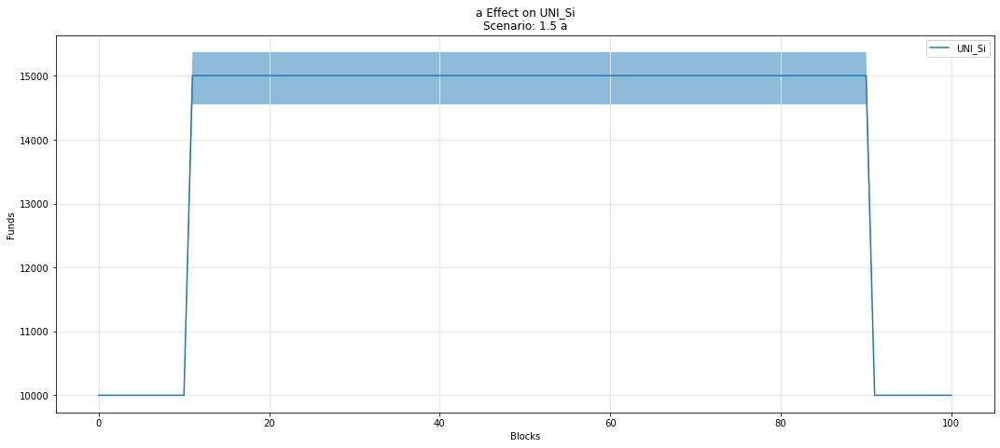

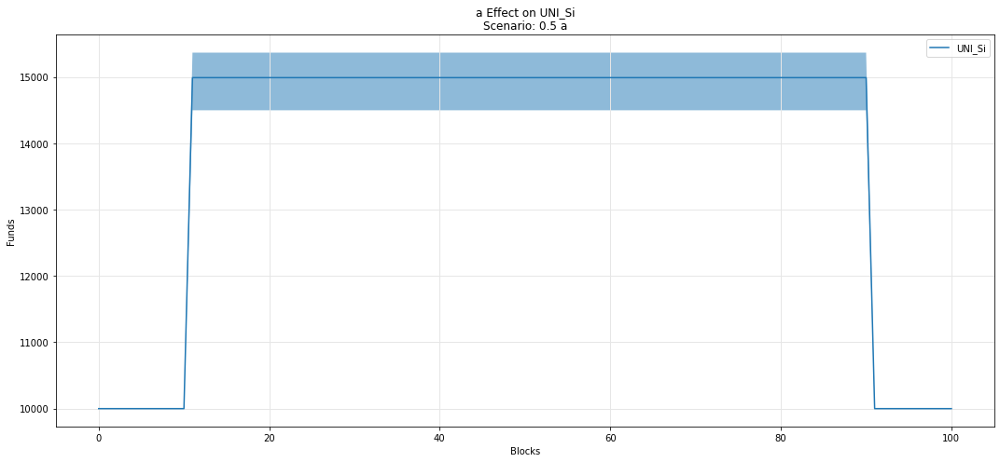

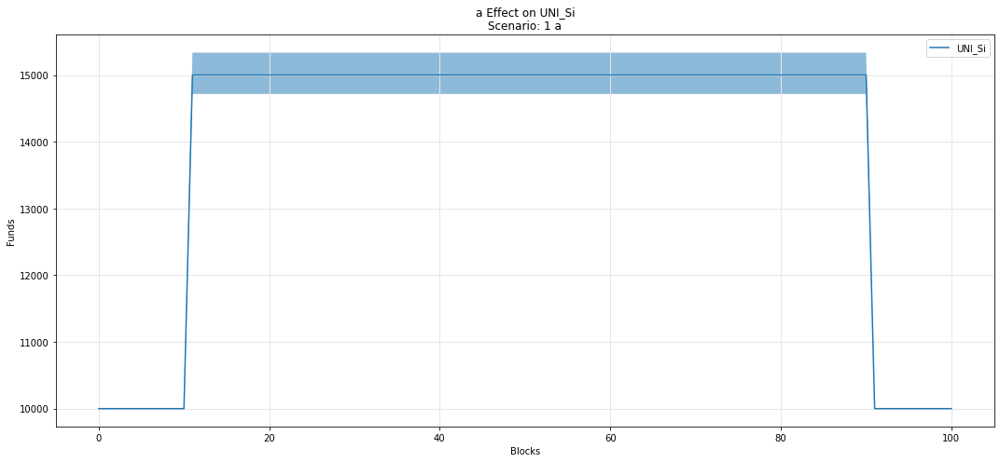

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

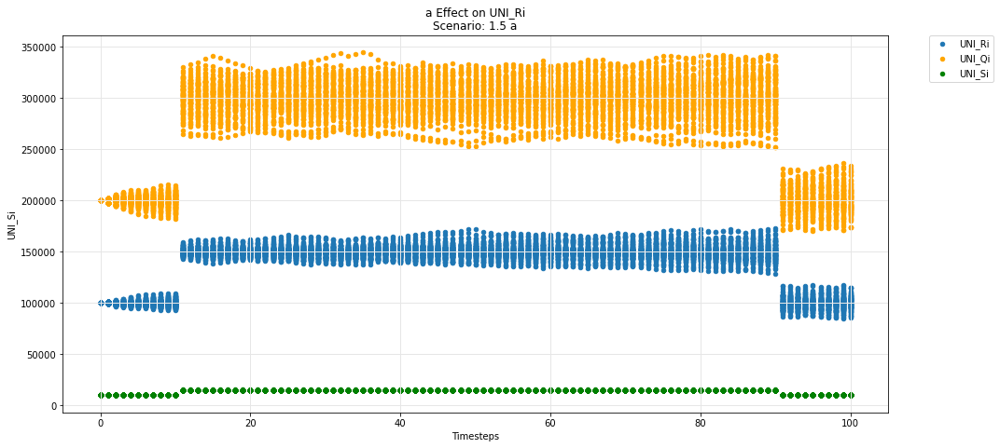

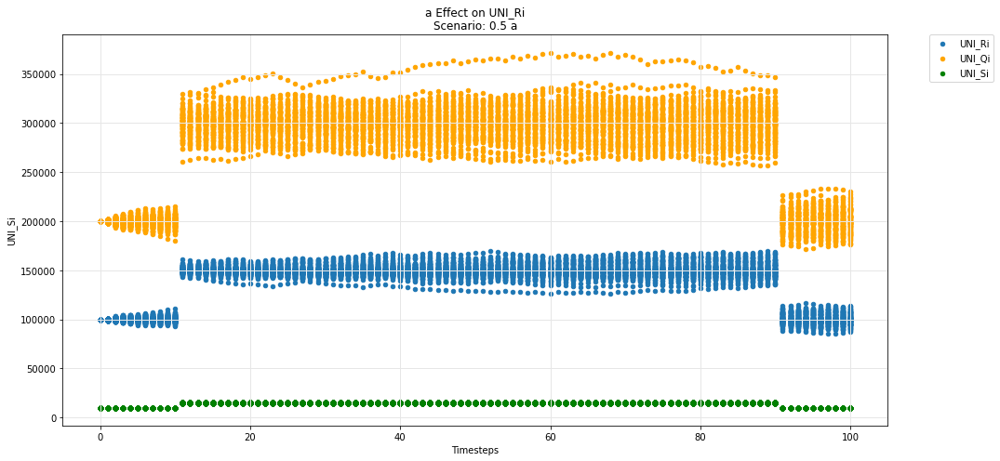

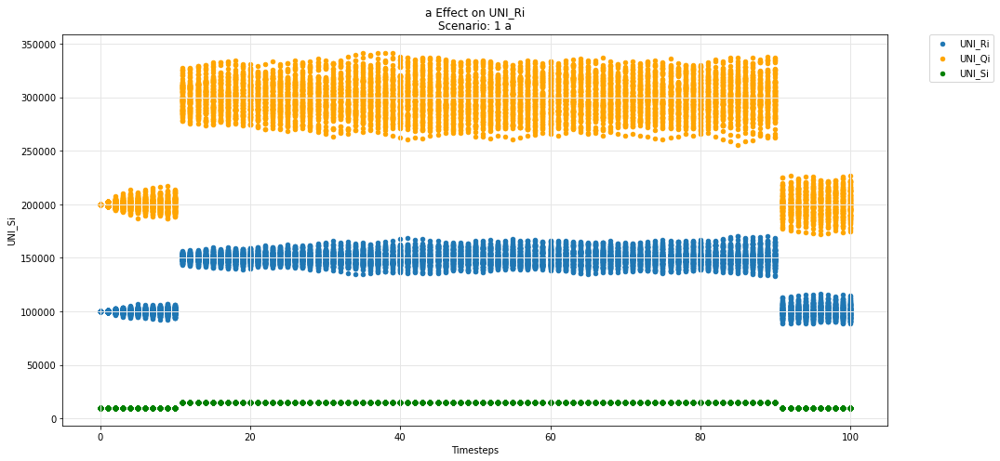

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

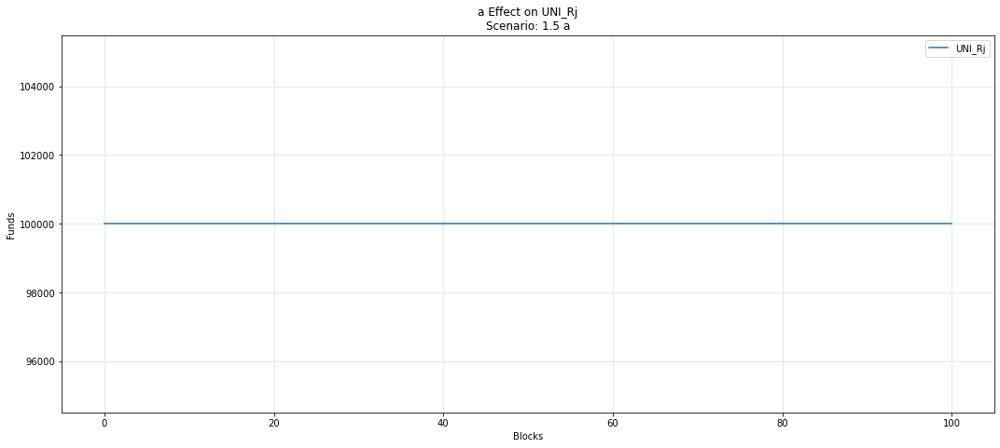

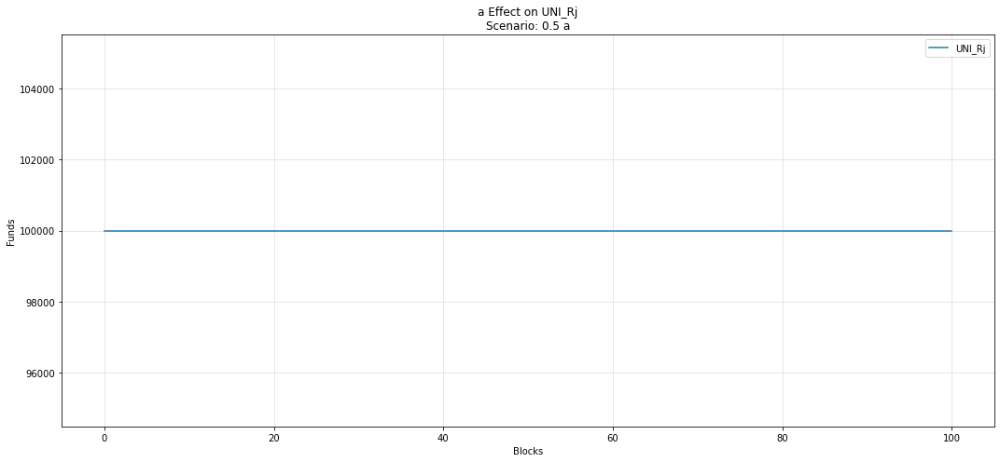

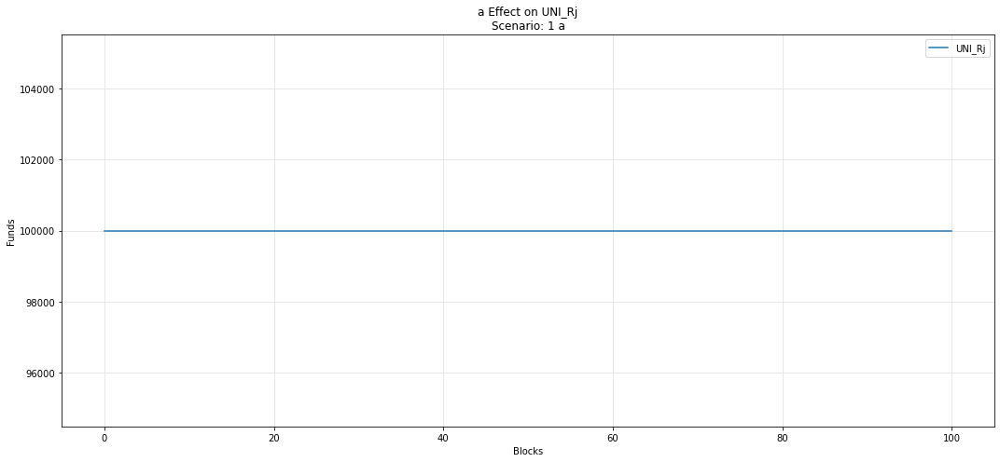

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

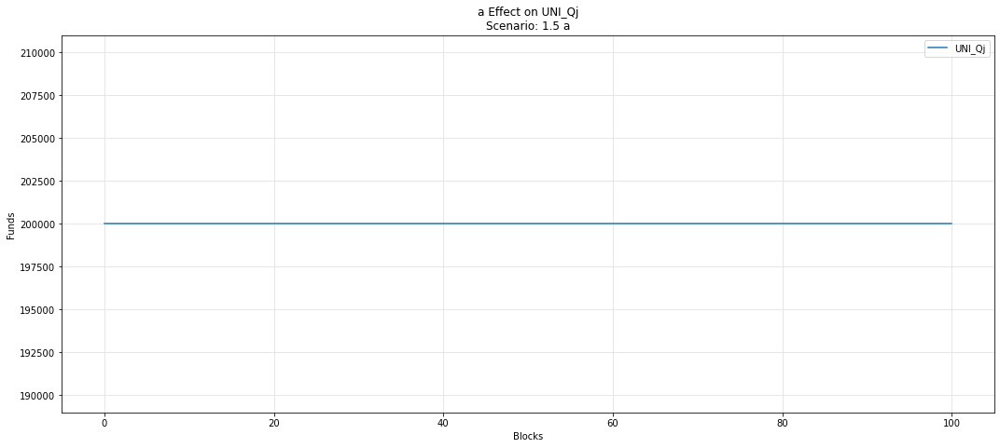

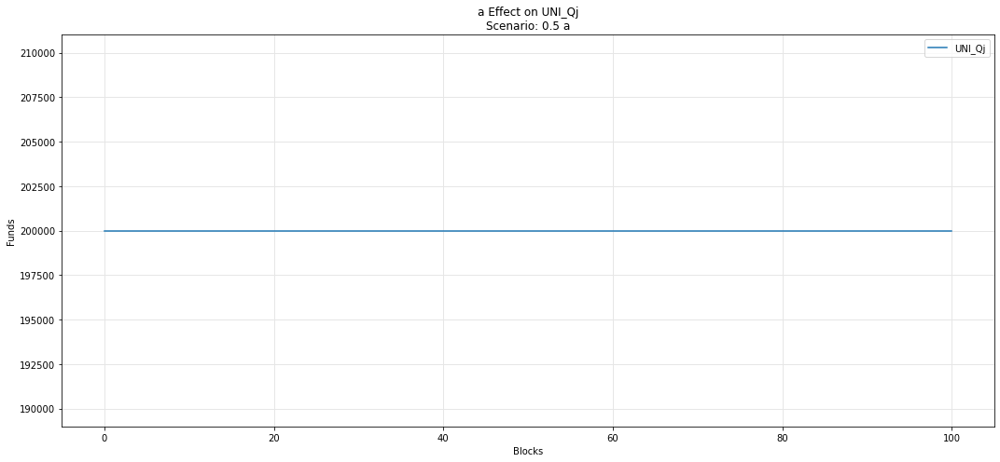

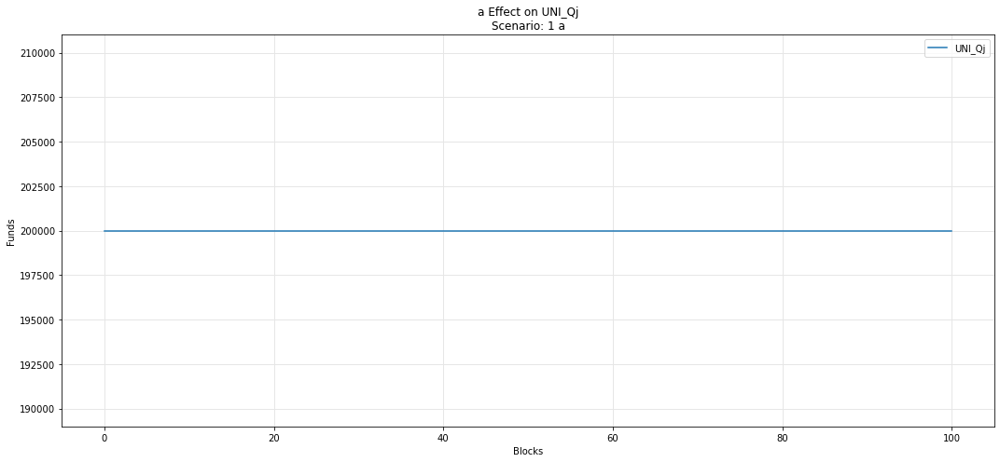

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

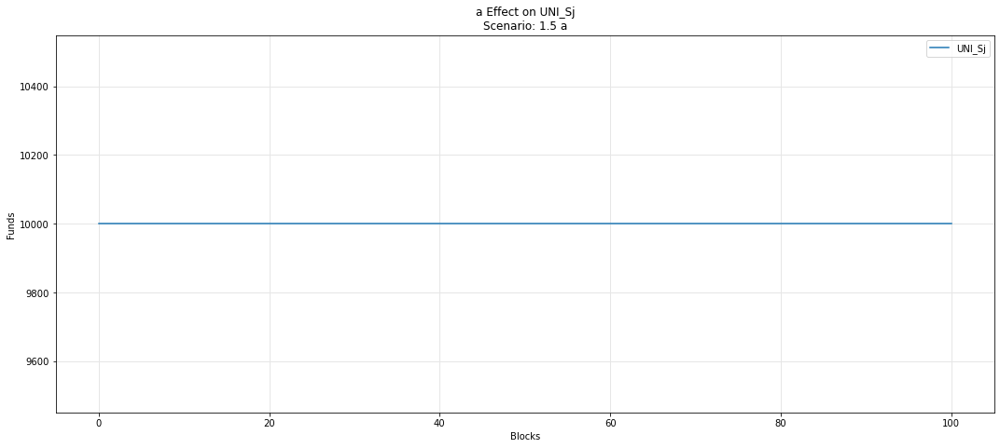

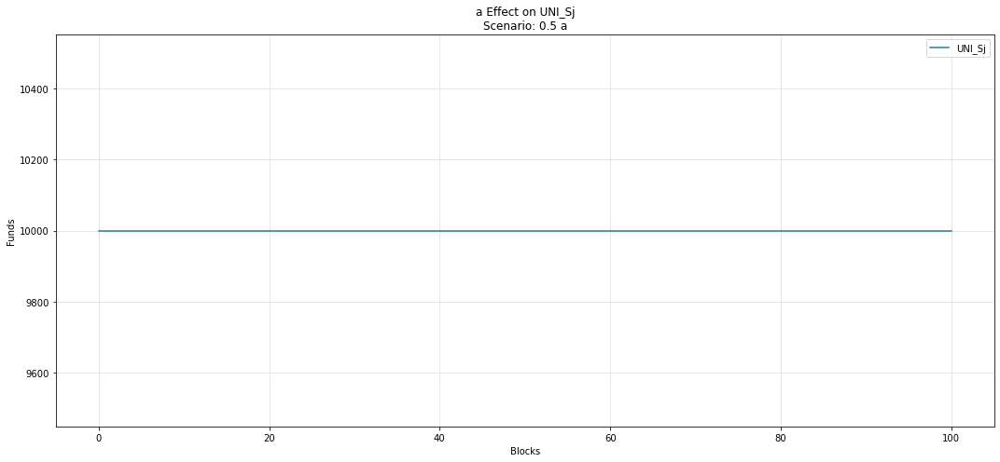

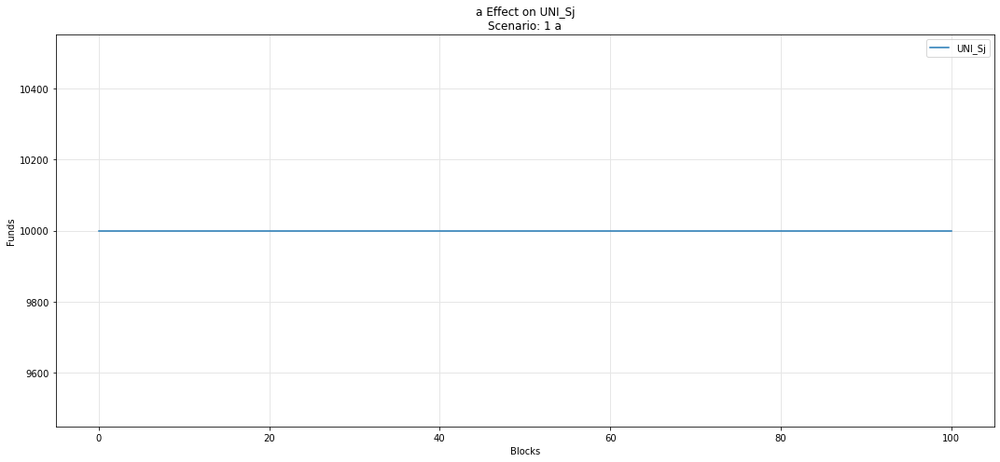

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

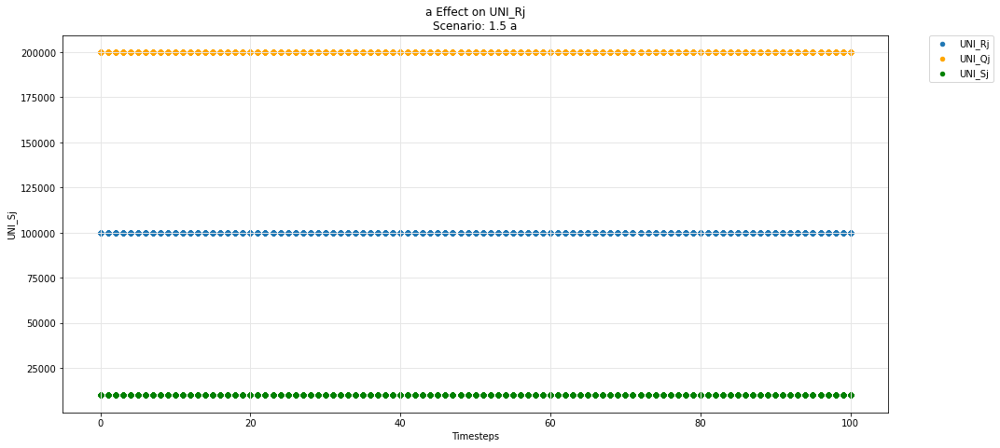

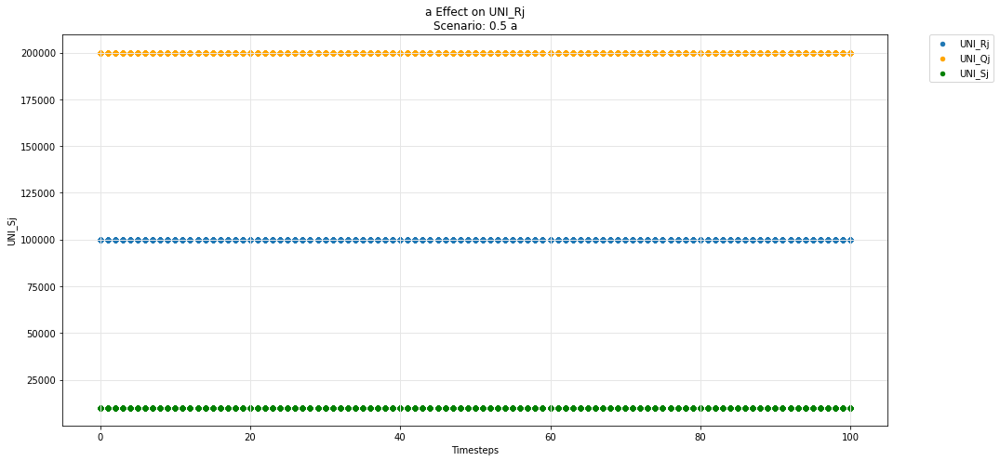

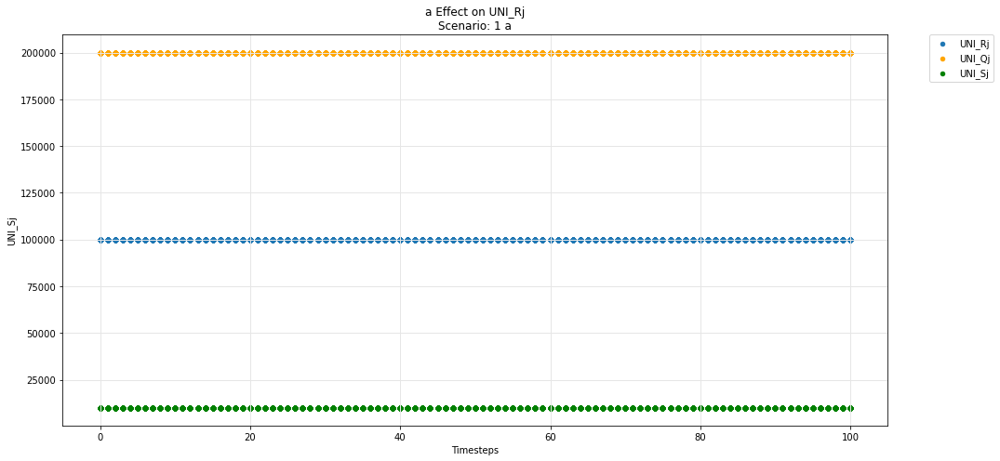

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

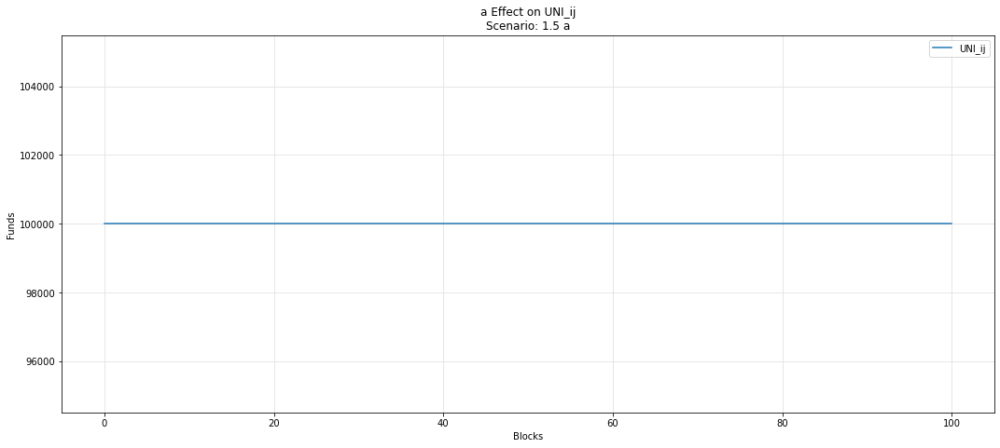

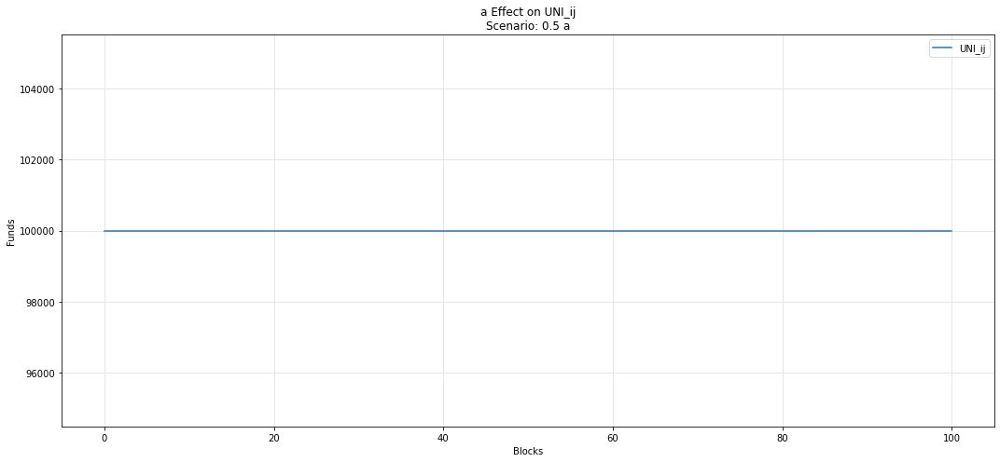

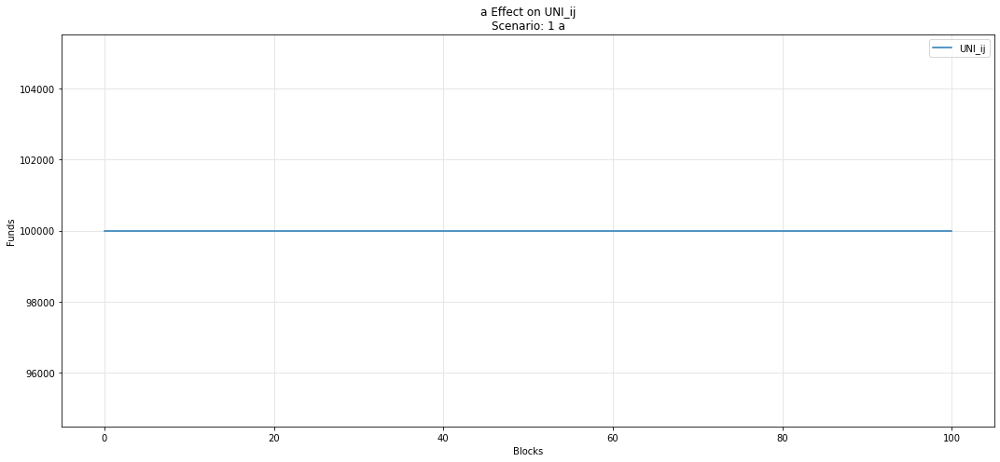

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

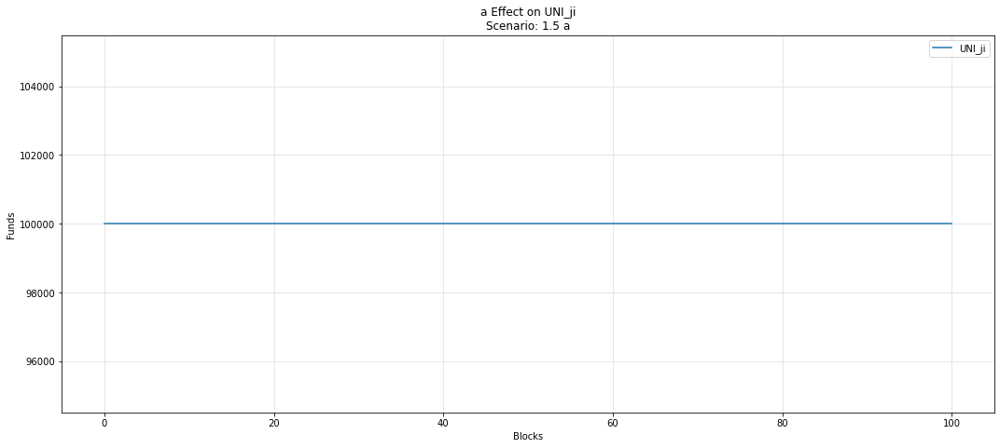

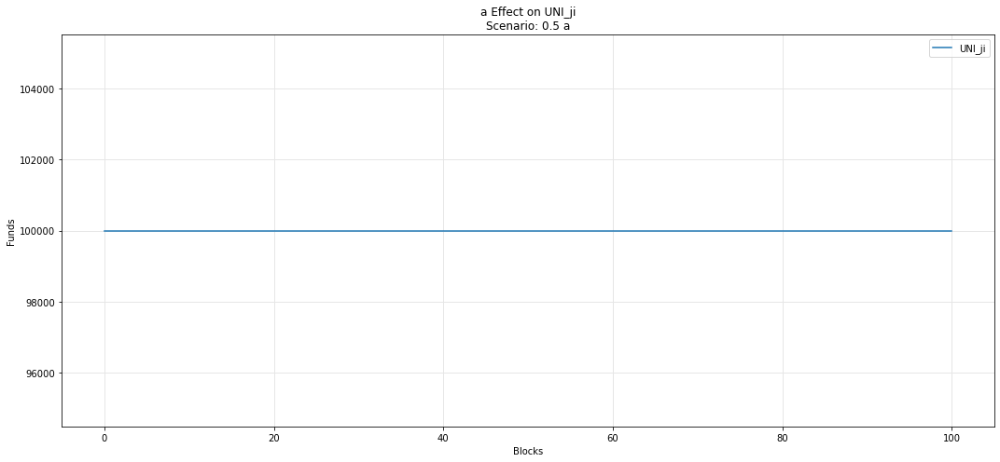

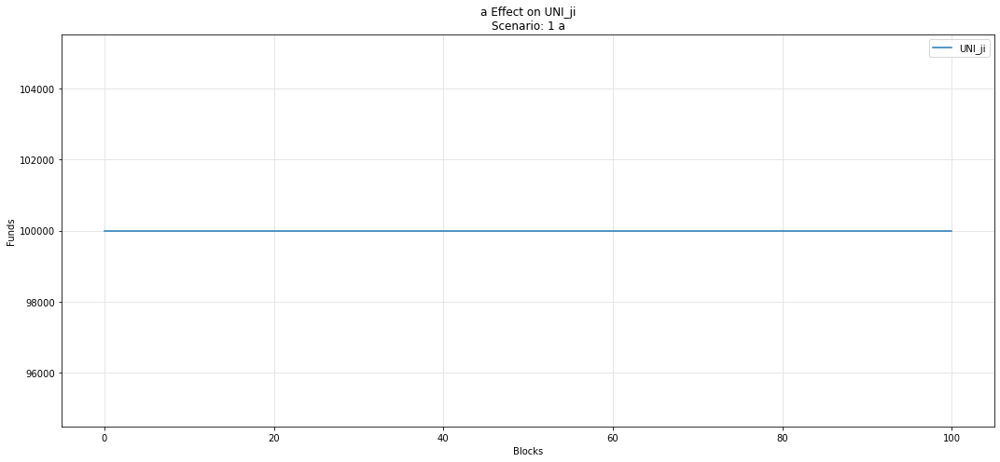

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

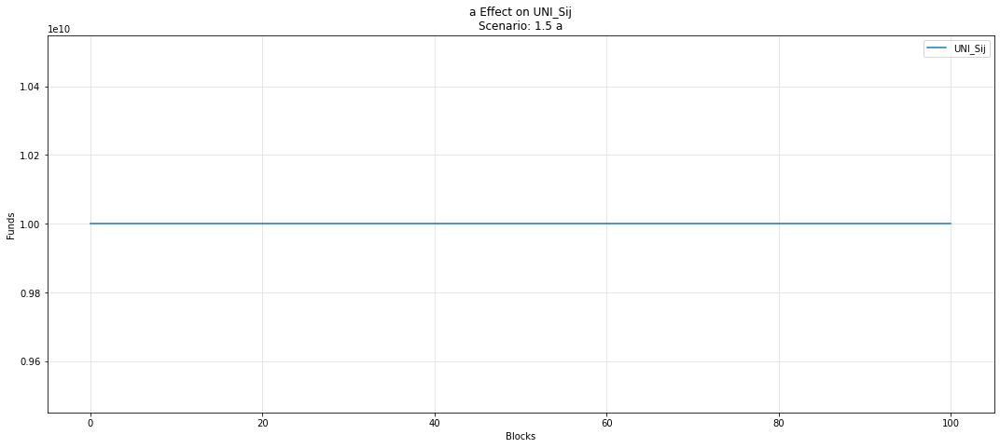

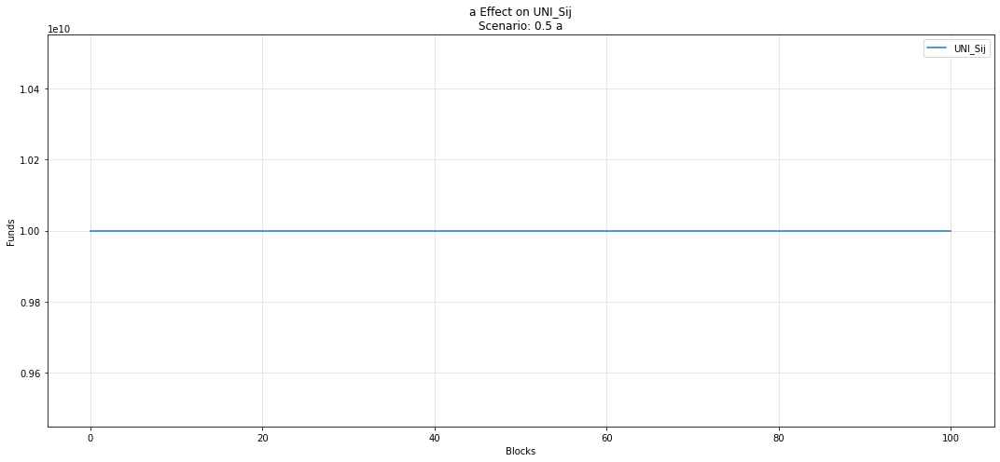

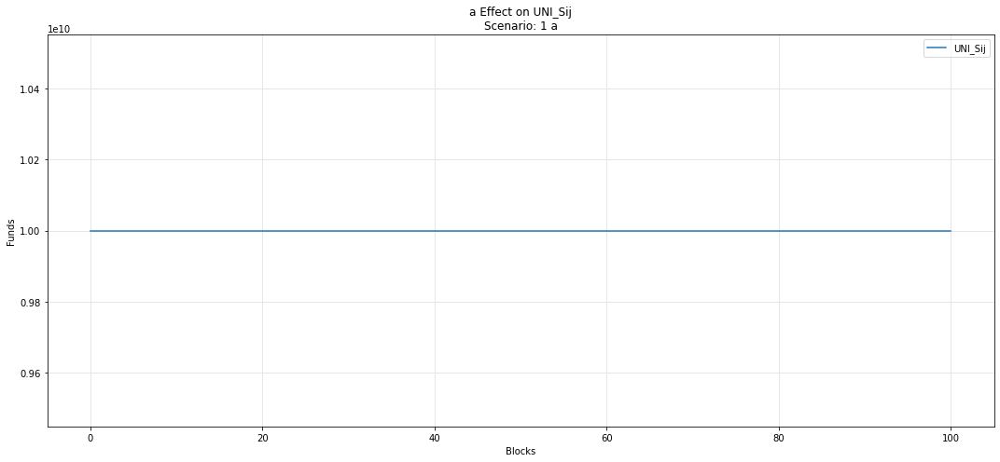

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

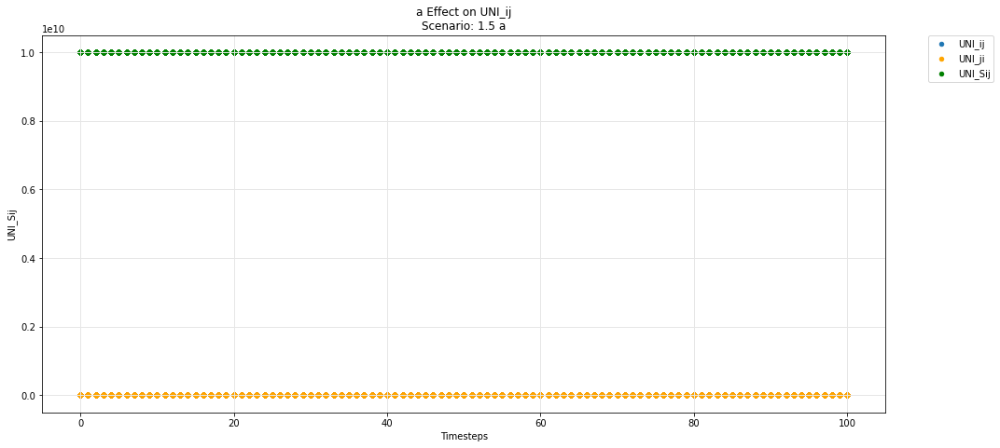

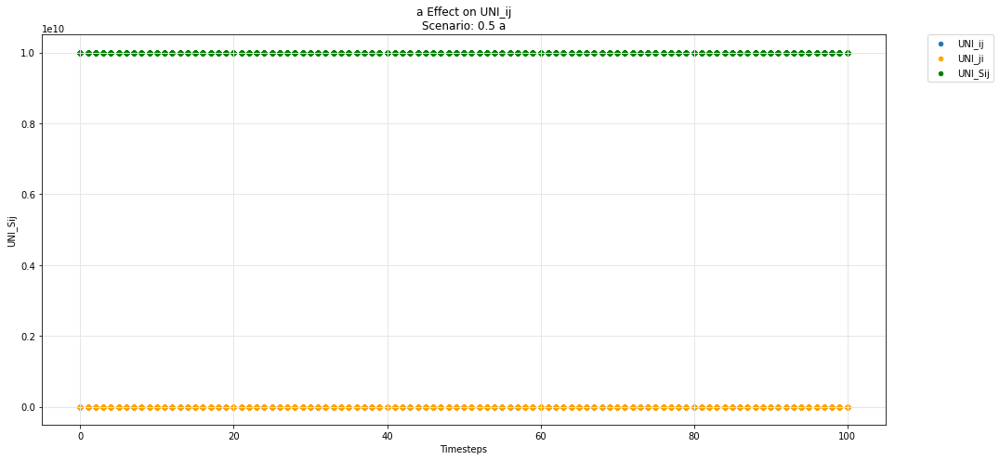

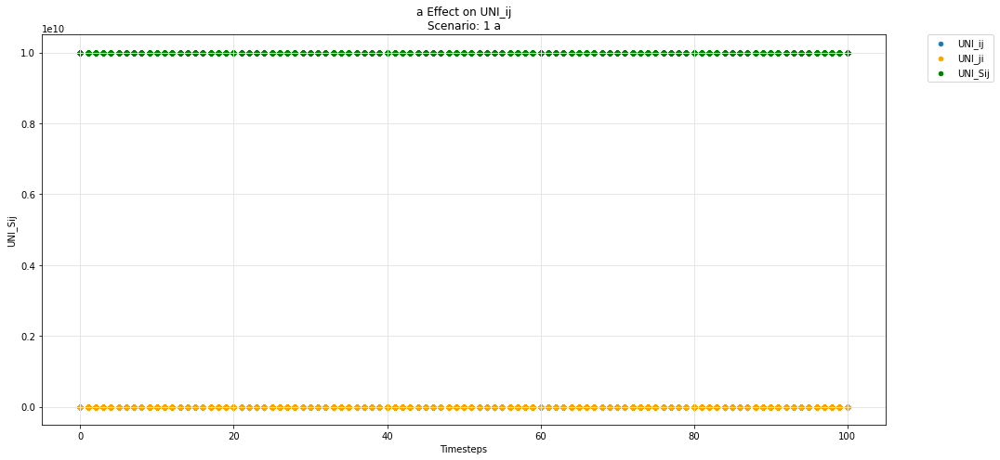

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

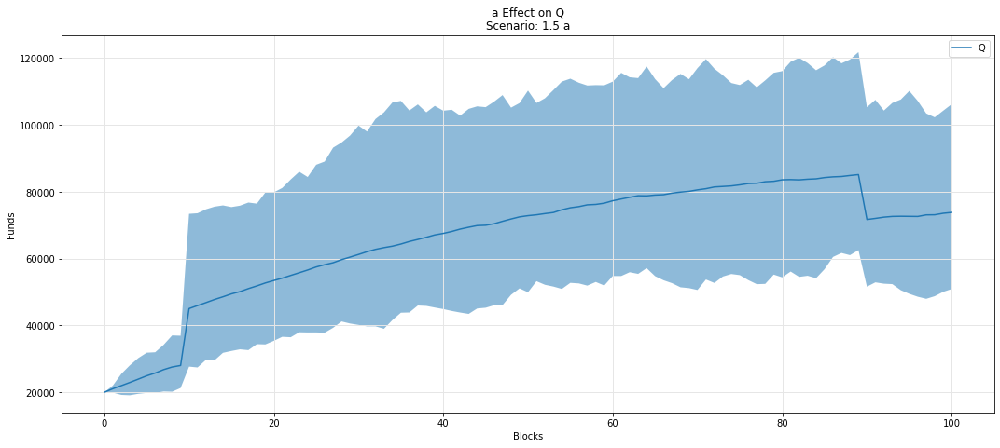

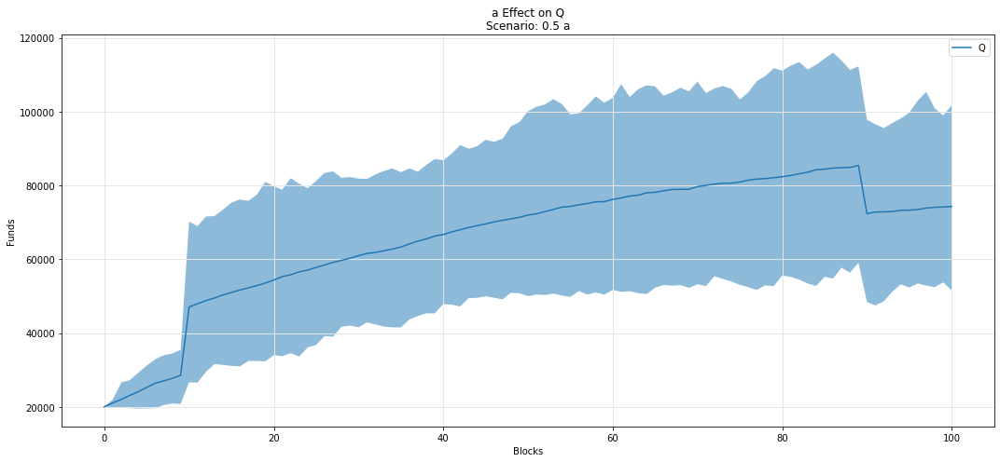

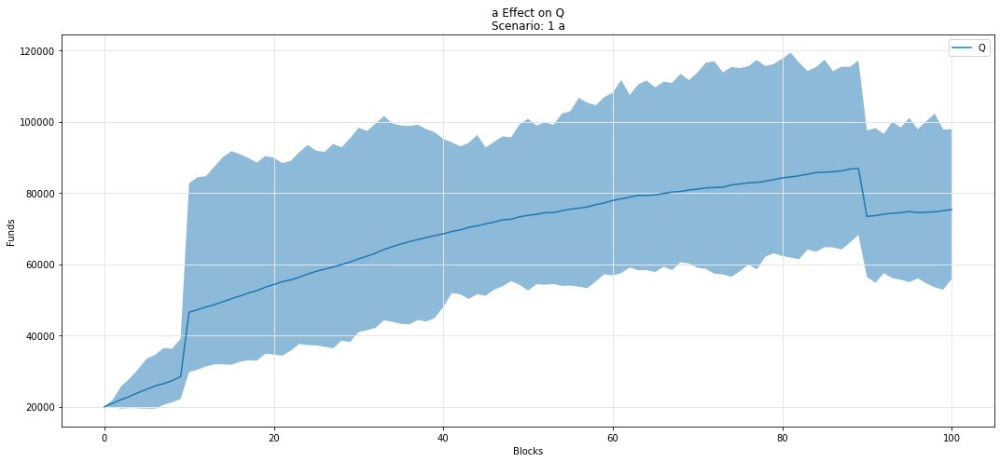

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

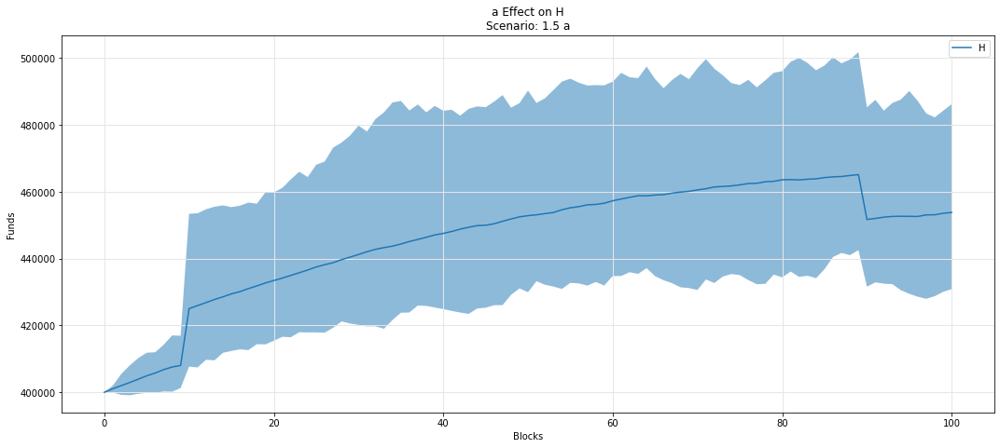

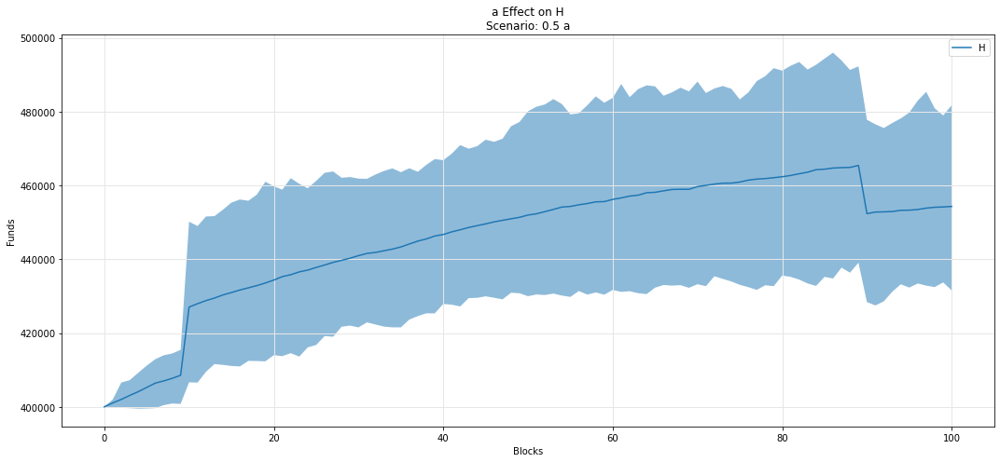

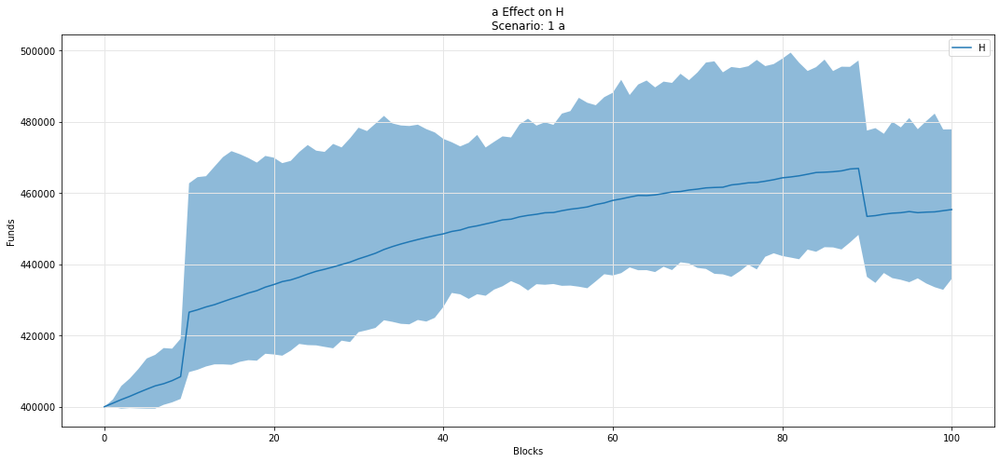

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

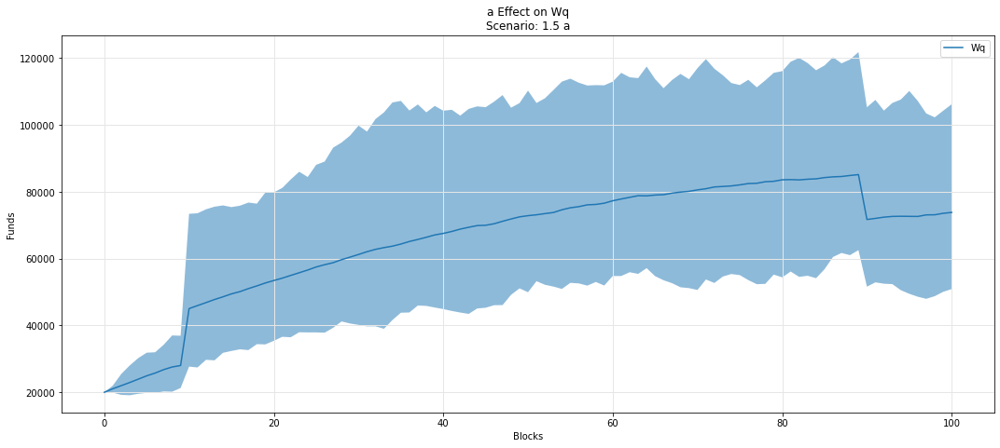

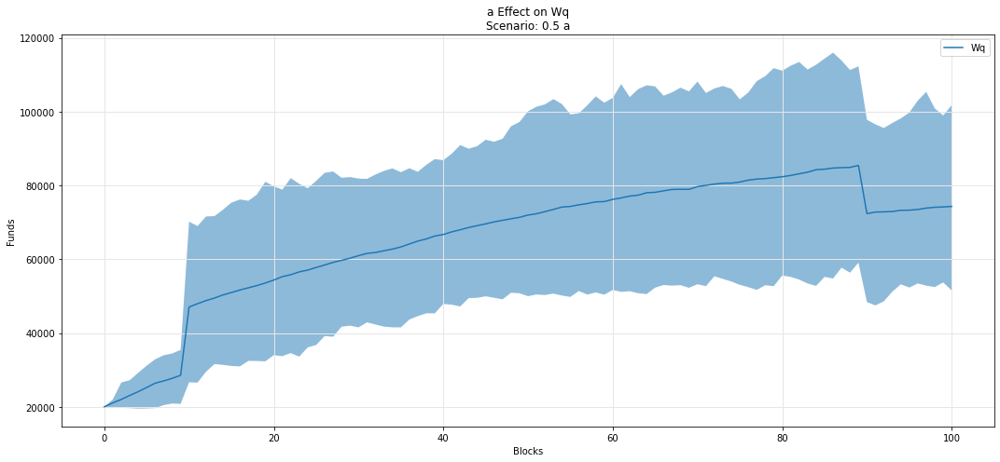

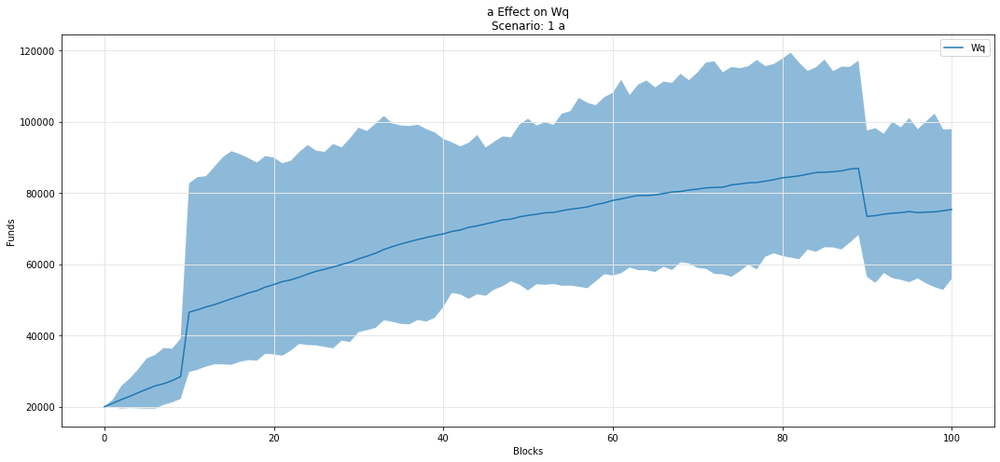

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

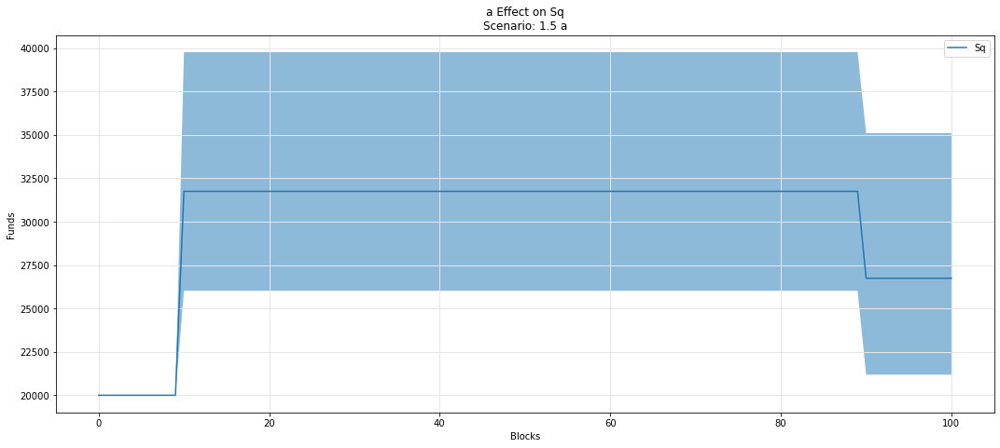

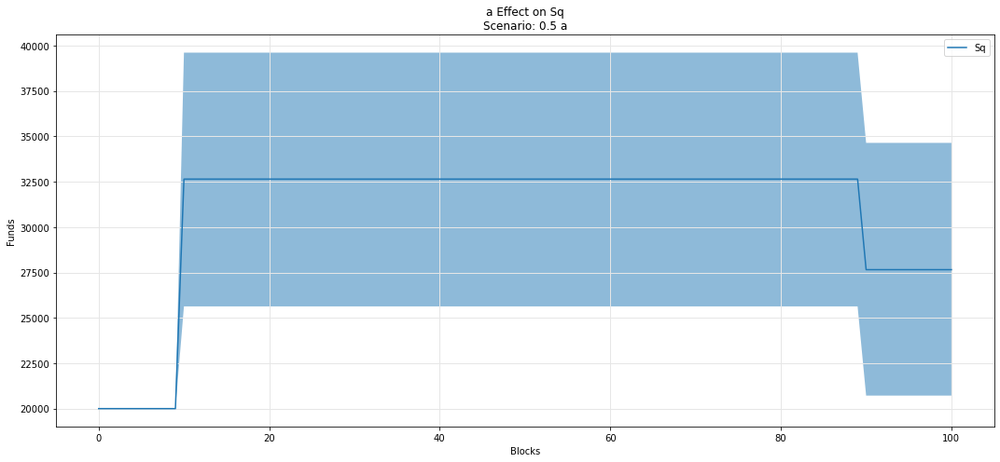

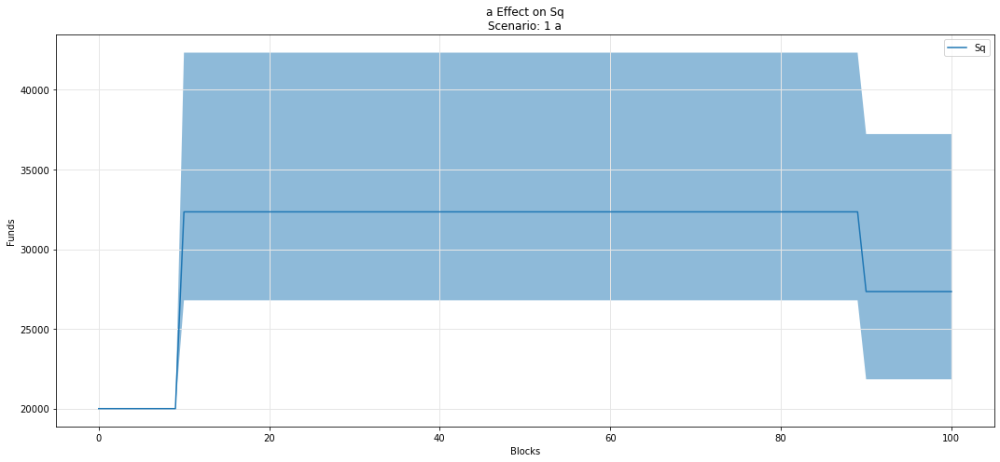

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

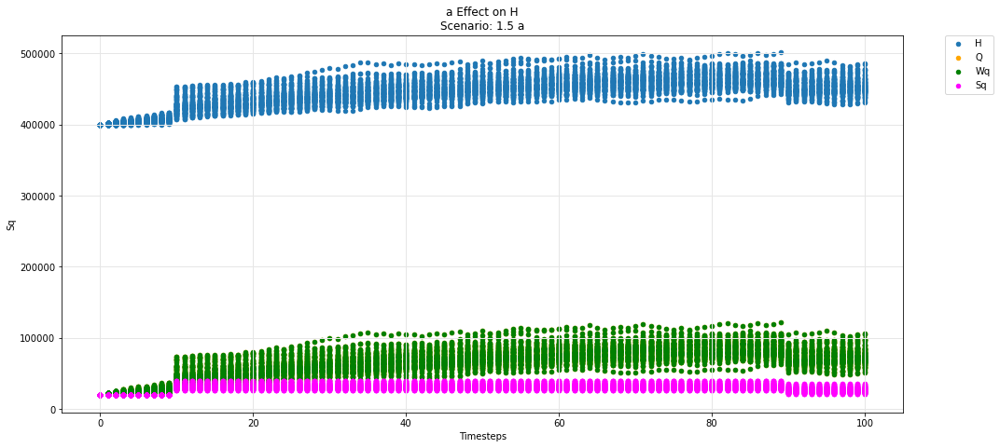

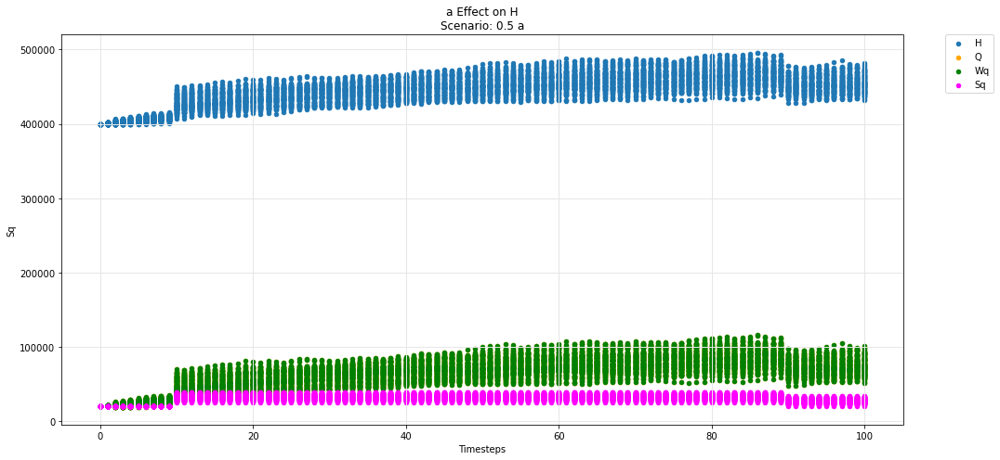

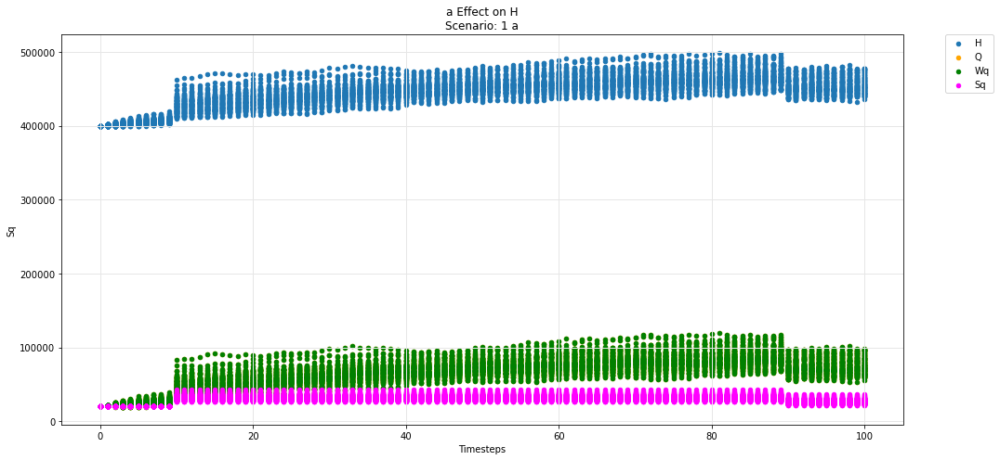

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

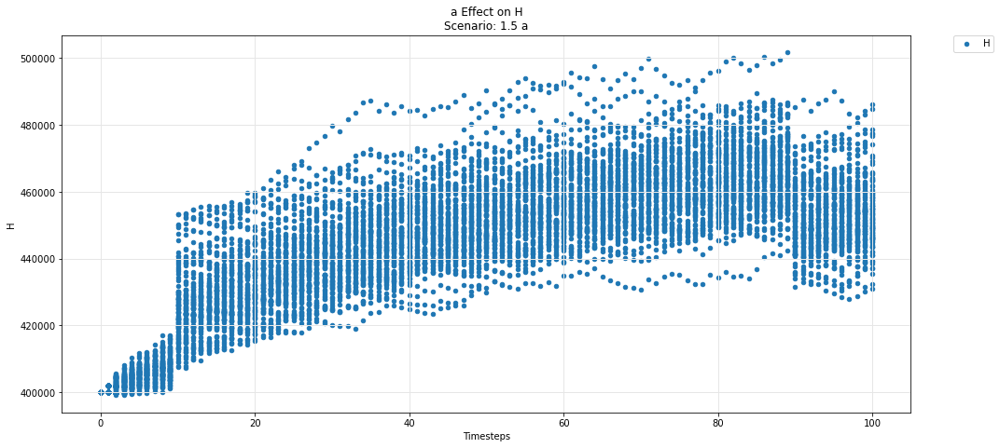

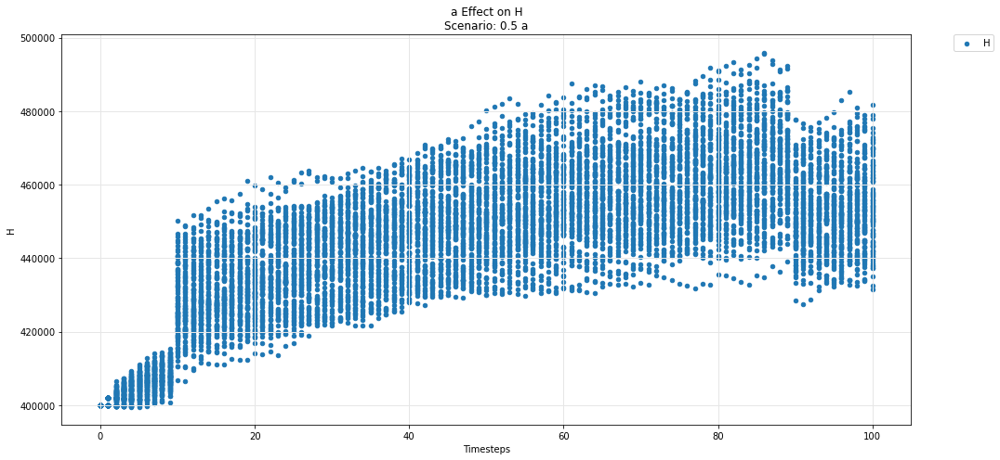

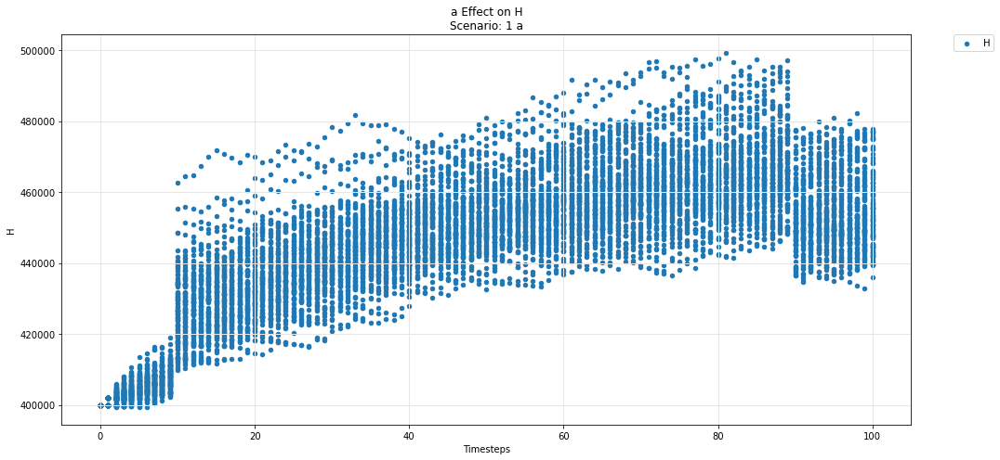

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

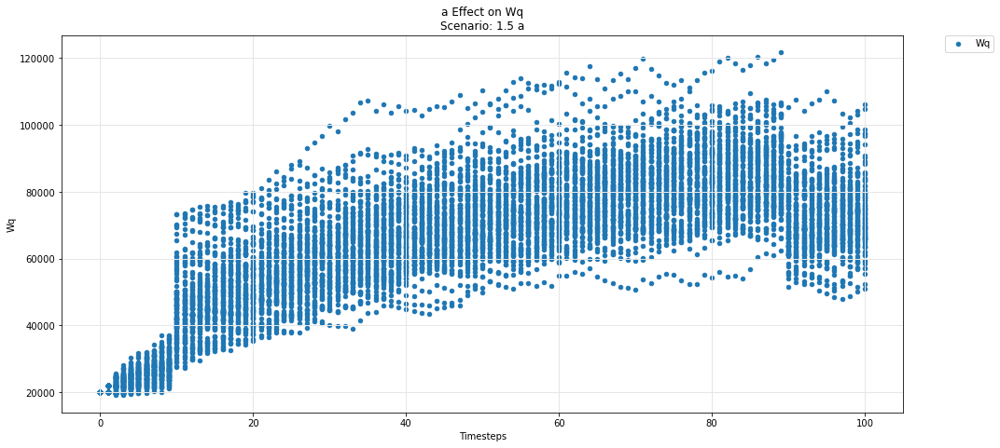

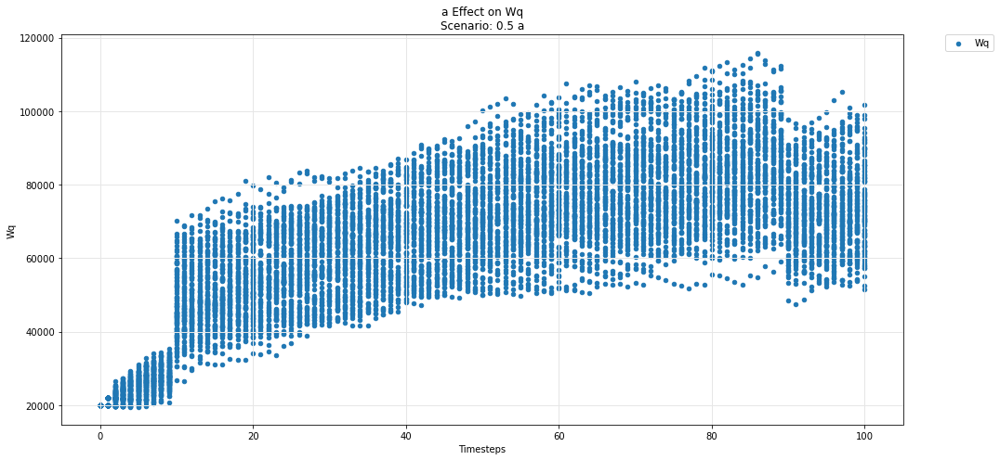

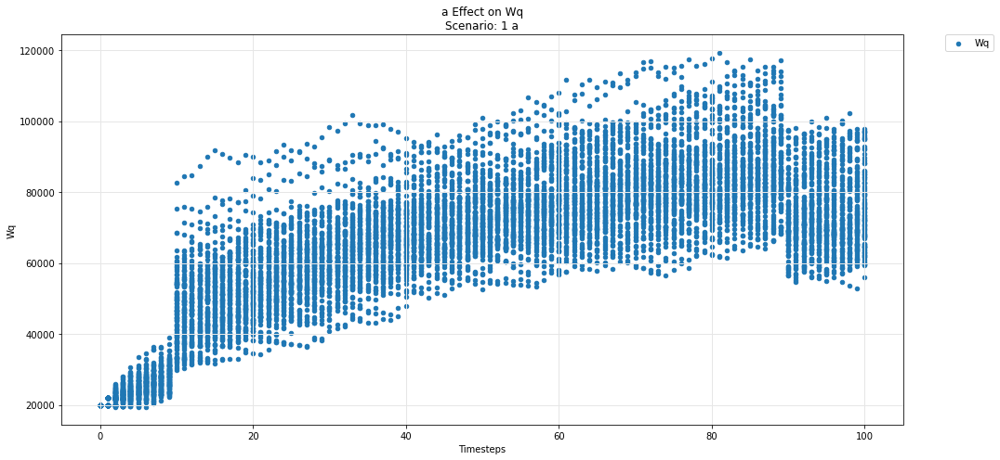

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

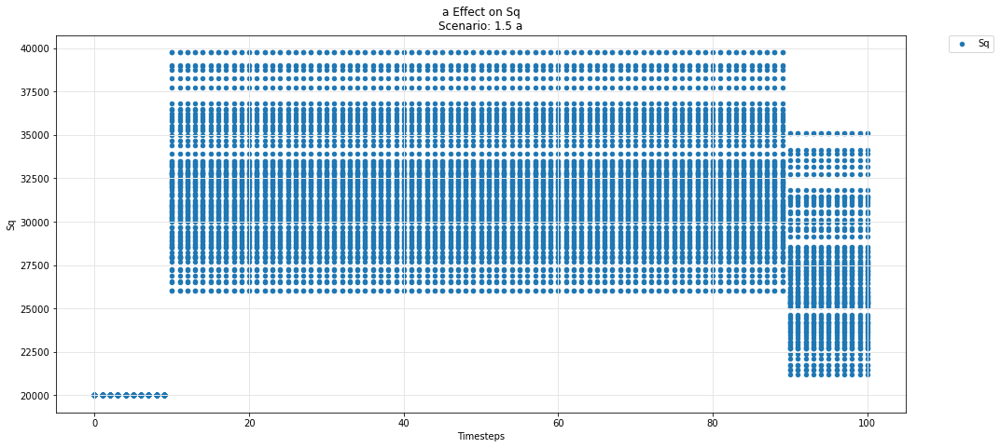

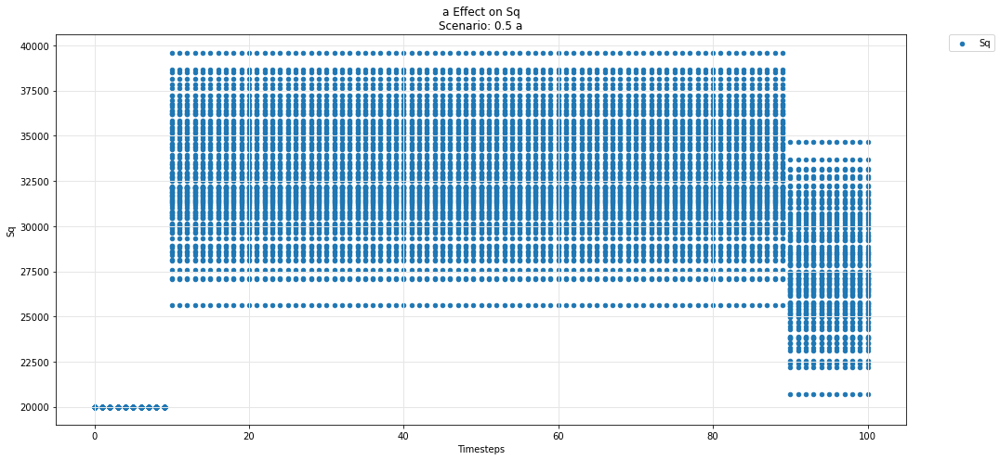

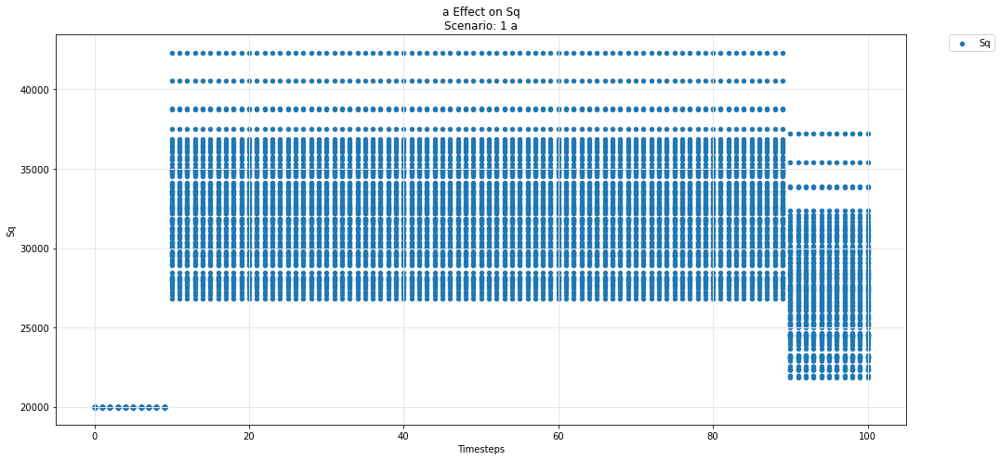

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

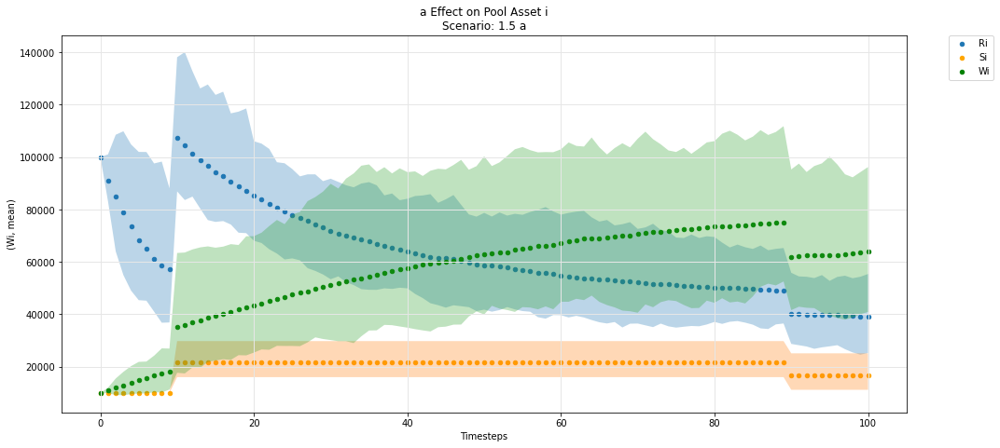

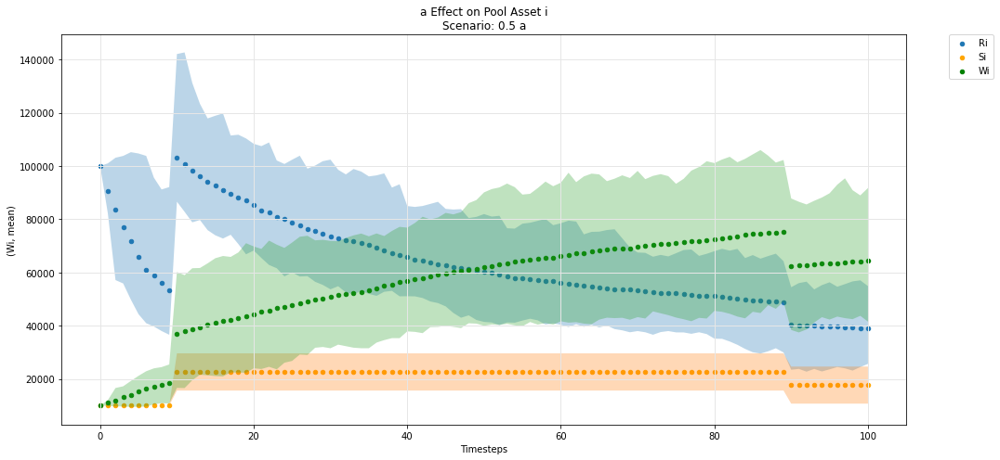

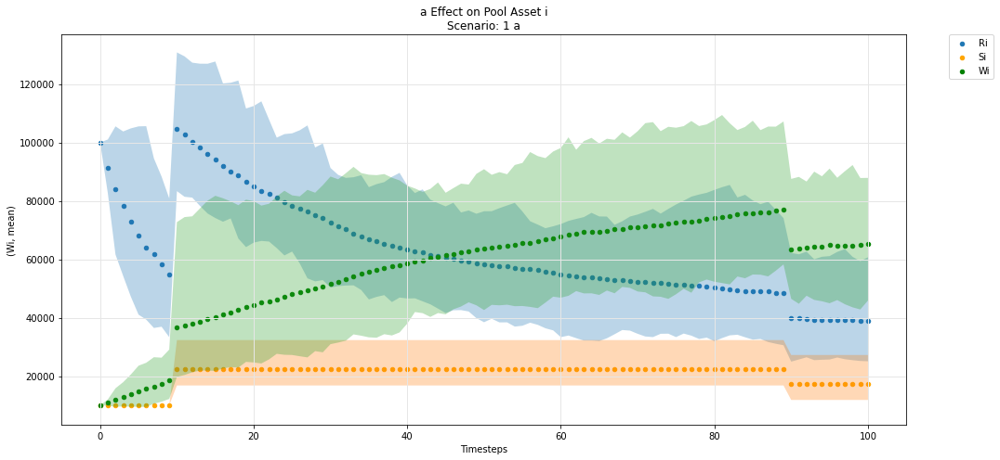

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

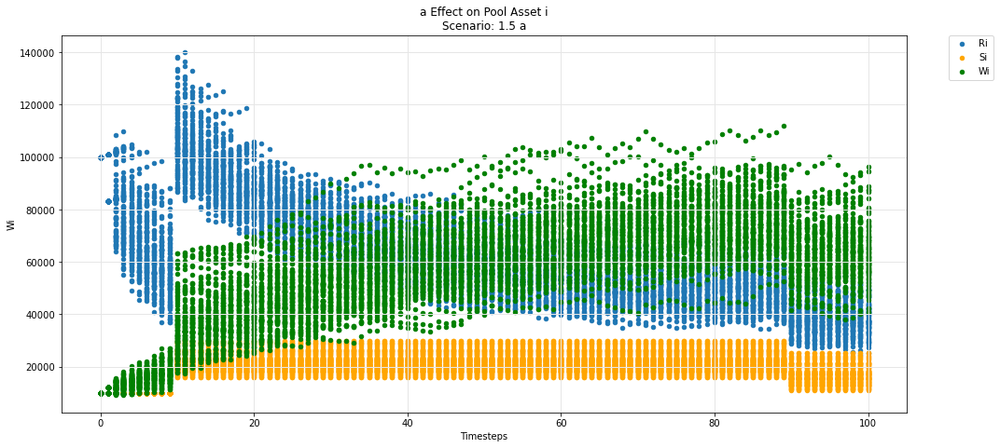

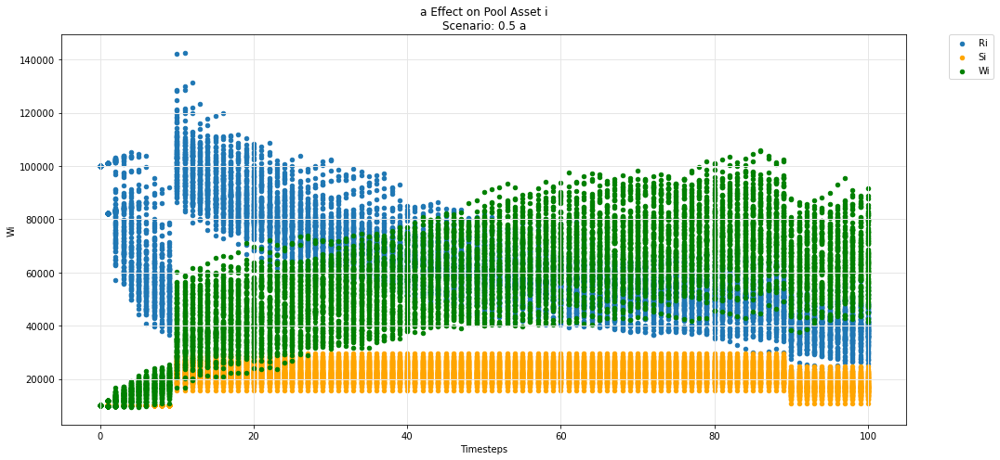

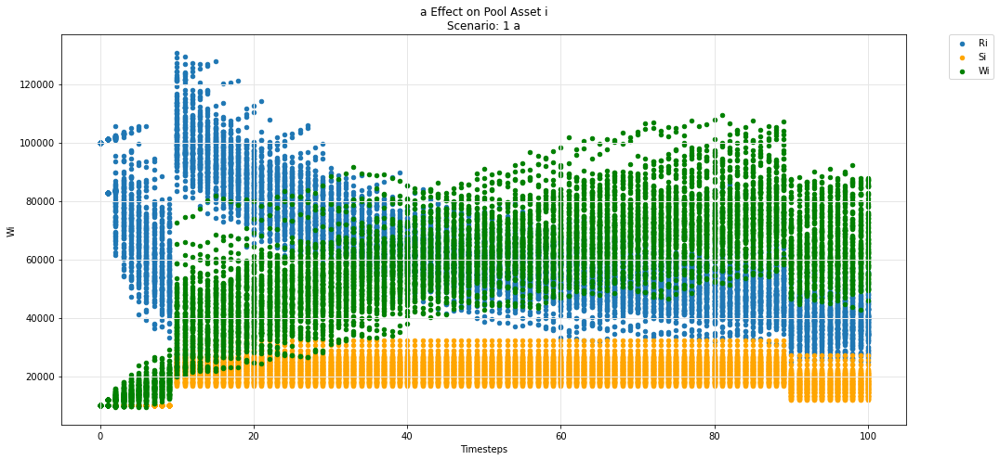

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

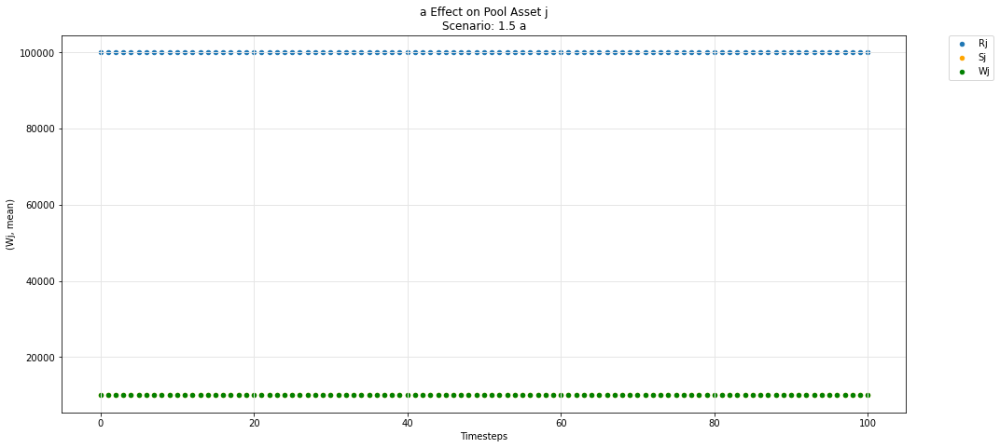

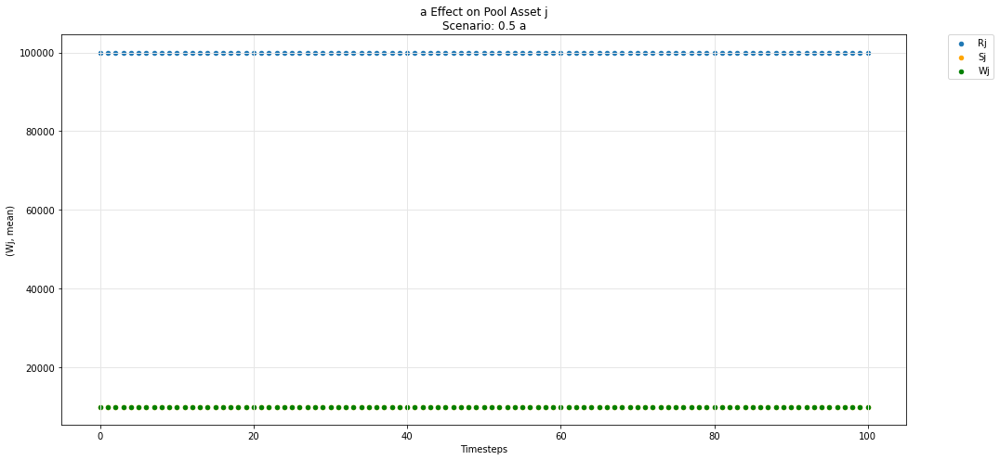

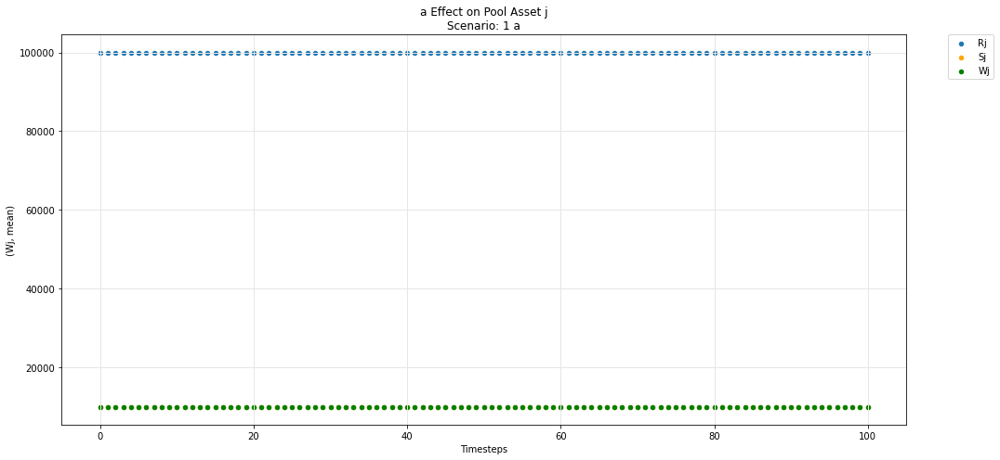

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

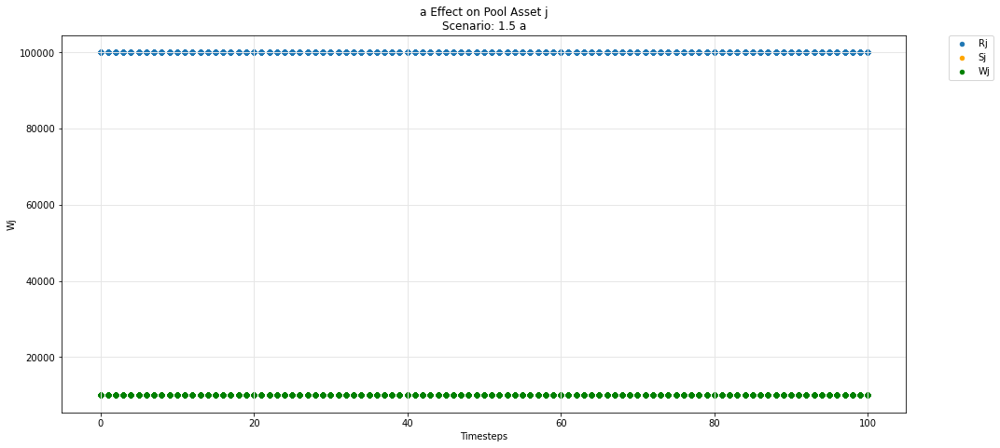

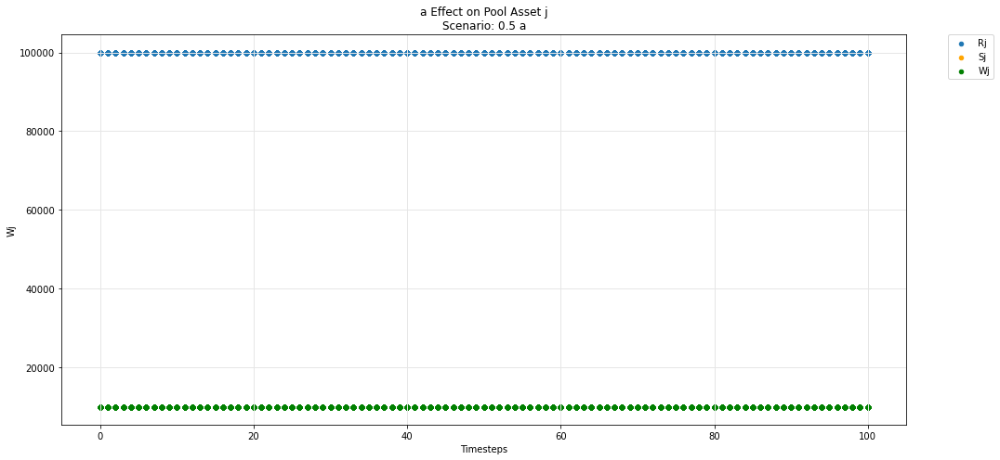

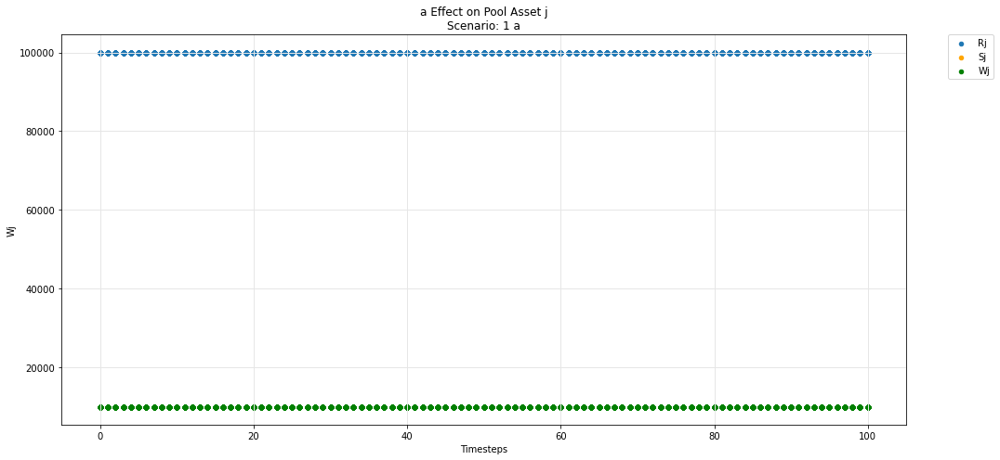

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

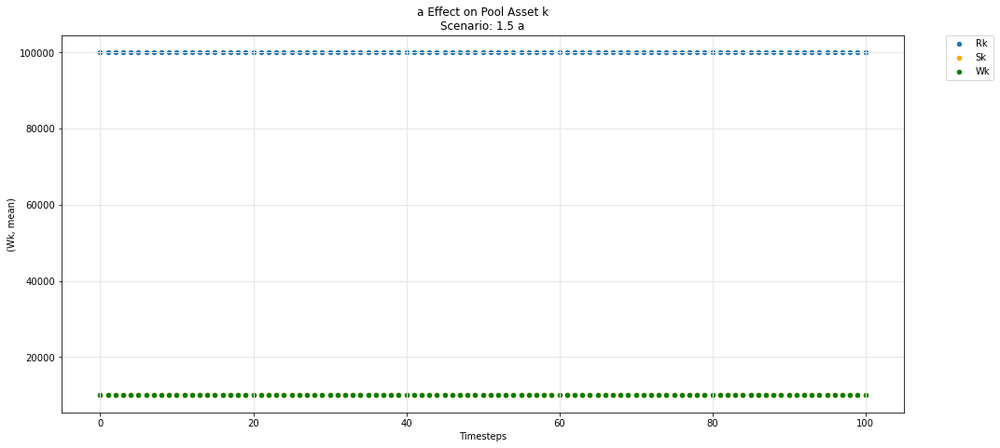

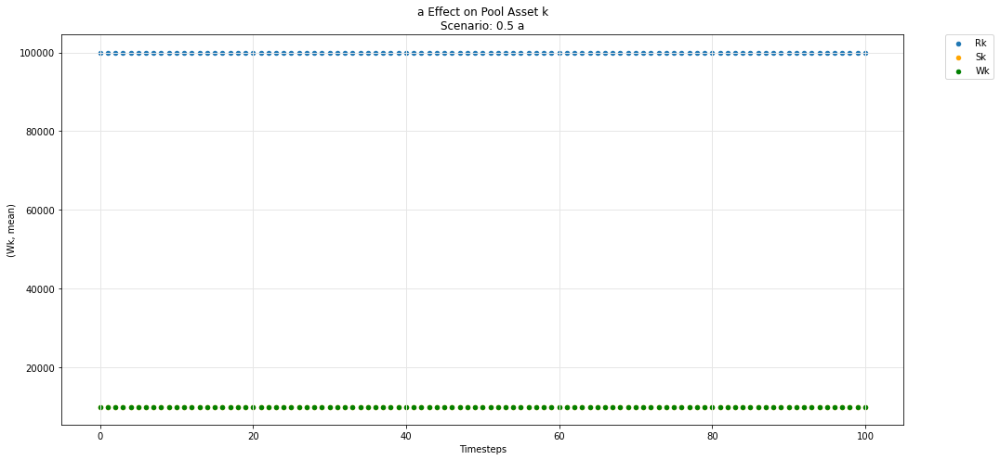

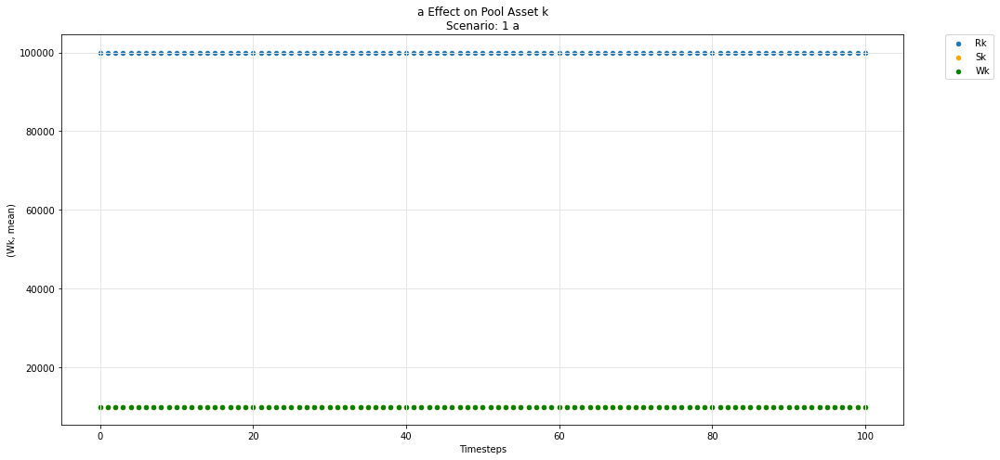

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

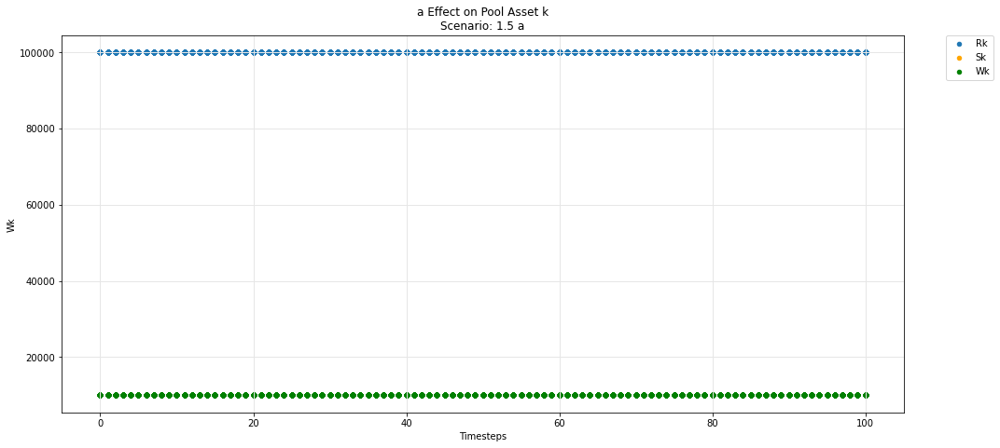

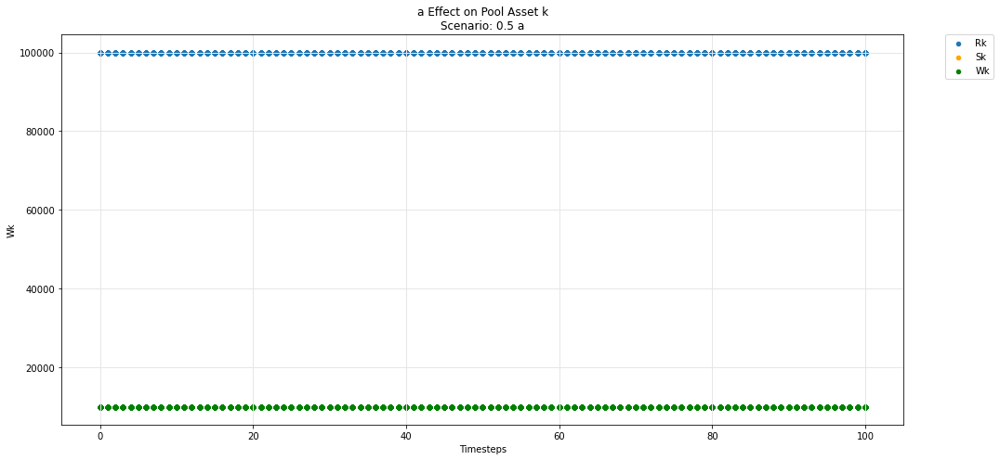

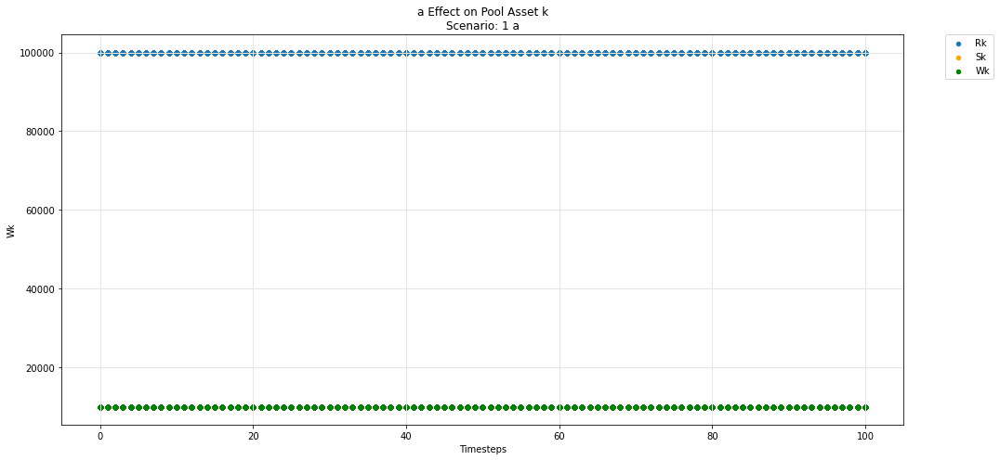

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

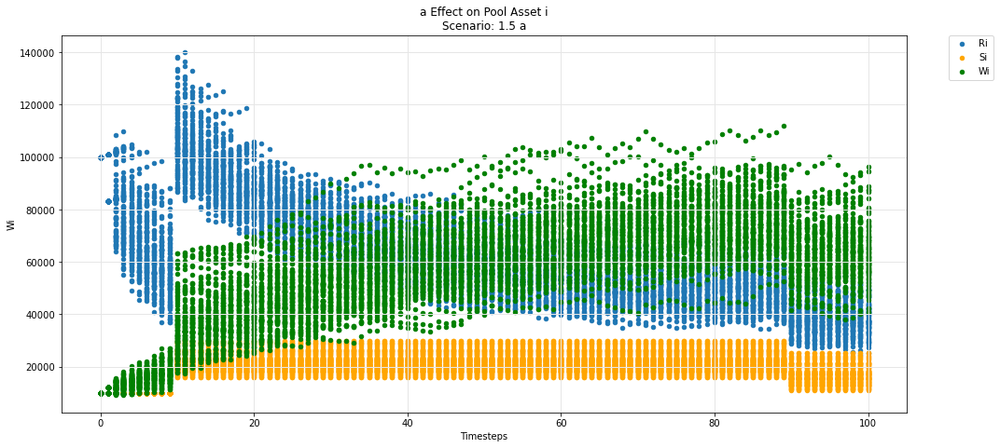

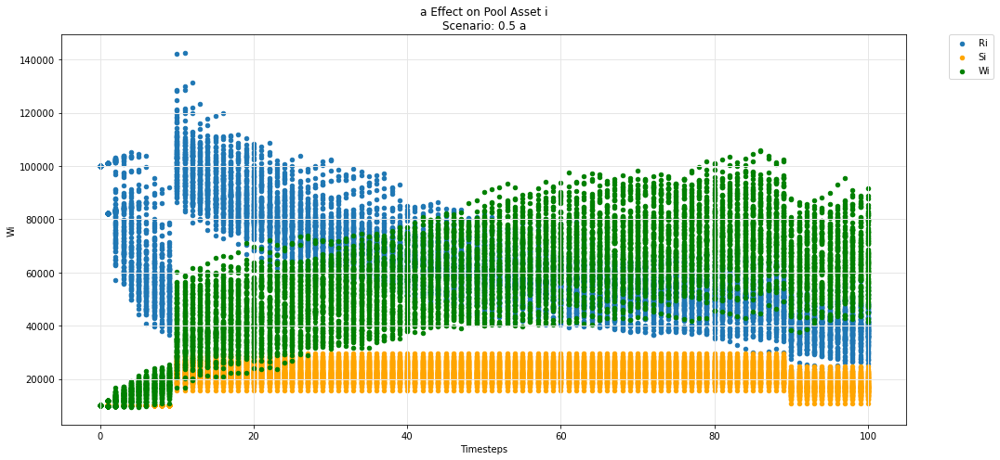

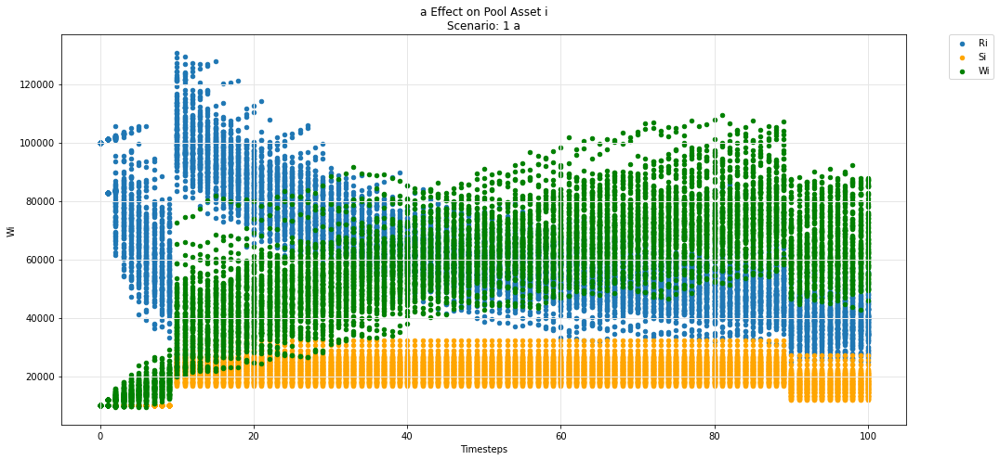

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

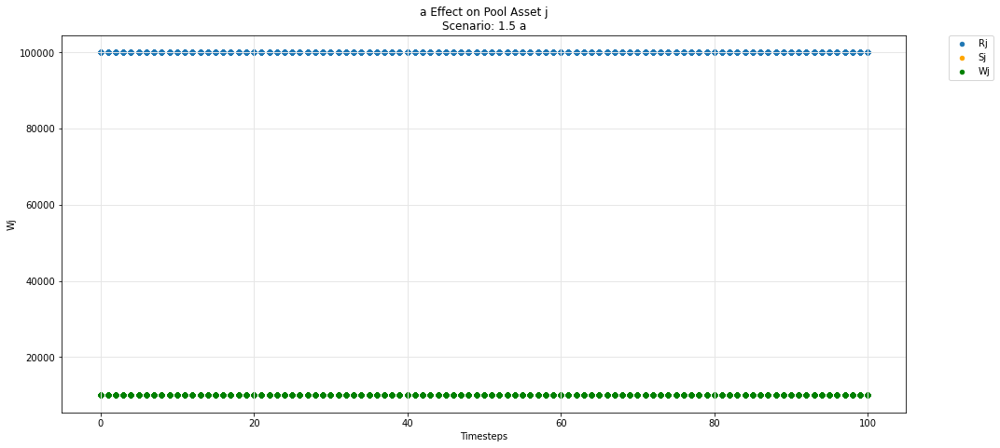

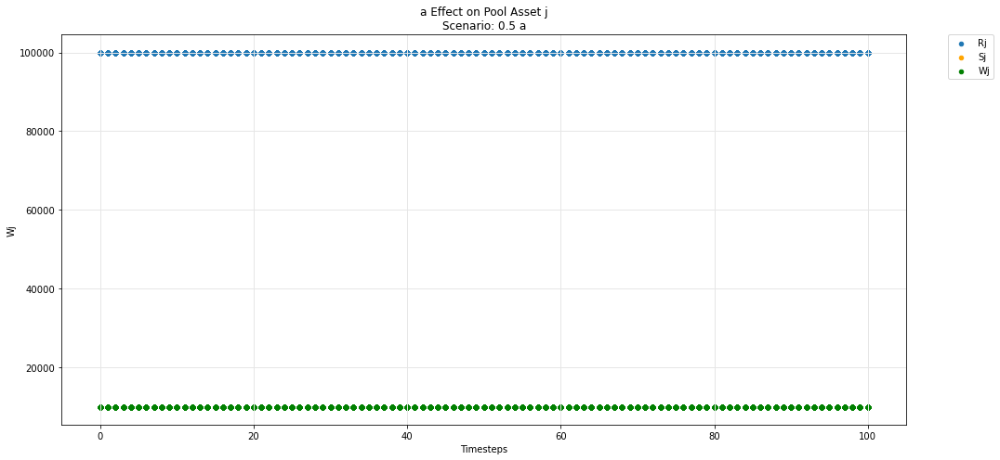

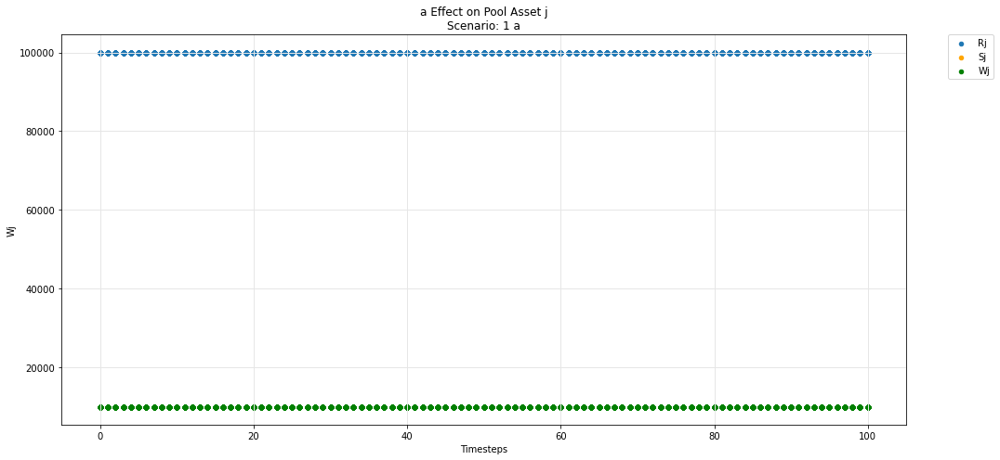

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

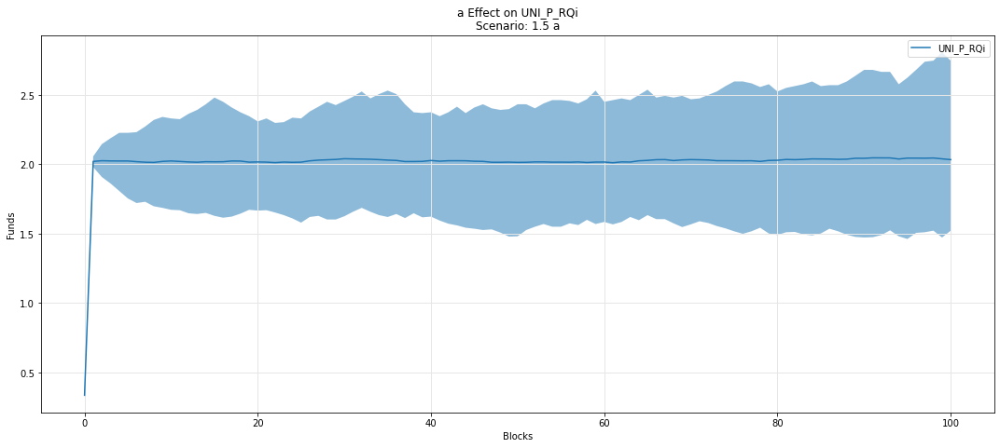

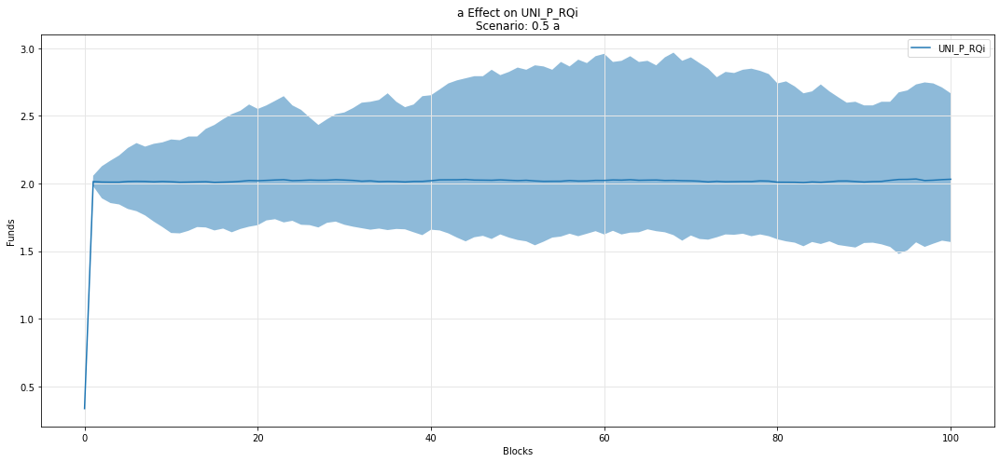

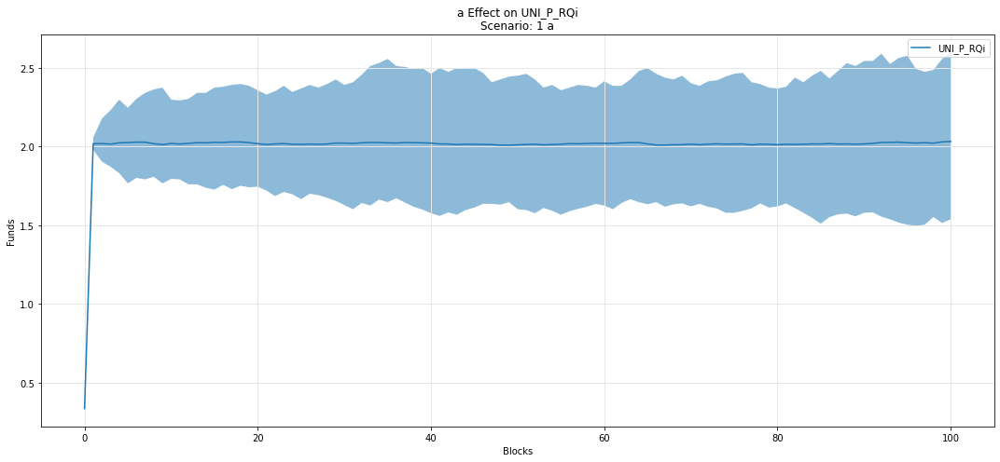

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

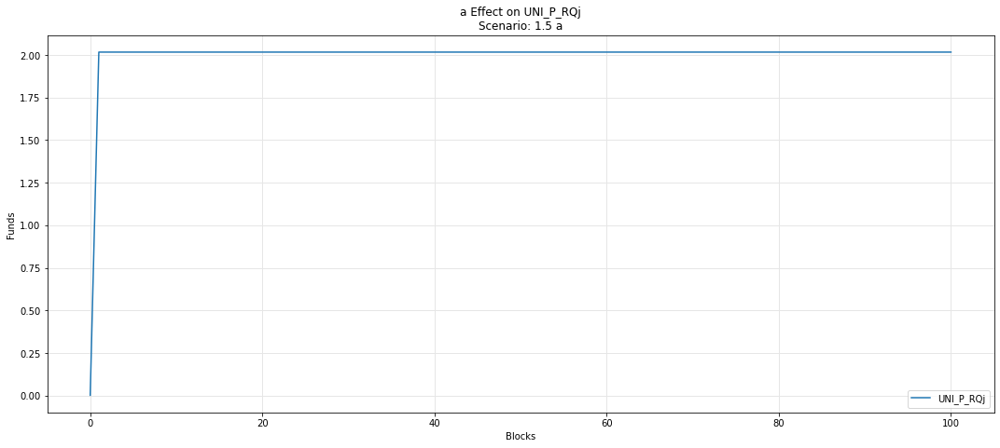

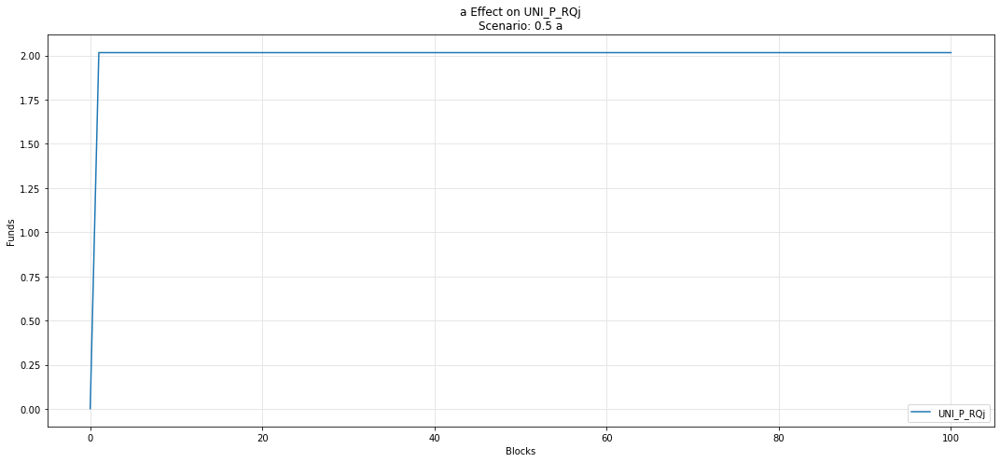

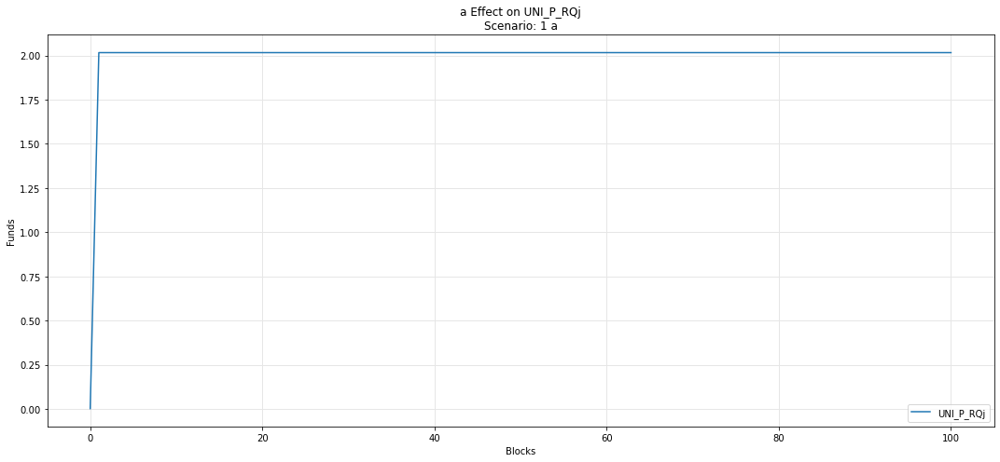

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

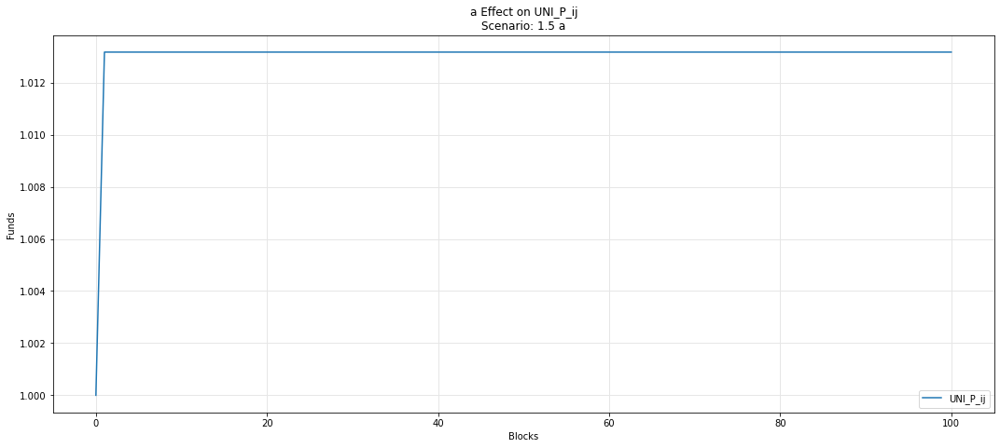

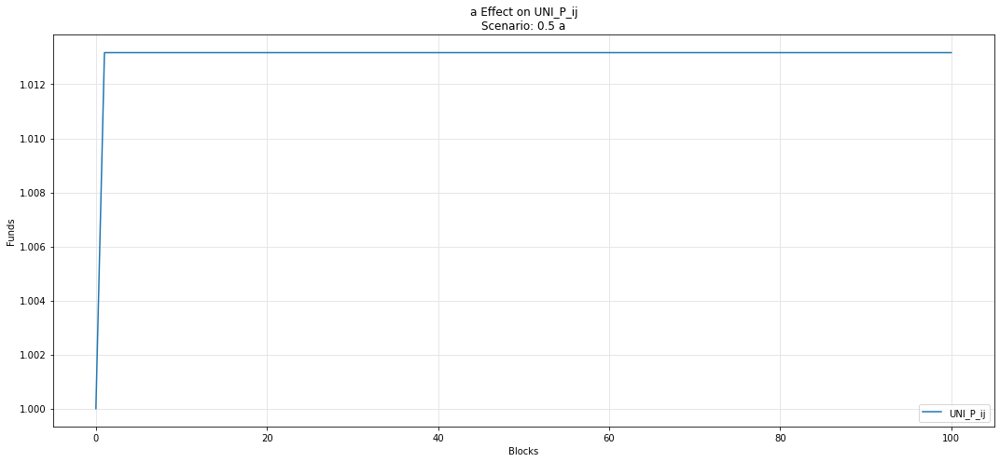

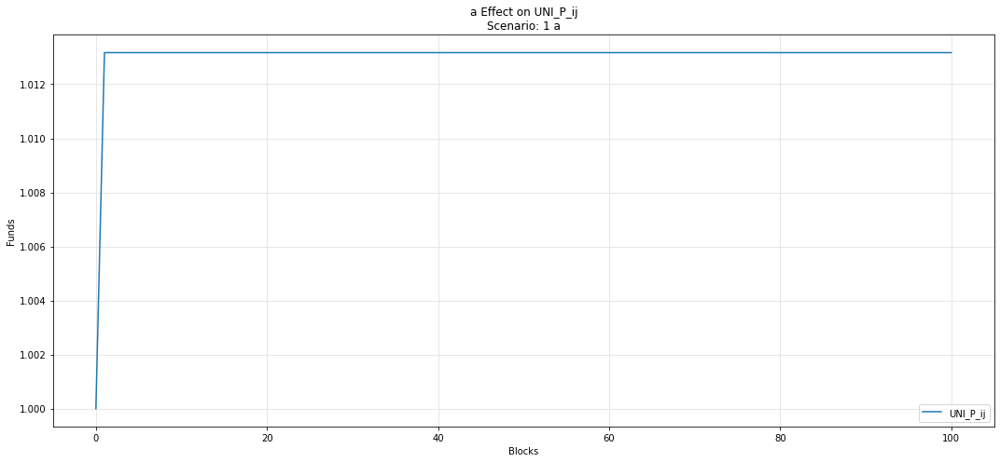

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

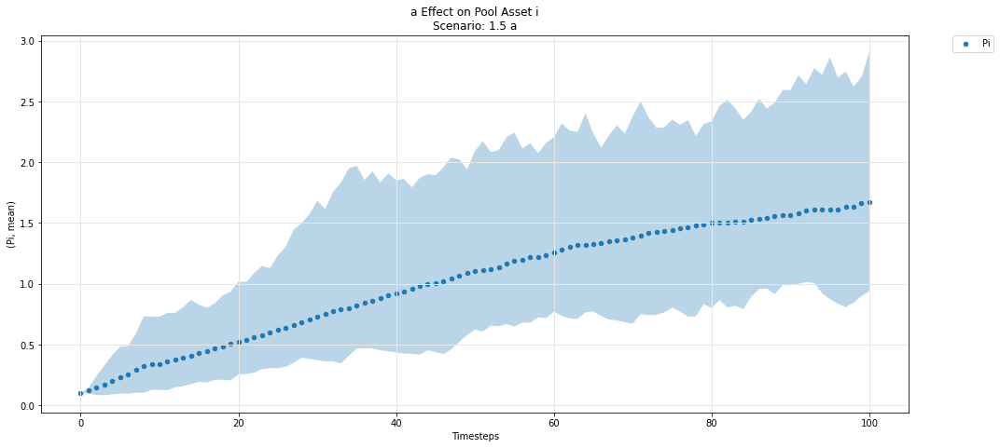

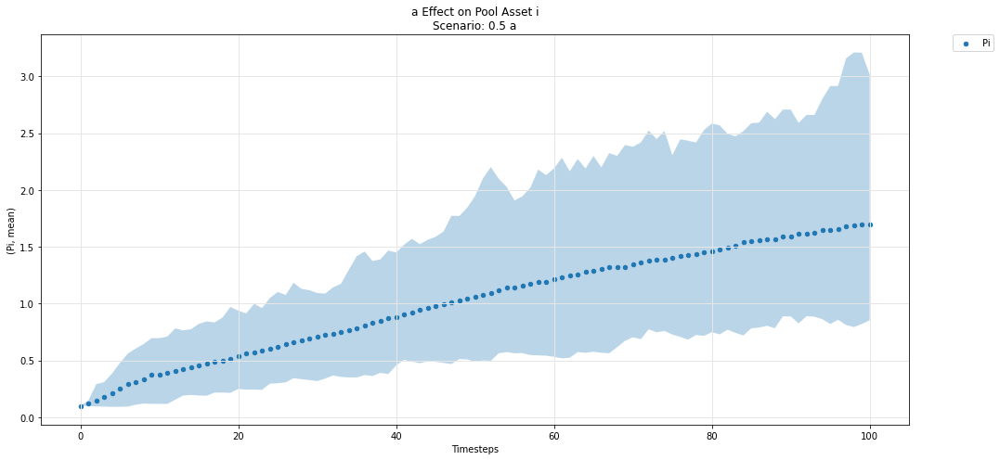

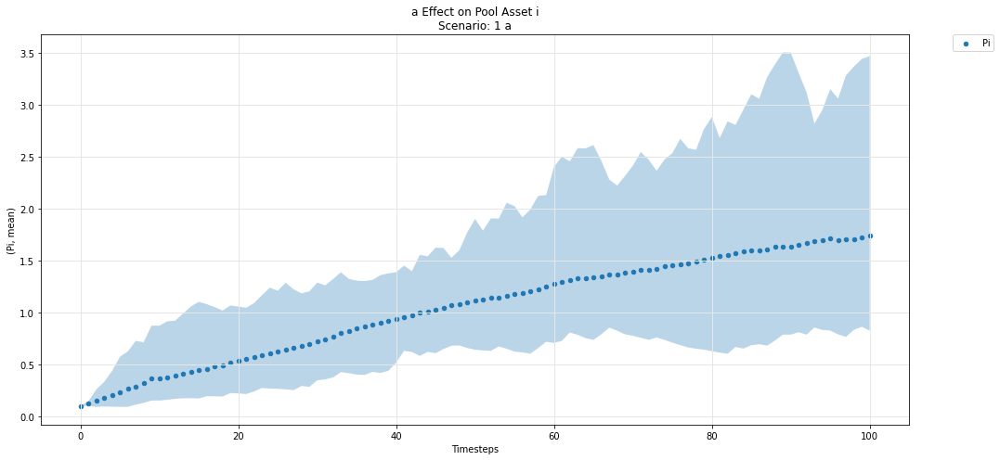

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

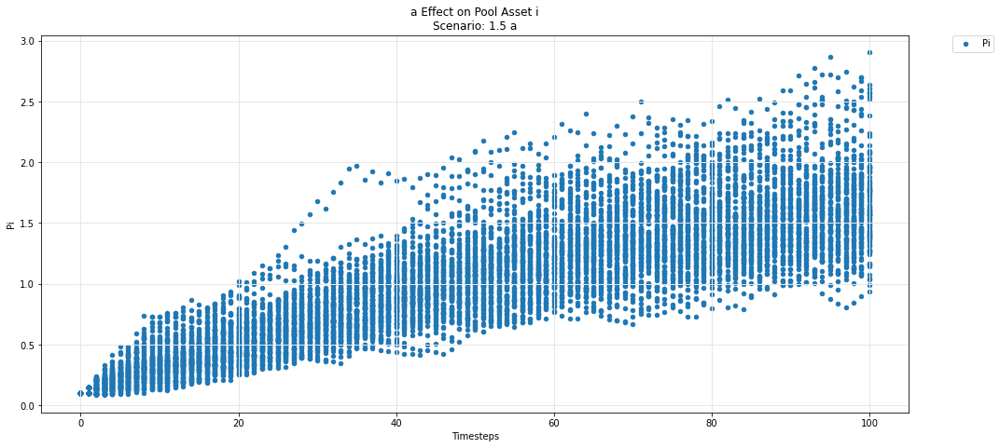

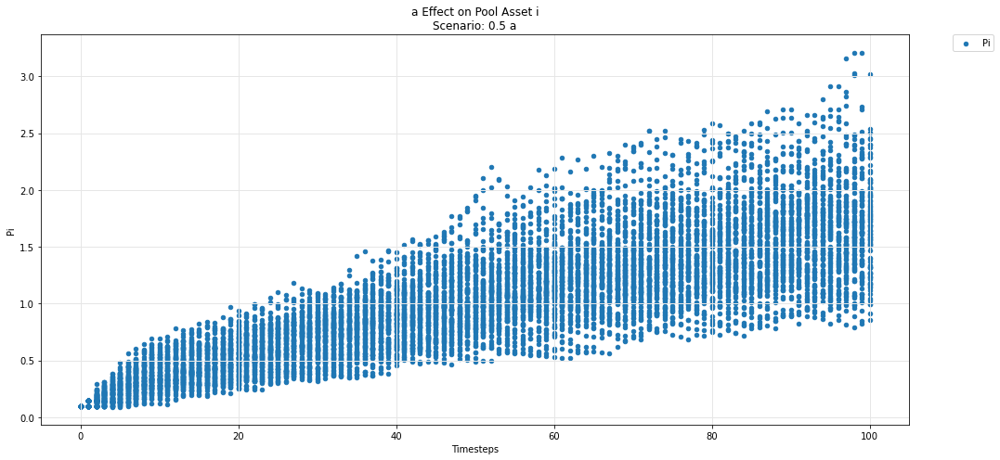

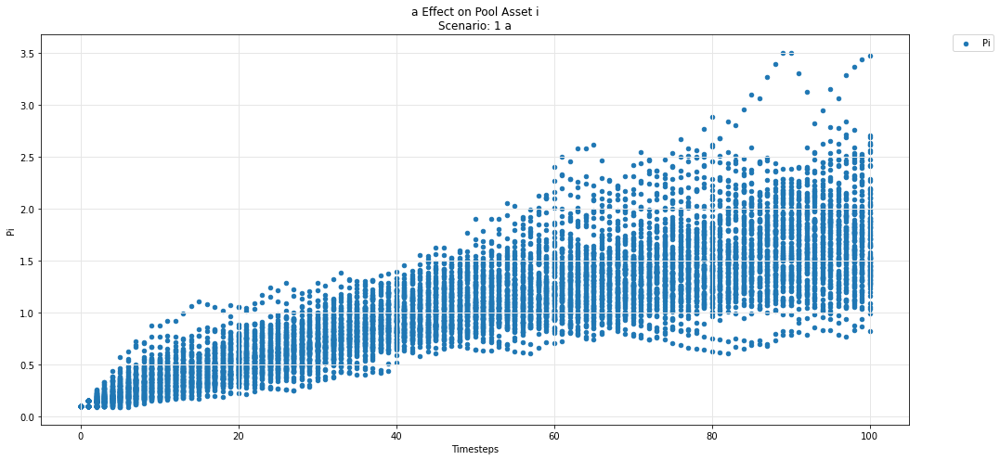

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

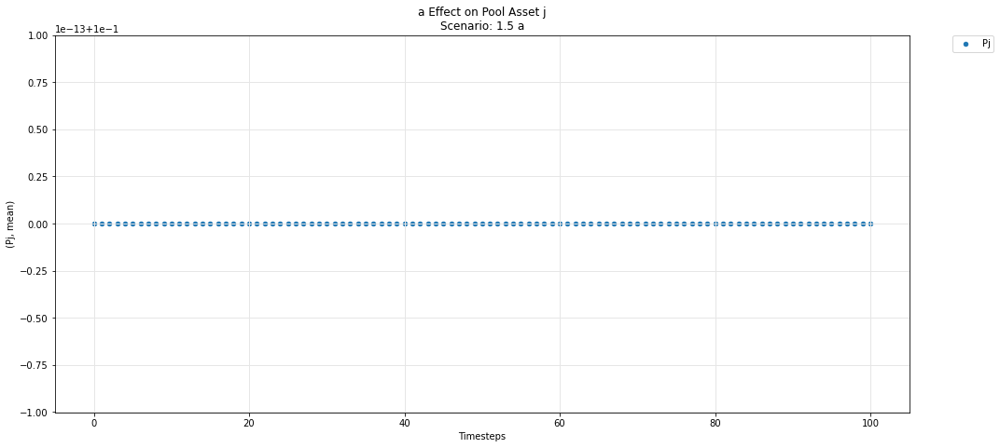

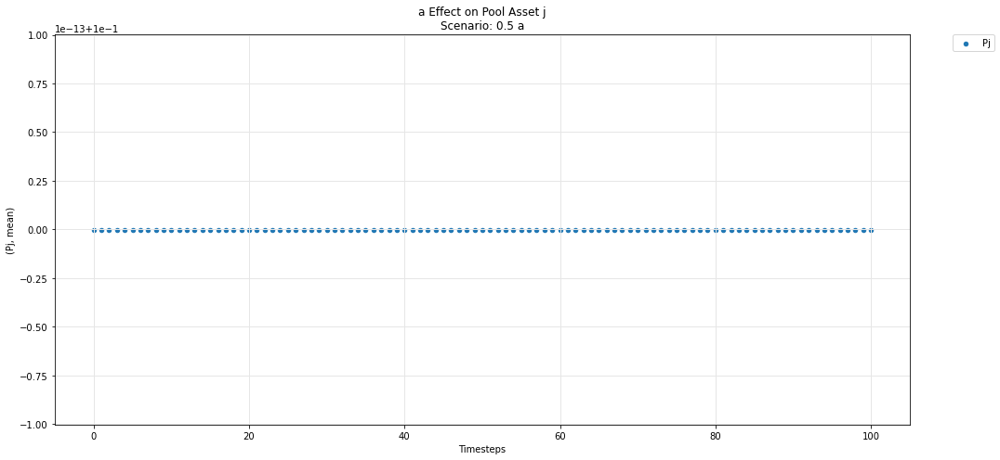

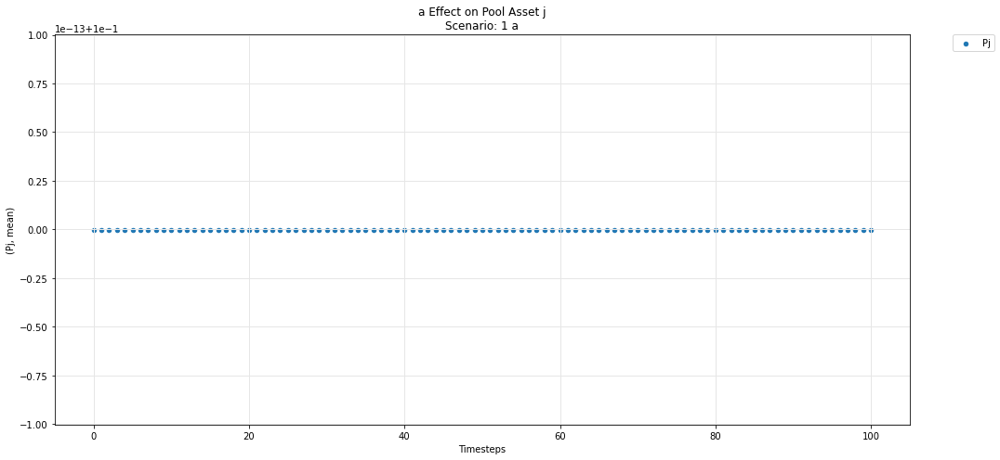

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

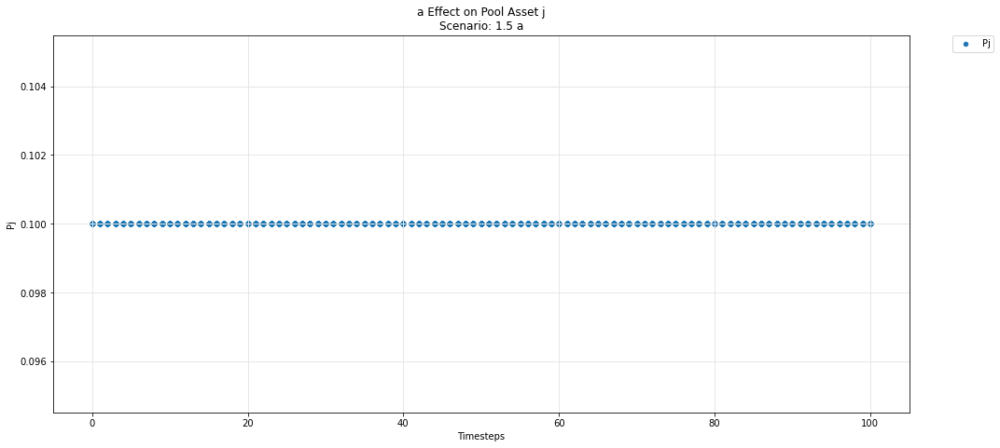

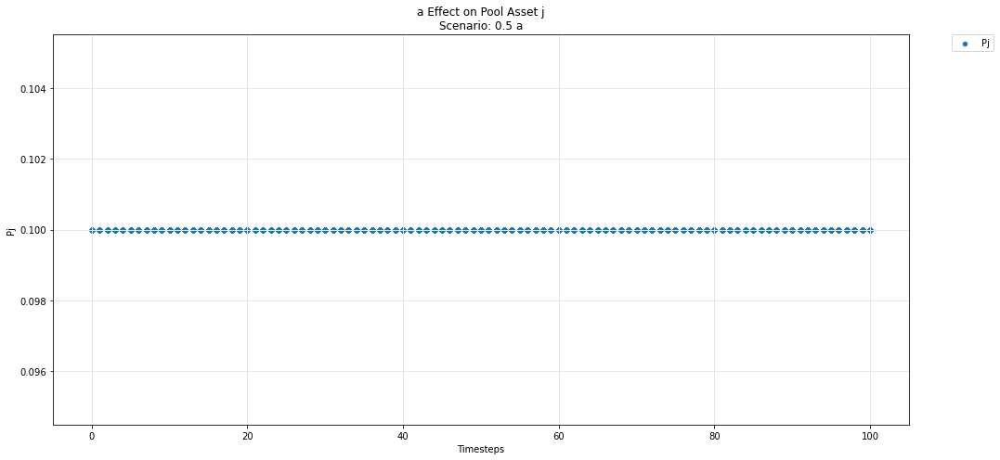

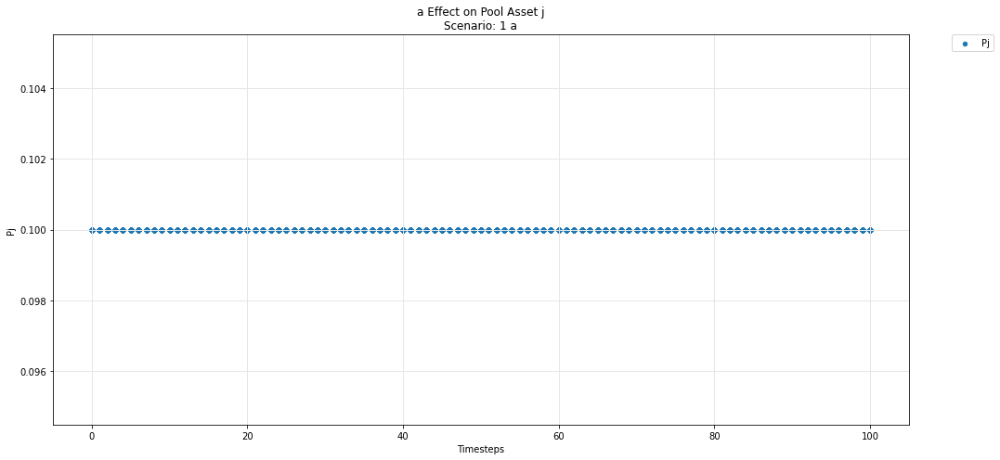

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

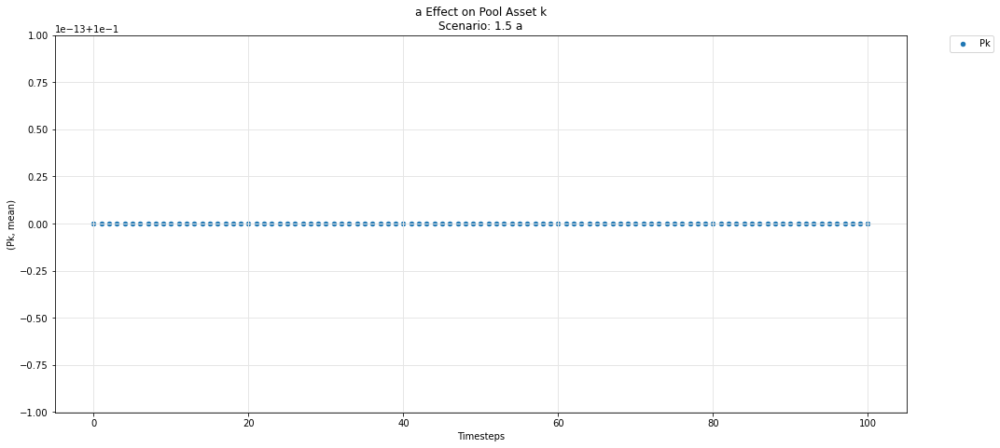

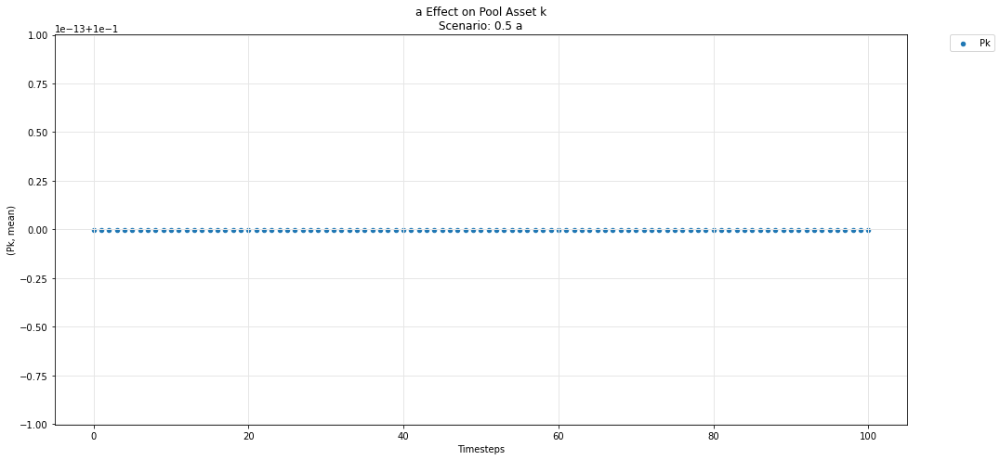

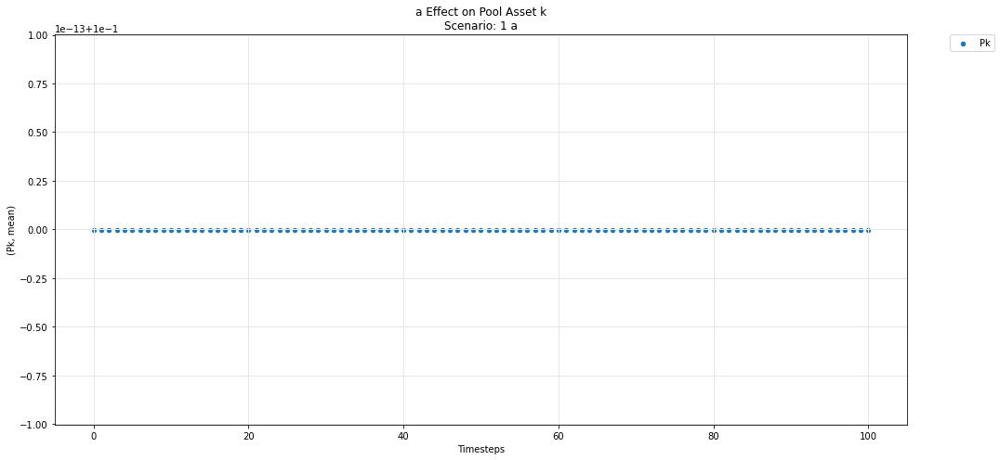

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

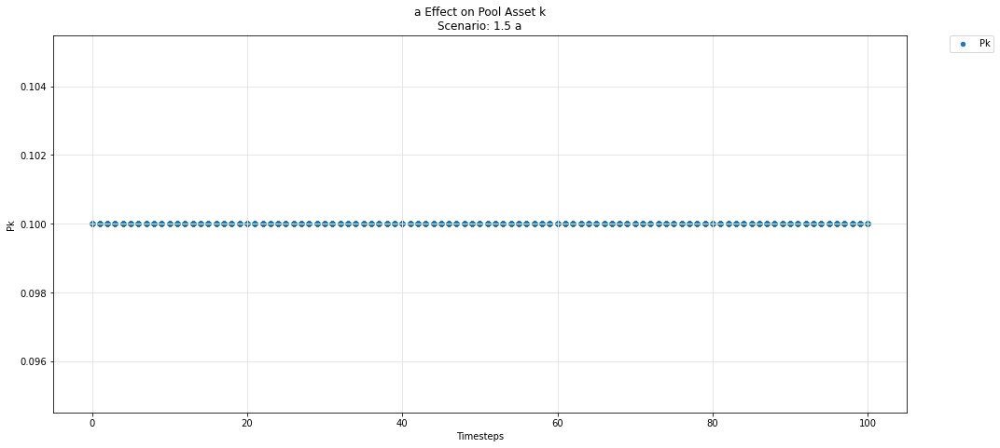

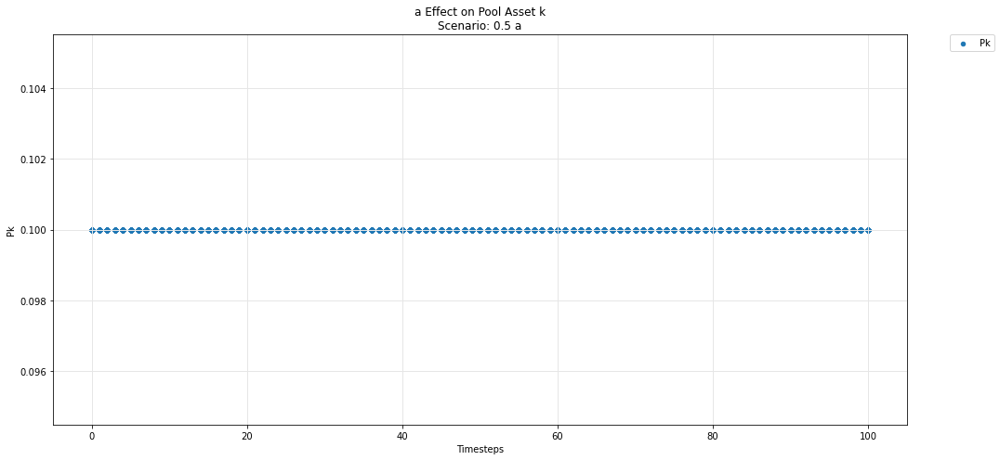

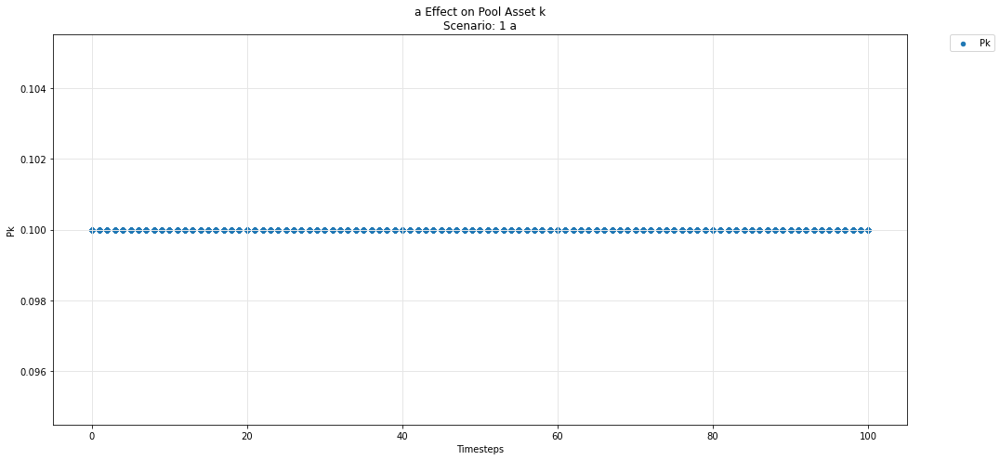

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')